In [56]:
import sys
import os

# Get the root directory
root_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))

# Add the root directory to the Python path
sys.path.append(root_dir)

In [57]:
from tqdm import tqdm
from torch.utils.data import DataLoader, TensorDataset
from torch.optim.lr_scheduler import OneCycleLR
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.datasets import load_diabetes
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from TINTOlib.igtd import IGTD
from kan import *
from tqdm import tqdm
from sklearn.metrics import confusion_matrix


import traceback
import time
import gc
import copy
import traceback
import cv2
import math
import random
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import torch.nn as nn
import torch.optim as optim
import seaborn as sns
import csv

if torch.cuda.is_available():
  device = torch.device("cuda")
else:
  device = torch.device("cpu")

print(device)

cuda


In [58]:
SEED = 381
# SET RANDOM SEED FOR REPRODUCIBILITY
torch.manual_seed(SEED)
random.seed(SEED)
np.random.seed(SEED)

# BEST  ACC = 0.733152

In [59]:
folder="data/FOREX_cadjpy-day-High"
x_col=["Bid_Open", "Bid_High", "Bid_Low", "Bid_Close", "Bid_Volume", "Ask_Open", "Ask_High", "Ask_Low", "Ask_Close","Ask_Volume"]
target_col=["class"]

# Functions

### Load Dataset and Images

In [60]:
def load_and_clean(npy_filename, y_filename, x_col, target_col):
    """
    Load the feature array (npy_filename) and label array (y_filename),
    drop rows in the feature array that contain any NaNs, and apply
    the same mask to the label array.
    """
    # Load numpy arrays
    X = np.load(os.path.join(folder, npy_filename))
    y = np.load(os.path.join(folder, y_filename))
    
    # Ensure the number of rows matches between X and y
    if X.shape[0] != y.shape[0]:
        raise ValueError("The number of rows in {} and {} do not match.".format(npy_filename, y_filename))
    
    # Create a boolean mask for rows that do NOT have any NaN values in X
    valid_rows = ~np.isnan(X).any(axis=1)

    # Filter both arrays using the valid_rows mask
    X_clean = X[valid_rows]
    y_clean = y[valid_rows]
    
    # Convert arrays to DataFrames
    df_X = pd.DataFrame(X_clean)
    df_y = pd.DataFrame(y_clean)
    df_X.columns = x_col
    df_y.columns = target_col
    return df_X, df_y

In [61]:
def load_and_preprocess_data(X_train, y_train, X_test, y_test, X_val, y_val, image_model, problem_type, batch_size=32):
    # Add target column to input for IGTD
    X_train_full = X_train.copy()
    X_train_full["target"] = y_train.values

    X_val_full = X_val.copy()
    X_val_full["target"] = y_val.values

    X_test_full = X_test.copy()
    X_test_full["target"] = y_test.values

    # Generate the images if the folder does not exist
    if not os.path.exists(f'{images_folder}/train'):
        #print(X_train_full)
        image_model.fit_transform(X_train_full, f'{images_folder}/train')
        image_model.saveHyperparameters(f'{images_folder}/model.pkl')
    else:
        print("The images are already generated")

    # Load image paths
    imgs_train = pd.read_csv(os.path.join(f'{images_folder}/train', f'{problem_type}.csv'))
    imgs_train["images"] = images_folder + "/train/" + imgs_train["images"]

    if not os.path.exists(f'{images_folder}/val'):
        image_model.transform(X_val_full, f'{images_folder}/val')
    else:
        print("The images are already generated")

    imgs_val = pd.read_csv(os.path.join(f'{images_folder}/val', f'{problem_type}.csv'))
    imgs_val["images"] = images_folder + "/val/" + imgs_val["images"]

    if not os.path.exists(f'{images_folder}/test'):
        image_model.transform(X_test_full, f'{images_folder}/test')
    else:
        print("The images are already generated")

    imgs_test = pd.read_csv(os.path.join(f'{images_folder}/test', f'{problem_type}.csv'))
    imgs_test["images"] = images_folder + "/test/" + imgs_test["images"]

    # Image data
    X_train_img = np.array([cv2.imread(img) for img in imgs_train["images"]])
    X_val_img = np.array([cv2.imread(img) for img in imgs_val["images"]])
    X_test_img = np.array([cv2.imread(img) for img in imgs_test["images"]])

    # Create a MinMaxScaler object
    scaler = MinMaxScaler()

    # Scale numerical data
    X_train_num = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
    X_val_num = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)
    X_test_num = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

    attributes = len(X_train_num.columns)
    height, width, channels = X_train_img[0].shape
    imgs_shape = (channels, height, width)

    print("Images shape: ", imgs_shape)
    print("Attributes: ", attributes)

    # Convert data to PyTorch tensors
    X_train_num_tensor = torch.as_tensor(X_train_num.values, dtype=torch.float32)
    X_val_num_tensor = torch.as_tensor(X_val_num.values, dtype=torch.float32)
    X_test_num_tensor = torch.as_tensor(X_test_num.values, dtype=torch.float32)
    X_train_img_tensor = torch.as_tensor(X_train_img, dtype=torch.float32).permute(0, 3, 1, 2) / 255.0
    X_val_img_tensor = torch.as_tensor(X_val_img, dtype=torch.float32).permute(0, 3, 1, 2) / 255.0
    X_test_img_tensor = torch.as_tensor(X_test_img, dtype=torch.float32).permute(0, 3, 1, 2) / 255.0
    y_train_tensor = torch.as_tensor(y_train.values, dtype=torch.float32).reshape(-1, 1)
    y_val_tensor = torch.as_tensor(y_val.values, dtype=torch.float32).reshape(-1, 1)
    y_test_tensor = torch.as_tensor(y_test.values, dtype=torch.float32).reshape(-1, 1)

    # Create DataLoaders
    train_dataset = TensorDataset(X_train_num_tensor, X_train_img_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_num_tensor, X_val_img_tensor, y_val_tensor)
    test_dataset = TensorDataset(X_test_num_tensor, X_test_img_tensor, y_test_tensor)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)

    return train_loader, val_loader, test_loader, attributes, imgs_shape

In [62]:
def complete_coordinate_and_xcol(coordinate, x_col):
    """
    Given a coordinate (tuple of row, col arrays) and x_col feature list,
    return completed coordinate and x_col including empty positions.

    Empty positions are filled with labels: 'Ex1', 'Ex2', ...
    """

    row_coords, col_coords = coordinate
    max_row = row_coords.max()
    max_col = col_coords.max()
    max_c = max(max_row, max_col)
    # All possible coordinate slots
    full_coords = set((r, c) for r in range(max_col + 1) for c in range(max_col + 1))
    current_coords = set(zip(row_coords, col_coords))
    missing_coords = sorted(full_coords - current_coords)

    # Create updated coordinate arrays
    new_row_coords = list(row_coords)
    new_col_coords = list(col_coords)
    new_x_col = list(x_col)

    for idx, (r, c) in enumerate(missing_coords):
        new_row_coords.append(r)
        new_col_coords.append(c)
        new_x_col.append(f"Ex{idx+1}")

    completed_coordinate = (np.array(new_row_coords), np.array(new_col_coords))
    return completed_coordinate, new_x_col

In [63]:
def plot_feature_mapping(x_col, coordinate, scale=(4,4)):
    grid = np.full(scale, "", dtype=object)
    rows, cols = coordinate
    for i, (r, c) in enumerate(zip(rows, cols)):
        if i < len(x_col):
            grid[r, c] = x_col[i]
        else:
            grid[r, c] = "?"
    
    plt.figure(figsize=(scale[1] * 2, scale[0] * 2))
    for i in range(scale[0]):
        for j in range(scale[1]):
            plt.text(j, i, grid[i, j], ha='center', va='center', fontsize=10,
                     bbox=dict(facecolor='white', edgecolor='gray'))
    
    plt.xticks(np.arange(scale[1]))
    plt.yticks(np.arange(scale[0]))
    plt.grid(True)
    plt.title("Feature → Pixel Mapping")
    plt.gca().invert_yaxis()  # So row 0 is at the top
    plt.show()

In [64]:
def combine_loader(loader):
    """
    Combines all batches from a DataLoader into three tensors.
    Assumes each batch is a tuple: (mlp_tensor, img_tensor, target_tensor)
    """
    mlp_list, img_list, target_list = [], [], []
    for mlp, img, target in loader:
        mlp_list.append(mlp)
        img_list.append(img)
        target_list.append(target)
    return torch.cat(mlp_list, dim=0), torch.cat(img_list, dim=0), torch.cat(target_list, dim=0)

### Functions for KAN

In [65]:
dtype = torch.get_default_dtype()
min_expected = 0.
max_expected = 1.

In [66]:
def plot_sorted_feature_importance(columns, importances):
    # Move to CPU and numpy if it's a GPU tensor
    if isinstance(importances, torch.Tensor):
        importances = importances.detach().cpu().numpy()

    # Pair columns and importances and sort by importance descending
    sorted_pairs = sorted(zip(columns, importances), key=lambda x: x[1], reverse=True)
    print(sorted_pairs)
    sorted_columns, sorted_importances = zip(*sorted_pairs)
    
    # Create the bar plot
    plt.figure(figsize=(4, 3))
    plt.barh(sorted_columns, sorted_importances, color='royalblue')
    plt.xlabel('Importance')
    plt.title('KAN Feature Importances')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()
    return sorted_pairs

In [67]:
def plot_training_ACC(y_true, y_pred, train_loss, val_loss):
    clipped = torch.clamp(torch.round(y_pred), min=min_expected, max=max_expected)
    avg_rmse = torch.mean((clipped == y_true).type(dtype))
    print(avg_rmse)
    plt.figure(figsize=(5, 4))
    plt.plot(train_loss)
    plt.plot(val_loss)
    plt.legend(['train', 'val'])
    plt.ylabel('Accuracy')
    plt.xlabel('step')
    plt.yscale('log')
    return avg_rmse

In [68]:
def plot_confusion_matrix(y_true_tensor, y_pred_tensor, title="Confusion Matrix", plot=False):
    # Move tensors to CPU and detach if necessary
    clipped = torch.clamp(torch.round(y_pred_tensor), min=min_expected, max=max_expected)

    y_true = y_true_tensor.detach().cpu().numpy().flatten()
    y_pred = clipped.detach().cpu().numpy().flatten()

    # Round predictions if they are float (e.g., from sigmoid or regression)
    if y_pred.dtype.kind in {'f'}:
        y_pred = y_pred.round()

    # Get sorted list of all unique labels
    all_labels = sorted(set(y_true) | set(y_pred))

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=all_labels)
    print(cm)
    if plot:
        # Plot
        plt.figure(figsize=(4, 3))
        sns.heatmap(cm, annot=True, fmt='g', cmap='Blues',
                    xticklabels=all_labels, yticklabels=all_labels)
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.title(title)
        plt.tight_layout()
        plt.show()
    return cm

In [69]:
def train_acc_kan():
    rounded = torch.round(torch.round(model(dataset['train_input'])[:,0]))
    clipped = torch.clamp(rounded, min=min_expected, max=max_expected)
    return torch.mean((clipped == dataset['train_label'][:,0]).type(dtype))

def val_acc_kan():
    rounded = torch.round(torch.round(model(dataset['val_input'])[:,0]))
    clipped = torch.clamp(rounded, min=min_expected, max=max_expected)
    return torch.mean((clipped == dataset['val_label'][:,0]).type(dtype))

In [70]:
def custom_fit(model, dataset, opt="LBFGS", steps=100, log=1, lamb=0., lamb_l1=1., lamb_entropy=2., lamb_coef=0., lamb_coefdiff=0., update_grid=True, 
               grid_update_num=10, loss_fn=None, lr=1., start_grid_update_step=-1, stop_grid_update_step=50, batch=-1,
               metrics=None, save_fig=False, in_vars=None, out_vars=None, beta=3, save_fig_freq=1, img_folder='./video', 
               singularity_avoiding=False, y_th=1000., reg_metric='edge_forward_spline_n', display_metrics=None):
    '''
    training

    Args:
    -----
        dataset : dic
            contains dataset['train_input'], dataset['train_label'], dataset['val_input'], dataset['val_label']
        opt : str
            "LBFGS" or "Adam"
        steps : int
            training steps
        log : int
            logging frequency
        lamb : float
            overall penalty strength
        lamb_l1 : float
            l1 penalty strength
        lamb_entropy : float
            entropy penalty strength
        lamb_coef : float
            coefficient magnitude penalty strength
        lamb_coefdiff : float
            difference of nearby coefficits (smoothness) penalty strength
        update_grid : bool
            If True, update grid regularly before stop_grid_update_step
        grid_update_num : int
            the number of grid updates before stop_grid_update_step
        start_grid_update_step : int
            no grid updates before this training step
        stop_grid_update_step : int
            no grid updates after this training step
        loss_fn : function
            loss function
        lr : float
            learning rate
        batch : int
            batch size, if -1 then full.
        save_fig_freq : int
            save figure every (save_fig_freq) steps
        singularity_avoiding : bool
            indicate whether to avoid singularity for the symbolic part
        y_th : float
            singularity threshold (anything above the threshold is considered singular and is softened in some ways)
        reg_metric : str
            regularization metric. Choose from {'edge_forward_spline_n', 'edge_forward_spline_u', 'edge_forward_sum', 'edge_backward', 'node_backward'}
        metrics : a list of metrics (as functions)
            the metrics to be computed in training
        display_metrics : a list of functions
            the metric to be displayed in tqdm progress bar

    Returns:
    --------
        results : dic
            results['train_loss'], 1D array of training losses (RMSE)
            results['val_loss'], 1D array of val losses (RMSE)
            results['reg'], 1D array of regularization
            other metrics specified in metrics
        best_model:
    '''

    if lamb > 0. and not model.save_act:
        print('setting lamb=0. If you want to set lamb > 0, set model.save_act=True')
        
    old_save_act, old_symbolic_enabled = model.disable_symbolic_in_fit(lamb)

    pbar = tqdm(range(steps), desc='description', ncols=100)

    if loss_fn == None:
        loss_fn = loss_fn_eval = lambda x, y: torch.mean((x - y) ** 2)
    else:
        loss_fn = loss_fn_eval = loss_fn

    grid_update_freq = int(stop_grid_update_step / grid_update_num)

    if opt == "Adam":
        optimizer = torch.optim.Adam(model.get_params(), lr=lr)
    elif opt == "LBFGS":
        optimizer = LBFGS(model.get_params(), lr=lr, history_size=10, 
                          line_search_fn="strong_wolfe", 
                          tolerance_grad=1e-32,
                          tolerance_change=1e-32,
                          tolerance_ys=1e-32)

    results = {}
    results['train_loss'] = []
    results['val_loss'] = []
    results['reg'] = []
    if metrics != None:
        for i in range(len(metrics)):
            results[metrics[i].__name__] = []

    if batch == -1 or batch > dataset['train_input'].shape[0]:
        batch_size = dataset['train_input'].shape[0]
        batch_size_val = dataset['val_input'].shape[0]
    else:
        batch_size = batch
        batch_size_val = batch

    global train_loss, reg_

    def closure():
        global train_loss, reg_
        optimizer.zero_grad()
        pred = model.forward(dataset['train_input'][train_id], singularity_avoiding=singularity_avoiding, y_th=y_th)
        train_loss = loss_fn(pred, dataset['train_label'][train_id])
        if model.save_act:
            if reg_metric == 'edge_backward':
                model.attribute()
            if reg_metric == 'node_backward':
                model.node_attribute()
            reg_ = model.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
        else:
            reg_ = torch.tensor(0.)
        objective = train_loss + lamb * reg_
        objective.backward()
        return objective

    if save_fig:
        if not os.path.exists(img_folder):
            os.makedirs(img_folder)
    
    best_model_state = None
    best_epoch = -1
    best_metric = 0
    val_metric = 0
    for epoch in pbar:
        
        if epoch == steps-1 and old_save_act:
            model.save_act = True
            
        if save_fig and epoch % save_fig_freq == 0:
            save_act = model.save_act
            model.save_act = True
        
        train_id = np.random.choice(dataset['train_input'].shape[0], batch_size, replace=False)
        val_id = np.random.choice(dataset['val_input'].shape[0], batch_size_val, replace=False)

        if epoch % grid_update_freq == 0 and epoch < stop_grid_update_step and update_grid and epoch >= start_grid_update_step:
            model.update_grid(dataset['train_input'][train_id])

        if opt == "LBFGS":
            optimizer.step(closure)

        if opt == "Adam":
            pred = model.forward(dataset['train_input'][train_id], singularity_avoiding=singularity_avoiding, y_th=y_th)
            train_loss = loss_fn(pred, dataset['train_label'][train_id])
            if model.save_act:
                if reg_metric == 'edge_backward':
                    model.attribute()
                if reg_metric == 'node_backward':
                    model.node_attribute()
                reg_ = model.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_ = torch.tensor(0.)
            loss = train_loss + lamb * reg_
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        val_loss = loss_fn_eval(model.forward(dataset['val_input'][val_id]), dataset['val_label'][val_id])
        
        if metrics != None:
            for i in range(len(metrics)):
                results[metrics[i].__name__].append(metrics[i]().item())
        
        results['train_loss'].append(torch.sqrt(train_loss).cpu().detach().numpy())
        results['val_loss'].append(torch.sqrt(val_loss).cpu().detach().numpy())
        results['reg'].append(reg_.cpu().detach().numpy())

        if epoch % log == 0:
            if display_metrics == None:
                pbar.set_description("| train_loss: %.2e | val_loss: %.2e | reg: %.2e | " % (torch.sqrt(train_loss).cpu().detach().numpy(), torch.sqrt(val_loss).cpu().detach().numpy(), reg_.cpu().detach().numpy()))
                val_metric = val_loss
            else:
                string = ''
                data = ()
                for metric in display_metrics:
                    val_metric = results[metric][-1]
                    string += f' {metric}: %.2e |'
                    try:
                        results[metric]
                    except:
                        raise Exception(f'{metric} not recognized')
                    data += (results[metric][-1],)
                pbar.set_description(string % data)

        if val_metric > best_metric:
            best_epoch = epoch
            best_metric = val_metric
            best_model_state = copy.deepcopy(model.state_dict())

        if save_fig and epoch % save_fig_freq == 0:
            model.plot(folder=img_folder, in_vars=in_vars, out_vars=out_vars, title="Step {}".format(_), beta=beta)
            plt.savefig(img_folder + '/' + str(_) + '.jpg', bbox_inches='tight', dpi=200)
            plt.close()
            model.save_act = save_act

    model.log_history('fit')
    # revert back to original state
    model.symbolic_enabled = old_symbolic_enabled
    print(f"✅ Best validation Accuracy: {best_metric:.4e} at {best_epoch} epoch")
    return best_model_state, results, best_epoch

### Grad CAM Functions

In [71]:
def grad_cam_side_by_side(model, model_state, num_input, img_input, x_col, coordinate,
                          zoom=1, target_index=None, save_path=None, show=True):
    model.load_state_dict(model_state)
    model.eval()
    model.zero_grad()

    if num_input.dim() == 1:
        num_input = num_input.unsqueeze(0)
    if img_input.dim() == 3:
        img_input = img_input.unsqueeze(0)

    num_input = num_input.to(model.device)
    img_input = img_input.to(model.device)

    # Store activations and gradients
    activations = {}
    gradients = {}

    def forward_hook(module, input, output):
        activations["value"] = output.detach()

    def backward_hook(module, grad_input, grad_output):
        gradients["value"] = grad_output[0].detach()

    conv_layer = model.cnn_branch[0]
    h_fwd = conv_layer.register_forward_hook(forward_hook)
    h_bwd = conv_layer.register_full_backward_hook(backward_hook)

    output = model(num_input, img_input)
    target = output if target_index is None else output[:, target_index]
    target.backward()

    act = activations["value"].squeeze(0)
    grad = gradients["value"].squeeze(0)
    weights = grad.mean(dim=(1, 2))
    cam = torch.zeros_like(act[0])
    for i, w in enumerate(weights):
        cam += w * act[i]

    cam = torch.relu(cam)
    if cam.max() > 0:
        cam -= cam.min()
        cam /= cam.max()
    else:
        cam[:] = 0.0


    cam_resized = F.interpolate(cam.unsqueeze(0).unsqueeze(0), size=img_input.shape[-2:], mode='bilinear', align_corners=False)
    #print(cam_resized)
    heatmap = cam_resized.squeeze().cpu()

    img_disp = img_input.squeeze().detach().cpu()
    if img_disp.shape[0] == 1:
        img_disp = img_disp[0]
        cmap = 'gray'
    else:
        img_disp = img_disp.permute(1, 2, 0)
        cmap = None

    h, w = img_disp.shape[:2]

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    axs[0].imshow(img_disp, cmap=cmap)
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    im = axs[1].imshow(img_disp, cmap=cmap)
    heatmap_img = axs[1].imshow(heatmap, cmap='jet', alpha=0.5)
    axs[1].set_title("Grad-CAM")
    axs[1].axis('off')

    # Add colorbar (legend)
    cbar = fig.colorbar(heatmap_img, ax=axs[1], fraction=0.046, pad=0.04)
    cbar.set_label("Grad-CAM Intensity", fontsize=10)

    # Overlay abbreviated features
    for i, col in enumerate(x_col):
        abbrev = col.split("-")[0][:8]
        if i < len(coordinate[0]):
            r, c = coordinate[0][i], coordinate[1][i]
            ry = r * zoom + zoom // 2
            cx = c * zoom + zoom // 2
            if ry < h and cx < w:
                axs[1].text(cx, ry, abbrev,
                            color='white', fontsize=9, ha='center', va='center',
                            bbox=dict(facecolor='black', edgecolor='none', pad=1.0, alpha=0.4))
                axs[0].text(cx, ry, abbrev,
                            color='white', fontsize=9, ha='center', va='center',
                            bbox=dict(facecolor='black', edgecolor='none', pad=1.0, alpha=0.4))

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)

    if show:
        plt.show()
    else:
        plt.close()

    h_fwd.remove()
    h_bwd.remove()

    return heatmap

In [72]:
def heatmap_to_feature_relevance(heatmap, coordinate, x_col, zoom=1):
    """
    Map heatmap pixel intensities to their corresponding features using coordinate and zoom.
    Returns a dictionary of {feature_name: relevance_score}.
    """
    feature_scores = {}

    for i, col in enumerate(x_col):
        if i < len(coordinate[0]):
            r, c = coordinate[0][i], coordinate[1][i]
            ry = r * zoom + zoom // 2
            cx = c * zoom + zoom // 2
            if ry < heatmap.shape[0] and cx < heatmap.shape[1]:
                feature_scores[col] = heatmap[ry, cx].item()

    return feature_scores

def plot_feature_relevance_bar(feature_scores):
    """
    Plots a horizontal bar chart of feature relevance from Grad-CAM heatmap.
    """
    sorted_scores = sorted(feature_scores.items(), key=lambda item: item[1], reverse=True)
    print(sorted_scores)
    features, scores = zip(*sorted_scores)

    plt.figure(figsize=(6, 3))
    plt.barh(features, scores, color='royalblue')
    plt.xlabel("Grad-CAM Relevance")
    plt.title("Feature Relevance for Test")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()
    return sorted_scores

In [73]:
def compute_avg_feature_relevance_from_val(model, model_state, val_inputs, val_imgs, coordinate, x_col, zoom=1):
    """
    Computes average Grad-CAM feature relevance over all validation instances with a tqdm progress bar.

    Args:
        model: Trained model
        model_state: Trained weights to be loaded
        val_inputs: List or tensor of numerical inputs
        val_imgs: List or tensor of image inputs
        coordinate: IGTD-style coordinate tuple (row array, col array)
        x_col: List of feature names (including extras)
        zoom: Zoom level used when generating the images

    Returns:
        Dictionary of average feature relevance
    """
    accumulated_scores = {feature: [] for feature in x_col}

    for num_input, img_input in tqdm(zip(val_inputs, val_imgs), total=len(val_inputs), desc="Computing Grad-CAM"):
        heatmap = grad_cam_side_by_side(
            model=model,
            model_state=model_state,
            num_input=num_input,
            img_input=img_input,
            coordinate=coordinate,
            x_col=x_col,
            zoom=zoom,
            show=False
        )
        scores = heatmap_to_feature_relevance(heatmap, coordinate, x_col, zoom)
        for feature, value in scores.items():
            accumulated_scores[feature].append(value)

    # Compute average
    avg_scores = {feature: float(np.mean(values)) if values else 0.0
                  for feature, values in accumulated_scores.items()}

    return avg_scores


### CNN Functions

In [74]:
def fit_cnn_only_model(model, dataset, steps=100, lr=1.0, loss_fn=None, batch=-1, opt="LBFGS"):
    """
    Trains a CNN-only model using LBFGS.

    Args:
        model: CNN-only PyTorch model.
        dataset: Dictionary with keys: 'train_img', 'train_label', 'val_img', 'val_label'.
        steps: Number of training iterations.
        lr: Learning rate.
        loss_fn: Loss function. Defaults to MSE.

    Returns:
        results: Dict with lists of train/val losses.
        best_model_state: Best weights based on val loss.
    """
    device = model.device
    if loss_fn is None:
        loss_fn = nn.MSELoss()

    # Optimizer selection
    if opt == "LBFGS":
        optimizer = LBFGS(model.parameters(), lr=lr, history_size=10, 
                          line_search_fn="strong_wolfe", 
                          tolerance_grad=1e-32, 
                          tolerance_change=1e-32, 
                          tolerance_ys=1e-32)
    elif opt == "AdamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr)
    else:
        raise ValueError(f"Unsupported optimizer '{opt}'")

    n_train = dataset["train_img"].shape[0]
    n_val = dataset["val_img"].shape[0]
    batch_size = n_train if batch == -1 or batch > n_train else batch

    results = {'train_loss': [], 'val_loss': []}
    best_model_state = None
    best_loss = float("inf")
    best_epoch = -1

    pbar = tqdm(range(steps), desc="Training CNN Only ({opt})", ncols=100)

    for step in pbar:
        train_idx = np.random.choice(n_train, batch_size, replace=False)
        #train_idx = torch.randperm(n_train)[:min(32, n_train)]  # small batch
        x_train = dataset["train_img"][train_idx].to(device)
        y_train = dataset["train_label"][train_idx].to(device)
        if opt == "LBFGS":
            def closure():
                optimizer.zero_grad()
                output = model(0, x_train)
                loss = loss_fn(output, y_train)
                loss.backward()
                return loss
            optimizer.step(closure)
            train_loss = closure().item()

        else:  # AdamW
            optimizer.zero_grad()
            output = model(0, x_train)
            loss = loss_fn(output, y_train)
            loss.backward()
            optimizer.step()
            train_loss = loss.item()

        with torch.no_grad():
            val_output = model(0, dataset["val_img"].to(device))
            val_loss = loss_fn(val_output, dataset["val_label"].to(device)).item()

        results["train_loss"].append(train_loss)
        results["val_loss"].append(val_loss)

        if val_loss < best_loss:
            best_loss = val_loss
            best_epoch = step
            best_model_state = copy.deepcopy(model.state_dict())

        pbar.set_description(f"| Train: {train_loss:.4e} | Val: {val_loss:.4e} |")

    print(f"✅ Best validation loss: {best_loss:.4e} at {best_epoch} epoch")
    return best_model_state, results, best_epoch

In [75]:
def build_custom_cnn_model(cnn_blocks, dense_layers, imgs_shape, device='cuda'):
    class CustomCNNModel(nn.Module):
        def __init__(self):
            super(CustomCNNModel, self).__init__()
            self.device = device

            cnn_layers = []
            in_channels = imgs_shape[0]
            out_channels = 16
            cnn_blocks_list = [10, 7, 5]
            size_layer_norm = cnn_blocks_list[cnn_blocks-1]
            
            f_layer_size = 10 - cnn_blocks*2
            for i in range(cnn_blocks):
                cnn_layers.append(nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=2))
                
                if i < cnn_blocks - 1:
                    cnn_layers.append(nn.BatchNorm2d(out_channels))
                    cnn_layers.append(nn.ReLU())
                    cnn_layers.append(nn.MaxPool2d(2))
                else:
                    # Last block: LayerNorm + Sigmoid + Flatten
                    cnn_layers.append(nn.LayerNorm([out_channels, size_layer_norm, size_layer_norm]))
                    cnn_layers.append(nn.Sigmoid())
                    cnn_layers.append(nn.Flatten())
                in_channels = out_channels
                out_channels *= 2

            self.cnn_branch = nn.Sequential(*cnn_layers).to(device)
            self.flat_size = self._get_flat_size(imgs_shape)

            # Dense (FC) layers
            fc_layers = []
            input_dim = self.flat_size
            for i in range(dense_layers - 1):
                fc_layers.append(nn.Linear(int(input_dim), int(input_dim // 2)))
                fc_layers.append(nn.ReLU())
                input_dim = input_dim // 2
            fc_layers.append(nn.Linear(int(input_dim), 1))

            self.fc = nn.Sequential(*fc_layers).to(device)

        def _get_flat_size(self, imgs_shape):
            dummy_input = torch.zeros(1, *imgs_shape, device=self.device)
            x = self.cnn_branch(dummy_input)
            return x.shape[1]

        def forward(self, num_input, img_input):
            img_input = img_input.to(self.device)
            features = self.cnn_branch(img_input)
            output = self.fc(features)
            return output

    return CustomCNNModel()

### Write metrics

In [76]:
def create_csv_with_header(filename, columns_opt):
    header=['kan_neurons', 'kan_grid', 'lamb', columns_opt, 'ACC','Conf_Mtx','Best_Epoch','KAN_Relevance','CNN_Relevance','KAN M.R.F.','CNN M.R.F.']
    """Creates a CSV file with a given header."""
    with open(filename, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(header)

In [77]:
def format_top_3(pairs):
    return '\n'.join(f"{k}: {v:.2f}" for k, v in pairs[:3])

In [78]:
def append_row_to_csv(filename, kan_neurons, kan_grid, lamb, opt_col_val, acc, cm, best_epoch, k_rel, cnn_rel, kan_mrf, cnn_mrf):
    row = [kan_neurons, kan_grid, lamb, opt_col_val, acc, cm, best_epoch, k_rel, cnn_rel, format_top_3(kan_mrf), format_top_3(cnn_mrf)]
    ['Configuration', opt_col_val,'ACC','Conf_Mtx','Best_Epoch','KAN_Relevance','CNN_Relevance','KAN M.R.F.','CNN M.R.F.']
    """Appends a single row to an existing CSV file."""
    if not os.path.isfile(filename):
        raise FileNotFoundError(f"{filename} does not exist. Please create the file first with a header.")
    with open(filename, mode='a', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(row)

### Hybrid Functions

In [79]:
def print_mkan_vs_cnn_relevance(feature_scores, mkan_len):
    if isinstance(feature_scores, torch.Tensor):
        feature_scores = feature_scores.detach().cpu().numpy()

    mkan_relevance = feature_scores[:mkan_len].sum()
    cnn_relevance = feature_scores[mkan_len:].sum()
    m_kan_relevance_perct = float(mkan_relevance/(mkan_relevance+cnn_relevance))
    cnn_relevance_perct = float(cnn_relevance/(mkan_relevance+cnn_relevance))
    print(f"M_KAN Relevance: {m_kan_relevance_perct}")
    print(f"CNN Relevance: {cnn_relevance_perct}")
    return m_kan_relevance_perct, cnn_relevance_perct

In [80]:
def plot_mkan_vs_cnn_relevance(feature_scores, mkan_len=6, title="Feature Relevance Split"):
    """
    Plots a pie chart comparing the total feature relevance from m_kan output vs CNN output.

    Args:
        feature_scores (torch.Tensor or list): 1D tensor of relevance values from final_kan.
        mkan_len (int): Number of dimensions from m_kan (default: 6).
        title (str): Title for the pie chart.
    """
    if isinstance(feature_scores, torch.Tensor):
        feature_scores = feature_scores.detach().cpu().numpy()

    mkan_relevance = feature_scores[:mkan_len].sum()
    cnn_relevance = feature_scores[mkan_len:].sum()

    sizes = [mkan_relevance, cnn_relevance]
    labels = ['m_kan Output', 'CNN Output']
    explode = (0.05, 0)  # Slightly explode m_kan slice for emphasis

    plt.figure(figsize=(3, 3))
    plt.pie(sizes, labels=labels, explode=explode, autopct='%1.1f%%',
            shadow=True, startangle=140, colors=["#66c2a5", "#fc8d62"])
    plt.title(title)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

In [81]:
def fit_hybrid_dataloaders(model, 
                           dataset,
                           opt="AdamW", 
                           steps=100, 
                           log=1, 
                           lamb=0., 
                           lamb_l1=1., 
                           lamb_entropy=2., 
                           lamb_coef=0., 
                           lamb_coefdiff=0., 
                           update_grid=True, 
                           grid_update_num=10, 
                           loss_fn=None, 
                           lr=1., 
                           start_grid_update_step=-1, 
                           stop_grid_update_step=50, 
                           batch=-1,
                           metrics=None, 
                           save_fig=False, 
                           in_vars=None, 
                           out_vars=None, 
                           beta=3, 
                           save_fig_freq=1, 
                           img_folder='./video', 
                           singularity_avoiding=False, 
                           y_th=1000., 
                           reg_metric='edge_forward_spline_n', 
                           display_metrics=None,
                           sum_f_reg=True):
    """
    Trains the hybrid model (with a KAN branch and a CNN branch) using a steps-based loop
    adapted from KAN.fit(), with grid updates and regularization.
    
    Instead of a single dataset dict, this function accepts three DataLoaders:
        - train_loader: provides (mlp, img, target) for training
        - val_loader: provides (mlp, img, target) for evaluation during training
        - test_loader: provides (mlp, img, target) for validation

    Internally, the function combines each loader into a dataset dictionary.
    
    Returns:
        results: dictionary containing training loss, evaluation loss, regularization values,
                 and any additional metrics recorded during training.
    """
    #device = next(model.parameters()).device

    # Warn if regularization is requested but model's internal flag isn't enabled.
    if lamb > 0. and not getattr(model.m_kan, "save_act", False):
        print("setting lamb=0. If you want to set lamb > 0, set model.m_kan.save_act=True")
    
    # Disable symbolic processing for training if applicable (KAN internal logic)
    if hasattr(model.m_kan, "disable_symbolic_in_fit"):
        old_save_act, old_symbolic_enabled = model.m_kan.disable_symbolic_in_fit(lamb)
        f_old_save_act, f_old_symbolic_enabled = model.final_kan.disable_symbolic_in_fit(lamb)
    else:
        old_save_act, old_symbolic_enabled = None, None

    pbar = tqdm(range(steps), desc='Training', ncols=100)

    # Default loss function (mean squared error) if not provided
    if loss_fn is None:
        loss_fn = lambda x, y: torch.mean((x - y) ** 2)

    # Determine grid update frequency
    grid_update_freq = int(stop_grid_update_step / grid_update_num) if grid_update_num > 0 else 1

    # Determine total number of training examples
    n_train = dataset["train_input"].shape[0]
    n_eval  = dataset["val_input"].shape[0]  # using val set for evaluation during training
    batch_size = n_train if batch == -1 or batch > n_train else batch

    # Set up optimizer: choose between Adam and LBFGS (removed tolerance_ys)
    if opt == "AdamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr)
    elif opt == "LBFGS":        
        optimizer = LBFGS(model.parameters(), lr=lr, history_size=10, 
                          line_search_fn="strong_wolfe", 
                          tolerance_grad=1e-32, 
                          tolerance_change=1e-32, 
                          tolerance_ys=1e-32)
    else:
        raise ValueError("Optimizer not recognized. Use 'Adam' or 'LBFGS'.")

    # Prepare results dictionary.
    results = {'train_loss': [], 'eval_loss': [], 'reg': []}
    
    if metrics is not None:
        for metric in metrics:
            results[metric.__name__] = []

    best_model_state = None
    best_epoch = -1
    best_metric = 0
    val_metric = 0

    for step in pbar:
        # Randomly sample indices for a mini-batch from the training set.
        train_indices = np.random.choice(n_train, batch_size, replace=False)
        # Use full evaluation set for evaluation; you can also sample if desired.
        eval_indices = np.arange(n_eval)
        
        cached_loss = {}
        # Closure for LBFGS
        def closure():
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            # Compute regularization term if enabled.
            if hasattr(model.m_kan, "save_act") and model.m_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.m_kan.attribute()
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.m_kan.node_attribute()
                    model.final_kan.node_attribute()
                reg_val_inner = model.m_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
                if sum_f_reg:
                    reg_val_inner += model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val_inner = torch.tensor(0., device=device)
            loss_val_inner = train_loss + lamb * reg_val_inner
            loss_val_inner.backward()
            cached_loss['loss'] = loss_val_inner.detach()
            cached_loss['reg'] = reg_val_inner.detach()
            return loss_val_inner

        # Perform grid update if applicable.
        if (step % grid_update_freq == 0 and step < stop_grid_update_step 
            and update_grid and step >= start_grid_update_step):
            
            mlp_batch = dataset['train_input'][train_indices]
            cnn_batch = dataset['train_img'][train_indices]
            
            model.m_kan.update_grid(mlp_batch)
            #cnn_output = model.cnn_branch(cnn_batch)  # Process image input
            concatenated = model.get_concat_output(mlp_batch, cnn_batch)

            model.final_kan.update_grid(concatenated)

        # Perform an optimizer step.
        if opt == "LBFGS":
            optimizer.step(closure)
            loss_val = cached_loss['loss']
            reg_val = cached_loss['reg']
        else:  # AdamW branch
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            if hasattr(model.m_kan, "save_act") and model.m_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.m_kan.attribute()
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.m_kan.node_attribute()
                    model.final_kan.node_attribute()
                reg_val = model.m_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
                if sum_f_reg:
                    reg_val = reg_val + model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val = torch.tensor(0., device=device)
            loss_val = train_loss + lamb * reg_val
            loss_val.backward()
            optimizer.step()


        with torch.no_grad():
            mlp_eval = dataset["val_input"][eval_indices]
            img_eval = dataset["val_img"][eval_indices]
            target_eval = dataset["val_label"][eval_indices]
            eval_loss = loss_fn(model(mlp_eval, img_eval), target_eval)

        # Record results (using square-root of loss similar to KAN.fit)
        results['eval_loss'].append(torch.sqrt(eval_loss.detach()).item())
        results['reg'].append(reg_val.detach().item())

        if metrics is not None:
            for metric in metrics:
                # Here, we assume each metric returns a tensor.
                results[metric.__name__].append(metric().item())


        # Update progress bar.
        if display_metrics is None:
            pbar.set_description("| train_loss: %.2e | eval_loss: %.2e | reg: %.2e |" %
                                 (torch.sqrt(loss_val.detach()).item(),
                                  torch.sqrt(eval_loss.detach()).item(),
                                  reg_val.detach().item()))
        else:
            string = ''
            data = ()
            for metric in display_metrics:
                val_metric = results[metric][-1]
                string += f' {metric}: %.2e |'
                try:
                    results[metric]
                except:
                    raise Exception(f'{metric} not recognized')
                data += (results[metric][-1],)
            pbar.set_description(string % data)

        if val_metric > best_metric:
            best_epoch = step
            best_metric = val_metric
            best_model_state = copy.deepcopy(model.state_dict())

        # Optionally save a figure snapshot.
        if save_fig and step % save_fig_freq == 0:
            save_act_backup = getattr(model.m_kan, "save_act", False)
            model.m_kan.save_act = True
            model.plot(folder=img_folder, in_vars=in_vars, out_vars=out_vars, title=f"Step {step}", beta=beta)
            plt.savefig(os.path.join(img_folder, f"{step}.jpg"), bbox_inches='tight', dpi=200)
            plt.close()
            model.m_kan.save_act = save_act_backup

    # Restore original settings if applicable.
    if old_symbolic_enabled is not None:
        model.m_kan.symbolic_enabled = old_symbolic_enabled
    if hasattr(model.m_kan, "log_history"):
        model.m_kan.log_history('fit')
    print(f"✅ Best validation Accuracy: {best_metric:.4e} at {best_epoch} epoch")
    return best_model_state, results, best_epoch

In [82]:
import traceback

def try_create_model(model_class, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, alpha, hidden_dim, embed_dim, num_heads):
    try:
        model = model_class(attributes, imgs_shape, kan_neurons, kan_grid,
                            cnn_bottleneck_dim=cnn_bottleneck_dim, alpha=alpha, hidden_dim=hidden_dim, embed_dim=embed_dim, num_heads=num_heads)
        # Test the model with a sample input
        num_input = torch.randn(4, attributes)
        img_input = torch.randn(4, *imgs_shape)
        output = model(num_input, img_input)
        
        print(f"Successfully created and tested {model_class.__name__}")
        
        return model
    except Exception as e:
        print(f"Error creating or testing {model_class.__name__}:")
        traceback.print_exc()
        return None

In [83]:
def cnn_branch_relevance(model, best_model_state):
    avg_scores = compute_avg_feature_relevance_from_val(
        model=model,
        model_state=best_model_state,
        val_inputs=dataset["test_input"],
        val_imgs=dataset["test_img"],
        coordinate=completed_coordinate,
        x_col=completed_x_col,
        zoom=2
    )
    return plot_feature_relevance_bar(avg_scores)

In [84]:
def train_and_plot_relevance(model_class, kan_neurons, kan_grid, lamb, steps, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, n_kan_len=None, filename=None, opt_col_val=None):
    torch.cuda.empty_cache()
    gc.collect()
    model = try_create_model(model_class, attributes, imgs_shape, kan_neurons=kan_neurons, kan_grid=kan_grid,
                             cnn_bottleneck_dim=cnn_bottleneck_dim, alpha=alpha, hidden_dim=hidden_dim, embed_dim=embed_dim, num_heads=num_heads)
    def train_acc_hybrid():
        rounded = torch.round(torch.round(model(dataset['train_input'], dataset['train_img'])[:,0]))
        clipped = torch.clamp(rounded, min=min_expected, max=max_expected)
        return torch.mean((clipped == dataset['train_label'][:,0]).type(dtype))
    
    def val_acc_hybrid():
        rounded = torch.round(torch.round(model(dataset['val_input'], dataset['val_img'])[:,0]))
        clipped = torch.clamp(rounded, min=min_expected, max=max_expected)
        return torch.mean((clipped == dataset['val_label'][:,0]).type(dtype))

    model_state, results, best_epoch = fit_hybrid_dataloaders(
        model, dataset, opt="LBFGS", steps=steps, lamb=lamb,
        metrics=(train_acc_hybrid, val_acc_hybrid), display_metrics=['train_acc_hybrid', 'val_acc_hybrid'])

    model.load_state_dict(model_state)
    acc = plot_training_ACC(dataset['test_label'][:,0], model(dataset['test_input'], dataset['test_img'])[:,0],
                            results['train_acc_hybrid'], results['val_acc_hybrid'])

    cm = plot_confusion_matrix(dataset['test_label'][:,0], model(dataset['test_input'], dataset['test_img'])[:,0], title="Confusion Matrix")

    if not n_kan_len:
        n_kan_len = kan_neurons
    k_rel, cnn_rel = print_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=n_kan_len)
    #plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=kan_neurons)
    kan_mrf = plot_sorted_feature_importance(x_col, model.m_kan.feature_score)
    cnn_mrf = cnn_branch_relevance(model, model_state)

    append_row_to_csv(filename, kan_neurons, kan_grid, lamb, opt_col_val, acc.item(), cm, best_epoch, k_rel, cnn_rel, kan_mrf, cnn_mrf)

### Models Class

In [22]:
class Model3(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, device=device):
        super(Model3, self).__init__()
        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 8, 8]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)
        # Final KAN layers
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)

        # Final MLP layers
        self.final_kan = KAN(
            width=[self.flat_size + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        self.device = device


    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)
        
        cnn_output = self.cnn_branch(cnn_input)  # Process image input
        kan_output = self.m_kan(kan_input)  # Process numerical input
        
        return torch.cat((kan_output, cnn_output), dim=1)

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [23]:
class Model4(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, device=device):
        super(Model4, self).__init__()

        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(2),                                            # out: 16 x 4 x 4
            
            nn.Conv2d(16, 32, kernel_size=3, padding=2),                # out: 32 x 5 x 5
            nn.LayerNorm([32, 6, 6]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Middle KAN layers
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )
        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)
        # Final MLP layers
        self.final_kan = KAN(
            width=[self.flat_size + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            device=device
        )
        
        self.device = device

    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)
        
        cnn_output = self.cnn_branch(cnn_input)  # Process image input
        kan_output = self.m_kan(kan_input)  # Process numerical input
        
        return torch.cat((kan_output, cnn_output), dim=1)

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

### Models Class Hybrids

In [85]:
class Model3_0(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, device=device):
        super(Model3_0, self).__init__()

        self.device = device

        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 6, 6]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Dummy pass to get flattened size
        self.flat_size = self._get_flat_size(imgs_shape)

        # Bottleneck layer
        self.cnn_bottleneck = nn.Linear(self.flat_size, 1).to(device)

        # KAN branch
        self.m_kan = KAN(
            width=[attributes, kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Final KAN layer
        self.final_kan = KAN(
            width=[2, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

    def _get_flat_size(self, imgs_shape):
        dummy_input = torch.zeros(1, *imgs_shape, device=self.device)
        x = self.cnn_branch(dummy_input)
        return x.shape[1]

    def get_concat_output(self, mlp_input, cnn_input):
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)

        conv_out = self.cnn_branch(cnn_input)
        cnn_output = self.cnn_bottleneck(conv_out)

        kan_output = self.m_kan(kan_input)

        return torch.cat((kan_output, cnn_output), dim=1)

    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [86]:
class Model4_1(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, device=device):
        super(Model4_1, self).__init__()

        self.device = device

        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(2),                                            # out: 16 x 4 x 4

            nn.Conv2d(16, 32, kernel_size=3, padding=2),
            nn.LayerNorm([32, 7, 7]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)


        # Dummy pass to get flattened size
        self.flat_size = self._get_flat_size(imgs_shape)

        # Bottleneck layer
        self.cnn_bottleneck = nn.Linear(self.flat_size, cnn_bottleneck_dim).to(device)

        # KAN branch
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Final KAN layer
        self.final_kan = KAN(
            width=[cnn_bottleneck_dim + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

    def _get_flat_size(self, imgs_shape):
        dummy_input = torch.zeros(1, *imgs_shape, device=self.device)
        x = self.cnn_branch(dummy_input)
        return x.shape[1]

    def get_concat_output(self, mlp_input, cnn_input):
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)

        conv_out = self.cnn_branch(cnn_input)
        cnn_output = self.cnn_bottleneck(conv_out)

        kan_output = self.m_kan(kan_input)

        return torch.cat((kan_output, cnn_output), dim=1)

    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [87]:
class Model4_2(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, device=device):
        super(Model4_2, self).__init__()
        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(2),                                            # out: 16 x 4 x 4

            nn.Conv2d(16, 32, kernel_size=3, padding=2),
            nn.LayerNorm([32, 7, 7]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Final KAN layers
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)

        # Final MLP layers
        self.final_kan = KAN(
            width=[self.flat_size + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        self.device = device
        self.alpha = alpha


    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)
        
        cnn_output = self.cnn_branch(cnn_input)  # Process image input
        cnn_output = cnn_output * self.alpha
        kan_output = self.m_kan(kan_input)  # Process numerical input
        
        return torch.cat((kan_output, cnn_output), dim=1)

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [88]:
class Model4_3(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, device=device):
        super(Model4_3, self).__init__()
        self.device = device

        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(2),                                            # out: 16 x 4 x 4

            nn.Conv2d(16, 32, kernel_size=3, padding=2),
            nn.LayerNorm([32, 7, 7]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        self.flat_size = self._get_flat_size(imgs_shape)

        # KAN branch
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Gating MLP: inputs are concatenated CNN + KAN representations
        self.gate_net = nn.Sequential(
            nn.Linear(self.flat_size + kan_neurons, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 1),
            nn.Sigmoid()  # Output ∈ [0,1]
        ).to(device)

        # Final regressor (KAN layer)
        self.final_kan = KAN(
            width=[kan_neurons + self.flat_size, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

    def _get_flat_size(self, imgs_shape):
        dummy_input = torch.zeros(4, *imgs_shape, device=self.device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        mlp_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)

        kan_out = self.m_kan(mlp_input)                  # shape: (B, kan_neurons)
        cnn_out = self.cnn_branch(cnn_input)             # shape: (B, cnn_flat)

        concat = torch.cat((kan_out, cnn_out), dim=1)    # For gating
        alpha = self.gate_net(concat)                    # shape: (B, 1)

        gated_kan = (1 - alpha) * kan_out                # shape: (B, kan_neurons)
        gated_cnn = alpha * cnn_out                      # shape: (B, cnn_flat)

        return torch.cat((gated_kan, gated_cnn), dim=1)  # shape: (B, total)

    def forward(self, mlp_input, cnn_input):
        fused = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(fused)


In [89]:
class Model4_4(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim=-1, alpha=-1, hidden_dim=-1, embed_dim=-1, num_heads=-1, device=device):
        super(Model4_4, self).__init__()
        self.device = device

        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(2),                                            # out: 16 x 4 x 4

            nn.Conv2d(16, 32, kernel_size=3, padding=2),
            nn.LayerNorm([32, 7, 7]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        self.flat_size = self._get_flat_size(imgs_shape)

        # KAN Branch
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Linear projections for Q, K, V
        self.query_proj = nn.Linear(kan_neurons, embed_dim).to(device)
        self.key_proj = nn.Linear(self.flat_size, embed_dim).to(device)
        self.value_proj = nn.Linear(self.flat_size, embed_dim).to(device)

        # Attention module
        self.attn = nn.MultiheadAttention(embed_dim=embed_dim, num_heads=num_heads, batch_first=True).to(device)

        # Final regression layer (KAN again)
        self.final_kan = KAN(
            width=[embed_dim, 1], grid=kan_grid, k=3, seed=SEED, device=device
        )
    
    def get_concat_output(self, mlp_input, cnn_input):
        # Get KAN and CNN outputs
        kan_out = self.m_kan(mlp_input.to(self.device))  # [B, D_kan]
        cnn_out = self.cnn_branch(cnn_input.to(self.device))  # [B, D_cnn]

        # Project into Q, K, V space
        Q = self.query_proj(kan_out).unsqueeze(1)  # [B, 1, E]
        K = self.key_proj(cnn_out).unsqueeze(1)    # [B, 1, E]
        V = self.value_proj(cnn_out).unsqueeze(1)  # [B, 1, E]
        # Cross-attention: KAN attends to CNN
        attn_out, _ = self.attn(Q, K, V)  # [B, 1, E]
        attn_out = attn_out.squeeze(1)   # [B, E]

        return attn_out



    def _get_flat_size(self, imgs_shape):
        dummy_input = torch.zeros(1, *imgs_shape, device=self.device)
        return self.cnn_branch(dummy_input).shape[1]

    def forward(self, mlp_input, cnn_input):
        attn_out = self.get_concat_output(mlp_input, cnn_input)

        return self.final_kan(attn_out)

# Load Dataset and Images

In [90]:
X_train, y_train = load_and_clean('N_train.npy', 'y_train.npy',x_col, target_col)
X_test, y_test   = load_and_clean('N_test.npy',  'y_test.npy', x_col, target_col)
X_val, y_val     = load_and_clean('N_val.npy',   'y_val.npy', x_col, target_col)

In [91]:
# Get the shape of the dataframe
num_columns = X_train.shape[1]

# Calculate number of columns - 1
columns_minus_one = num_columns - 1

# Calculate the square root for image size
image_size = math.ceil(math.sqrt(num_columns))
print(image_size)

4


In [92]:
dataset_name = 'FOREX_cadjpy-day-High'
#Select the model and the parameters
problem_type = "supervised"
image_model = IGTD(problem= problem_type, 
                   scale=[image_size,image_size], 
                   fea_dist_method='Euclidean', 
                   image_dist_method='Euclidean', 
                   error='abs', 
                   max_step=30000, 
                   val_step=300, 
                   zoom=2,
                   random_seed=SEED)
name = f"IGTD_{image_size}x{image_size}_fEuclidean_iEuclidean_abs_Zoom2"

#Define the dataset path and the folder where the images will be saved
images_folder = f"HyNNImages/Classification/{dataset_name}/images_{dataset_name}_{name}"

In [93]:
train_loader, val_loader, test_loader, attributes, imgs_shape = load_and_preprocess_data(
    X_train, y_train, X_test, y_test, X_val, y_val,
    image_model=image_model,
    problem_type=problem_type,
    batch_size=16
)

The images are already generated
The images are already generated
The images are already generated
Images shape:  (3, 8, 8)
Attributes:  10


In [48]:
image_model.__dict__.keys()

dict_keys(['problem', 'verbose', '_fitted', 'normalize', 'scaler', 'scale', 'fea_dist_method', 'image_dist_method', 'zoom', 'max_step', 'val_step', 'error', 'switch_t', 'min_gain', 'random_seed', 'folder', 'coordinate', 'index', 'min_id'])

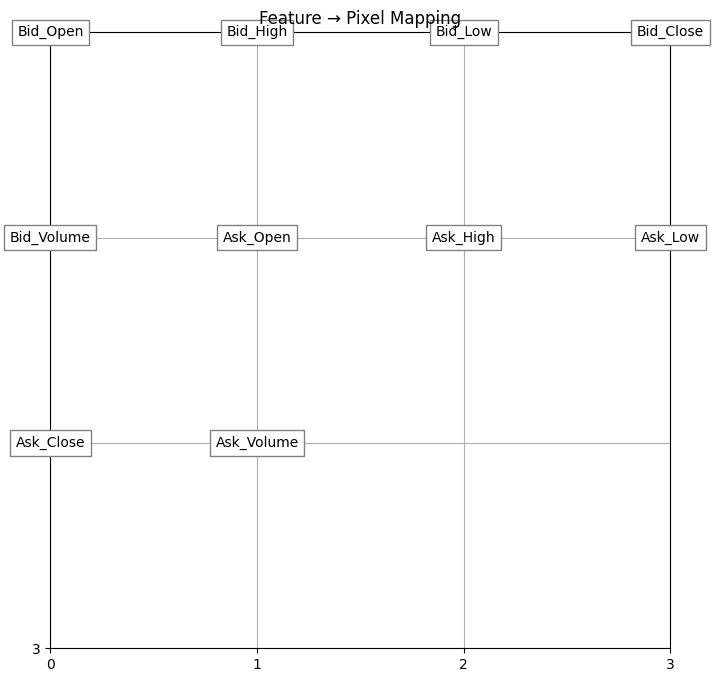

In [96]:
if hasattr(image_model, 'coordinate'):
    coordinates = image_model.coordinate
else:
    coordinates = (np.array([0, 0, 0, 0, 1, 1, 1, 1, 2, 2]),
                   np.array([0, 1, 2, 3, 0, 1, 2, 3, 0, 1]))

plot_feature_mapping(x_col, coordinates, scale=[4, 4])

In [97]:
# Combine dataloaders into tensors.
train_mlp, train_img, train_target = combine_loader(train_loader)
val_mlp, val_img, val_target = combine_loader(val_loader)
test_mlp, test_img, test_target = combine_loader(test_loader)

dataset = {
    "train_input": train_mlp.to(device),
    "train_img": train_img.to(device),
    "train_label": train_target.to(device),
    "val_input": val_mlp.to(device),
    "val_img": val_img.to(device),
    "val_label": val_target.to(device),
    "test_input": test_mlp.to(device),
    "test_img": test_img.to(device),
    "test_label": test_target.to(device),
}

In [98]:
# Print the shapes of the tensors
print("Train data shape:", dataset['train_input'].shape)
print("Train target shape:", dataset['train_label'].shape)
print("Test data shape:", dataset['test_input'].shape)
print("Test target shape:", dataset['test_label'].shape)
print("Validation data shape:", dataset['val_input'].shape)
print("Validation target shape:", dataset['val_label'].shape)

Train data shape: torch.Size([1173, 10])
Train target shape: torch.Size([1173, 1])
Test data shape: torch.Size([367, 10])
Test target shape: torch.Size([367, 1])
Validation data shape: torch.Size([294, 10])
Validation target shape: torch.Size([294, 1])


In [99]:
completed_coordinate, completed_x_col = complete_coordinate_and_xcol(coordinates, x_col)

# KAN training ✅ Top 2 Configurations

### 1. width=[10, 3, 1], grid=3, lamb=1e-06 | best_epoch=3 | acc_test=0.74932

checkpoint directory created: ./model
saving model version 0.0


 train_acc_kan: 7.77e-01 | val_acc_kan: 6.73e-01 |: 100%|█████████| 100/100 [00:27<00:00,  3.60it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 2 epoch
tensor(0.6975, device='cuda:0')


tensor(0.6975, device='cuda:0')

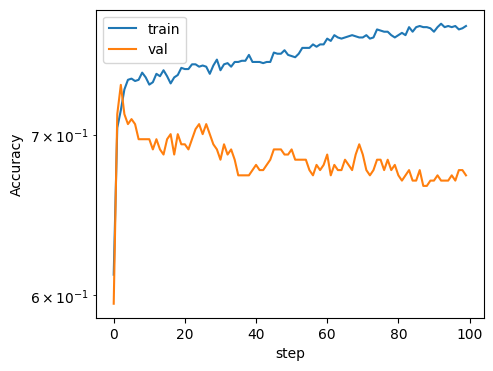

In [114]:
del model, best_model_state, results
model = KAN(width=[attributes, 3, 1], grid=3, k=3, seed=381, device=device)
best_model_state, results, _ = custom_fit(model, dataset, opt="LBFGS", steps=100, lamb=1e-06,
                                          metrics=(train_acc_kan, val_acc_kan), display_metrics=['train_acc_kan', 'val_acc_kan'])
#model.load_state_dict(best_model_state)
plot_training_ACC(model, best_model_state, dataset['test_label'][:,0], model(dataset['test_input'])[:,0],
                  results['train_acc_kan'], results['val_acc_kan'])

In [116]:
model.load_state_dict(best_model_state)
plot_confusion_matrix(dataset['test_label'][:,0], model(dataset['test_input'])[:,0], title="Confusion Matrix")

[[129  54]
 [ 48 136]]


array([[129,  54],
       [ 48, 136]], dtype=int64)

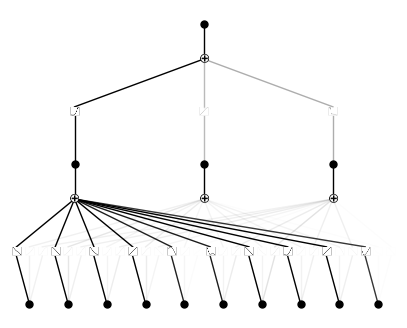

In [58]:
model.plot()

[('Bid_Close', 8.31032), ('Ask_Close', 7.2956753), ('Ask_High', 6.913417), ('Bid_High', 5.776236), ('Bid_Open', 1.9707987), ('Bid_Low', 1.5997393), ('Ask_Low', 0.9390934), ('Ask_Open', 0.5157894), ('Bid_Volume', 0.46877444), ('Ask_Volume', 0.36450866)]


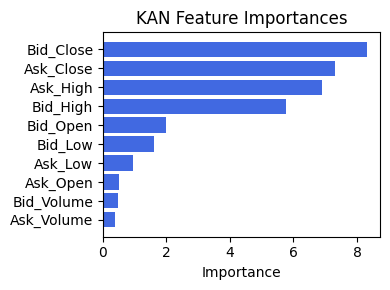

[('Bid_Close', 8.31032),
 ('Ask_Close', 7.2956753),
 ('Ask_High', 6.913417),
 ('Bid_High', 5.776236),
 ('Bid_Open', 1.9707987),
 ('Bid_Low', 1.5997393),
 ('Ask_Low', 0.9390934),
 ('Ask_Open', 0.5157894),
 ('Bid_Volume', 0.46877444),
 ('Ask_Volume', 0.36450866)]

In [59]:
plot_sorted_feature_importance(x_col, model.feature_score)

### 2. width=[10, 3, 1], grid=4, lamb=0.0001 | best_epoch=3 | acc_test=0.74659

checkpoint directory created: ./model
saving model version 0.0


 train_acc_kan: 7.53e-01 | val_acc_kan: 6.73e-01 |: 100%|███████████| 10/10 [00:13<00:00,  1.39s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 3 epoch
tensor(0.7248, device='cuda:0')


tensor(0.7248, device='cuda:0')

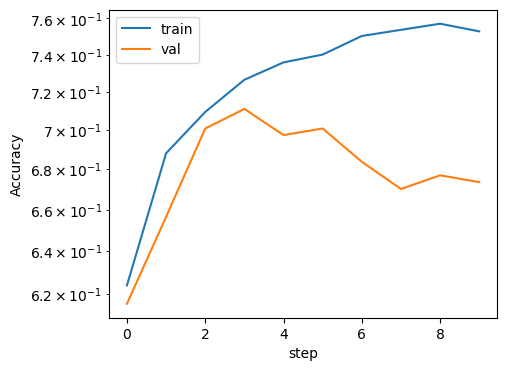

In [60]:
model = KAN(width=[attributes, 3, 1], grid=4, k=3, seed=381, device=device)
best_model_state, results, _ = custom_fit(model, dataset, opt="LBFGS", steps=10, lamb=0.0001,
                                          metrics=(train_acc_kan, val_acc_kan), display_metrics=['train_acc_kan', 'val_acc_kan'])
plot_training_ACC(model, best_model_state, dataset['test_label'][:,0], model(dataset['test_input'])[:,0],
                  results['train_acc_kan'], results['val_acc_kan'])

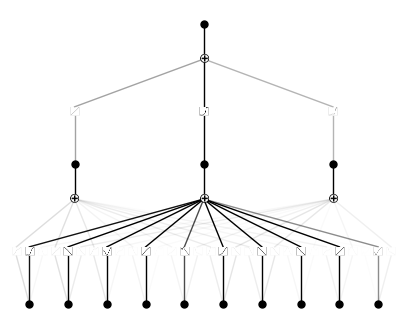

In [61]:
model.plot()

In [62]:
plot_confusion_matrix(dataset['test_label'][:,0], model(dataset['test_input'])[:,0], title="Confusion Matrix")

[[125  58]
 [ 48 136]]


array([[125,  58],
       [ 48, 136]], dtype=int64)

[('Bid_Close', 7.971229), ('Bid_High', 7.346293), ('Ask_Close', 7.1305676), ('Ask_High', 4.4975147), ('Ask_Low', 2.4395332), ('Bid_Low', 2.2413726), ('Bid_Open', 1.6592015), ('Ask_Open', 1.418995), ('Ask_Volume', 0.56253165), ('Bid_Volume', 0.4651566)]


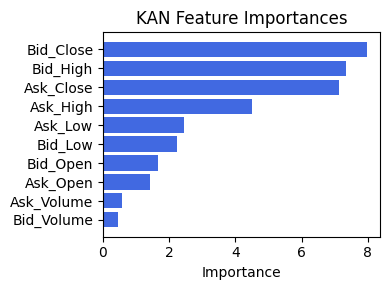

[('Bid_Close', 7.971229),
 ('Bid_High', 7.346293),
 ('Ask_Close', 7.1305676),
 ('Ask_High', 4.4975147),
 ('Ask_Low', 2.4395332),
 ('Bid_Low', 2.2413726),
 ('Bid_Open', 1.6592015),
 ('Ask_Open', 1.418995),
 ('Ask_Volume', 0.56253165),
 ('Bid_Volume', 0.4651566)]

In [63]:
plot_sorted_feature_importance(x_col, model.feature_score)

# CNN training ✅ Top 2 Configurations

### 1. cnn_blocks=1, dense_layers=1 | best_epoch=18 | loss=3.22069

In [47]:
build_custom_cnn_model(cnn_blocks=1, dense_layers=1, imgs_shape=imgs_shape)

CustomCNNModel(
  (cnn_branch): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (1): LayerNorm((16, 8, 8), eps=1e-05, elementwise_affine=True)
    (2): Sigmoid()
    (3): Flatten(start_dim=1, end_dim=-1)
  )
  (fc): Sequential(
    (0): Linear(in_features=1024, out_features=1, bias=True)
  )
)

| Train: 8.9853e+00 | Val: 1.0173e+01 |: 100%|████████████████████| 100/100 [00:37<00:00,  2.68it/s]


✅ Best validation loss: 9.5183e+00 at 22 epoch
3.311112880706787


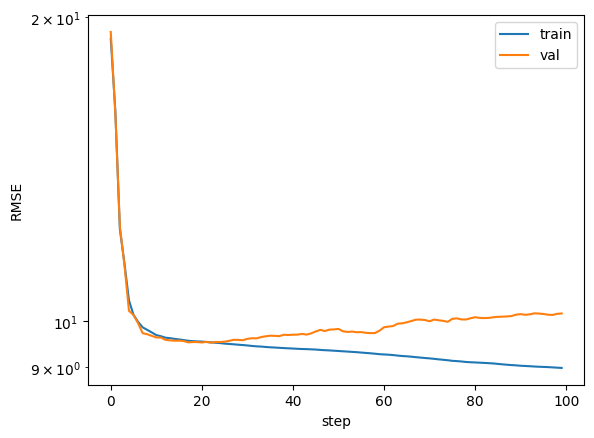

In [38]:
model = build_custom_cnn_model(cnn_blocks=1, dense_layers=1, imgs_shape=imgs_shape)
model_state, results, _ = fit_cnn_only_model(model, dataset, steps=100)
plot_training_RMSE(model, model_state, average_rmse(model(0, dataset['test_img']), dataset['test_label']), results['train_loss'], results['val_loss'])

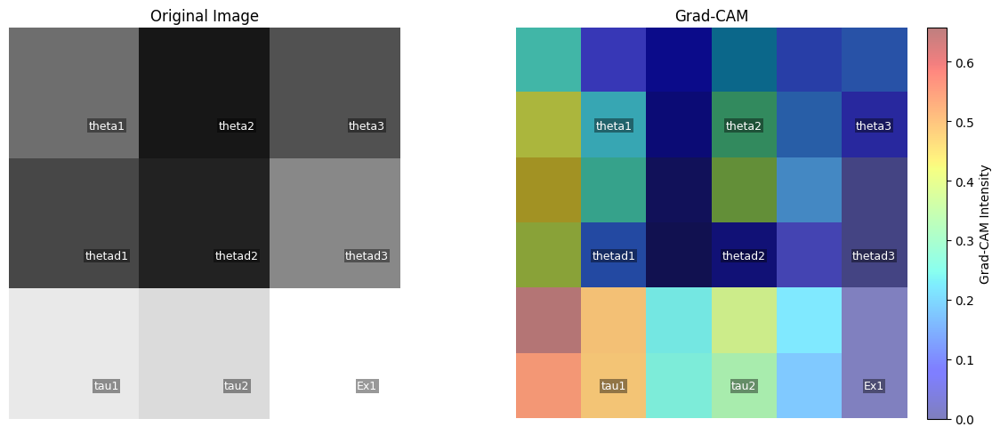

In [39]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [06:11<00:00,  4.41it/s]


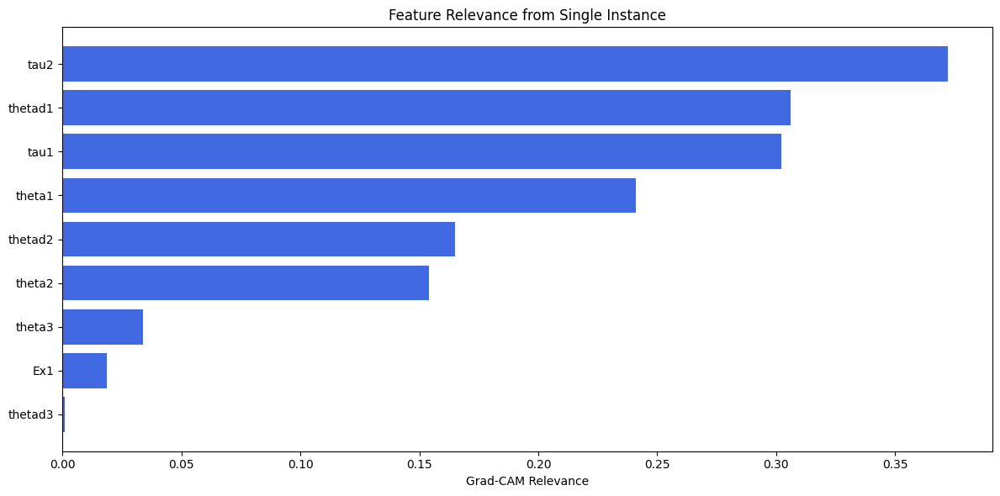

In [40]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

### 2. cnn_blocks=3, dense_layers=2 | best_epoch=4 | loss=3.24624

| Train: 2.5414e+00 | Val: 1.7249e+01 |: 100%|████████████████████| 110/110 [01:03<00:00,  1.73it/s]


✅ Best validation loss: 9.8724e+00 at 3 epoch
4.303581714630127


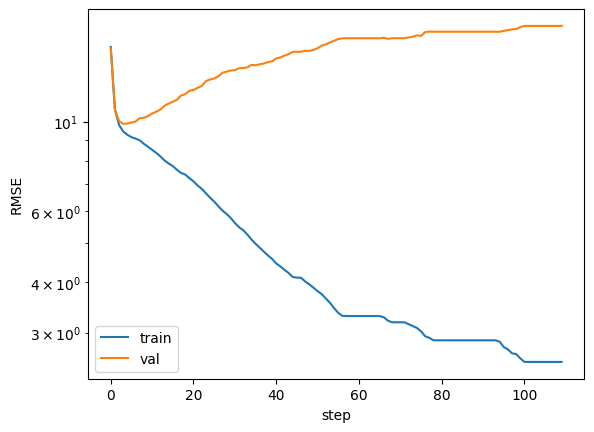

In [41]:
model = build_custom_cnn_model(cnn_blocks=3, dense_layers=2, imgs_shape=imgs_shape)
model_state, results, _ = fit_cnn_only_model(model, dataset, steps=110)
plot_training_RMSE(model, model_state, average_rmse(model(0, dataset['test_img']), dataset['test_label']), results['train_loss'], results['val_loss'])

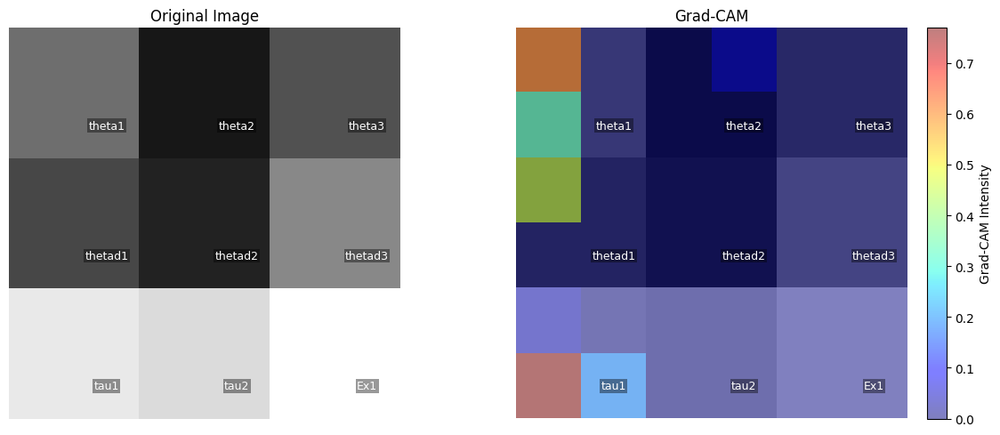

In [42]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [06:16<00:00,  4.35it/s] 


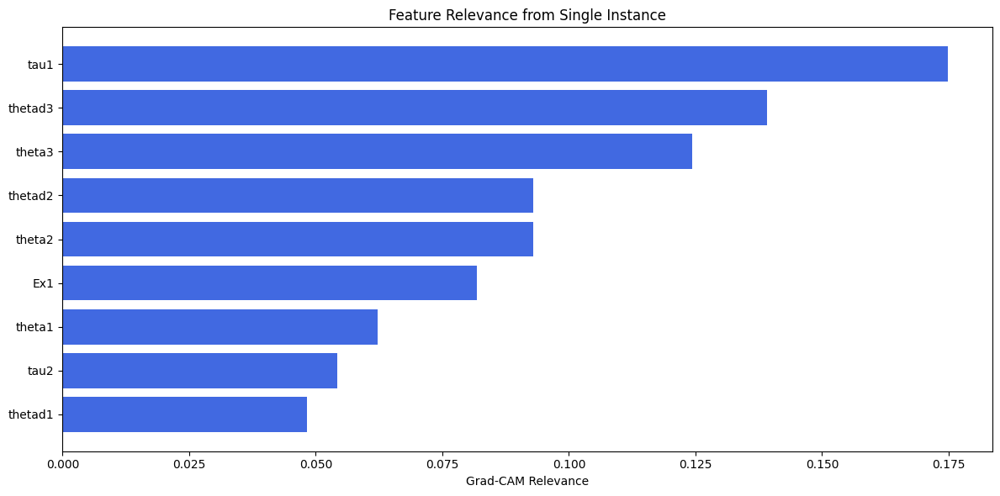

In [43]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

# Set Files Name

In [102]:
filename_0=f'{dataset_name}_Concat_Op0.csv'
filename_1=f'{dataset_name}_Concat_Op1.csv'
filename_2=f'{dataset_name}_Concat_Op2.csv'
filename_3=f'{dataset_name}_Concat_Op3.csv'
filename_4=f'{dataset_name}_Concat_Op4.csv'

In [104]:
columns_opt0 = '_'
columns_opt1 = 'cnn_bottleneck_dim'
columns_opt2 = 'alpha'
columns_opt3 = 'hidden_dim'
columns_opt4 = 'embed_dim, num_heads'

# Option 0: Concat full best KAN with full best CNN

In [45]:
create_csv_with_header(filename_0, columns_opt0)

### 0.1.0 width=[10, 3, 1], grid=3, lamb=1e-06

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.45e-01 | val_acc_hybrid: 6.60e-01 |: 100%|█████| 20/20 [00:10<00:00,  1.95it/s]


saving model version 0.1
✅ Best validation Accuracy: 6.9388e-01 at 3 epoch
tensor(0.7357, device='cuda:0')
[[141  42]
 [ 55 129]]
M_KAN Relevance: 0.9961861371994019
CNN Relevance: 0.003813826246187091
[('Bid_Close', 7.2106895), ('Ask_High', 7.1008744), ('Ask_Close', 6.2503824), ('Bid_Open', 4.095722), ('Bid_Low', 3.5905), ('Ask_Low', 3.147977), ('Bid_High', 2.7960496), ('Ask_Open', 0.74605346), ('Bid_Volume', 0.53049767), ('Ask_Volume', 0.4568252)]


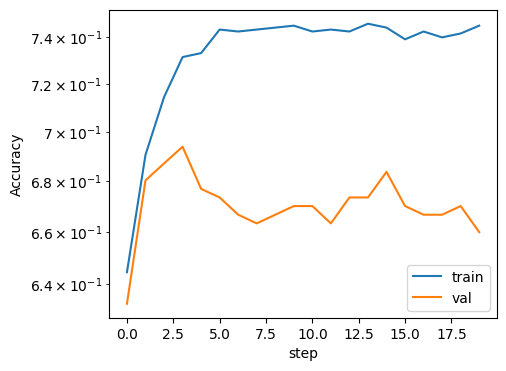

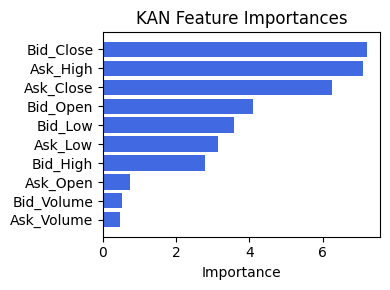

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.40717616429608267), ('Ask_Volume', 0.3555474933389097), ('Ex5', 0.3480625945963067), ('Ex4', 0.3100236520292973), ('Ask_Open', 0.12031800519993494), ('Ex6', 0.10273832624793378), ('Ex2', 0.10116262442612518), ('Ask_High', 0.08828525929724447), ('Ask_Close', 0.08495200518772453), ('Ex3', 0.057998683191937385), ('Bid_Volume', 0.03320290051668385), ('Ask_Low', 0.007936752472257693), ('Bid_High', 0.00589002516174618), ('Bid_Low', 0.0033234000277048235), ('Bid_Open', 0.0027075051357502216), ('Bid_Close', 0.0)]


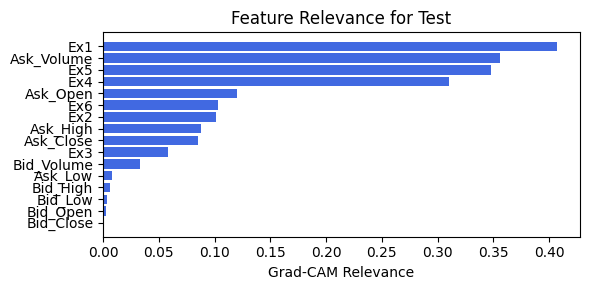

In [49]:
train_and_plot_relevance(Model3_0, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=20, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.1.1 width=[10, 3, 1], grid=3, lamb=1e-06

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.60e-01 |: 100%|█████| 20/20 [00:09<00:00,  2.19it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0408e-01 at 4 epoch
tensor(0.7193, device='cuda:0')
[[141  42]
 [ 61 123]]
M_KAN Relevance: 0.9957935214042664
CNN Relevance: 0.0042065102607011795
[('Ask_High', 8.920592), ('Bid_Close', 8.248978), ('Ask_Close', 7.1599717), ('Bid_High', 4.822751), ('Bid_Low', 3.5728154), ('Ask_Low', 2.9628284), ('Bid_Open', 2.9554865), ('Ask_Open', 1.7811228), ('Bid_Volume', 0.4610567), ('Ask_Volume', 0.44269717)]


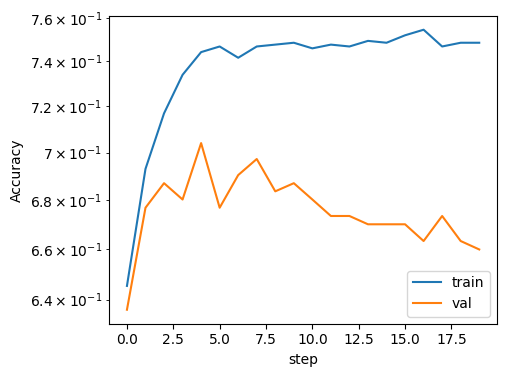

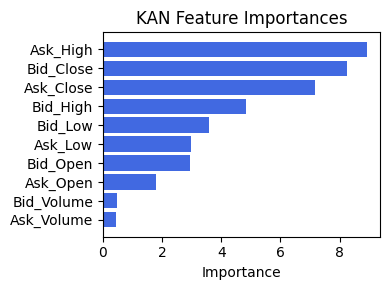

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.4225995017657163), ('Ask_Volume', 0.3684773540139523), ('Ex5', 0.36078020857205506), ('Ex4', 0.31960128511654906), ('Ask_Open', 0.12142424833317217), ('Ex6', 0.1077646786494216), ('Ex2', 0.10695398873992122), ('Ask_High', 0.09121697755531745), ('Ask_Close', 0.08534211189326213), ('Ex3', 0.05645090627816458), ('Bid_Volume', 0.03221558470668193), ('Ask_Low', 0.008504549074025047), ('Bid_High', 0.0045967813474487775), ('Bid_Low', 0.002482576342431172), ('Bid_Open', 0.0022414158023379956), ('Bid_Close', 0.0)]


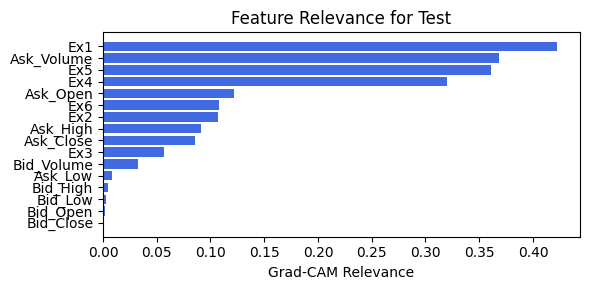

In [50]:
train_and_plot_relevance(Model3_0, kan_neurons=3, kan_grid=3, lamb=1e-06, steps=20, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.2.1 width=[10, 3, 1], grid=4, lamb=0.0001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.60e-01 | val_acc_hybrid: 6.73e-01 |: 100%|█████| 20/20 [00:08<00:00,  2.45it/s]

saving model version 0.1
✅ Best validation Accuracy: 6.9048e-01 at 6 epoch
tensor(0.6894, device='cuda:0')
[[138  45]
 [ 69 115]]
M_KAN Relevance: 0.9945002198219299
CNN Relevance: 0.005499811377376318
[('Ask_Close', 5.7395034), ('Bid_High', 4.151368), ('Ask_High', 3.7789814), ('Bid_Low', 3.6873572), ('Ask_Low', 3.6794047), ('Bid_Close', 3.6491349), ('Bid_Open', 2.8232102), ('Ask_Open', 1.897244), ('Ask_Volume', 1.2726974), ('Bid_Volume', 1.1139212)]


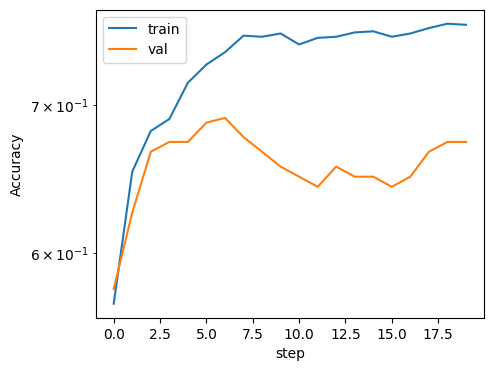

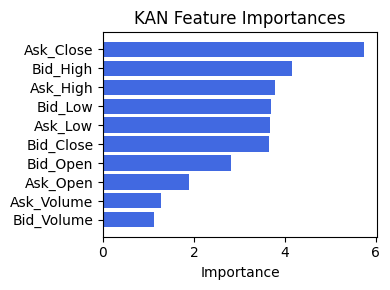

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.4509544286075015), ('Ex5', 0.41846610861513206), ('Ask_Volume', 0.37843800082356144), ('Ex4', 0.3531105439571984), ('Ex6', 0.13601076818129673), ('Ex2', 0.1330219157425844), ('Ask_Open', 0.1311540744508165), ('Ask_High', 0.11728503961973806), ('Ask_Close', 0.06936934365502657), ('Ex3', 0.0424414178057084), ('Bid_Volume', 0.025361821474602614), ('Ask_Low', 0.014449440395908859), ('Bid_High', 0.0004402577006170045), ('Bid_Open', 0.0002806834131277043), ('Bid_Low', 0.0001830960235657419), ('Bid_Close', 0.0)]


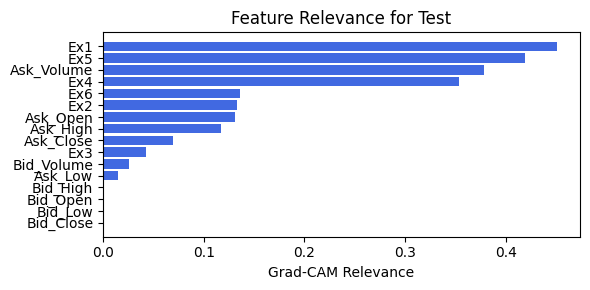

In [51]:
train_and_plot_relevance(Model3_0, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=20, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.2.2 width=[10, 3, 1], grid=4, lamb=0.0001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.48e-01 | val_acc_hybrid: 6.63e-01 |: 100%|█████| 20/20 [00:08<00:00,  2.36it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0748e-01 at 5 epoch
tensor(0.6921, device='cuda:0')
[[127  56]
 [ 57 127]]
M_KAN Relevance: 0.9924182891845703
CNN Relevance: 0.007581729907542467
[('Ask_Close', 5.617713), ('Bid_High', 4.086659), ('Bid_Low', 3.97994), ('Ask_Low', 3.8067071), ('Bid_Close', 3.5544498), ('Ask_High', 3.120474), ('Bid_Open', 2.9312193), ('Ask_Open', 2.1100948), ('Ask_Volume', 1.3925873), ('Bid_Volume', 1.1607865)]


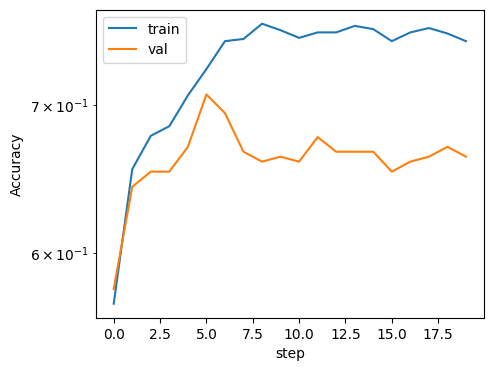

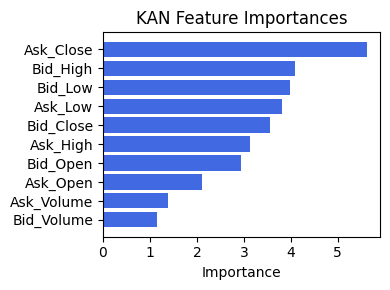

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.4552225664217401), ('Ex5', 0.4175891172171289), ('Ask_Volume', 0.3836933118608407), ('Ex4', 0.3538584804177609), ('Ex6', 0.13477256575381075), ('Ex2', 0.13262905196695302), ('Ask_Open', 0.13016249236455046), ('Ask_High', 0.11555693087190877), ('Ask_Close', 0.07071046992547668), ('Ex3', 0.04284175929971222), ('Bid_Volume', 0.025330462544310803), ('Ask_Low', 0.0140084896607157), ('Bid_High', 0.00029684682492587573), ('Bid_Open', 0.00022060741939863176), ('Bid_Low', 8.781045971153436e-05), ('Bid_Close', 0.0)]


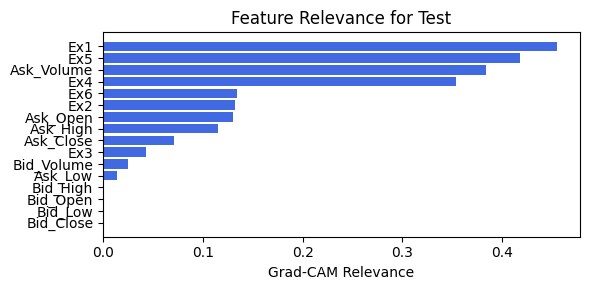

In [52]:
train_and_plot_relevance(Model3_0, kan_neurons=3, kan_grid=4, lamb=0.0001, steps=20, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.3.1 width=[10, 1, 1], grid=3, lamb=0.0001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.50e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 25/25 [00:10<00:00,  2.34it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 12 epoch
tensor(0.7193, device='cuda:0')
[[134  49]
 [ 54 130]]
M_KAN Relevance: 0.33615803718566895
CNN Relevance: 0.663841962814331
[('Bid_High', 4.822745), ('Bid_Close', 3.754647), ('Bid_Low', 2.91063), ('Ask_Close', 2.6993048), ('Ask_Low', 1.691053), ('Ask_High', 1.45846), ('Bid_Open', 0.9752136), ('Ask_Open', 0.5329907), ('Ask_Volume', 0.24839032), ('Bid_Volume', 0.24154755)]


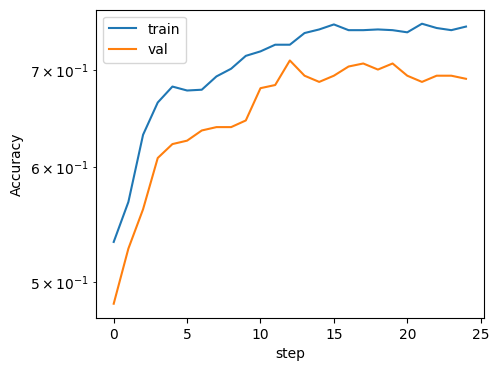

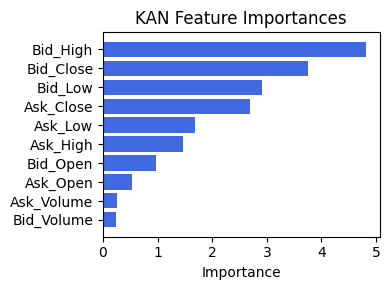

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex6', 0.46495294132414566), ('Ex2', 0.34798197712170653), ('Ask_Low', 0.11195874732553614), ('Ask_Close', 0.04954951171628745), ('Bid_Volume', 0.010510839566333684), ('Ex5', 0.006651155975020309), ('Ex1', 0.0054771662525590304), ('Bid_Close', 0.003960137635029152), ('Ask_Volume', 1.7903122177971806e-06), ('Ex4', 1.7903122177971806e-06), ('Bid_Open', 0.0), ('Bid_High', 0.0), ('Bid_Low', 0.0), ('Ask_Open', 0.0), ('Ask_High', 0.0), ('Ex3', 0.0)]


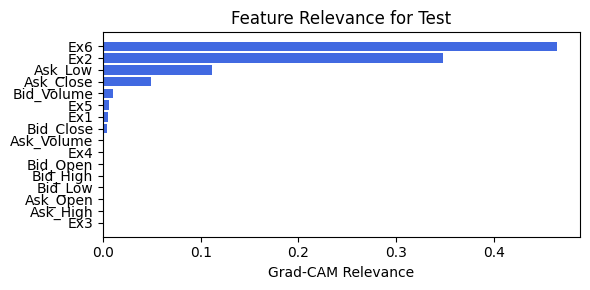

In [53]:
train_and_plot_relevance(Model3_0, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=25, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.3.2 width=[10, 1, 1], grid=3, lamb=0.0001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 25/25 [00:10<00:00,  2.29it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 14 epoch
tensor(0.7030, device='cuda:0')
[[130  53]
 [ 56 128]]
M_KAN Relevance: 0.37156981229782104
CNN Relevance: 0.628430187702179
[('Bid_High', 5.7996297), ('Bid_Close', 3.9465168), ('Ask_Close', 2.8469052), ('Ask_Low', 2.8282566), ('Bid_Low', 2.618334), ('Ask_High', 1.9346442), ('Ask_Open', 0.996515), ('Bid_Open', 0.54366755), ('Ask_Volume', 0.1204136), ('Bid_Volume', 0.09016928)]


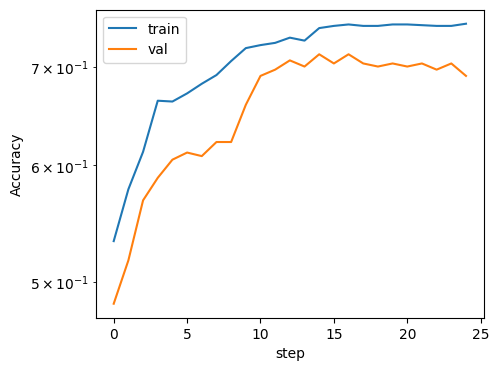

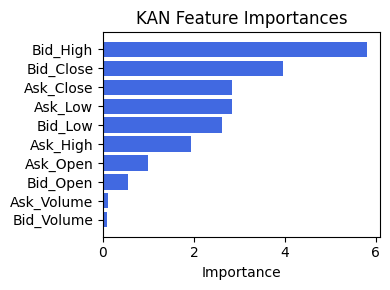

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.6104656703952872), ('Ex6', 0.4929330374954182), ('Ask_Low', 0.3327275610653232), ('Bid_Close', 0.061779132847514316), ('Bid_Open', 0.05609563115111245), ('Ex5', 0.0340417347828114), ('Ex1', 0.02194488573342318), ('Bid_Volume', 0.01311865775642218), ('Ask_High', 0.007796748431645658), ('Bid_Low', 0.0036528460422051547), ('Bid_High', 0.002922501721811364), ('Ask_Close', 0.0026294417719436654), ('Ask_Open', 0.0021949903876140042), ('Ex4', 0.0015848353547957658), ('Ask_Volume', 0.0), ('Ex3', 0.0)]


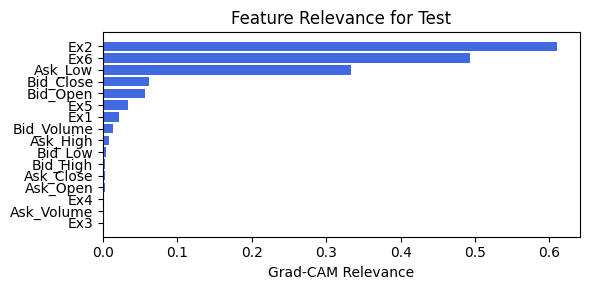

In [54]:
train_and_plot_relevance(Model3_0, kan_neurons=1, kan_grid=3, lamb=0.0001, steps=25, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.4.1 width=[10, 4, 1], grid=3, lamb=0.0001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.48e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 20/20 [00:08<00:00,  2.46it/s]


saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 5 epoch
tensor(0.7139, device='cuda:0')
[[133  50]
 [ 55 129]]
M_KAN Relevance: 0.9969836473464966
CNN Relevance: 0.0030164162162691355
[('Bid_Close', 14.796914), ('Bid_High', 9.438582), ('Ask_High', 6.0505414), ('Bid_Low', 5.3692503), ('Bid_Open', 4.530912), ('Ask_Open', 4.4202633), ('Ask_Close', 3.658096), ('Ask_Low', 2.3346887), ('Bid_Volume', 1.3955827), ('Ask_Volume', 0.50038016)]


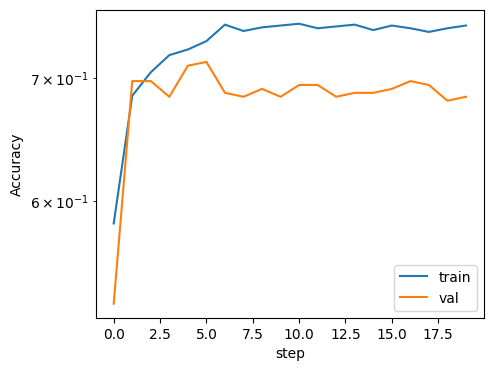

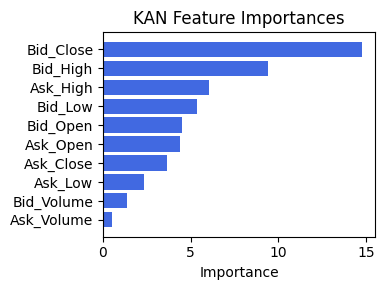

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.4748309329761147), ('Ex5', 0.45373283525578656), ('Ask_Volume', 0.3918471105944883), ('Ex4', 0.37398720209864894), ('Ex6', 0.15420136440352458), ('Ex2', 0.15063664213594363), ('Ask_Open', 0.14475411970193094), ('Ask_High', 0.1405427080794169), ('Ask_Close', 0.06322244161673966), ('Ex3', 0.03690198404912403), ('Bid_Volume', 0.023562400789749974), ('Ask_Low', 0.01960597286023528), ('Bid_Low', 0.00013837760106782314), ('Bid_High', 0.00011947517237186365), ('Bid_Open', 2.4397895075725567e-06), ('Bid_Close', 0.0)]


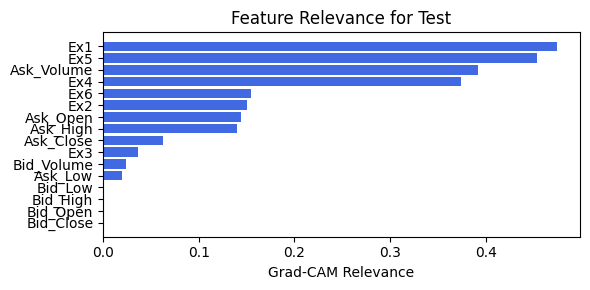

In [55]:
train_and_plot_relevance(Model3_0, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=20, n_kan_len=1, filename=filename_0, opt_col_val='_')

### 0.4.2 width=[10, 4, 1], grid=3, lamb=0.0001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


 train_acc_hybrid: 7.60e-01 | val_acc_hybrid: 6.77e-01 |: 100%|█████| 20/20 [00:07<00:00,  2.51it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 5 epoch
tensor(0.7193, device='cuda:0')
[[133  50]
 [ 53 131]]
M_KAN Relevance: 0.9972769021987915
CNN Relevance: 0.0027230470441281796
[('Bid_Close', 13.918846), ('Bid_High', 8.827769), ('Ask_High', 5.9206758), ('Bid_Low', 5.205479), ('Ask_Open', 4.1102734), ('Bid_Open', 4.050398), ('Ask_Close', 3.8306978), ('Ask_Low', 2.3589249), ('Bid_Volume', 1.271569), ('Ask_Volume', 0.3923602)]


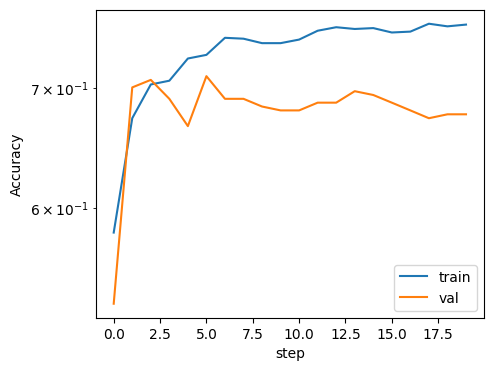

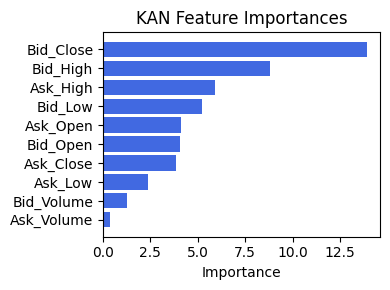

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.47945176580621374), ('Ex5', 0.4643951527754033), ('Ask_Volume', 0.3934802437145314), ('Ex4', 0.37989487464486416), ('Ex6', 0.15976416959099937), ('Ex2', 0.15559963691137144), ('Ask_Open', 0.14813299364713592), ('Ask_High', 0.14693537392153605), ('Ask_Close', 0.06083808473897565), ('Ex3', 0.03490385824271379), ('Bid_Volume', 0.022903431402024502), ('Ask_Low', 0.02107152506213937), ('Bid_Low', 7.938786877042611e-05), ('Bid_High', 6.289862583263534e-05), ('Bid_Open', 0.0), ('Bid_Close', 0.0)]


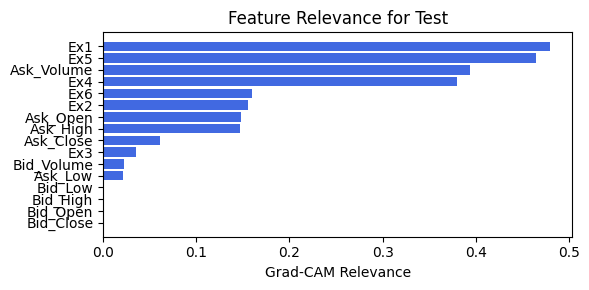

In [56]:
train_and_plot_relevance(Model3_0, kan_neurons=4, kan_grid=3, lamb=0.0001, steps=20, n_kan_len=1, filename=filename_0, opt_col_val='_')

# Option 1: Concat KAN with (CNN with dense layer to reduce output_size)

In [105]:
create_csv_with_header(filename_1, columns_opt1)

## 1.0 width=[10, 4], grid=3, lamb=1e-06

cnn_bottleneck_dim: 1
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.54e-01 | val_acc_hybrid: 6.77e-01 |: 100%|█████| 50/50 [01:45<00:00,  2.10s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 1 epoch
tensor(0.7084, device='cuda:0')
[[129  54]
 [ 53 131]]
M_KAN Relevance: 0.9209451079368591
CNN Relevance: 0.07905491441488266
[('Bid_Close', 2.435588), ('Ask_Open', 1.6891968), ('Ask_Close', 1.3846471), ('Bid_Open', 1.0904667), ('Bid_High', 0.78523), ('Ask_High', 0.6673712), ('Bid_Low', 0.43567714), ('Ask_Low', 0.2765447), ('Ask_Volume', 0.24477759), ('Bid_Volume', 0.23384748)]


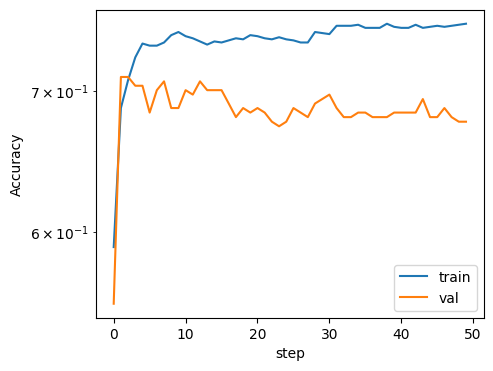

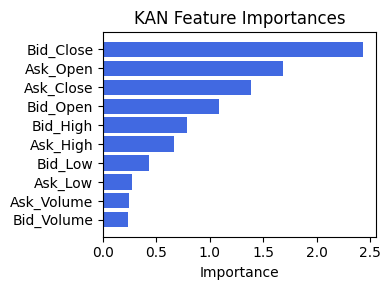

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex3', 0.5959959792364034), ('Ex4', 0.5450695713509981), ('Ex5', 0.5450695713509981), ('Ex6', 0.29132303481189437), ('Bid_Volume', 0.20130822223808478), ('Ask_Close', 0.1823667425647053), ('Bid_Open', 0.16200948370701815), ('Ask_Open', 0.11558593737550857), ('Ex1', 0.11453891071498556), ('Ask_High', 0.09925414176628612), ('Ask_Volume', 0.08811329797478723), ('Bid_Low', 0.08116839385854095), ('Bid_High', 0.08041739696597641), ('Bid_Close', 0.06835999402554759), ('Ask_Low', 0.0243121944443619), ('Ex2', 0.022084370837864093)]


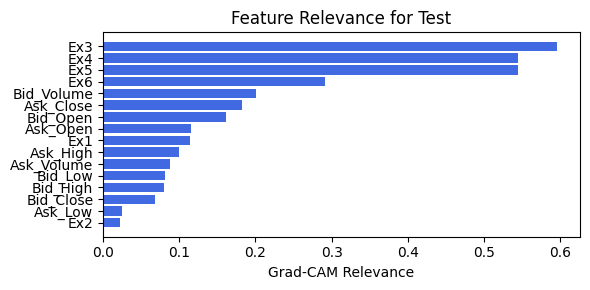

cnn_bottleneck_dim: 2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.51e-01 | val_acc_hybrid: 7.11e-01 |: 100%|█████| 50/50 [01:43<00:00,  2.07s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 7 epoch
tensor(0.7112, device='cuda:0')
[[118  65]
 [ 41 143]]
M_KAN Relevance: 0.37496861815452576
CNN Relevance: 0.6250313520431519
[('Bid_Close', 0.6188774), ('Ask_High', 0.49151427), ('Ask_Close', 0.40883866), ('Bid_Low', 0.23114291), ('Ask_Open', 0.164623), ('Bid_Volume', 0.13355139), ('Ask_Low', 0.12022449), ('Bid_Open', 0.1135426), ('Bid_High', 0.113270774), ('Ask_Volume', 0.08347502)]


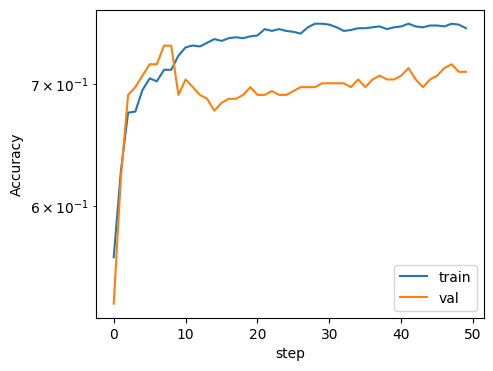

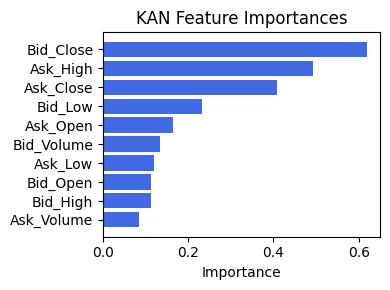

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.7913081081081639), ('Ask_Low', 0.6890799527840653), ('Ask_High', 0.35217667235586825), ('Ex1', 0.2891703152011481), ('Bid_Close', 0.2799449090116146), ('Ask_Volume', 0.2477751424930557), ('Ask_Open', 0.24531595019099608), ('Ask_Close', 0.13101753507067046), ('Bid_Volume', 0.10293904636042543), ('Ex6', 0.09366357549441323), ('Bid_Low', 0.0911148994454), ('Bid_High', 0.08967335694496077), ('Bid_Open', 0.0380211284033458), ('Ex4', 0.011708586616949141), ('Ex5', 0.011708586616949141), ('Ex3', 0.004511210081734211)]


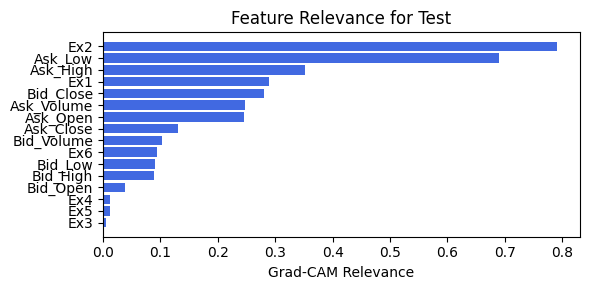

cnn_bottleneck_dim: 4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.65e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 50/50 [01:41<00:00,  2.02s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 5 epoch
tensor(0.7112, device='cuda:0')
[[114  69]
 [ 37 147]]
M_KAN Relevance: 0.26141247153282166
CNN Relevance: 0.7385875582695007
[('Bid_Close', 0.2798116), ('Bid_Open', 0.26655906), ('Ask_Low', 0.21568175), ('Bid_Low', 0.205594), ('Ask_High', 0.15898973), ('Bid_High', 0.15241644), ('Ask_Open', 0.14451209), ('Ask_Close', 0.09191629), ('Bid_Volume', 0.08140781), ('Ask_Volume', 0.051582694)]


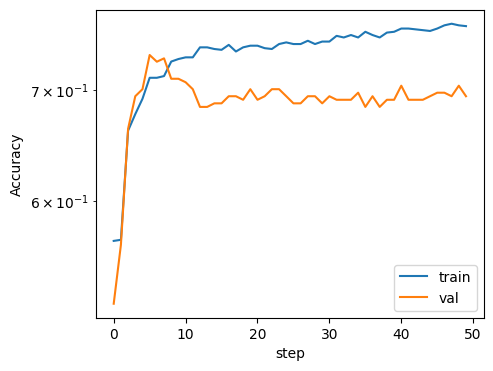

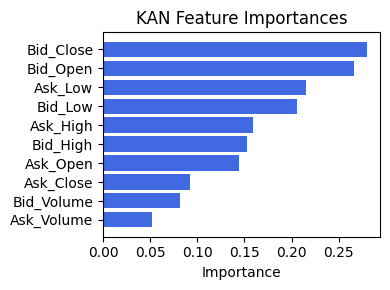

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.8263820681812328), ('Ask_Volume', 0.7495275999873633), ('Ex1', 0.7325174516467859), ('Ask_Open', 0.6232374980030657), ('Ask_Close', 0.5658696620834215), ('Bid_Volume', 0.48021094847155854), ('Ask_Low', 0.35925230602619596), ('Bid_Low', 0.2864840569753201), ('Bid_High', 0.28379020556123125), ('Ex3', 0.2756335592602839), ('Ex4', 0.24569755587638012), ('Ex5', 0.24569755587638012), ('Ex2', 0.23714003515777454), ('Bid_Open', 0.21669120121293964), ('Bid_Close', 0.10181239549304062), ('Ex6', 0.005393426953166233)]


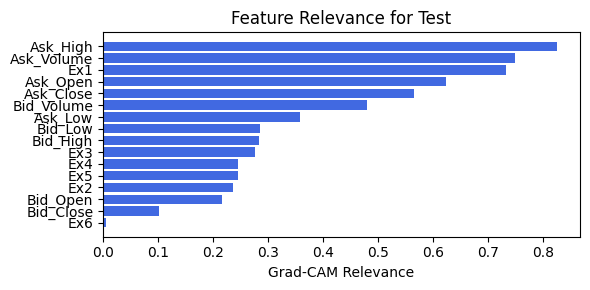

cnn_bottleneck_dim: 6
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.50e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 50/50 [01:41<00:00,  2.03s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 9 epoch
tensor(0.7221, device='cuda:0')
[[124  59]
 [ 43 141]]
M_KAN Relevance: 0.26882073283195496
CNN Relevance: 0.7311792969703674
[('Bid_Close', 0.27946332), ('Bid_Open', 0.21322778), ('Ask_Low', 0.20727955), ('Bid_Low', 0.19649512), ('Ask_Open', 0.15844606), ('Bid_High', 0.13707569), ('Ask_High', 0.114131056), ('Ask_Close', 0.105692916), ('Ask_Volume', 0.075714916), ('Bid_Volume', 0.054662455)]


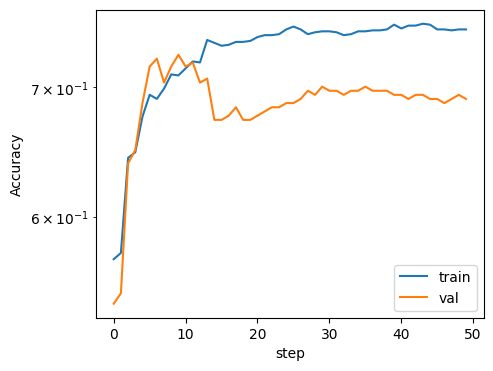

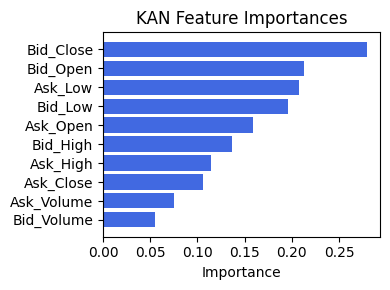

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.6882602269900836), ('Ask_Low', 0.6425269472486357), ('Ex6', 0.3645736941666792), ('Bid_Close', 0.20830311888241404), ('Ex4', 0.20090464419654852), ('Ex5', 0.20090464419654852), ('Ex3', 0.08710325271213473), ('Ask_High', 0.07339678702105791), ('Ask_Open', 0.04766343717085202), ('Ask_Volume', 0.027712485743483544), ('Bid_Volume', 0.025895625496249887), ('Ex1', 0.025858722367369615), ('Ask_Close', 0.010959001395208076), ('Bid_Low', 0.007014878180794093), ('Bid_High', 0.006985768964304779), ('Bid_Open', 0.0037876830413450338)]


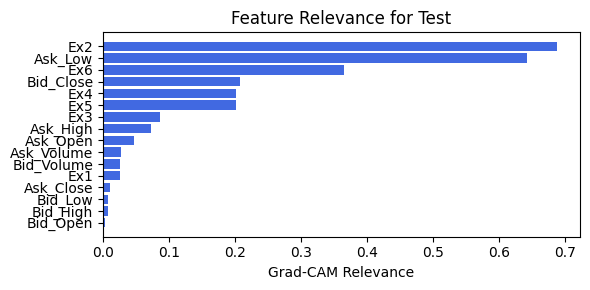

cnn_bottleneck_dim: 8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.56e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 50/50 [01:41<00:00,  2.03s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 9 epoch
tensor(0.7139, device='cuda:0')
[[120  63]
 [ 42 142]]
M_KAN Relevance: 0.08723639696836472
CNN Relevance: 0.9127635955810547
[('Bid_Close', 0.48222032), ('Ask_Low', 0.34892344), ('Ask_Close', 0.34419575), ('Bid_Low', 0.28058195), ('Bid_High', 0.24710041), ('Bid_Open', 0.24011451), ('Bid_Volume', 0.13760482), ('Ask_High', 0.12008196), ('Ask_Volume', 0.11045273), ('Ask_Open', 0.0784536)]


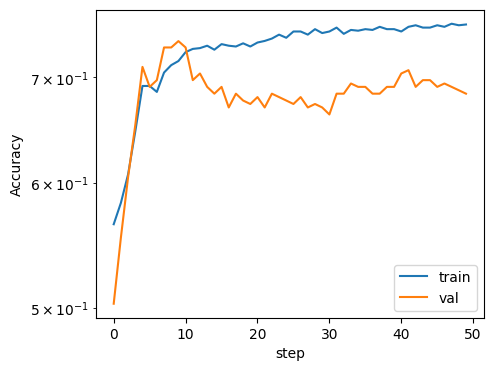

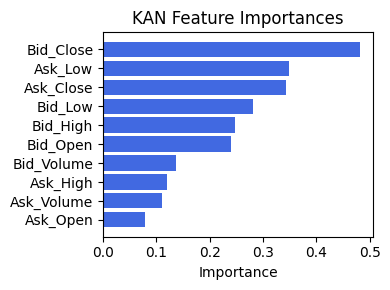

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.7453808271064746), ('Ask_Low', 0.6841619161721472), ('Bid_Close', 0.41713424824300027), ('Ask_High', 0.11026283909767493), ('Ex6', 0.07360274116542763), ('Ask_Open', 0.03913196859679379), ('Bid_Low', 0.03762477526900534), ('Bid_High', 0.03556285319896716), ('Ask_Volume', 0.0346501791259681), ('Ex1', 0.03304641038177494), ('Bid_Volume', 0.025949869379845694), ('Ask_Close', 0.023398392968736352), ('Bid_Open', 0.015352086127855897), ('Ex4', 0.004427836505773576), ('Ex5', 0.004427836505773576), ('Ex3', 0.004107108916827206)]


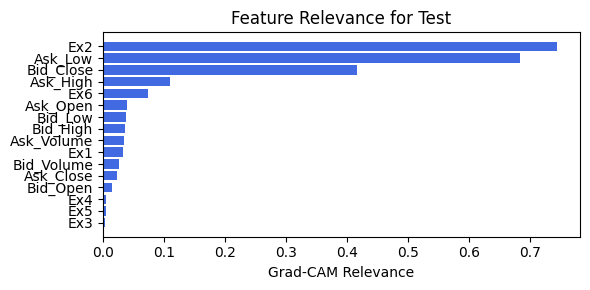

cnn_bottleneck_dim: 10
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.52e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 50/50 [01:41<00:00,  2.03s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 9 epoch
tensor(0.7030, device='cuda:0')
[[125  58]
 [ 51 133]]
M_KAN Relevance: 0.18610353767871857
CNN Relevance: 0.8138964772224426
[('Bid_Close', 0.45607823), ('Ask_Low', 0.30659178), ('Bid_Low', 0.27381077), ('Ask_Open', 0.2686929), ('Bid_Open', 0.20891532), ('Ask_High', 0.19742921), ('Bid_High', 0.19113427), ('Ask_Close', 0.18581939), ('Bid_Volume', 0.16253178), ('Ask_Volume', 0.110266164)]


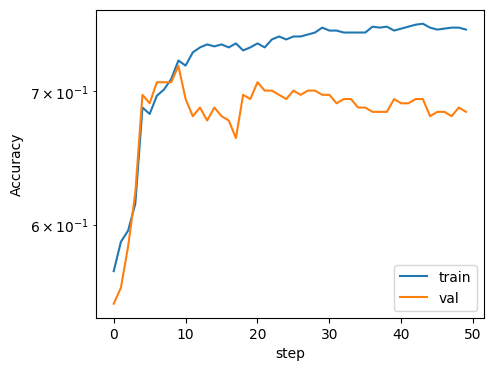

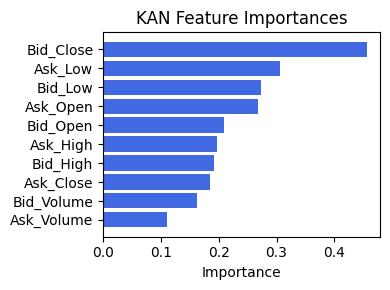

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.20758095449718522), ('Ex2', 0.1641470514046287), ('Bid_Close', 0.054855886860737925), ('Ex6', 0.01276370221930054), ('Ex4', 0.0032875944456791035), ('Ex5', 0.0032875944456791035), ('Ex3', 0.0015199981497889968), ('Ex1', 4.3142409310029055e-05), ('Ask_Close', 1.0716690801144945e-05), ('Ask_Volume', 3.8398823089268294e-06), ('Bid_Open', 0.0), ('Bid_High', 0.0), ('Bid_Low', 0.0), ('Bid_Volume', 0.0), ('Ask_Open', 0.0), ('Ask_High', 0.0)]


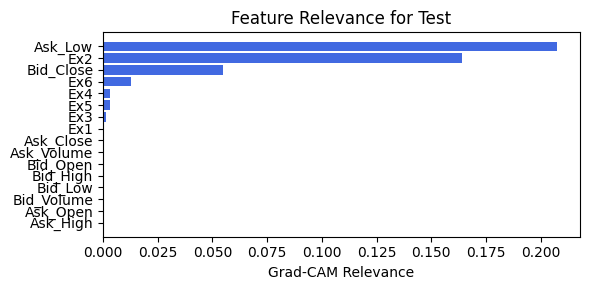

cnn_bottleneck_dim: 12
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.53e-01 | val_acc_hybrid: 6.80e-01 |: 100%|█████| 50/50 [01:39<00:00,  1.99s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 10 epoch
tensor(0.6866, device='cuda:0')
[[140  43]
 [ 72 112]]
M_KAN Relevance: 0.32705429196357727
CNN Relevance: 0.6729457378387451
[('Bid_Close', 0.5626264), ('Ask_Close', 0.3931246), ('Bid_Low', 0.17767662), ('Ask_Open', 0.16671863), ('Ask_High', 0.15459192), ('Ask_Low', 0.14162321), ('Bid_Volume', 0.13456962), ('Bid_High', 0.10144849), ('Ask_Volume', 0.09513442), ('Bid_Open', 0.0870582)]


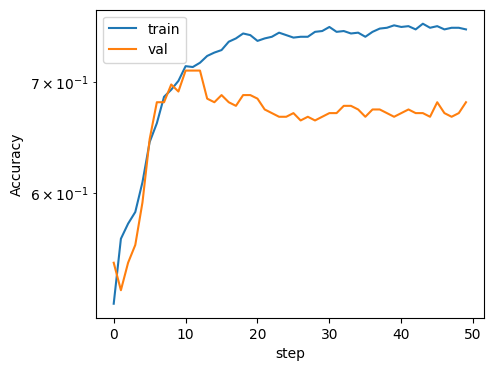

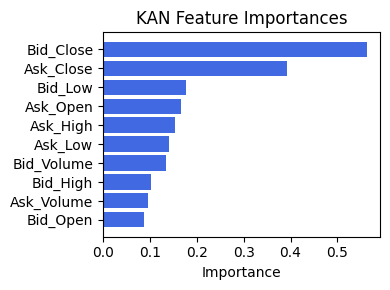

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.43696920515598897), ('Ex2', 0.32937434169892676), ('Bid_Close', 0.32095461486704263), ('Ask_High', 0.21998143979736504), ('Ask_Open', 0.13667713118462038), ('Bid_Low', 0.07825928472733627), ('Bid_High', 0.07535418919325687), ('Bid_Volume', 0.07508226541871438), ('Ask_Volume', 0.04839520994549298), ('Ask_Close', 0.04634983024053334), ('Ex1', 0.0444170883704454), ('Bid_Open', 0.038221727282047396), ('Ex6', 0.002972088595855626), ('Ex3', 0.0011391735176380713), ('Ex4', 0.0003038548156416059), ('Ex5', 0.0003038548156416059)]


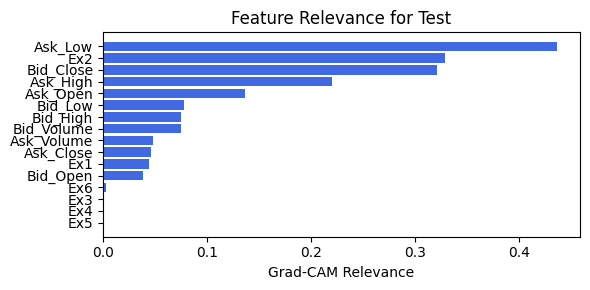

In [108]:
for cnn_bottleneck_dim in [1, 2, 4, 6, 8, 10, 12]:
    print(f"cnn_bottleneck_dim: {cnn_bottleneck_dim}")
    train_and_plot_relevance(Model4_1, kan_neurons=4, kan_grid=3, lamb=1e-06, steps=50, 
                             cnn_bottleneck_dim=cnn_bottleneck_dim, filename=filename_1, opt_col_val=cnn_bottleneck_dim)

## 1.1 width=[10, 3], grid=5, lamb=0.0001

cnn_bottleneck_dim: 1
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.84e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 50/50 [01:37<00:00,  1.96s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 5 epoch
tensor(0.7166, device='cuda:0')
[[133  50]
 [ 54 130]]
M_KAN Relevance: 0.9989519119262695
CNN Relevance: 0.0010480389464646578
[('Bid_Close', 3.2848763), ('Bid_High', 2.9024134), ('Ask_Close', 2.4679108), ('Ask_High', 1.8991703), ('Bid_Low', 0.57679784), ('Bid_Open', 0.48331565), ('Ask_Open', 0.35954958), ('Ask_Low', 0.35433254), ('Ask_Volume', 0.2900409), ('Bid_Volume', 0.27369076)]


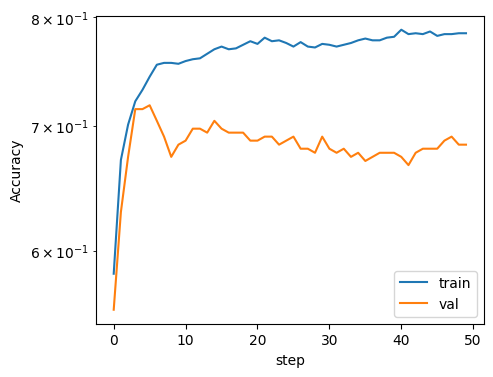

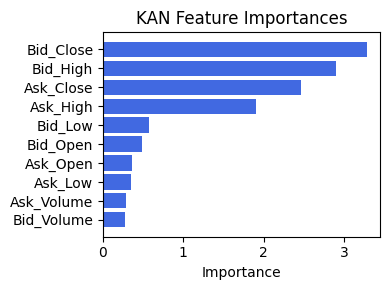

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.592544735208844), ('Ex5', 0.592544735208844), ('Ex6', 0.4776114438551323), ('Ex1', 0.4220418805470284), ('Ask_Volume', 0.2610119302541983), ('Ex3', 0.22220427624130118), ('Ask_Close', 0.17068442059027372), ('Ask_High', 0.1398914234966645), ('Ask_Open', 0.1221202721220393), ('Ex2', 0.10555395848268126), ('Bid_Volume', 0.09143102078394691), ('Bid_Low', 0.050743199667524753), ('Bid_High', 0.049884565134135604), ('Ask_Low', 0.0327798485207505), ('Bid_Open', 0.028030630463352985), ('Bid_Close', 0.014358170529843181)]


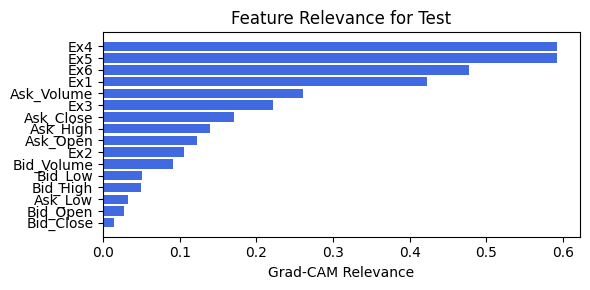

cnn_bottleneck_dim: 2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.78e-01 | val_acc_hybrid: 6.70e-01 |: 100%|█████| 50/50 [01:40<00:00,  2.01s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 7 epoch
tensor(0.7112, device='cuda:0')
[[131  52]
 [ 54 130]]
M_KAN Relevance: 0.9331668019294739
CNN Relevance: 0.06683314591646194
[('Bid_Close', 2.5452433), ('Ask_Close', 2.3860614), ('Ask_High', 1.2366347), ('Bid_High', 1.2166615), ('Ask_Open', 0.97026813), ('Bid_Open', 0.9462074), ('Ask_Low', 0.6220879), ('Bid_Low', 0.36308068), ('Bid_Volume', 0.33719724), ('Ask_Volume', 0.17893831)]


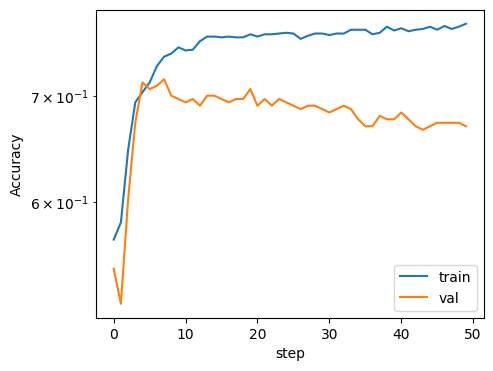

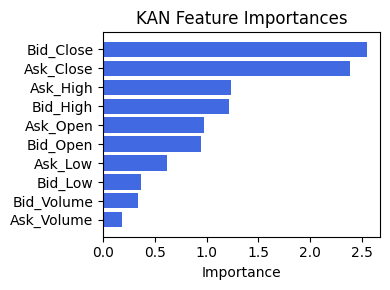

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.47184621638108337), ('Ask_Volume', 0.4375131945519097), ('Ask_Close', 0.40035965527110917), ('Ask_High', 0.3809870510724975), ('Ask_Open', 0.34394667933032685), ('Bid_Volume', 0.3042520263539348), ('Bid_Low', 0.24171666252840443), ('Bid_High', 0.2414018401739058), ('Bid_Open', 0.239102477395567), ('Bid_Close', 0.23823292127604867), ('Ex4', 0.16570495998826923), ('Ex5', 0.16570495998826923), ('Ex6', 0.10972345141790381), ('Ex3', 0.10724699537825519), ('Ex2', 0.09706051859811801), ('Ask_Low', 0.08253241992207899)]


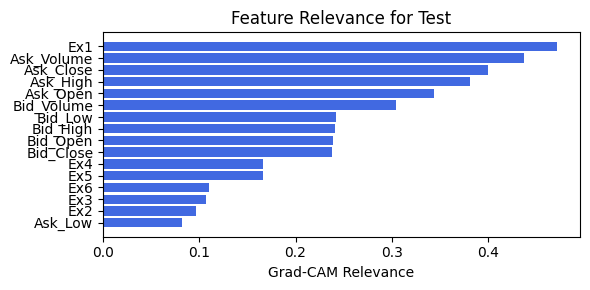

cnn_bottleneck_dim: 3
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.77e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 50/50 [01:42<00:00,  2.05s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.4150e-01 at 7 epoch
tensor(0.7166, device='cuda:0')
[[117  66]
 [ 38 146]]
M_KAN Relevance: 0.35631391406059265
CNN Relevance: 0.6436861157417297
[('Ask_Close', 0.702947), ('Bid_Close', 0.5913045), ('Bid_Open', 0.5258508), ('Ask_Open', 0.52023864), ('Ask_Volume', 0.3894895), ('Ask_High', 0.29279605), ('Bid_Volume', 0.2223486), ('Bid_High', 0.17897364), ('Bid_Low', 0.15662333), ('Ask_Low', 0.08349846)]


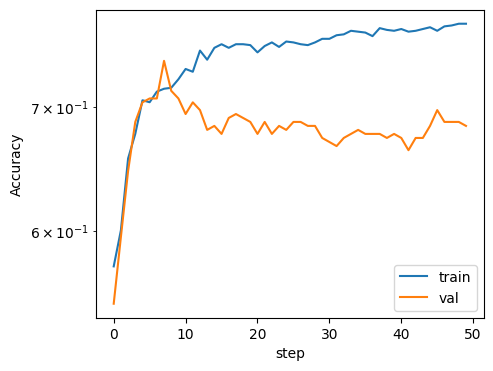

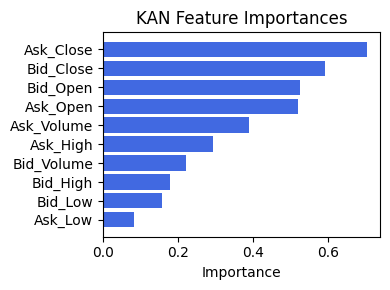

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.6968363573105704), ('Ask_Volume', 0.6933465437419276), ('Ex1', 0.646439604409171), ('Ask_Open', 0.5493735795769566), ('Ask_Close', 0.5149285505279615), ('Bid_Low', 0.43721034153737637), ('Bid_High', 0.43440721165617213), ('Bid_Volume', 0.4173933203644259), ('Ask_Low', 0.37326891343198126), ('Bid_Open', 0.3352368131548938), ('Ex2', 0.29896787987712375), ('Bid_Close', 0.2050844137518786), ('Ex3', 0.05780033577850205), ('Ex4', 0.03248941923682933), ('Ex5', 0.03248941923682933), ('Ex6', 0.004451464271525458)]


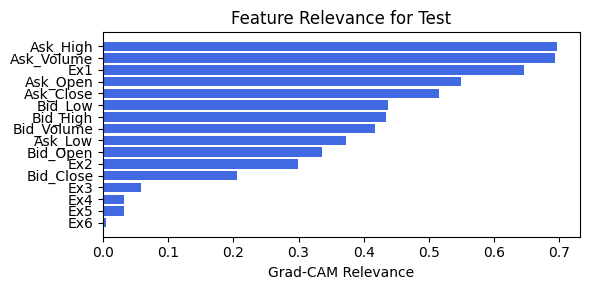

cnn_bottleneck_dim: 6
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.61e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 50/50 [01:41<00:00,  2.03s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 11 epoch
tensor(0.7084, device='cuda:0')
[[122  61]
 [ 46 138]]
M_KAN Relevance: 0.3141912519931793
CNN Relevance: 0.6858087778091431
[('Ask_Close', 0.5456842), ('Bid_Close', 0.4999246), ('Ask_Open', 0.49934804), ('Bid_Open', 0.46729374), ('Bid_High', 0.3180735), ('Ask_Low', 0.28458115), ('Bid_Volume', 0.2469267), ('Ask_High', 0.24143295), ('Bid_Low', 0.22287594), ('Ask_Volume', 0.14536446)]


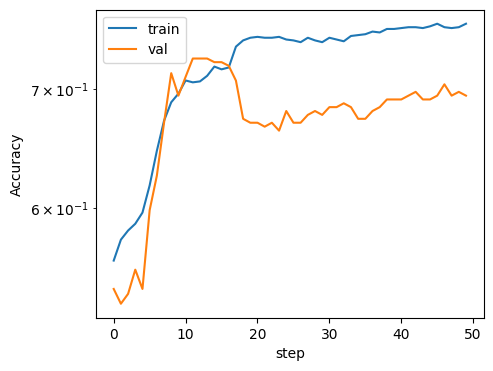

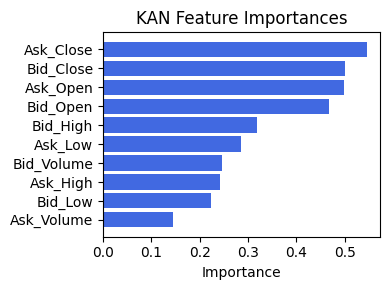

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.4804867391933862), ('Bid_Close', 0.3751647323395356), ('Ask_Low', 0.319376548557423), ('Ex6', 0.12123499635335157), ('Bid_Low', 0.09325391865460385), ('Bid_High', 0.08847685668683694), ('Ask_Close', 0.05385866560605266), ('Bid_Open', 0.05380883860379486), ('Ask_Volume', 0.0492660609721517), ('Ex1', 0.04925699964893997), ('Ask_High', 0.04784493714832661), ('Ask_Open', 0.04640203792495083), ('Bid_Volume', 0.044961643873893765), ('Ex4', 0.03926402743510383), ('Ex5', 0.03926402743510383), ('Ex3', 0.02726703342503921)]


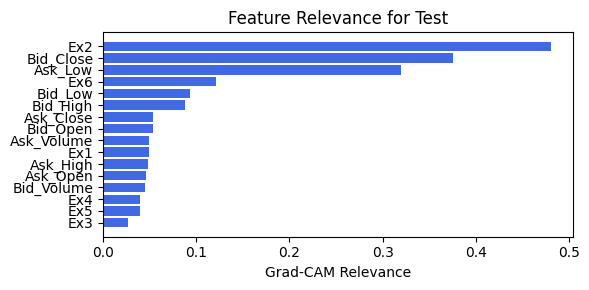

cnn_bottleneck_dim: 9
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.56e-01 | val_acc_hybrid: 6.67e-01 |: 100%|█████| 50/50 [01:42<00:00,  2.05s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 19 epoch
tensor(0.6921, device='cuda:0')
[[135  48]
 [ 65 119]]
M_KAN Relevance: 0.3235875070095062
CNN Relevance: 0.6764125823974609
[('Ask_Close', 0.7203135), ('Bid_Close', 0.55499023), ('Bid_Open', 0.5341184), ('Ask_Open', 0.48914632), ('Bid_Volume', 0.2709819), ('Ask_Volume', 0.24443695), ('Ask_High', 0.19666448), ('Ask_Low', 0.17658834), ('Bid_High', 0.15899578), ('Bid_Low', 0.14929634)]


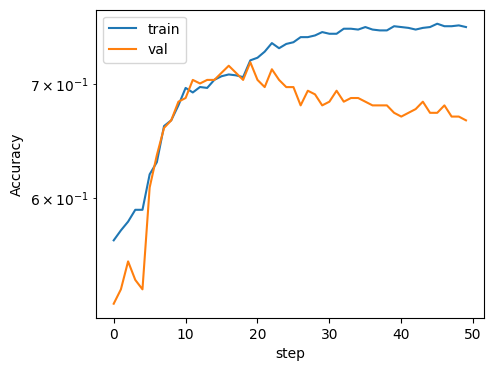

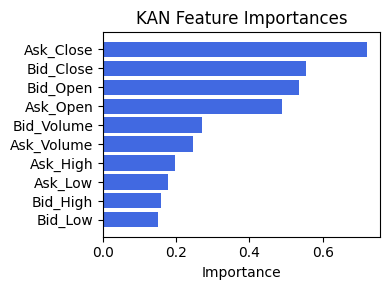

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5673319257685422), ('Ex4', 0.4963760829920188), ('Ex5', 0.4963760829920188), ('Ask_Low', 0.3949923152766985), ('Ex3', 0.3669773496234439), ('Bid_Close', 0.16355166551354136), ('Ex6', 0.16211362566138499), ('Bid_Volume', 0.024370072593015418), ('Ask_Close', 0.02087532312424323), ('Bid_Open', 0.01939972506824796), ('Ex1', 0.018995986611909696), ('Ask_Open', 0.012785275635018955), ('Ask_Volume', 0.0120271665024462), ('Ask_High', 0.008189859653490644), ('Bid_Low', 0.008066353942610181), ('Bid_High', 0.007643714098942438)]


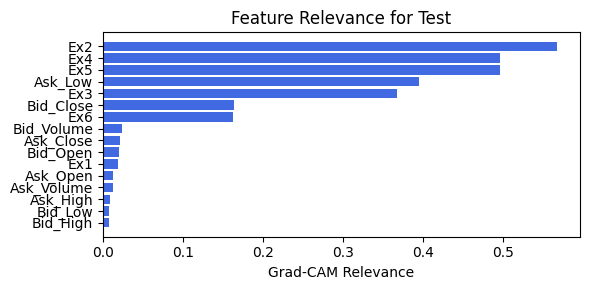

cnn_bottleneck_dim: 12
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.63e-01 | val_acc_hybrid: 6.73e-01 |: 100%|█████| 50/50 [01:41<00:00,  2.03s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 32 epoch
tensor(0.6948, device='cuda:0')
[[132  51]
 [ 61 123]]
M_KAN Relevance: 0.25880780816078186
CNN Relevance: 0.7411922812461853
[('Ask_Close', 0.25164396), ('Ask_Volume', 0.24733952), ('Bid_Close', 0.23160407), ('Bid_Open', 0.15981504), ('Ask_Open', 0.15298502), ('Bid_High', 0.13566554), ('Bid_Volume', 0.1341015), ('Bid_Low', 0.12739766), ('Ask_High', 0.09447446), ('Ask_Low', 0.05473932)]


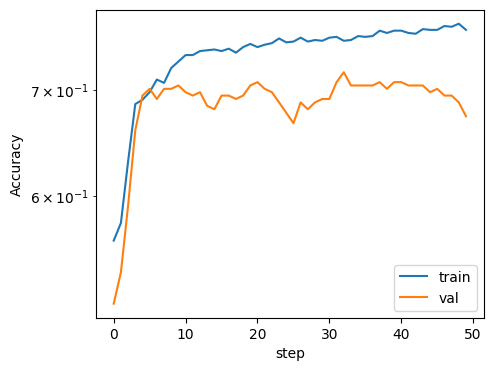

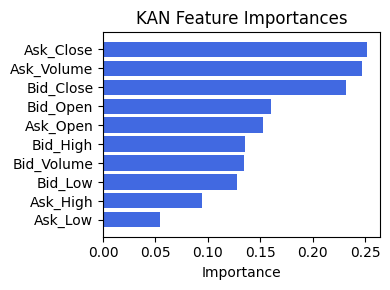

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.5740702024341259), ('Ex2', 0.5405000069366428), ('Ask_Volume', 0.3130848917462076), ('Ex1', 0.2909051288199695), ('Ask_High', 0.2309342971263829), ('Ask_Close', 0.18741381788284997), ('Bid_Close', 0.13722116935824372), ('Ask_Open', 0.10832000929395152), ('Bid_Volume', 0.10775954459046999), ('Ex3', 0.07530092974196566), ('Ex4', 0.0705387674719958), ('Ex5', 0.0705387674719958), ('Bid_High', 0.060953983570428756), ('Bid_Low', 0.05946890781793052), ('Bid_Open', 0.0543825210270593), ('Ex6', 0.025330965701244487)]


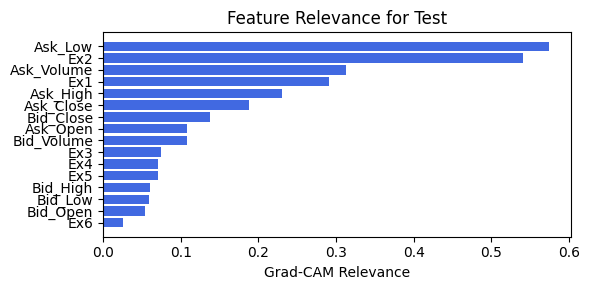

In [109]:
for cnn_bottleneck_dim in [1, 2, 3, 6, 9, 12]:
    print(f"cnn_bottleneck_dim: {cnn_bottleneck_dim}")
    train_and_plot_relevance(Model4_1, kan_neurons=3, kan_grid=5, lamb=0.0001, steps=50, 
                             cnn_bottleneck_dim=cnn_bottleneck_dim, filename=filename_1, opt_col_val=cnn_bottleneck_dim)

## 1.2 width=[10, 3], grid=3, lamb=1e-05

cnn_bottleneck_dim: 1
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.64e-01 | val_acc_hybrid: 6.77e-01 |: 100%|█████| 50/50 [01:42<00:00,  2.04s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.4490e-01 at 2 epoch
tensor(0.7221, device='cuda:0')
[[122  61]
 [ 41 143]]
M_KAN Relevance: 0.9999867677688599
CNN Relevance: 1.3199925888329744e-05
[('Bid_Close', 2.3241282), ('Ask_Close', 2.1318839), ('Ask_High', 1.6193169), ('Bid_Open', 1.375907), ('Bid_High', 1.1724477), ('Ask_Open', 0.89645946), ('Ask_Low', 0.6483247), ('Bid_Low', 0.3463286), ('Bid_Volume', 0.11694547), ('Ask_Volume', 0.10738006)]


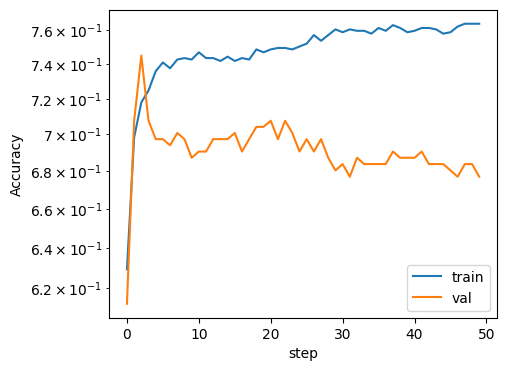

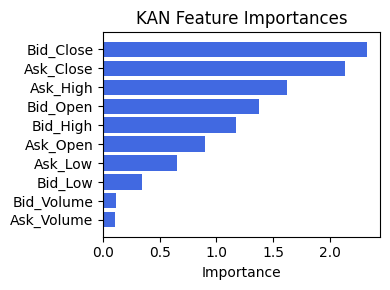

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.41275198894174775), ('Ex5', 0.41275198894174775), ('Ex6', 0.3713042582981593), ('Ex3', 0.1552374010146862), ('Ex1', 0.08659784773450943), ('Ex2', 0.07065609447472178), ('Ask_High', 0.05790001347030409), ('Ask_Open', 0.04900455174552738), ('Ask_Volume', 0.044255507683599676), ('Ask_Low', 0.03715134365515839), ('Ask_Close', 0.022522901528710323), ('Bid_Low', 0.02181998664025999), ('Bid_High', 0.02157902788898682), ('Bid_Volume', 0.019948032797867436), ('Bid_Close', 0.0170176685175526), ('Bid_Open', 0.00833212145705224)]


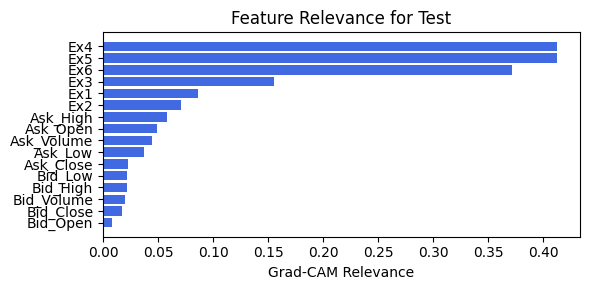

cnn_bottleneck_dim: 2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.66e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 50/50 [01:41<00:00,  2.03s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 10 epoch
tensor(0.7139, device='cuda:0')
[[119  64]
 [ 41 143]]
M_KAN Relevance: 0.3046587407588959
CNN Relevance: 0.6953412890434265
[('Ask_Close', 0.5726287), ('Bid_Close', 0.476869), ('Bid_Open', 0.38343212), ('Ask_High', 0.37049657), ('Ask_Low', 0.30512434), ('Ask_Open', 0.298869), ('Bid_High', 0.28109527), ('Bid_Low', 0.15488014), ('Bid_Volume', 0.11555972), ('Ask_Volume', 0.06552371)]


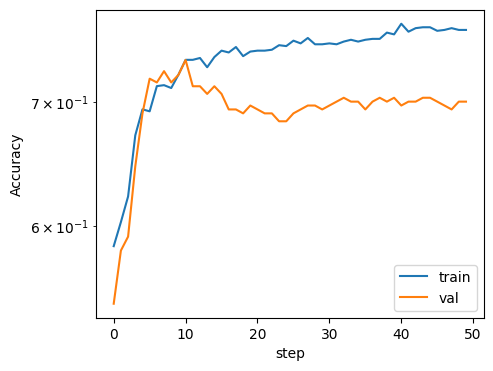

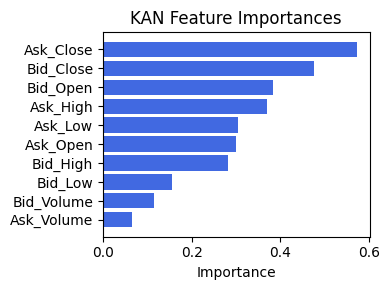

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.8180222044970424), ('Ask_Close', 0.7638800170384246), ('Ex1', 0.7260076860752597), ('Ask_High', 0.6717133952315982), ('Ask_Open', 0.6016677961956294), ('Bid_Volume', 0.5625316924999192), ('Bid_High', 0.5027052659101797), ('Bid_Low', 0.49954113794861194), ('Bid_Open', 0.47436888185751624), ('Ask_Low', 0.14648845436234517), ('Bid_Close', 0.1414732863309832), ('Ex3', 0.1261071913263785), ('Ex2', 0.09921321674623658), ('Ex4', 0.04351331205813456), ('Ex5', 0.04351331205813456), ('Ex6', 0.0013680084515236095)]


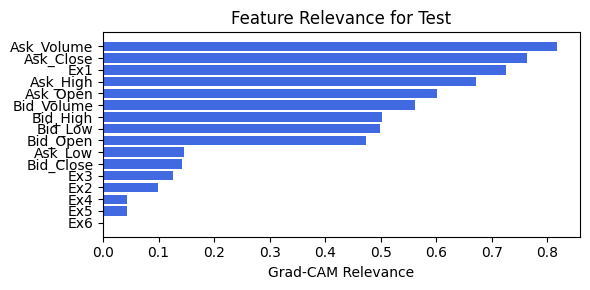

cnn_bottleneck_dim: 3
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.48e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 50/50 [01:38<00:00,  1.98s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 4 epoch
tensor(0.7003, device='cuda:0')
[[123  60]
 [ 50 134]]
M_KAN Relevance: 0.8100773096084595
CNN Relevance: 0.18992270529270172
[('Bid_Close', 2.4221177), ('Ask_Close', 2.3474042), ('Bid_Open', 1.8975401), ('Ask_High', 1.6016014), ('Ask_Open', 1.0827537), ('Bid_Low', 0.9196624), ('Bid_High', 0.8298743), ('Ask_Low', 0.62910223), ('Ask_Volume', 0.4131516), ('Bid_Volume', 0.17573635)]


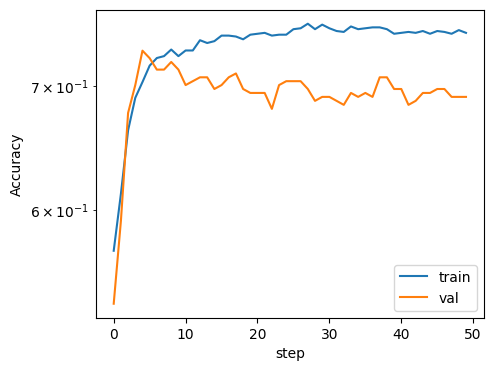

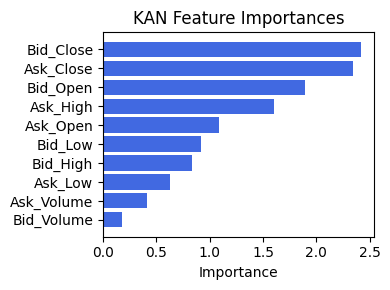

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.49015717469257297), ('Ask_Volume', 0.3772212686611128), ('Ask_High', 0.3569955458279004), ('Ask_Open', 0.3563926250030037), ('Ask_Close', 0.2921976902083131), ('Ex4', 0.2866820860059351), ('Ex5', 0.2866820860059351), ('Ex2', 0.2661418127535515), ('Bid_Volume', 0.2518772466817718), ('Ex6', 0.2364803139039135), ('Bid_Low', 0.21772601552991505), ('Bid_High', 0.2142248798686883), ('Bid_Open', 0.17025461637244335), ('Ex3', 0.15128150124003545), ('Ask_Low', 0.14139989167813474), ('Bid_Close', 0.07669151302589464)]


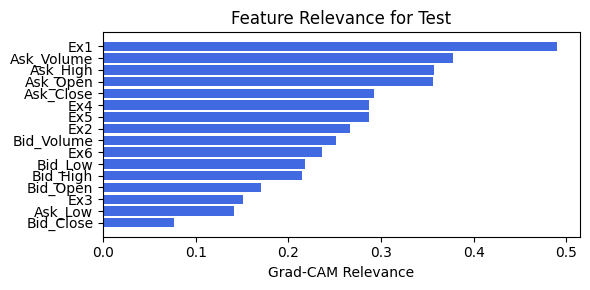

cnn_bottleneck_dim: 6
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.56e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 50/50 [01:41<00:00,  2.02s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 7 epoch
tensor(0.7166, device='cuda:0')
[[131  52]
 [ 52 132]]
M_KAN Relevance: 0.6815657615661621
CNN Relevance: 0.3184342682361603
[('Bid_Close', 2.7089336), ('Ask_Close', 2.442549), ('Ask_High', 1.925051), ('Bid_High', 1.6339043), ('Bid_Open', 0.8968722), ('Bid_Low', 0.6222234), ('Ask_Open', 0.5416307), ('Ask_Low', 0.28086573), ('Bid_Volume', 0.13506116), ('Ask_Volume', 0.12505811)]


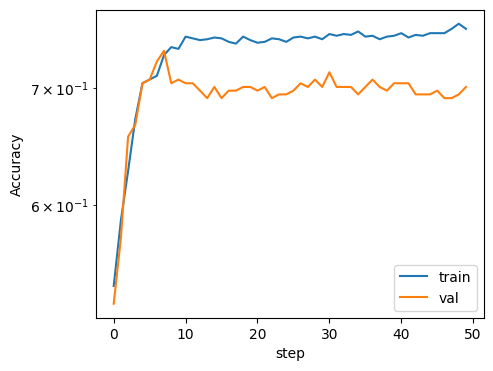

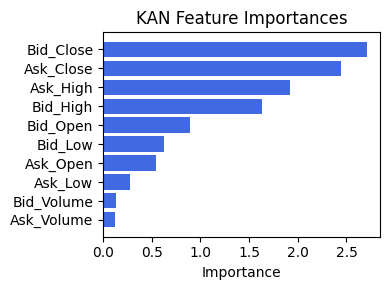

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.8875646982595771), ('Ask_Volume', 0.8049504605885748), ('Ask_Close', 0.5889481201321293), ('Ask_High', 0.5654593718311767), ('Ask_Open', 0.515210813698067), ('Bid_Volume', 0.37775808930072213), ('Ex2', 0.34288503505715884), ('Ex4', 0.3408743196677122), ('Ex5', 0.3408743196677122), ('Bid_Low', 0.31509570833752365), ('Bid_High', 0.31505810834305), ('Bid_Open', 0.2366640259429612), ('Ex3', 0.2040776209119068), ('Ask_Low', 0.201836273135054), ('Ex6', 0.17968586375505463), ('Bid_Close', 0.10482845334900792)]


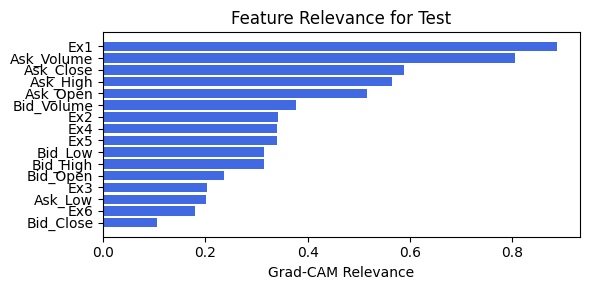

cnn_bottleneck_dim: 9
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.67e-01 | val_acc_hybrid: 6.77e-01 |: 100%|█████| 50/50 [01:41<00:00,  2.03s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 8 epoch
tensor(0.7193, device='cuda:0')
[[133  50]
 [ 53 131]]
M_KAN Relevance: 0.4309161305427551
CNN Relevance: 0.5690838098526001
[('Bid_Close', 0.4138111), ('Ask_Close', 0.38660344), ('Ask_Low', 0.31406474), ('Bid_Open', 0.30806097), ('Ask_High', 0.30490077), ('Ask_Open', 0.19045512), ('Bid_High', 0.18553418), ('Bid_Low', 0.15767545), ('Bid_Volume', 0.078541264), ('Ask_Volume', 0.075696446)]


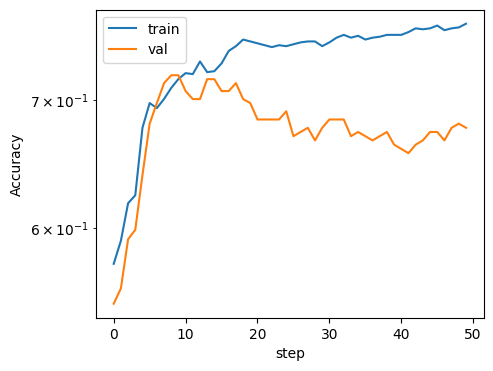

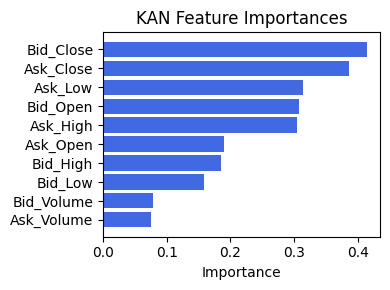

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.6015114652688237), ('Ex5', 0.6015114652688237), ('Ex3', 0.5288404766698583), ('Ask_Close', 0.35846760329899535), ('Ex1', 0.2758696874101172), ('Ask_Volume', 0.26379988893006273), ('Bid_Volume', 0.21874383243774026), ('Ask_High', 0.1808364197006893), ('Ask_Open', 0.16424319024257392), ('Ask_Low', 0.1283247487187165), ('Ex6', 0.10821564251107192), ('Bid_Open', 0.08408498992142331), ('Ex2', 0.06994125679933517), ('Bid_Close', 0.04608291166015978), ('Bid_Low', 0.038061549783651324), ('Bid_High', 0.03749303770193206)]


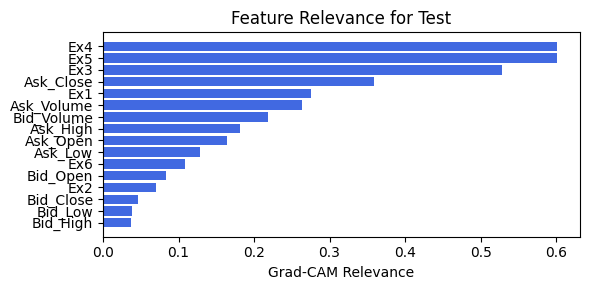

cnn_bottleneck_dim: 12
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.59e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 50/50 [00:16<00:00,  2.98it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 8 epoch
tensor(0.7166, device='cuda:0')
[[121  62]
 [ 42 142]]
M_KAN Relevance: 0.07720813155174255
CNN Relevance: 0.9227918386459351
[('Bid_Open', 0.61180747), ('Ask_Close', 0.606009), ('Ask_High', 0.48716855), ('Ask_Low', 0.46042764), ('Bid_Low', 0.43208504), ('Bid_Close', 0.36701024), ('Bid_High', 0.3052668), ('Ask_Volume', 0.30401266), ('Ask_Open', 0.22630954), ('Bid_Volume', 0.07028155)]


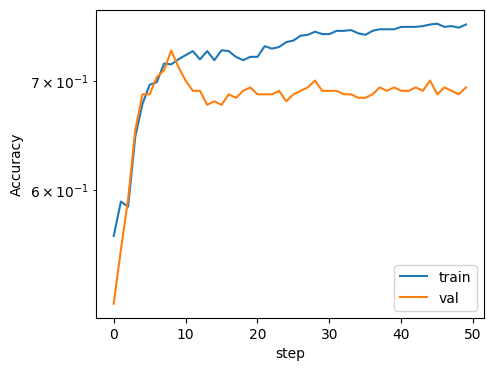

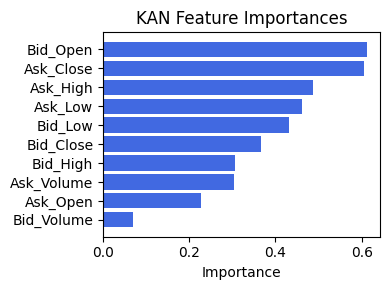

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.6609248997648666), ('Bid_Close', 0.4600950445705766), ('Ex2', 0.25056321698187645), ('Bid_Low', 0.15105356315369095), ('Bid_High', 0.1493673339641237), ('Bid_Open', 0.059207769547514895), ('Ask_High', 0.01680497263180097), ('Ask_Volume', 0.013415570870772695), ('Ask_Open', 0.00852637759559567), ('Bid_Volume', 0.004168032932447965), ('Ask_Close', 0.004131298774234159), ('Ex1', 0.0001333223843607006), ('Ex3', 0.0), ('Ex4', 0.0), ('Ex5', 0.0), ('Ex6', 0.0)]


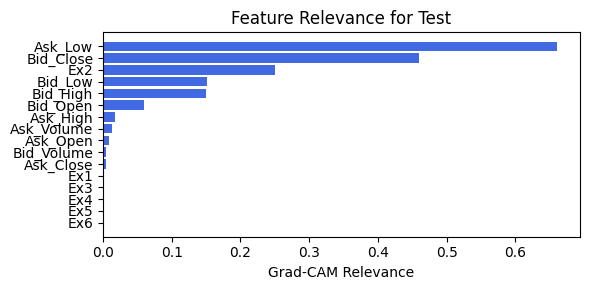

In [110]:
for cnn_bottleneck_dim in [1, 2, 3, 6, 9, 12]:
    print(f"cnn_bottleneck_dim: {cnn_bottleneck_dim}")
    train_and_plot_relevance(Model4_1, kan_neurons=3, kan_grid=3, lamb=1e-05, steps=50, 
                             cnn_bottleneck_dim=cnn_bottleneck_dim, filename=filename_1, opt_col_val=cnn_bottleneck_dim)

## 1.3 width=[10, 2], grid=4, lamb=1e-07

cnn_bottleneck_dim: 1
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.61e-01 | val_acc_hybrid: 6.67e-01 |: 100%|█████| 50/50 [00:16<00:00,  3.02it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 3 epoch
tensor(0.7302, device='cuda:0')
[[137  46]
 [ 53 131]]
M_KAN Relevance: 0.9999960660934448
CNN Relevance: 4.004722086392576e-06
[('Bid_Close', 4.832175), ('Bid_High', 3.8717344), ('Ask_High', 3.5946906), ('Ask_Close', 2.8478591), ('Ask_Open', 1.1021006), ('Ask_Low', 0.8152766), ('Bid_Low', 0.5597947), ('Bid_Open', 0.48665452), ('Bid_Volume', 0.30253616), ('Ask_Volume', 0.29968122)]


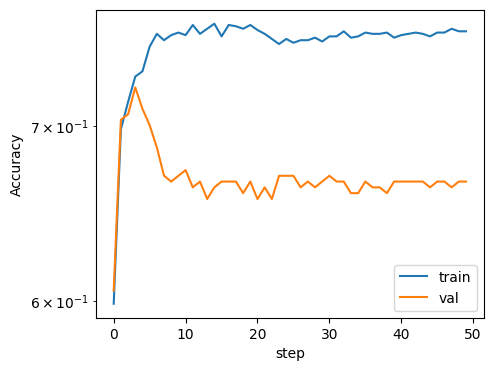

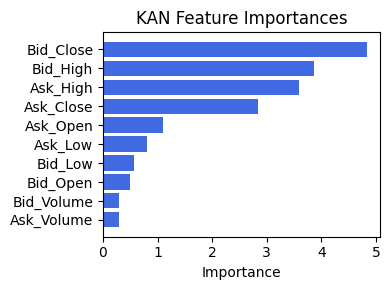

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.5758245569889812), ('Ex5', 0.5758245569889812), ('Ex6', 0.44113517944429487), ('Ex3', 0.22142115224162953), ('Ex1', 0.13387023813753549), ('Ex2', 0.10871037821485585), ('Ask_High', 0.08937609487485042), ('Ask_Open', 0.08418603146349643), ('Ask_Volume', 0.07292373224820724), ('Ask_Low', 0.051721656633013945), ('Ask_Close', 0.04366908541579835), ('Bid_Volume', 0.035278727178974456), ('Bid_Low', 0.03483089151367487), ('Bid_High', 0.034583663470934146), ('Bid_Close', 0.02375359667253513), ('Bid_Open', 0.01565022456947567)]


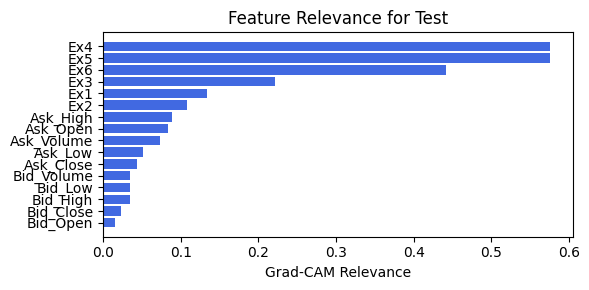

cnn_bottleneck_dim: 2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.77e-01 | val_acc_hybrid: 6.77e-01 |: 100%|█████| 50/50 [00:16<00:00,  3.11it/s]

saving model version 0.1
✅ Best validation Accuracy: 6.9728e-01 at 3 epoch
tensor(0.7193, device='cuda:0')
[[121  62]
 [ 41 143]]
M_KAN Relevance: 0.7978538870811462
CNN Relevance: 0.20214609801769257
[('Bid_Close', 3.738836), ('Ask_Close', 1.6509674), ('Ask_Open', 1.5719123), ('Bid_Low', 1.204567), ('Bid_Open', 1.098395), ('Ask_High', 1.0246326), ('Bid_High', 1.0139912), ('Ask_Low', 0.24365091), ('Bid_Volume', 0.23655), ('Ask_Volume', 0.20259178)]


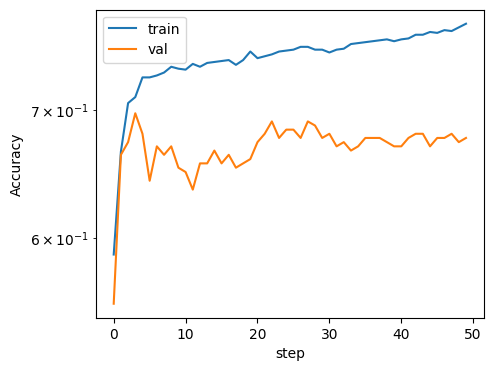

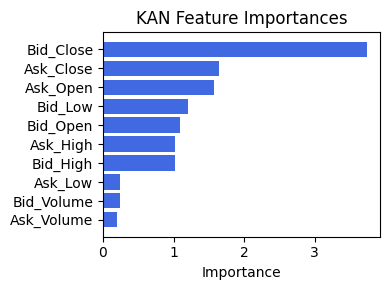

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.4853743109072537), ('Ex1', 0.421875297063987), ('Bid_Volume', 0.40340135891208734), ('Bid_Open', 0.369011033191574), ('Ask_Volume', 0.36020268196942157), ('Ask_High', 0.34837175171017154), ('Ask_Open', 0.34333135816044597), ('Ex3', 0.31697481172286196), ('Bid_Low', 0.29967504017266694), ('Bid_High', 0.2972553562646832), ('Ex4', 0.2432525114471769), ('Ex5', 0.2432525114471769), ('Ex6', 0.0996458154128565), ('Bid_Close', 0.09717342108031303), ('Ex2', 0.07541347210795418), ('Ask_Low', 0.07350979797314974)]


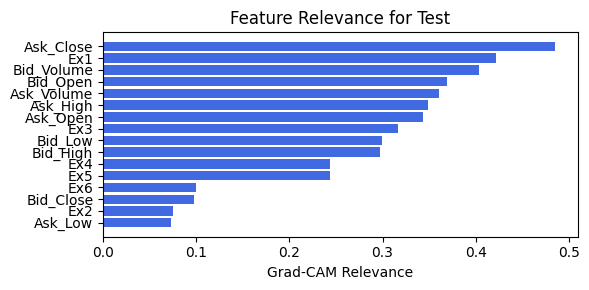

cnn_bottleneck_dim: 4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.72e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 50/50 [00:17<00:00,  2.88it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 5 epoch
tensor(0.7112, device='cuda:0')
[[132  51]
 [ 55 129]]
M_KAN Relevance: 0.8745891451835632
CNN Relevance: 0.125410795211792
[('Bid_Close', 5.1626363), ('Bid_High', 3.1706748), ('Ask_High', 3.046911), ('Ask_Close', 2.8604515), ('Bid_Low', 1.1895822), ('Ask_Open', 0.88328815), ('Bid_Open', 0.4747672), ('Ask_Low', 0.4239293), ('Ask_Volume', 0.20585334), ('Bid_Volume', 0.16085686)]


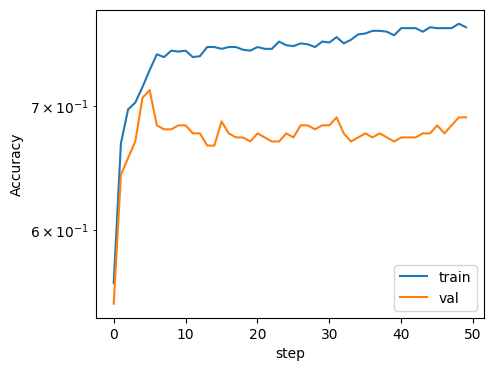

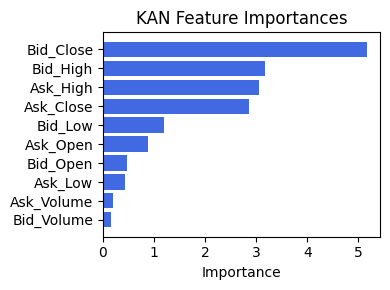

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.9775200944992762), ('Ask_Volume', 0.8407437263782408), ('Ask_Close', 0.756143404003385), ('Ask_High', 0.6588501082048104), ('Ask_Open', 0.6299291819699454), ('Bid_Volume', 0.5383524619022572), ('Ex4', 0.4554841403902714), ('Ex5', 0.4554841403902714), ('Bid_Low', 0.3977874148769015), ('Bid_High', 0.39663941660840113), ('Bid_Open', 0.3753717817183411), ('Ex3', 0.30557230553445114), ('Ex2', 0.28517502083440566), ('Ex6', 0.26171908659571197), ('Ask_Low', 0.15542458068599738), ('Bid_Close', 0.08218556040598521)]


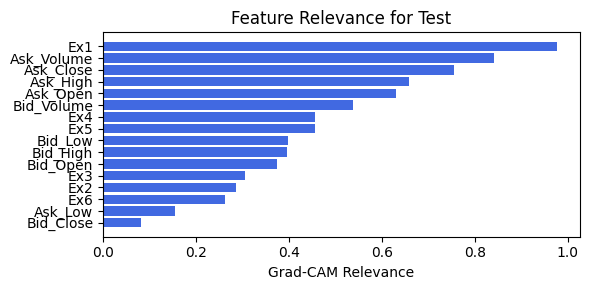

cnn_bottleneck_dim: 6
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.61e-01 | val_acc_hybrid: 6.63e-01 |: 100%|█████| 50/50 [00:16<00:00,  3.02it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0408e-01 at 3 epoch
tensor(0.7139, device='cuda:0')
[[119  64]
 [ 41 143]]
M_KAN Relevance: 0.8842511773109436
CNN Relevance: 0.1157488077878952
[('Bid_Close', 3.887919), ('Ask_Close', 1.881518), ('Ask_High', 1.8666973), ('Bid_High', 1.8336829), ('Ask_Open', 1.1198543), ('Bid_Low', 0.9887954), ('Bid_Open', 0.71198195), ('Bid_Volume', 0.432779), ('Ask_Low', 0.3619601), ('Ask_Volume', 0.2196306)]


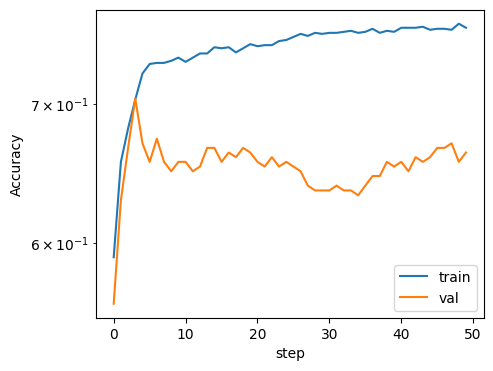

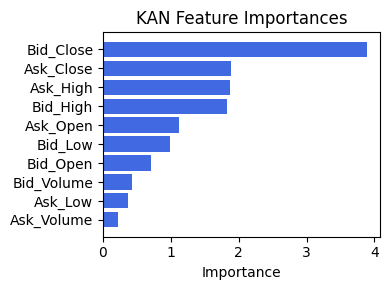

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex3', 0.22543999089603123), ('Ex4', 0.22309782180671228), ('Ex5', 0.22309782180671228), ('Ex6', 0.08949949767450709), ('Bid_Volume', 0.0820898944448568), ('Ask_Close', 0.064081338924411), ('Bid_Open', 0.05136198774586008), ('Bid_Close', 0.04659479348440905), ('Ask_Open', 0.03383548074032051), ('Ex1', 0.02433864602803859), ('Bid_Low', 0.01479015730173747), ('Bid_High', 0.013603783818310742), ('Ask_High', 0.008250268949621643), ('Ex2', 0.007388827529905886), ('Ask_Volume', 0.006161671492197533), ('Ask_Low', 0.005225053679084665)]


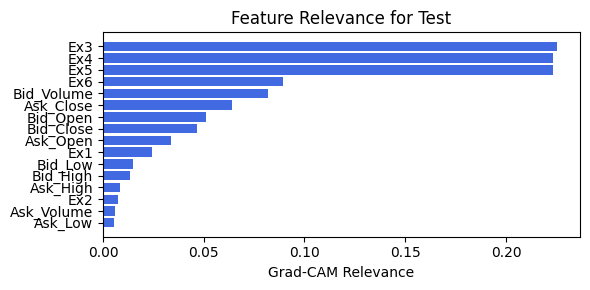

cnn_bottleneck_dim: 8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_1


 train_acc_hybrid: 7.66e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 50/50 [00:16<00:00,  3.10it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0408e-01 at 14 epoch
tensor(0.7084, device='cuda:0')
[[130  53]
 [ 54 130]]
M_KAN Relevance: 0.33447128534317017
CNN Relevance: 0.6655287146568298
[('Bid_Close', 2.6218855), ('Ask_High', 2.2597828), ('Bid_High', 2.166758), ('Ask_Close', 1.5718912), ('Ask_Open', 0.69474816), ('Bid_Low', 0.54001945), ('Bid_Open', 0.49471828), ('Ask_Low', 0.30165094), ('Ask_Volume', 0.09333281), ('Bid_Volume', 0.082715645)]


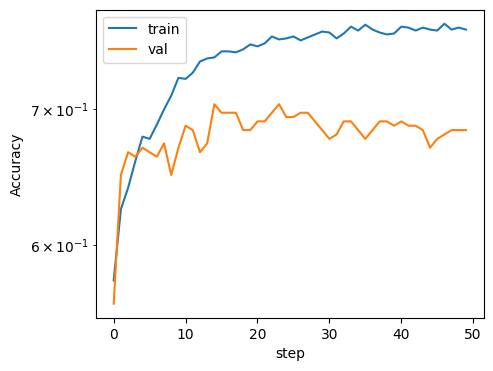

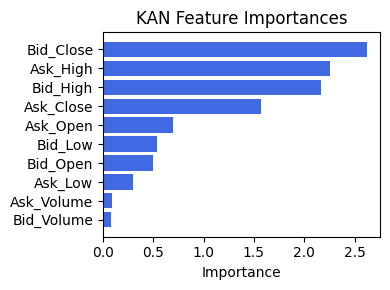

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_Open', 0.3596583653202697), ('Ask_High', 0.3395476089092606), ('Bid_High', 0.323979582995359), ('Bid_Low', 0.3222793294345244), ('Bid_Volume', 0.2225120639566799), ('Ask_Open', 0.20705126177415514), ('Ask_Close', 0.11796076421493319), ('Ask_Low', 0.10268808114570781), ('Bid_Close', 0.08680884626107824), ('Ask_Volume', 0.07727440334323601), ('Ex2', 0.021678579469133367), ('Ex1', 0.006261513076709299), ('Ex6', 0.0003537608777510373), ('Ex3', 0.0), ('Ex4', 0.0), ('Ex5', 0.0)]


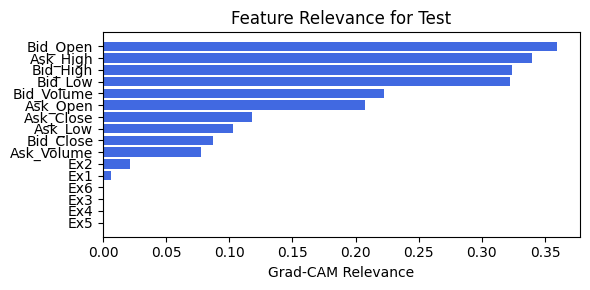

In [111]:
for cnn_bottleneck_dim in [1, 2, 4, 6, 8]:
    print(f"cnn_bottleneck_dim: {cnn_bottleneck_dim}")
    train_and_plot_relevance(Model4_1, kan_neurons=2, kan_grid=4, lamb=1e-07, steps=50, 
                             cnn_bottleneck_dim=cnn_bottleneck_dim, filename=filename_1, opt_col_val=cnn_bottleneck_dim)

# Option 2: Multiply CNN output by factor

In [112]:
create_csv_with_header(filename_2, columns_opt2)

## 2.0. width=[10, 3], grid=3, lamb=1e-05

alpha: 0.75
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.61e-01 | val_acc_hybrid: 6.12e-01 |: 100%|█████| 40/40 [00:53<00:00,  1.33s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 11 epoch
tensor(0.6785, device='cuda:0')
[[ 98  85]
 [ 33 151]]
M_KAN Relevance: 0.024225542321801186
CNN Relevance: 0.9757744669914246
[('Ask_High', 0.5716537), ('Bid_Low', 0.5567765), ('Bid_Open', 0.50279295), ('Ask_Close', 0.4648068), ('Ask_Low', 0.3635568), ('Ask_Volume', 0.27927065), ('Bid_Close', 0.24894594), ('Ask_Open', 0.20054352), ('Bid_High', 0.18898706), ('Bid_Volume', 0.14654443)]


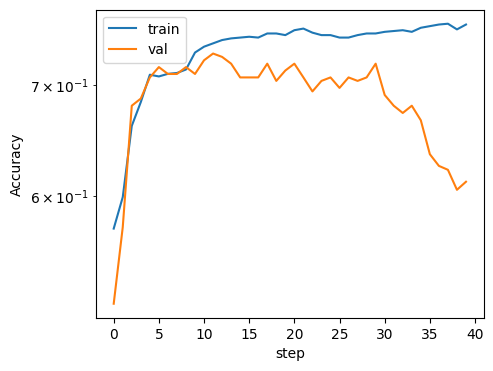

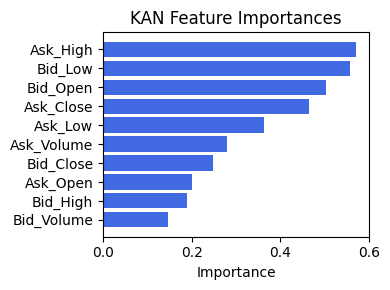

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.7648875963765042), ('Ask_Volume', 0.6757401484001316), ('Ex2', 0.48416673556751794), ('Ask_High', 0.45823441234313217), ('Ask_Close', 0.4250103860575838), ('Ask_Open', 0.4126575073953375), ('Ask_Low', 0.3403696670867528), ('Ex4', 0.30232393800481466), ('Ex5', 0.30232393800481466), ('Bid_High', 0.29811575467766793), ('Bid_Low', 0.2979722296519646), ('Bid_Volume', 0.2835392890341341), ('Ex3', 0.27917143418288687), ('Bid_Close', 0.22360648037688122), ('Bid_Open', 0.17814403722108385), ('Ex6', 0.07338073474421021)]


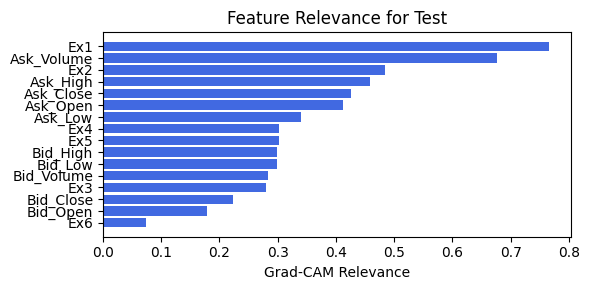

alpha: 0.5
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.87e-01 |: 100%|█████| 40/40 [00:53<00:00,  1.34s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 5 epoch
tensor(0.6866, device='cuda:0')
[[109  74]
 [ 41 143]]
M_KAN Relevance: 0.03795062005519867
CNN Relevance: 0.9620493650436401
[('Ask_Close', 0.85681504), ('Bid_Open', 0.58665717), ('Bid_Close', 0.5200666), ('Bid_High', 0.40291196), ('Ask_Open', 0.3542485), ('Ask_Low', 0.34834132), ('Ask_High', 0.33079106), ('Bid_Low', 0.3137509), ('Ask_Volume', 0.26090056), ('Bid_Volume', 0.12743303)]


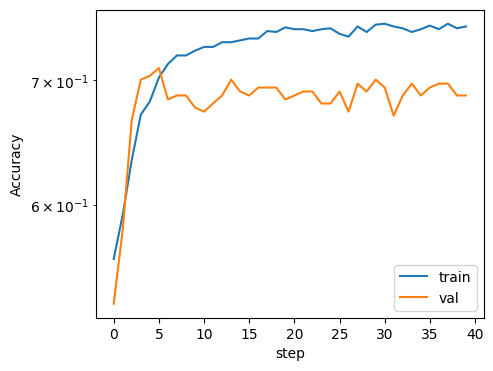

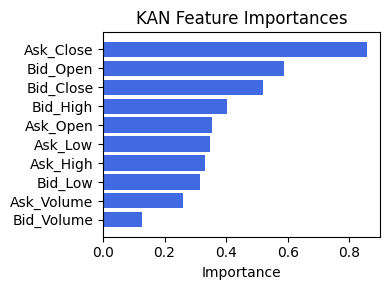

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.7217058964499985), ('Bid_Close', 0.48320014433737346), ('Ask_Low', 0.4812370236019023), ('Bid_Low', 0.28201527042918373), ('Bid_High', 0.2808990781316001), ('Ex1', 0.2735908985726677), ('Ask_Volume', 0.21857761853278765), ('Ask_Open', 0.19622936847475422), ('Ex6', 0.15579315047579176), ('Ask_High', 0.15020819957174897), ('Bid_Open', 0.11908654139278207), ('Ask_Close', 0.11025678214567272), ('Ex4', 0.08242300040804215), ('Ex5', 0.08242300040804215), ('Bid_Volume', 0.05473728830309468), ('Ex3', 0.03838262993243475)]


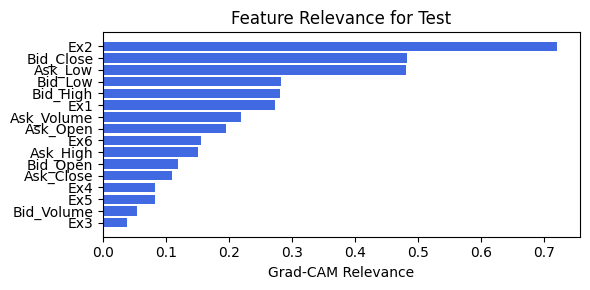

alpha: 0.25
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.44e-01 | val_acc_hybrid: 6.77e-01 |: 100%|█████| 40/40 [00:53<00:00,  1.35s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 3 epoch
tensor(0.6948, device='cuda:0')
[[133  50]
 [ 62 122]]
M_KAN Relevance: 0.16332381963729858
CNN Relevance: 0.8366761803627014
[('Ask_Close', 0.44753632), ('Bid_Open', 0.39193553), ('Ask_Low', 0.34761438), ('Ask_High', 0.314272), ('Bid_Low', 0.31050488), ('Bid_High', 0.2768802), ('Bid_Close', 0.22330885), ('Ask_Open', 0.1766099), ('Ask_Volume', 0.15917479), ('Bid_Volume', 0.1532925)]


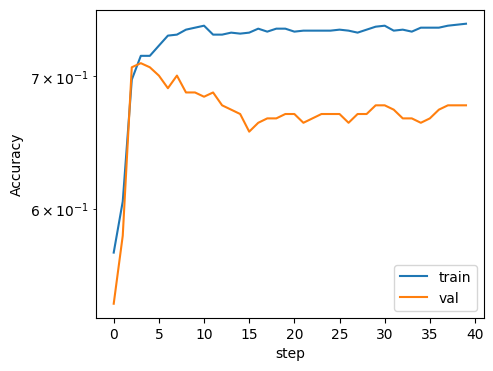

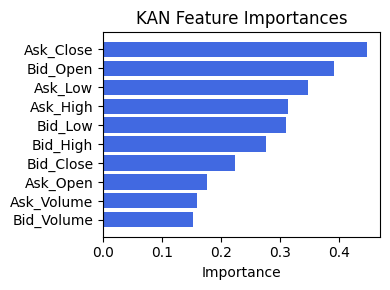

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.7112423443439739), ('Ex2', 0.6624338707346749), ('Bid_Close', 0.5029663252399991), ('Ask_Close', 0.06927667599557125), ('Ask_Volume', 0.06024359681418962), ('Ex1', 0.058678460096793214), ('Bid_Volume', 0.04877376246119517), ('Ask_High', 0.046340892300750725), ('Ask_Open', 0.0411815609965646), ('Ex3', 0.0378973905595999), ('Bid_Open', 0.03522585357008984), ('Ex4', 0.033283554687487005), ('Ex5', 0.033283554687487005), ('Bid_Low', 0.02831959829073176), ('Bid_High', 0.026761258939631303), ('Ex6', 0.007656626249945599)]


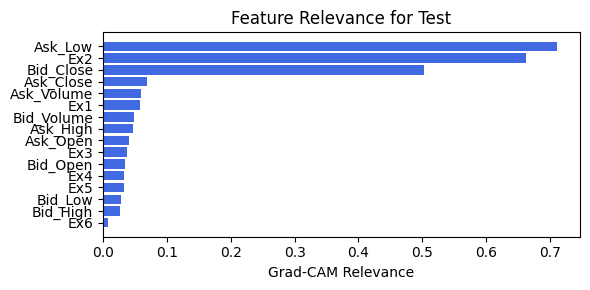

alpha: 0.1
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.63e-01 | val_acc_hybrid: 6.26e-01 |: 100%|█████| 40/40 [00:52<00:00,  1.31s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 8 epoch
tensor(0.7166, device='cuda:0')
[[117  66]
 [ 38 146]]
M_KAN Relevance: 0.06086143106222153
CNN Relevance: 0.9391385316848755
[('Ask_Close', 0.9954026), ('Bid_Open', 0.6503756), ('Bid_High', 0.6449366), ('Ask_High', 0.548591), ('Bid_Volume', 0.39403933), ('Ask_Open', 0.38983628), ('Ask_Low', 0.37047863), ('Bid_Low', 0.33038896), ('Bid_Close', 0.32233447), ('Ask_Volume', 0.2472811)]


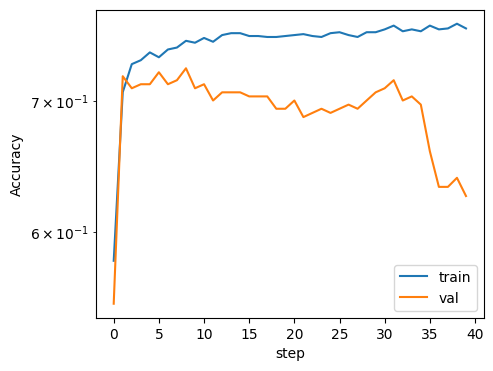

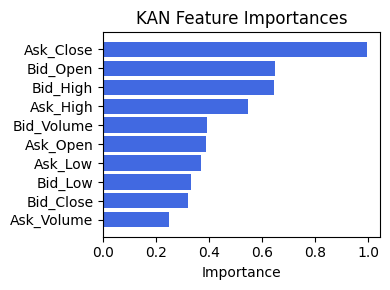

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.673247123148536), ('Ex5', 0.673247123148536), ('Ex1', 0.6472623939080321), ('Ex2', 0.517054138730511), ('Ask_Volume', 0.49303580020879184), ('Ex3', 0.4540755189866416), ('Ex6', 0.2458195558559449), ('Ask_Low', 0.22417899392323495), ('Ask_Open', 0.22178839786534582), ('Ask_High', 0.2172785314273886), ('Ask_Close', 0.21680860871916044), ('Bid_Volume', 0.14912162213727428), ('Bid_Low', 0.12053079764188676), ('Bid_High', 0.11914698415824748), ('Bid_Close', 0.10532995493706995), ('Bid_Open', 0.0662841405334904)]


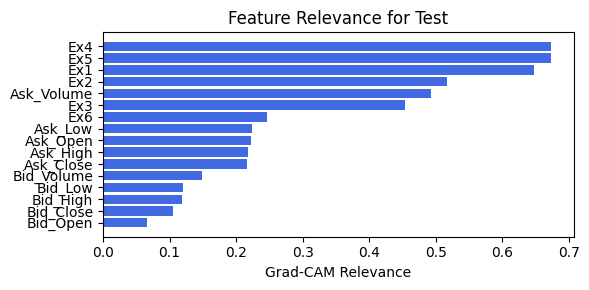

alpha: 0.05
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.72e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 40/40 [00:52<00:00,  1.32s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 4 epoch
tensor(0.6894, device='cuda:0')
[[117  66]
 [ 48 136]]
M_KAN Relevance: 0.08522320538759232
CNN Relevance: 0.9147768020629883
[('Ask_Low', 0.30148798), ('Bid_Open', 0.2615133), ('Bid_Low', 0.258137), ('Ask_Volume', 0.25291115), ('Ask_High', 0.24827453), ('Bid_Close', 0.24079208), ('Bid_High', 0.22164004), ('Ask_Close', 0.21692805), ('Bid_Volume', 0.14219809), ('Ask_Open', 0.108049005)]


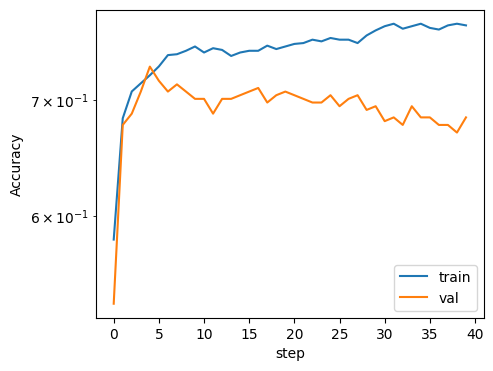

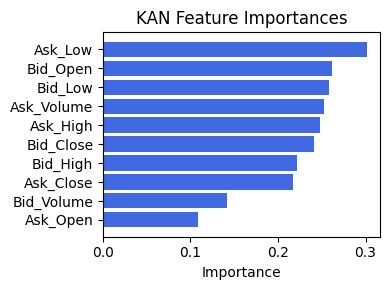

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.519408076424729), ('Ex6', 0.4532010672202877), ('Ex1', 0.21786552282400448), ('Ask_Close', 0.17090365198302548), ('Ask_Volume', 0.15837091034814277), ('Ask_Low', 0.156088206753362), ('Ask_Open', 0.1515030752293631), ('Bid_Open', 0.14258281088149308), ('Bid_Low', 0.1373640228282059), ('Bid_High', 0.13665276903800896), ('Bid_Volume', 0.12562915008376818), ('Ask_High', 0.12061644468076214), ('Ex4', 0.118008506671641), ('Ex5', 0.118008506671641), ('Bid_Close', 0.10573951897156417), ('Ex3', 0.05381097473441725)]


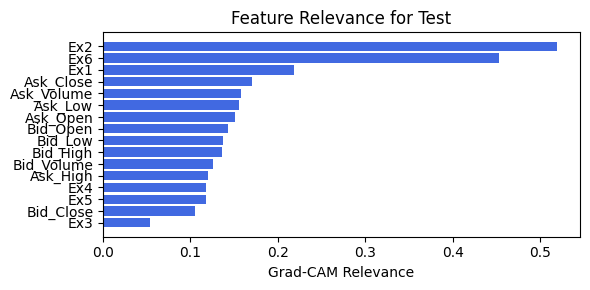

In [114]:
for alpha in [.75, .5, .25, .1, .05]:
    print(f"alpha: {alpha}")
    train_and_plot_relevance(Model4_2, kan_neurons=3, kan_grid=3, lamb=1e-05, steps=40, 
                             alpha=alpha, filename=filename_2, opt_col_val=alpha)

## 2.1 width=[10, 2], grid=4, lamb=1e-07

alpha: 0.75
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.89e-01 | val_acc_hybrid: 6.73e-01 |: 100%|█████| 40/40 [00:57<00:00,  1.43s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 6 epoch
tensor(0.7302, device='cuda:0')
[[118  65]
 [ 34 150]]
M_KAN Relevance: 0.01554377842694521
CNN Relevance: 0.9844562411308289
[('Bid_Close', 0.84352446), ('Ask_High', 0.62233555), ('Ask_Open', 0.49918517), ('Bid_Low', 0.47472718), ('Bid_High', 0.40167883), ('Ask_Volume', 0.35223544), ('Bid_Volume', 0.33752656), ('Bid_Open', 0.21581769), ('Ask_Close', 0.14847657), ('Ask_Low', 0.1310982)]


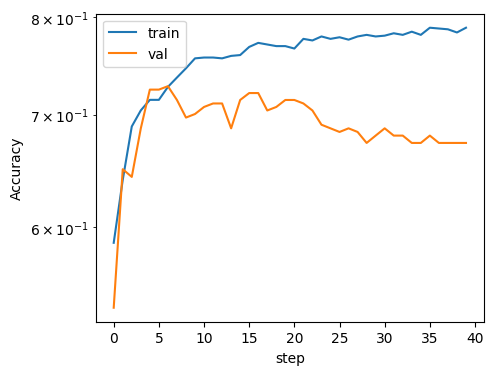

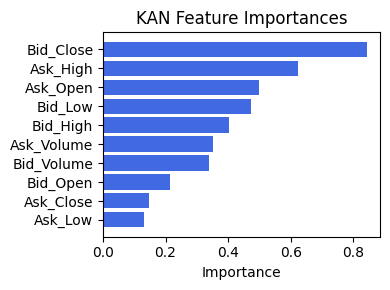

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.9138001716043547), ('Ask_Volume', 0.8844260988345912), ('Ask_High', 0.7180824636682178), ('Ask_Close', 0.7033618574287002), ('Ask_Open', 0.6277398677791497), ('Bid_Volume', 0.5082073032409359), ('Bid_Low', 0.5032008176197473), ('Bid_High', 0.5027079724323522), ('Bid_Open', 0.4433046390254264), ('Ex2', 0.3620082585531863), ('Ask_Low', 0.3193962969728403), ('Ex4', 0.19766538529796399), ('Ex5', 0.19766538529796399), ('Ex3', 0.19165639895806216), ('Bid_Close', 0.17710414701915406), ('Ex6', 0.07794600670424848)]


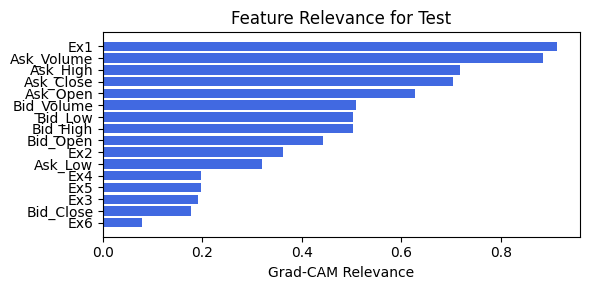

alpha: 0.5
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.78e-01 | val_acc_hybrid: 6.56e-01 |: 100%|█████| 40/40 [00:57<00:00,  1.43s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.0068e-01 at 23 epoch
tensor(0.6812, device='cuda:0')
[[131  52]
 [ 65 119]]
M_KAN Relevance: 0.08915602415800095
CNN Relevance: 0.9108439683914185
[('Bid_Close', 7.4450965), ('Bid_High', 5.009024), ('Ask_High', 4.2892427), ('Bid_Low', 2.9448698), ('Ask_Close', 2.8038466), ('Ask_Open', 1.6373065), ('Bid_Open', 1.1457777), ('Ask_Low', 0.8925499), ('Bid_Volume', 0.2899418), ('Ask_Volume', 0.1576682)]


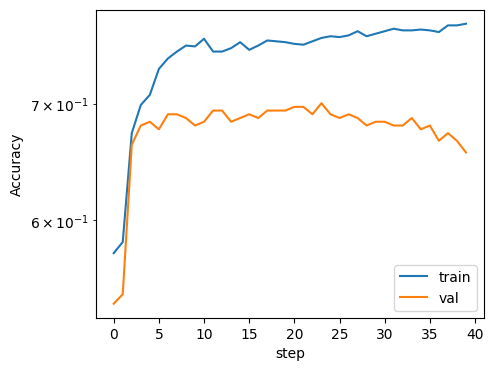

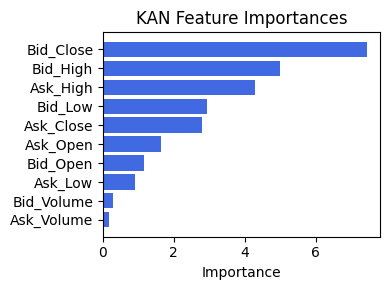

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.48597255649396576), ('Ex5', 0.48597255649396576), ('Ask_Close', 0.4221377590904647), ('Ex3', 0.40992050181122053), ('Ex1', 0.36471871552577784), ('Bid_Volume', 0.34597627526753116), ('Ask_Open', 0.31940438446118713), ('Ask_Volume', 0.318358018511977), ('Ask_High', 0.30900025286053784), ('Bid_Open', 0.2549144924353118), ('Ex6', 0.21328279870097228), ('Bid_High', 0.2046886119999154), ('Bid_Low', 0.20184096105143615), ('Ex2', 0.052901145826539216), ('Bid_Close', 0.030183482870074902), ('Ask_Low', 0.023429890159851106)]


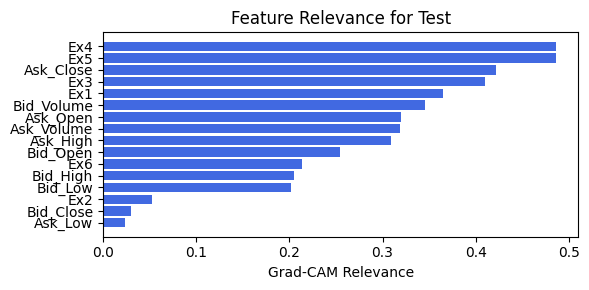

alpha: 0.25
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.82e-01 | val_acc_hybrid: 6.73e-01 |: 100%|█████| 40/40 [00:57<00:00,  1.43s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 3 epoch
tensor(0.7057, device='cuda:0')
[[110  73]
 [ 35 149]]
M_KAN Relevance: 0.09183668345212936
CNN Relevance: 0.9081633687019348
[('Bid_Close', 5.20032), ('Ask_Open', 3.2025156), ('Bid_Low', 2.6187677), ('Bid_Open', 2.0464087), ('Ask_High', 1.2427001), ('Ask_Close', 1.0838823), ('Bid_High', 0.7750951), ('Bid_Volume', 0.61406803), ('Ask_Volume', 0.37908953), ('Ask_Low', 0.2813689)]


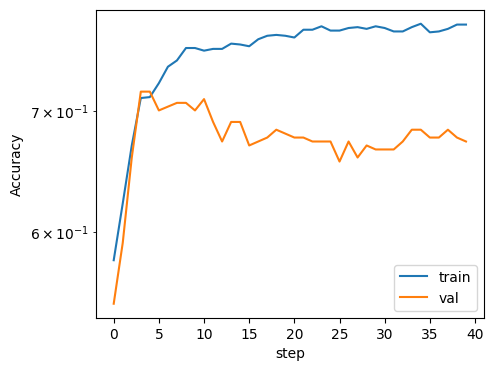

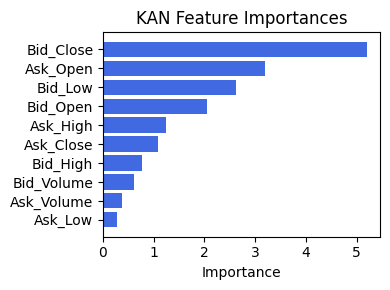

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.654188867623801), ('Ex1', 0.6303092839625507), ('Ask_Volume', 0.6106457260674581), ('Ask_Open', 0.6027994195585538), ('Ask_Close', 0.6021197790759603), ('Bid_Volume', 0.5654003583478465), ('Bid_High', 0.39138094706293347), ('Bid_Low', 0.3902485122553984), ('Bid_Open', 0.3777617957038242), ('Ex2', 0.2522271815843643), ('Ask_Low', 0.21102388677861647), ('Ex4', 0.19743128139325017), ('Ex5', 0.19743128139325017), ('Ex3', 0.1950196877097897), ('Bid_Close', 0.1529258955159029), ('Ex6', 0.10690828440055075)]


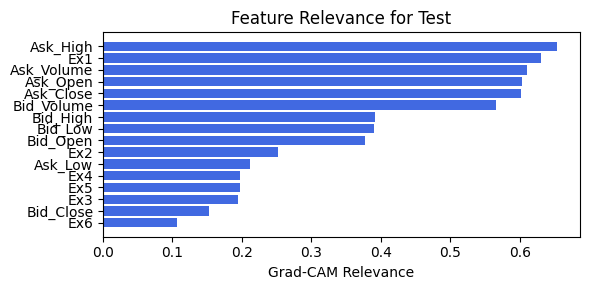

alpha: 0.1
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.69e-01 | val_acc_hybrid: 6.60e-01 |: 100%|█████| 40/40 [00:58<00:00,  1.45s/it]

saving model version 0.1
✅ Best validation Accuracy: 6.9388e-01 at 5 epoch
tensor(0.7003, device='cuda:0')
[[135  48]
 [ 62 122]]
M_KAN Relevance: 0.12647779285907745
CNN Relevance: 0.8735222220420837
[('Bid_Close', 5.017364), ('Ask_Open', 2.8560758), ('Bid_Low', 2.243968), ('Bid_Open', 1.8370442), ('Ask_Close', 1.194978), ('Ask_High', 0.7454695), ('Bid_Volume', 0.5179367), ('Bid_High', 0.38125885), ('Ask_Volume', 0.3376964), ('Ask_Low', 0.3241687)]


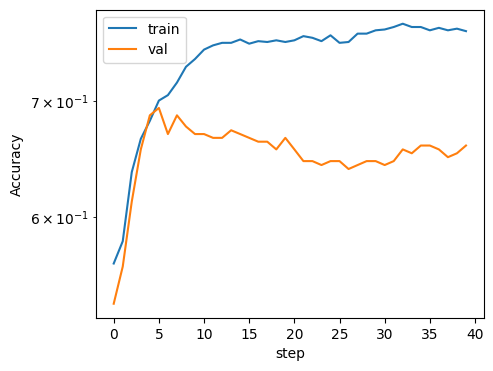

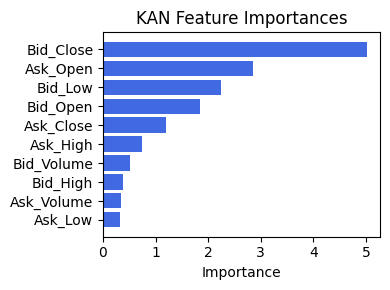

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex6', 0.2589282596416063), ('Bid_Open', 0.2019641003822045), ('Ex2', 0.16097926419819591), ('Ex3', 0.15785322845042735), ('Ask_Close', 0.14576231184027258), ('Bid_Volume', 0.14523070207663763), ('Ask_Open', 0.13028393315393166), ('Bid_High', 0.12993500068080668), ('Bid_Low', 0.12641962072388946), ('Ask_High', 0.12209586393967581), ('Ask_Low', 0.11999930637580601), ('Ex1', 0.10427339848039585), ('Bid_Close', 0.10036246619715129), ('Ask_Volume', 0.09749428186424797), ('Ex4', 0.09713666821087391), ('Ex5', 0.09713666821087391)]


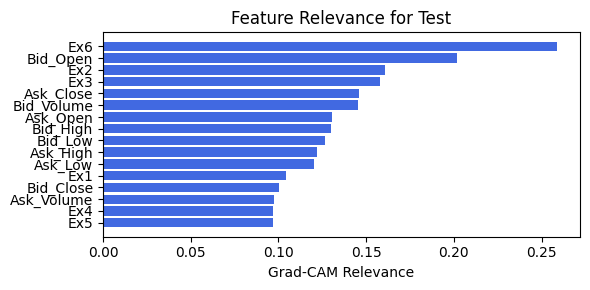

alpha: 0.05
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.81e-01 | val_acc_hybrid: 6.22e-01 |: 100%|█████| 40/40 [00:56<00:00,  1.41s/it]

saving model version 0.1
✅ Best validation Accuracy: 6.8367e-01 at 6 epoch
tensor(0.6757, device='cuda:0')
[[113  70]
 [ 49 135]]
M_KAN Relevance: 0.06688006222248077
CNN Relevance: 0.9331200122833252
[('Bid_Close', 3.8202627), ('Ask_Open', 2.1107967), ('Bid_Low', 2.05359), ('Bid_Open', 1.1391982), ('Ask_Close', 1.0637199), ('Ask_High', 0.8495815), ('Bid_High', 0.8133783), ('Ask_Volume', 0.4534514), ('Bid_Volume', 0.3566955), ('Ask_Low', 0.24256465)]


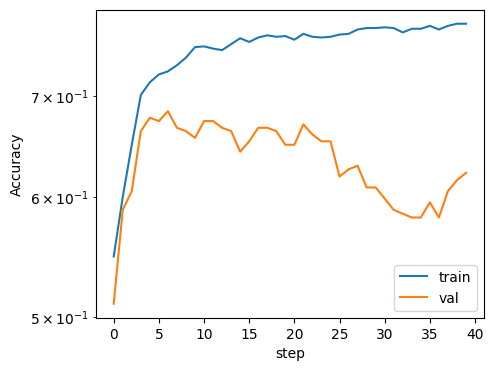

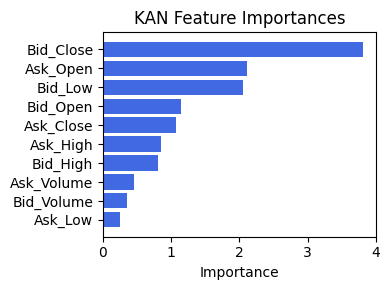

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.5126662401213471), ('Ex5', 0.5126662401213471), ('Ex2', 0.39028112738385634), ('Ex1', 0.36636518470800866), ('Ex3', 0.2894313230587814), ('Ask_Volume', 0.2885215987261208), ('Ex6', 0.22864466167355785), ('Ask_High', 0.16383828020087451), ('Ask_Close', 0.14985676418307264), ('Ask_Low', 0.14440346070057672), ('Ask_Open', 0.14424086878097925), ('Bid_Close', 0.10076515765552034), ('Bid_Volume', 0.08234187154442148), ('Bid_Low', 0.07963239612863196), ('Bid_High', 0.0793698179902617), ('Bid_Open', 0.042029229015842016)]


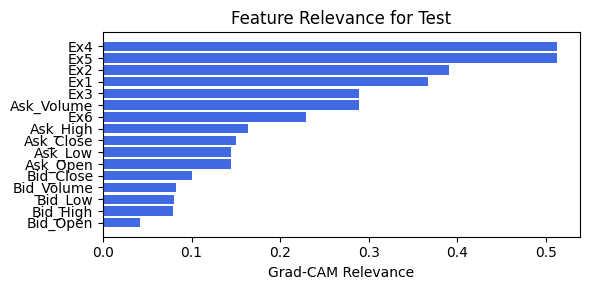

In [116]:
for alpha in [.75, .5, .25, .1, .05]:
    print(f"alpha: {alpha}")
    train_and_plot_relevance(Model4_2, kan_neurons=2, kan_grid=4, lamb=1e-07, steps=40, 
                             alpha=alpha, filename=filename_2, opt_col_val=alpha)

alpha: 0.9
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.66e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 40/40 [01:00<00:00,  1.52s/it]


saving model version 0.1
✅ Best validation Accuracy: 6.9728e-01 at 6 epoch
tensor(0.6812, device='cuda:0')
[[121  62]
 [ 55 129]]
M_KAN Relevance: 0.03564540669322014
CNN Relevance: 0.9643545746803284
[('Bid_Close', 4.4454927), ('Ask_High', 1.9100776), ('Bid_High', 1.8813167), ('Ask_Close', 1.8123363), ('Ask_Open', 1.6349299), ('Bid_Low', 1.2614795), ('Bid_Open', 0.96552986), ('Ask_Low', 0.5777339), ('Bid_Volume', 0.29886657), ('Ask_Volume', 0.1688438)]


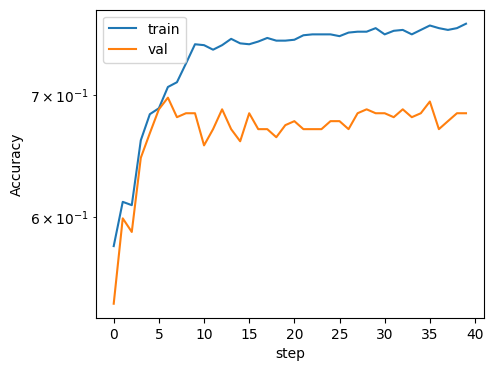

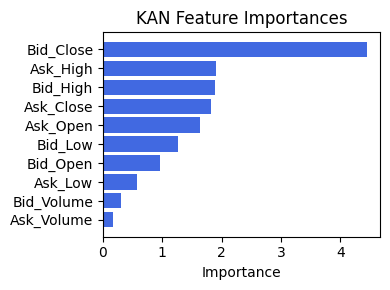

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex3', 0.4905056345218803), ('Ex4', 0.42301335846875193), ('Ex5', 0.42301335846875193), ('Ask_Close', 0.1545136178947087), ('Ex1', 0.11554327833006915), ('Bid_Volume', 0.114954875385305), ('Ask_Volume', 0.10928533764997604), ('Ask_High', 0.07619782704898037), ('Ask_Open', 0.06569814142333001), ('Bid_Open', 0.04661787600968317), ('Bid_Low', 0.028328385423108865), ('Bid_High', 0.02810865124669789), ('Ex6', 0.00965509769259013), ('Ex2', 0.008116805497100145), ('Ask_Low', 0.0072866968882881735), ('Bid_Close', 0.0023681341647614576)]


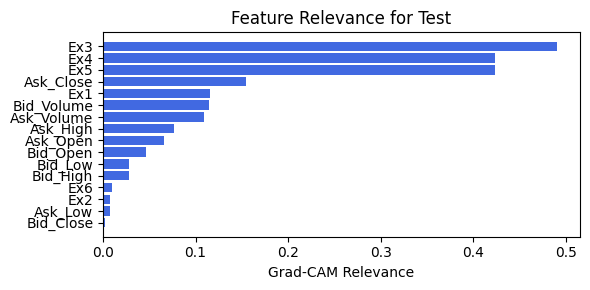

alpha: 0.85
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.81e-01 | val_acc_hybrid: 6.60e-01 |: 100%|█████| 40/40 [00:59<00:00,  1.48s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 5 epoch
tensor(0.7003, device='cuda:0')
[[114  69]
 [ 41 143]]
M_KAN Relevance: 0.01964050531387329
CNN Relevance: 0.9803594946861267
[('Ask_Open', 0.8739396), ('Bid_Close', 0.8547854), ('Ask_High', 0.7449949), ('Bid_Low', 0.69882387), ('Bid_Open', 0.50534743), ('Bid_High', 0.4711792), ('Bid_Volume', 0.26098183), ('Ask_Low', 0.15957525), ('Ask_Volume', 0.11211471), ('Ask_Close', 0.05459505)]


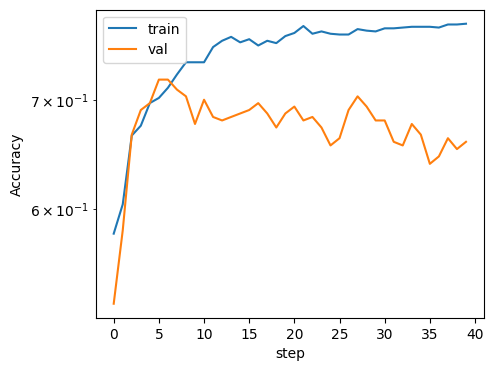

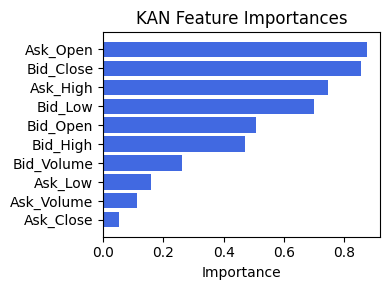

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.8639887063193061), ('Ex5', 0.8639887063193061), ('Ex1', 0.6870364858502426), ('Ask_Volume', 0.6589329669211436), ('Ex3', 0.6270437622265205), ('Ex2', 0.5736526445731804), ('Ask_High', 0.5120279195079729), ('Ask_Low', 0.48990781398170324), ('Ex6', 0.4123172907803299), ('Ask_Open', 0.4094660009061976), ('Ask_Close', 0.3403841263807457), ('Bid_Volume', 0.24571822072696975), ('Bid_Close', 0.16492678836149505), ('Bid_Low', 0.1474385186120443), ('Bid_High', 0.14723464310900305), ('Bid_Open', 0.08845448104362702)]


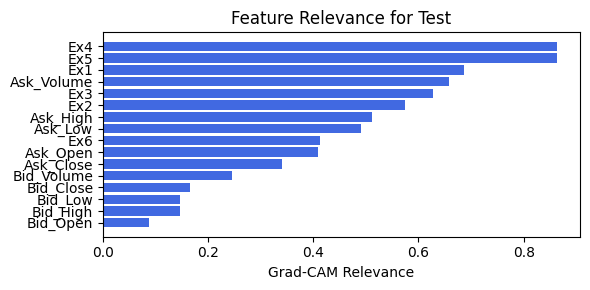

alpha: 0.8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.78e-01 | val_acc_hybrid: 6.43e-01 |: 100%|█████| 40/40 [01:00<00:00,  1.52s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 8 epoch
tensor(0.6948, device='cuda:0')
[[120  63]
 [ 49 135]]
M_KAN Relevance: 0.015355518087744713
CNN Relevance: 0.9846444129943848
[('Bid_Close', 1.3096592), ('Ask_Open', 0.91252685), ('Bid_Open', 0.6191783), ('Ask_High', 0.53182733), ('Bid_Low', 0.45565233), ('Ask_Volume', 0.38596618), ('Bid_Volume', 0.31093), ('Ask_Close', 0.30487403), ('Ask_Low', 0.30444002), ('Bid_High', 0.27064818)]


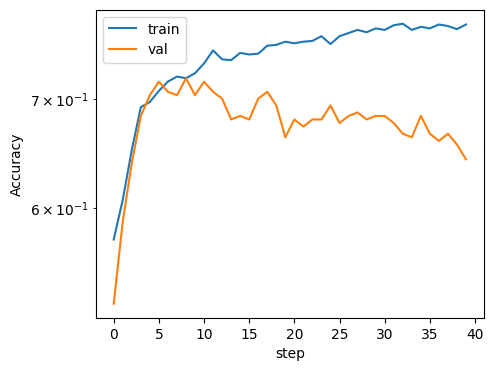

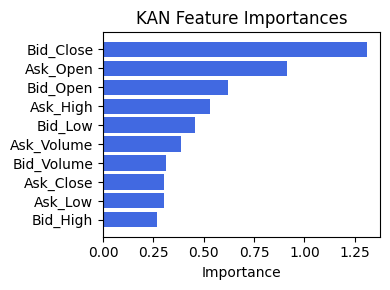

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.674397740167964), ('Ex6', 0.42028926699663377), ('Ask_Low', 0.33398916456488037), ('Ex1', 0.30453754366313335), ('Bid_Close', 0.2619176401594293), ('Ask_Open', 0.2551936990806988), ('Ask_Volume', 0.23600934618882555), ('Ask_High', 0.20340957330320236), ('Bid_Low', 0.18592565524301743), ('Bid_High', 0.18489269393369967), ('Ask_Close', 0.15330713014806716), ('Bid_Open', 0.12584293288513715), ('Ex4', 0.10791308856559714), ('Ex5', 0.10791308856559714), ('Bid_Volume', 0.1004026767331512), ('Ex3', 0.06038289917718584)]


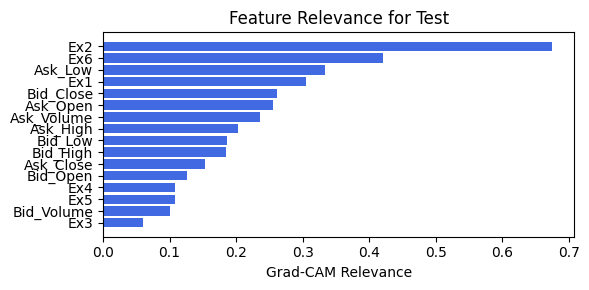

alpha: 0.75
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.77e-01 | val_acc_hybrid: 6.29e-01 |: 100%|█████| 40/40 [00:59<00:00,  1.49s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.0748e-01 at 19 epoch
tensor(0.6785, device='cuda:0')
[[117  66]
 [ 52 132]]
M_KAN Relevance: 0.05833420902490616
CNN Relevance: 0.9416658282279968
[('Bid_Close', 5.9836483), ('Bid_High', 4.6794786), ('Ask_High', 4.193875), ('Ask_Close', 3.2801557), ('Bid_Low', 1.5253582), ('Ask_Open', 0.8236809), ('Bid_Open', 0.7497656), ('Ask_Low', 0.4223119), ('Bid_Volume', 0.14552552), ('Ask_Volume', 0.062086597)]


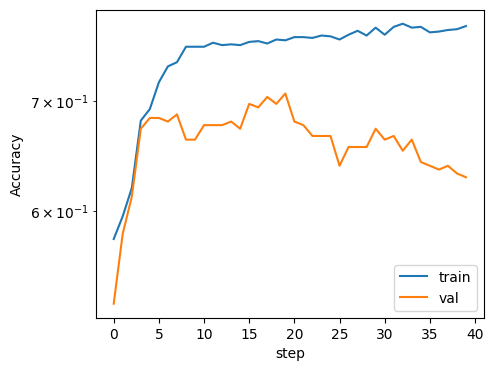

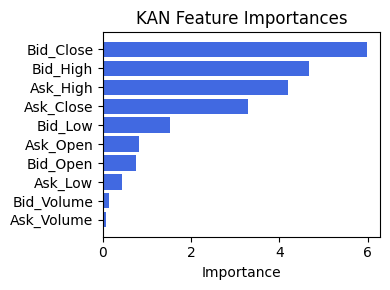

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.4745183905855593), ('Ex1', 0.36317345539072393), ('Ask_Open', 0.32374999627511575), ('Ask_High', 0.30579171145502326), ('Ask_Low', 0.3050258147926133), ('Ask_Volume', 0.29888253535933246), ('Bid_Low', 0.27719673673842454), ('Bid_High', 0.2763397809719459), ('Bid_Close', 0.24992986090230052), ('Ask_Close', 0.2390132844352927), ('Ex6', 0.22251396113752872), ('Bid_Volume', 0.1929085485756577), ('Bid_Open', 0.18638061867961508), ('Ex4', 0.16539250646669632), ('Ex5', 0.16539250646669632), ('Ex3', 0.12038912729877847)]


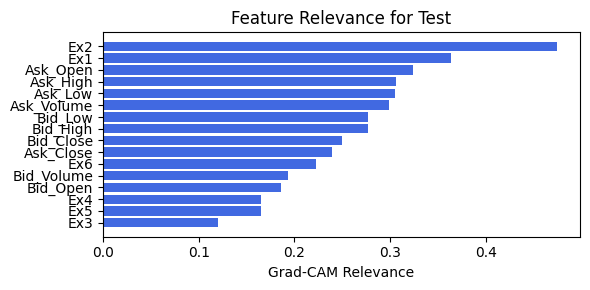

alpha: 0.7
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.68e-01 | val_acc_hybrid: 6.73e-01 |: 100%|█████| 40/40 [00:59<00:00,  1.49s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 5 epoch
tensor(0.7057, device='cuda:0')
[[111  72]
 [ 36 148]]
M_KAN Relevance: 0.014883855357766151
CNN Relevance: 0.985116183757782
[('Bid_Close', 0.88588333), ('Ask_Open', 0.7634131), ('Ask_High', 0.73054826), ('Bid_Low', 0.50358164), ('Bid_High', 0.43668216), ('Bid_Open', 0.42244202), ('Bid_Volume', 0.2466836), ('Ask_Volume', 0.2326953), ('Ask_Low', 0.16679189), ('Ask_Close', 0.09810377)]


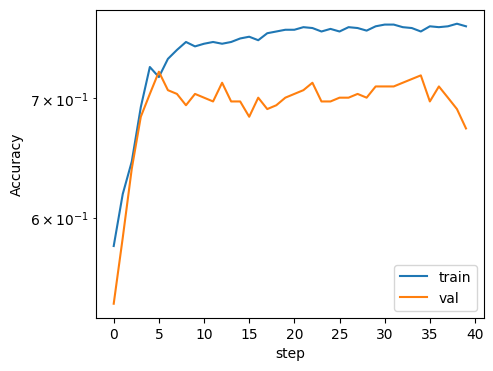

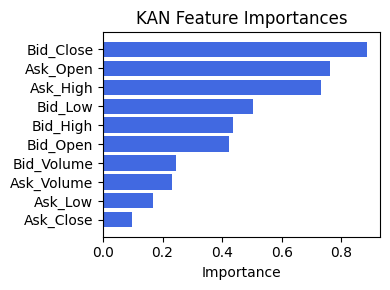

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.5901722888870174), ('Ex2', 0.5852961024582387), ('Ask_Volume', 0.5639889018165394), ('Ask_High', 0.5141231737547486), ('Ask_Low', 0.4675472070301543), ('Ask_Close', 0.4419109350532212), ('Ask_Open', 0.4118368437290315), ('Bid_Volume', 0.3393599872391072), ('Ex4', 0.2646257306200266), ('Ex5', 0.2646257306200266), ('Bid_Low', 0.25348104461577114), ('Bid_High', 0.25175510999497297), ('Bid_Close', 0.23663987156760413), ('Bid_Open', 0.22913995045345095), ('Ex3', 0.20629043434865516), ('Ex6', 0.19532608271421667)]


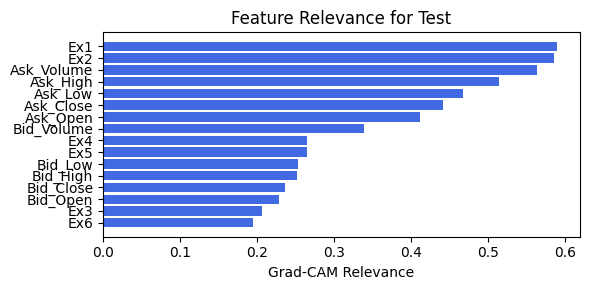

In [131]:
for alpha in [.9,.85, .8, .75, .7]:
    print(f"alpha: {alpha}")
    train_and_plot_relevance(Model4_2, kan_neurons=2, kan_grid=4, lamb=1e-07, steps=40, 
                             alpha=alpha, filename=filename_2, opt_col_val=alpha)

## 2.2 width=[10, 4], grid=3, lamb=1e-06

alpha: 0.75
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.70e-01 |: 100%|█████| 40/40 [00:53<00:00,  1.35s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 5 epoch
tensor(0.6948, device='cuda:0')
[[120  63]
 [ 49 135]]
M_KAN Relevance: 0.009692479856312275
CNN Relevance: 0.9903075098991394
[('Bid_Close', 1.0299009), ('Ask_Open', 0.8242636), ('Bid_High', 0.65770775), ('Bid_Low', 0.6088443), ('Ask_Close', 0.52188396), ('Ask_Low', 0.5169213), ('Ask_High', 0.46755004), ('Bid_Open', 0.4145578), ('Bid_Volume', 0.39783245), ('Ask_Volume', 0.16641659)]


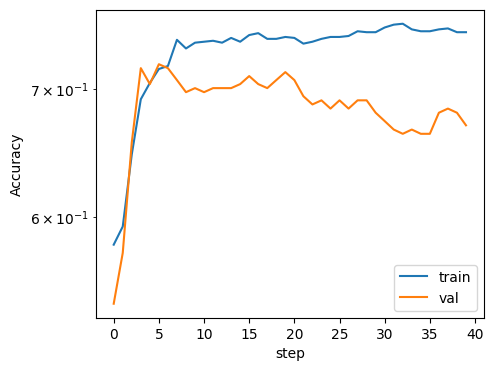

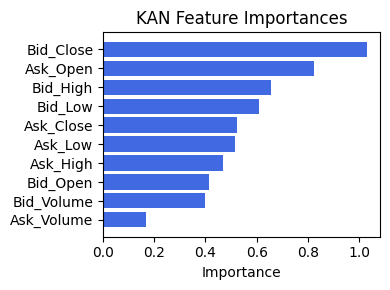

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.6456629026386815), ('Ex5', 0.6456629026386815), ('Ex3', 0.4495997818476173), ('Ex2', 0.3962546562857175), ('Ex6', 0.30452855850623195), ('Ex1', 0.287433078074168), ('Ask_Volume', 0.17317724049888167), ('Ask_Close', 0.13155799872468402), ('Ask_Low', 0.1313907627946677), ('Bid_Volume', 0.12986516895555994), ('Ask_Open', 0.1095969300930164), ('Bid_Close', 0.09236572372326779), ('Bid_Open', 0.06834225027745194), ('Bid_Low', 0.05617462300422046), ('Bid_High', 0.0546417631428013), ('Ask_High', 0.05275691835351995)]


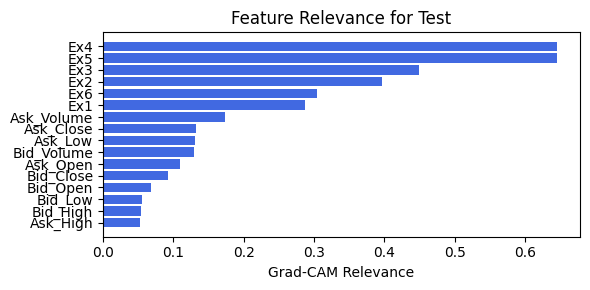

alpha: 0.5
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.80e-01 | val_acc_hybrid: 6.39e-01 |: 100%|█████| 40/40 [00:51<00:00,  1.30s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.0068e-01 at 12 epoch
tensor(0.6349, device='cuda:0')
[[127  56]
 [ 78 106]]
M_KAN Relevance: 0.009111488237977028
CNN Relevance: 0.9908884763717651
[('Ask_Low', 2.200594), ('Ask_Open', 1.6374974), ('Ask_High', 1.5652815), ('Ask_Close', 1.5335113), ('Bid_Low', 1.4035848), ('Bid_Close', 1.1333675), ('Bid_High', 1.0262645), ('Bid_Open', 0.36791816), ('Bid_Volume', 0.35420945), ('Ask_Volume', 0.22067338)]


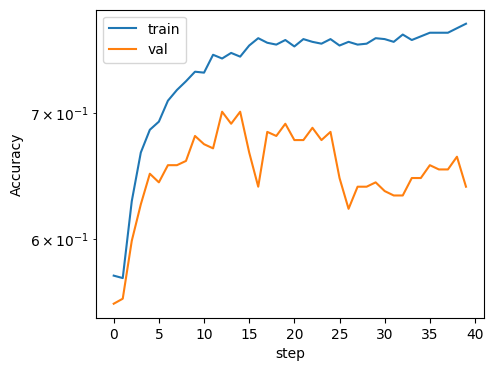

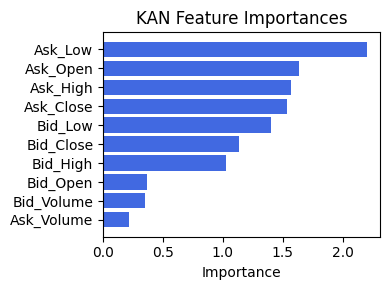

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.3479942256205383), ('Ask_Close', 0.3469132842795482), ('Ask_Volume', 0.3395719523376681), ('Ex4', 0.24190252077352123), ('Ex5', 0.24190252077352123), ('Bid_Volume', 0.19274943514885026), ('Ex3', 0.17721219687298834), ('Ask_Open', 0.16053143072997778), ('Ask_High', 0.1573311877838204), ('Bid_Open', 0.1330735103039411), ('Ex6', 0.1253432802036303), ('Bid_High', 0.1055898689013038), ('Bid_Low', 0.10214848618298435), ('Bid_Close', 0.07534735943820411), ('Ex2', 0.018269907025324068), ('Ask_Low', 0.003160393145206979)]


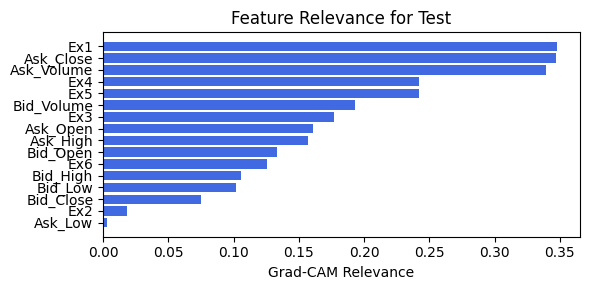

alpha: 0.25
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.74e-01 | val_acc_hybrid: 6.05e-01 |: 100%|█████| 40/40 [00:53<00:00,  1.33s/it]

saving model version 0.1
✅ Best validation Accuracy: 6.9728e-01 at 3 epoch
tensor(0.6649, device='cuda:0')
[[145  38]
 [ 85  99]]
M_KAN Relevance: 0.03705153986811638
CNN Relevance: 0.9629484415054321
[('Ask_Open', 0.83057827), ('Ask_Low', 0.7187667), ('Bid_Close', 0.68987966), ('Bid_Low', 0.54690546), ('Bid_High', 0.53145564), ('Ask_High', 0.5008998), ('Ask_Close', 0.42604554), ('Bid_Volume', 0.30614558), ('Bid_Open', 0.24950631), ('Ask_Volume', 0.16649628)]


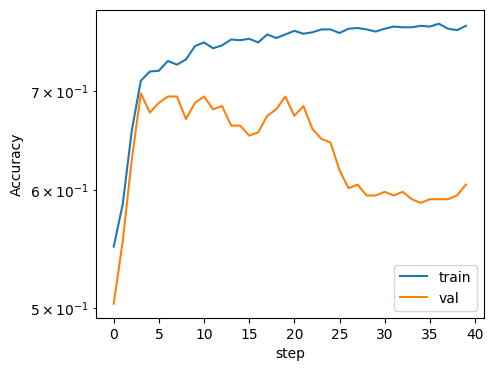

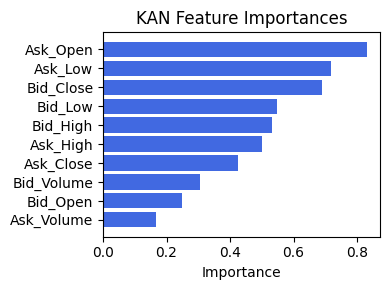

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.32790583091513925), ('Ex3', 0.22276999487091814), ('Ex2', 0.15173586340093279), ('Ex4', 0.1081973153904933), ('Ex5', 0.1081973153904933), ('Bid_Close', 0.09463355616751705), ('Ask_High', 0.057581693644582085), ('Ex6', 0.05711393966157134), ('Ask_Open', 0.035480254042667796), ('Ask_Volume', 0.03201105661197928), ('Bid_Volume', 0.03090149894920089), ('Ask_Close', 0.027774599385866516), ('Ex1', 0.018897450140776362), ('Bid_Open', 0.017376381391278728), ('Bid_Low', 0.014917201045342297), ('Bid_High', 0.01481019959807883)]


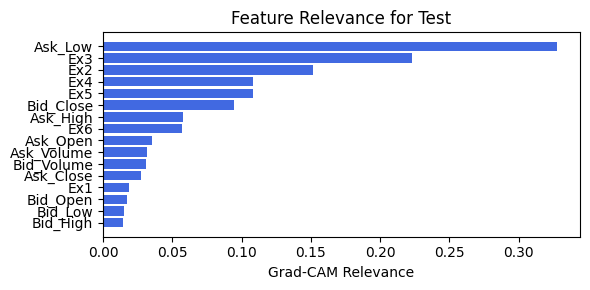

alpha: 0.1
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.61e-01 | val_acc_hybrid: 6.80e-01 |: 100%|█████| 40/40 [00:52<00:00,  1.31s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.0748e-01 at 25 epoch
tensor(0.6540, device='cuda:0')
[[116  67]
 [ 60 124]]
M_KAN Relevance: 0.03808125853538513
CNN Relevance: 0.9619187116622925
[('Ask_Open', 0.689037), ('Ask_Low', 0.60831666), ('Bid_Close', 0.5195739), ('Ask_High', 0.5155847), ('Bid_Low', 0.5037398), ('Ask_Close', 0.4540254), ('Bid_Open', 0.3551768), ('Bid_High', 0.29735488), ('Bid_Volume', 0.2496806), ('Ask_Volume', 0.124823585)]


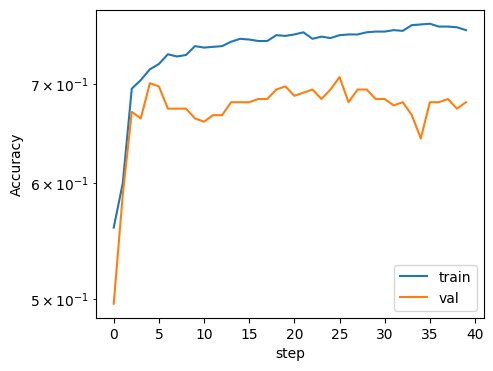

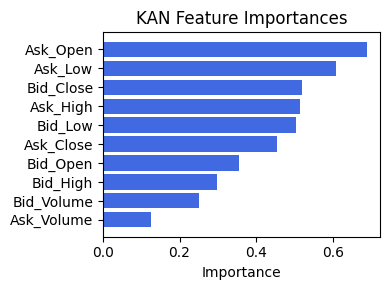

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.5150503467474061), ('Bid_Volume', 0.34049499600273064), ('Bid_Open', 0.2925995709266696), ('Ask_Volume', 0.26923060344685346), ('Ask_High', 0.23661152706263633), ('Ex1', 0.20417372852564492), ('Ask_Open', 0.20332320702448742), ('Bid_High', 0.1493156428518007), ('Bid_Low', 0.14903546099724535), ('Ex3', 0.06926243529430297), ('Ask_Low', 0.02876481312651908), ('Ex2', 0.026562816480222875), ('Bid_Close', 0.018024913785847193), ('Ex4', 0.011971718589971933), ('Ex5', 0.011971718589971933), ('Ex6', 0.0016300451872235395)]


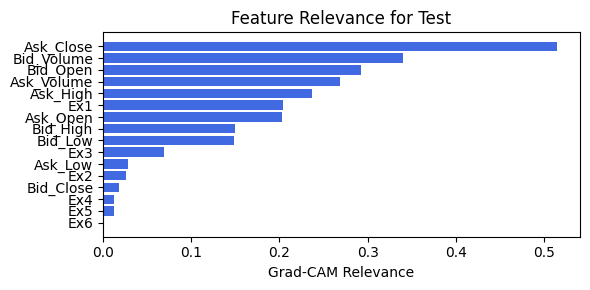

alpha: 0.05
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.67e-01 | val_acc_hybrid: 6.53e-01 |: 100%|█████| 40/40 [00:53<00:00,  1.34s/it]


saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 3 epoch
tensor(0.6839, device='cuda:0')
[[126  57]
 [ 59 125]]
M_KAN Relevance: 0.018300971016287804
CNN Relevance: 0.9816990494728088
[('Ask_Open', 0.77845657), ('Bid_Close', 0.7539604), ('Ask_Low', 0.6214669), ('Bid_High', 0.5701229), ('Bid_Low', 0.5608723), ('Ask_Close', 0.5488514), ('Ask_High', 0.5317987), ('Bid_Volume', 0.38755342), ('Bid_Open', 0.30179614), ('Ask_Volume', 0.20954418)]


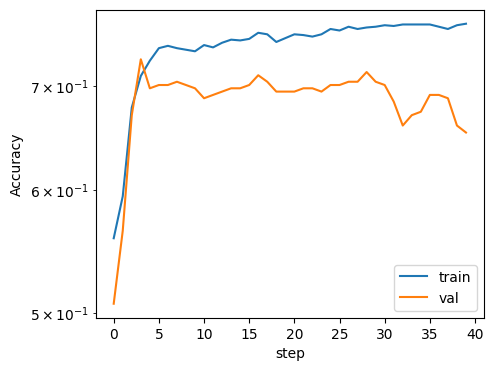

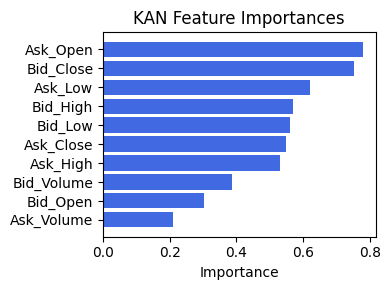

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.3659726684267204), ('Ex3', 0.2669852499387605), ('Ex1', 0.26022013198655375), ('Bid_Volume', 0.25825183194693546), ('Bid_Open', 0.24649176591285948), ('Ask_Volume', 0.24121853861571904), ('Bid_High', 0.21080922017448736), ('Bid_Low', 0.20873412569034439), ('Ask_Open', 0.19625719008864664), ('Ex4', 0.17966862441400924), ('Ex5', 0.17966862441400924), ('Ask_High', 0.14292738435945812), ('Bid_Close', 0.08856610679066085), ('Ex6', 0.0863868892448193), ('Ex2', 0.04473732084518664), ('Ask_Low', 0.01494363895337093)]


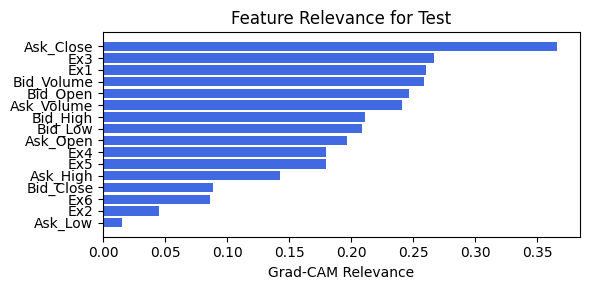

In [117]:
for alpha in [.75, .5, .25, .1, .05]:
    print(f"alpha: {alpha}")
    train_and_plot_relevance(Model4_2, kan_neurons=4, kan_grid=3, lamb=1e-06, steps=40, 
                             alpha=alpha, filename=filename_2, opt_col_val=alpha)

## 2.3 width=[10, 3], grid=5, lamb=0.0001

alpha: 0.75
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.73e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 40/40 [01:07<00:00,  1.68s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 8 epoch
tensor(0.7057, device='cuda:0')
[[116  67]
 [ 41 143]]
M_KAN Relevance: 0.00297829182818532
CNN Relevance: 0.9970216751098633
[('Bid_High', 0.9600198), ('Ask_Low', 0.766111), ('Bid_Close', 0.6788906), ('Bid_Low', 0.47782046), ('Bid_Open', 0.46144482), ('Bid_Volume', 0.41410765), ('Ask_Close', 0.3390385), ('Ask_High', 0.31350815), ('Ask_Volume', 0.30901694), ('Ask_Open', 0.13018331)]


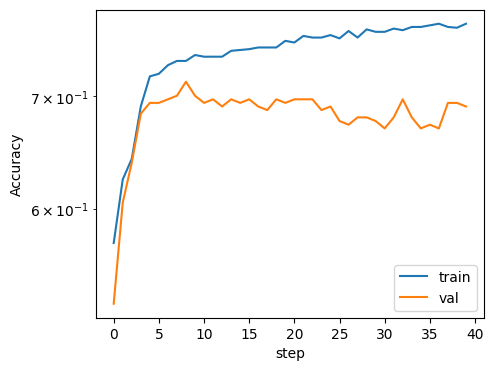

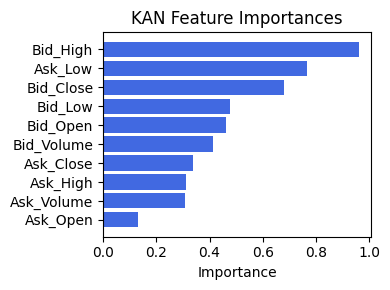

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.6590886245029965), ('Ex1', 0.5937533694613162), ('Ask_Volume', 0.5745733310411397), ('Bid_Volume', 0.4132649544344159), ('Ex3', 0.35688145843154323), ('Ex4', 0.3477878209041071), ('Ex5', 0.3477878209041071), ('Bid_Open', 0.3043233469582692), ('Ask_High', 0.2934272031765114), ('Ask_Open', 0.2776550007373813), ('Bid_High', 0.19692611634161586), ('Bid_Low', 0.1955531478912775), ('Ex2', 0.12183582097766489), ('Ask_Low', 0.07560188014534475), ('Ex6', 0.06582450002074575), ('Bid_Close', 0.0439742283396267)]


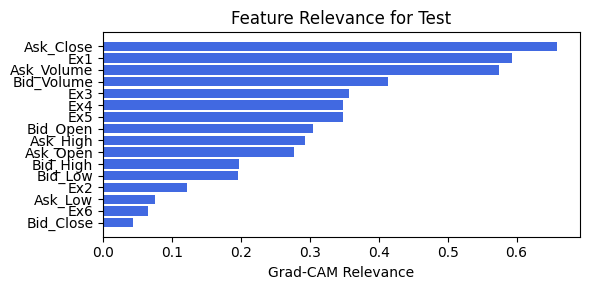

alpha: 0.5
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.54e-01 | val_acc_hybrid: 6.80e-01 |: 100%|█████| 40/40 [01:06<00:00,  1.65s/it]

saving model version 0.1
✅ Best validation Accuracy: 6.9728e-01 at 3 epoch
tensor(0.6812, device='cuda:0')
[[126  57]
 [ 60 124]]
M_KAN Relevance: 0.009733482263982296
CNN Relevance: 0.9902665019035339
[('Bid_High', 1.0204556), ('Ask_Low', 0.8042285), ('Ask_Close', 0.5263186), ('Bid_Open', 0.48260328), ('Bid_Low', 0.4438783), ('Bid_Close', 0.4324004), ('Bid_Volume', 0.40124735), ('Ask_High', 0.3862933), ('Ask_Volume', 0.2536819), ('Ask_Open', 0.16467947)]


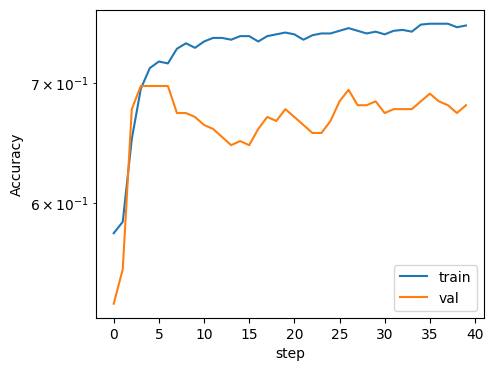

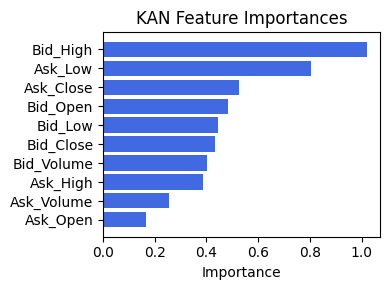

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.3627103368830372), ('Ask_Volume', 0.35628482294890634), ('Ask_Open', 0.32104880584033374), ('Ask_Close', 0.31897265335154146), ('Ask_High', 0.31577619033223603), ('Ex6', 0.2610571088752857), ('Bid_Low', 0.2572273573500665), ('Bid_High', 0.2571033722688051), ('Bid_Volume', 0.24828640767055937), ('Bid_Open', 0.2069181979347429), ('Ex2', 0.1369556575304288), ('Bid_Close', 0.12534940065146735), ('Ex3', 0.12215871067609979), ('Ask_Low', 0.09820462792016799), ('Ex4', 0.07171857587270546), ('Ex5', 0.07171857587270546)]


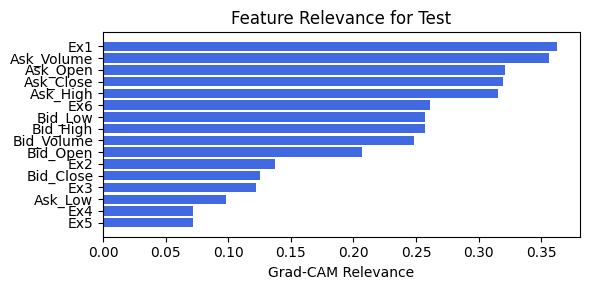

alpha: 0.25
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.77e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 40/40 [01:03<00:00,  1.59s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 9 epoch
tensor(0.6948, device='cuda:0')
[[117  66]
 [ 46 138]]
M_KAN Relevance: 0.022438138723373413
CNN Relevance: 0.977561891078949
[('Bid_High', 0.59456575), ('Ask_Low', 0.43692303), ('Bid_Open', 0.37598914), ('Bid_Close', 0.341187), ('Ask_Close', 0.30344883), ('Bid_Volume', 0.27949792), ('Bid_Low', 0.2685004), ('Ask_High', 0.23767227), ('Ask_Volume', 0.1978402), ('Ask_Open', 0.11147075)]


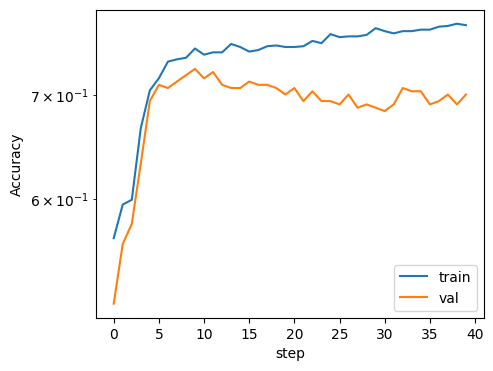

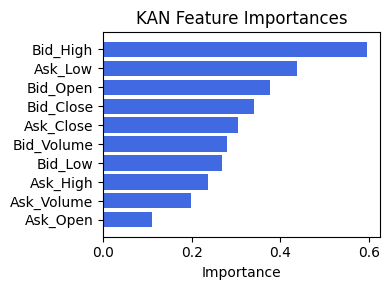

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.6800891541880975), ('Ask_Low', 0.36406942831258143), ('Ex1', 0.2926878215039621), ('Ex4', 0.27844511101920694), ('Ex5', 0.27844511101920694), ('Bid_Close', 0.2307675371139389), ('Ex6', 0.21708378681027374), ('Ask_Volume', 0.18620416507957888), ('Ex3', 0.11883372368864532), ('Ask_High', 0.1106494431424223), ('Ask_Open', 0.10661946569965285), ('Ask_Close', 0.10115871419787549), ('Bid_Low', 0.09082001896915458), ('Bid_High', 0.08951320336688004), ('Bid_Volume', 0.06923311272645989), ('Bid_Open', 0.04699582114072811)]


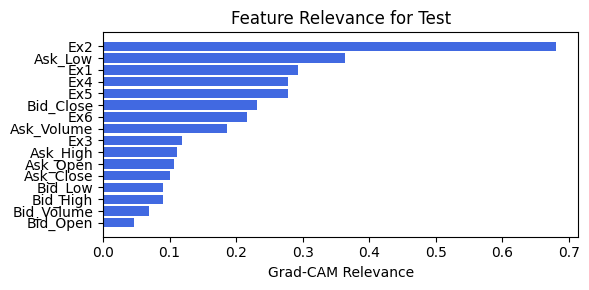

alpha: 0.1
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.73e-01 | val_acc_hybrid: 6.39e-01 |: 100%|█████| 40/40 [01:03<00:00,  1.58s/it]

saving model version 0.1
✅ Best validation Accuracy: 6.9728e-01 at 23 epoch
tensor(0.6730, device='cuda:0')
[[142  41]
 [ 79 105]]
M_KAN Relevance: 0.023680465295910835
CNN Relevance: 0.9763194918632507
[('Bid_High', 0.581014), ('Ask_Low', 0.49334252), ('Bid_Close', 0.46894628), ('Ask_High', 0.46227428), ('Ask_Open', 0.37652242), ('Bid_Low', 0.35284877), ('Ask_Close', 0.3118598), ('Bid_Open', 0.2742046), ('Bid_Volume', 0.23711127), ('Ask_Volume', 0.22978115)]


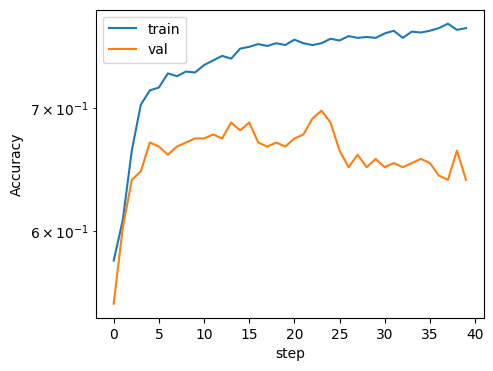

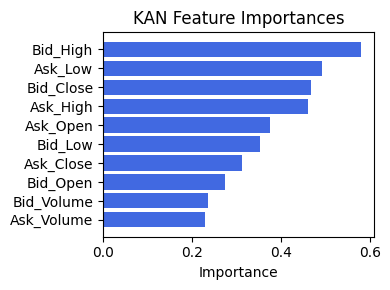

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.7785711332512334), ('Ask_Low', 0.7146772683651392), ('Bid_Close', 0.36074627177886237), ('Ex6', 0.16593798166201185), ('Ex4', 0.11670215097979239), ('Ex5', 0.11670215097979239), ('Ex3', 0.06053190359421333), ('Ask_Close', 0.04292723146008393), ('Bid_Open', 0.04222144702720971), ('Ask_High', 0.041160421181414324), ('Bid_Volume', 0.03803652209706848), ('Ask_Volume', 0.028671741490671032), ('Bid_Low', 0.02536949145256184), ('Bid_High', 0.02518528409217223), ('Ask_Open', 0.023700854949521826), ('Ex1', 0.022554116354042242)]


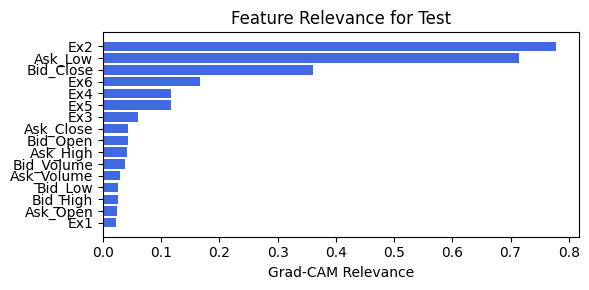

alpha: 0.05
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_2


 train_acc_hybrid: 7.64e-01 | val_acc_hybrid: 6.67e-01 |: 100%|█████| 40/40 [01:03<00:00,  1.60s/it]

saving model version 0.1
✅ Best validation Accuracy: 6.9728e-01 at 3 epoch
tensor(0.6703, device='cuda:0')
[[126  57]
 [ 64 120]]
M_KAN Relevance: 0.03790353238582611
CNN Relevance: 0.9620965123176575
[('Bid_High', 0.45520228), ('Ask_Low', 0.38790512), ('Bid_Low', 0.37576768), ('Bid_Close', 0.3591535), ('Ask_High', 0.26141244), ('Bid_Volume', 0.24820332), ('Ask_Volume', 0.24185711), ('Ask_Close', 0.2252574), ('Bid_Open', 0.22233734), ('Ask_Open', 0.19676468)]


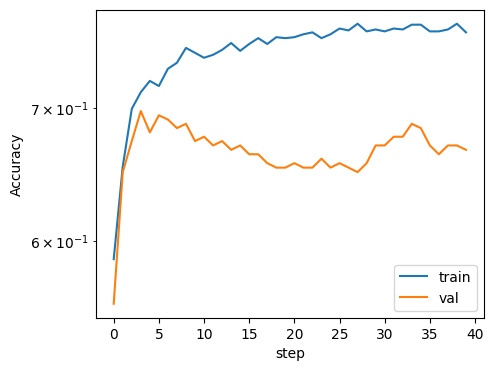

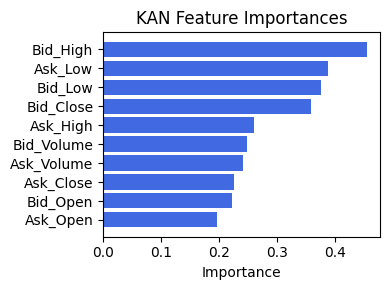

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.49106941020435957), ('Ex2', 0.3915507120336596), ('Bid_Close', 0.3054072028955404), ('Bid_Low', 0.16481873757594165), ('Bid_High', 0.16349269130238814), ('Ask_High', 0.09179959334130146), ('Ask_Volume', 0.09175358100636286), ('Bid_Open', 0.08579374131843656), ('Ex1', 0.0665063520776722), ('Ex6', 0.06043413455199326), ('Ask_Open', 0.041198554474516896), ('Ask_Close', 0.039589791475733035), ('Ex3', 0.03317457220073167), ('Bid_Volume', 0.02737158384397423), ('Ex4', 0.01963475096415048), ('Ex5', 0.01963475096415048)]


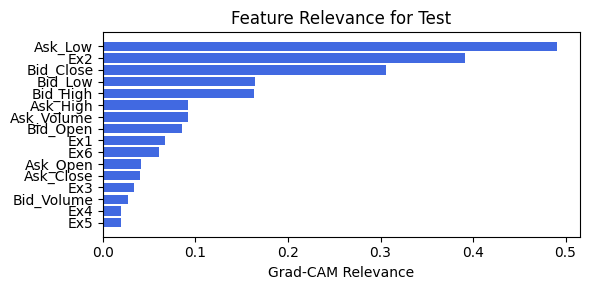

In [118]:
for alpha in [.75, .5, .25, .1, .05]:
    print(f"alpha: {alpha}")
    train_and_plot_relevance(Model4_2, kan_neurons=3, kan_grid=5, lamb=0.0001, steps=40, 
                             alpha=alpha, filename=filename_2, opt_col_val=alpha)

# Option 3: Dynamic factor

In [119]:
create_csv_with_header(filename_3, columns_opt3)

## 3.0. width=[10, 3], grid=3, lamb=1e-05

hidden_dim: 128
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 7.08e-01 | val_acc_hybrid: 7.14e-01 |: 100%|█████| 40/40 [00:57<00:00,  1.45s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 35 epoch
tensor(0.7084, device='cuda:0')
[[117  66]
 [ 41 143]]
M_KAN Relevance: 0.015013132244348526
CNN Relevance: 0.9849868416786194
[('Bid_Open', 0.46482533), ('Ask_Low', 0.42478573), ('Bid_Low', 0.41316646), ('Ask_Close', 0.41143584), ('Ask_High', 0.3739017), ('Bid_High', 0.27924877), ('Bid_Close', 0.25665903), ('Ask_Open', 0.18323402), ('Ask_Volume', 0.1669005), ('Bid_Volume', 0.15084575)]


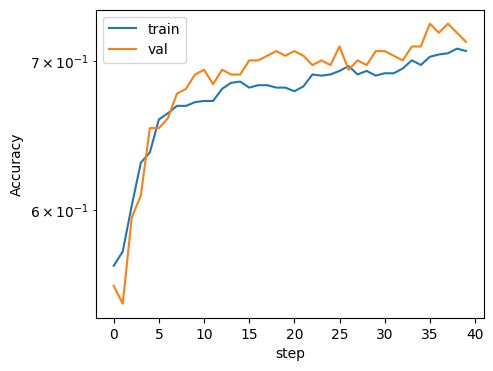

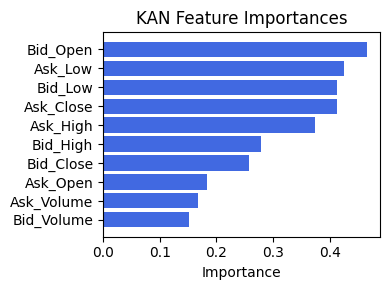

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5371870948483899), ('Ask_Low', 0.34468353800577106), ('Bid_Close', 0.340654198165313), ('Ex1', 0.25563310613260637), ('Bid_Low', 0.18919116278510156), ('Bid_High', 0.18567004353317118), ('Ask_Volume', 0.17670178301280404), ('Ask_Close', 0.12006535582442333), ('Ask_Open', 0.11524700241193944), ('Ex6', 0.11366617173585808), ('Ex4', 0.09719898454827187), ('Ex5', 0.09719898454827187), ('Bid_Open', 0.08041211499956916), ('Ask_High', 0.06949343682651664), ('Ex3', 0.05950784537565643), ('Bid_Volume', 0.05408989217876817)]


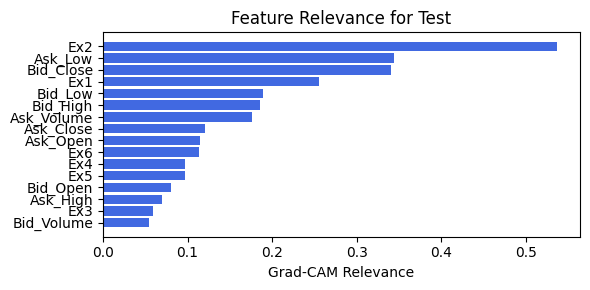

hidden_dim: 64
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 0.00e+00 | val_acc_hybrid: 0.00e+00 |: 100%|█████| 40/40 [00:59<00:00,  1.48s/it]

saving model version 0.1
✅ Best validation Accuracy: 6.9388e-01 at 4 epoch
tensor(0.6621, device='cuda:0')
[[107  76]
 [ 48 136]]
M_KAN Relevance: 0.0
CNN Relevance: 1.0
[('Bid_Open', 0.76602805), ('Bid_Low', 0.7173281), ('Ask_Low', 0.60107386), ('Ask_High', 0.5028416), ('Bid_High', 0.4369499), ('Bid_Volume', 0.32651526), ('Bid_Close', 0.28165293), ('Ask_Close', 0.2629555), ('Ask_Volume', 0.20906624), ('Ask_Open', 0.1441443)]


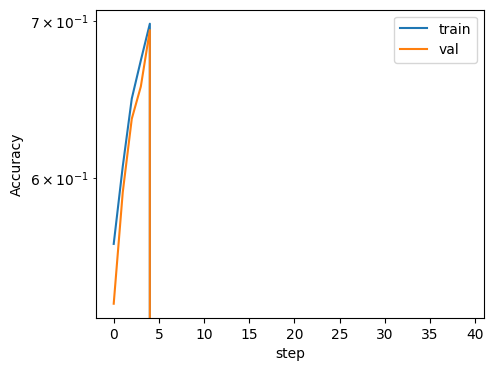

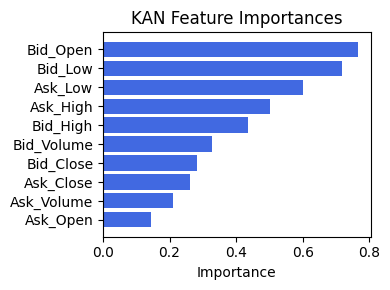

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.7376125971164951), ('Ex4', 0.6879189189432102), ('Ex5', 0.6879189189432102), ('Ex1', 0.6138523243049195), ('Ask_Low', 0.5757135472359385), ('Ask_Volume', 0.4976884745539807), ('Ex3', 0.466597099456053), ('Ex6', 0.38677228777098394), ('Ask_High', 0.36096753883986066), ('Ask_Open', 0.3391577264234988), ('Ask_Close', 0.321834869991908), ('Bid_Close', 0.2974594208317979), ('Bid_Volume', 0.18638866084687442), ('Bid_High', 0.13666124402649119), ('Bid_Low', 0.13640908749992336), ('Bid_Open', 0.08482038505349691)]


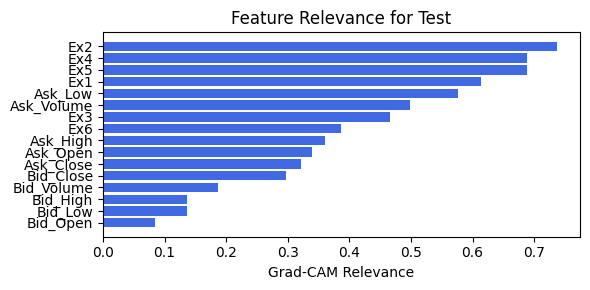

hidden_dim: 32
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 0.00e+00 | val_acc_hybrid: 0.00e+00 |: 100%|█████| 40/40 [00:59<00:00,  1.48s/it]

saving model version 0.1
✅ Best validation Accuracy: 6.8027e-01 at 4 epoch
tensor(0.6921, device='cuda:0')
[[135  48]
 [ 65 119]]
M_KAN Relevance: 0.0
CNN Relevance: 1.0
[('Bid_Open', 0.8371824), ('Bid_Low', 0.7585003), ('Ask_Low', 0.68041766), ('Ask_High', 0.5170579), ('Bid_High', 0.50753903), ('Bid_Close', 0.37143034), ('Bid_Volume', 0.35548997), ('Ask_Close', 0.3290451), ('Ask_Volume', 0.21295087), ('Ask_Open', 0.14093938)]


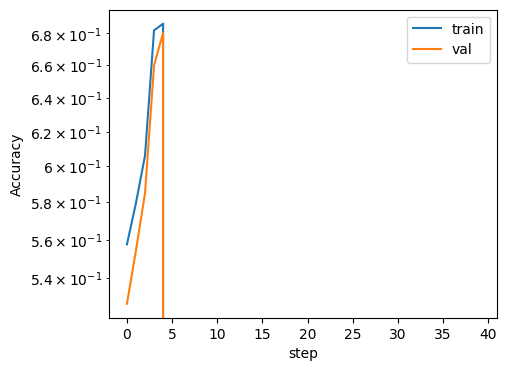

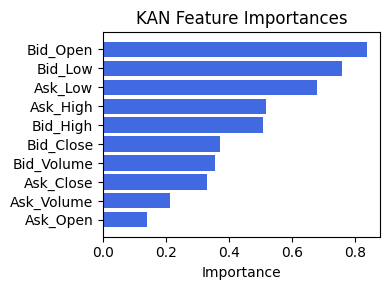

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.745092154344752), ('Ask_Low', 0.5973973804916705), ('Bid_Close', 0.3148040149338056), ('Bid_Low', 0.15021781554339042), ('Bid_High', 0.14911513450076203), ('Bid_Open', 0.10572137310212777), ('Ex6', 0.07131127782464339), ('Ask_High', 0.02958069362789291), ('Ask_Volume', 0.022836864724811116), ('Ask_Close', 0.01866509113333896), ('Ask_Open', 0.014536848649565302), ('Bid_Volume', 0.013201298730762558), ('Ex1', 0.010555792061931756), ('Ex3', 0.0005746096583864873), ('Ex4', 1.0631427838789345e-05), ('Ex5', 1.0631427838789345e-05)]


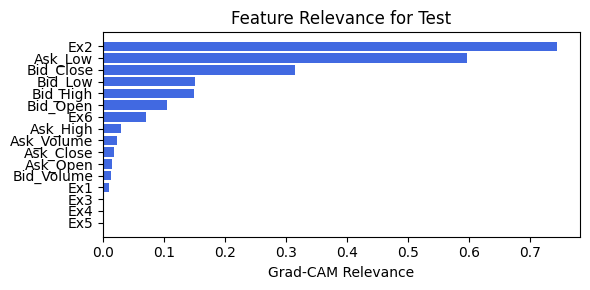

hidden_dim: 16
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 7.08e-01 | val_acc_hybrid: 7.14e-01 |: 100%|█████| 40/40 [00:55<00:00,  1.39s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 38 epoch
tensor(0.6757, device='cuda:0')
[[104  79]
 [ 40 144]]
M_KAN Relevance: 0.007962574250996113
CNN Relevance: 0.9920374751091003
[('Ask_High', 1.2591754), ('Bid_Low', 1.1175411), ('Bid_Close', 1.102731), ('Ask_Close', 1.1011689), ('Bid_Open', 0.95853937), ('Ask_Low', 0.67786664), ('Bid_High', 0.33798933), ('Bid_Volume', 0.32875833), ('Ask_Open', 0.26143438), ('Ask_Volume', 0.22314164)]


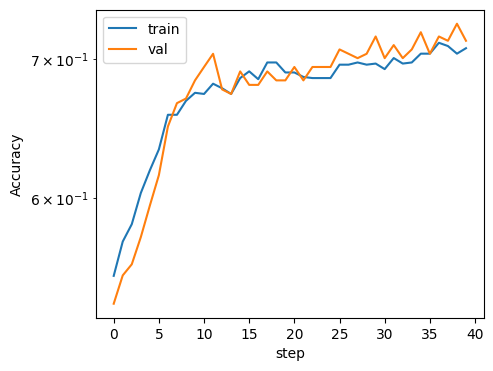

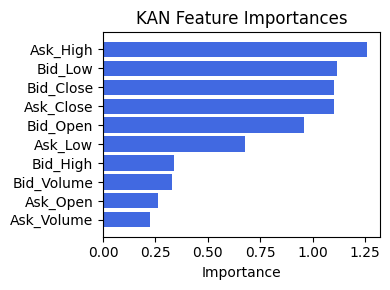

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex6', 0.4447077981111332), ('Ex4', 0.43840036841682906), ('Ex5', 0.43840036841682906), ('Ex2', 0.3036823742464692), ('Ex3', 0.22819256756901335), ('Ask_Low', 0.20641713661816713), ('Ask_Volume', 0.17566300141758334), ('Ex1', 0.15791765277144532), ('Ask_High', 0.132886182943458), ('Ask_Open', 0.0969403093553539), ('Ask_Close', 0.07549277628830327), ('Bid_Volume', 0.0682557737213694), ('Bid_Low', 0.05376721608987946), ('Bid_High', 0.05345141555421176), ('Bid_Close', 0.048974403953772894), ('Bid_Open', 0.03641372818424625)]


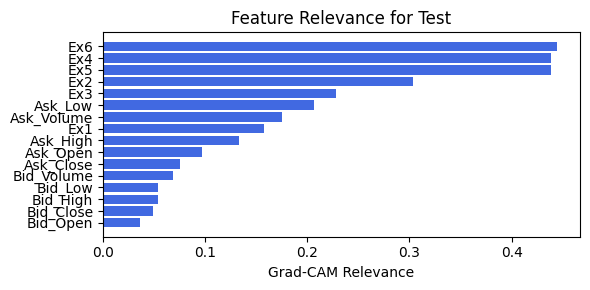

hidden_dim: 8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 7.65e-01 | val_acc_hybrid: 6.22e-01 |: 100%|█████| 40/40 [00:55<00:00,  1.39s/it]

saving model version 0.1
✅ Best validation Accuracy: 6.8367e-01 at 14 epoch
tensor(0.6921, device='cuda:0')
[[136  47]
 [ 66 118]]
M_KAN Relevance: 0.007637642789632082
CNN Relevance: 0.992362380027771
[('Ask_High', 0.7333984), ('Bid_Close', 0.71705645), ('Bid_Open', 0.7097742), ('Ask_Close', 0.67998666), ('Ask_Low', 0.6093477), ('Bid_Low', 0.47062564), ('Ask_Open', 0.29029027), ('Ask_Volume', 0.2793659), ('Bid_High', 0.23401362), ('Bid_Volume', 0.18824671)]


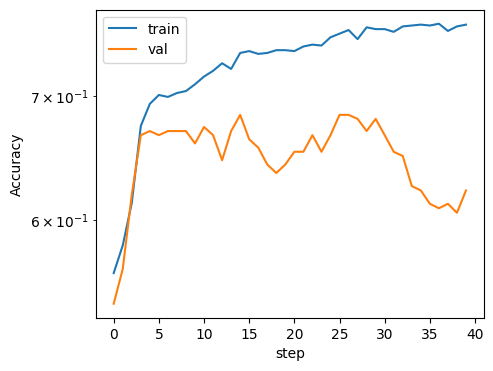

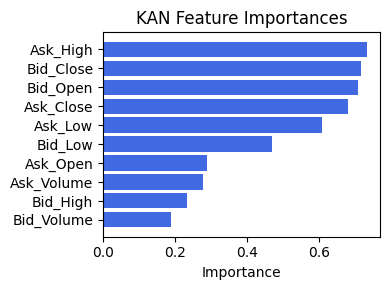

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.2533827556096708), ('Ask_Volume', 0.25044008979715954), ('Ex2', 0.24100726827559105), ('Ex1', 0.22749795796405473), ('Ask_Low', 0.22115071186819146), ('Bid_Close', 0.2008759677377612), ('Bid_Low', 0.19372736702848237), ('Bid_High', 0.19339765540737475), ('Bid_Volume', 0.18122057762055352), ('Bid_Open', 0.1796986946982188), ('Ask_High', 0.16920253937957397), ('Ask_Open', 0.12208093104982998), ('Ex3', 0.0413350318913787), ('Ex4', 0.031540098767892565), ('Ex5', 0.031540098767892565), ('Ex6', 0.018525730474463327)]


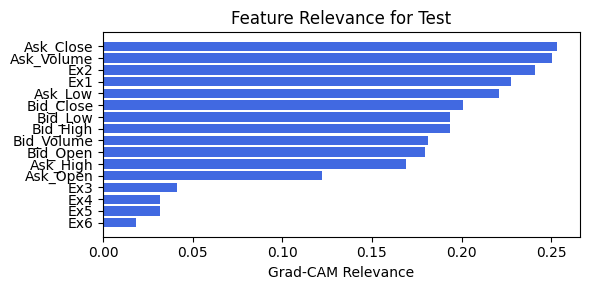

In [120]:
for hidden_dim in [128, 64, 32, 16, 8]:
    print(f"hidden_dim: {hidden_dim}")
    train_and_plot_relevance(Model4_3, kan_neurons=3, kan_grid=3, lamb=1e-05, steps=40, 
                             hidden_dim=hidden_dim, filename=filename_3, opt_col_val=hidden_dim)

## 3.1. width=[10, 2], grid=4, lamb=1e-07

hidden_dim: 128
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 7.58e-01 | val_acc_hybrid: 6.80e-01 |: 100%|█████| 40/40 [01:02<00:00,  1.56s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.0748e-01 at 6 epoch
tensor(0.6839, device='cuda:0')
[[103  80]
 [ 36 148]]
M_KAN Relevance: 0.07169530540704727
CNN Relevance: 0.9283046722412109
[('Bid_Close', 4.0941424), ('Ask_Open', 2.310073), ('Bid_Open', 1.6049755), ('Ask_Close', 1.5355428), ('Bid_Low', 1.4360666), ('Ask_High', 0.8850249), ('Bid_High', 0.86876285), ('Ask_Low', 0.326028), ('Bid_Volume', 0.32418802), ('Ask_Volume', 0.12881428)]


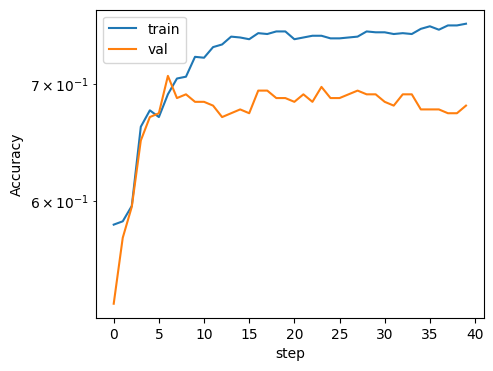

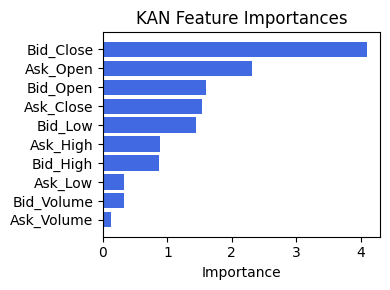

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.6860339382780102), ('Ask_Volume', 0.597528416983154), ('Ex1', 0.584688991652383), ('Bid_Volume', 0.5120356876900476), ('Ex3', 0.4675138115842271), ('Ask_High', 0.418633575263187), ('Ask_Open', 0.3908317110714393), ('Ex4', 0.36955393247727597), ('Ex5', 0.36955393247727597), ('Bid_Open', 0.34969867894245815), ('Bid_High', 0.23576069153002807), ('Bid_Low', 0.23469150152148766), ('Ask_Low', 0.1034126950915835), ('Ex2', 0.018981687938705676), ('Bid_Close', 0.015094086316801805), ('Ex6', 0.010027563889615688)]


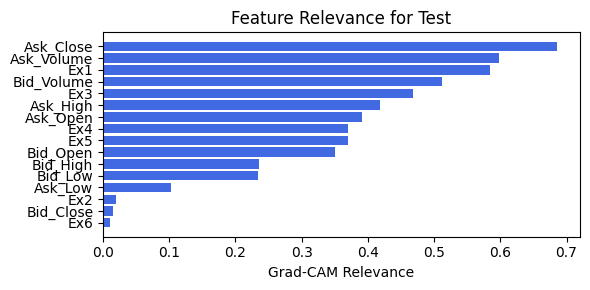

hidden_dim: 64
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 7.53e-01 | val_acc_hybrid: 7.28e-01 |: 100%|█████| 40/40 [01:04<00:00,  1.61s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 39 epoch
tensor(0.6975, device='cuda:0')
[[112  71]
 [ 40 144]]
M_KAN Relevance: 0.027441877871751785
CNN Relevance: 0.9725581407546997
[('Bid_Close', 0.5473935), ('Ask_High', 0.51422155), ('Ask_Open', 0.5025672), ('Bid_Open', 0.32266185), ('Bid_Low', 0.3175524), ('Ask_Low', 0.17687477), ('Bid_Volume', 0.16376117), ('Bid_High', 0.13341732), ('Ask_Close', 0.10302597), ('Ask_Volume', 0.0968244)]


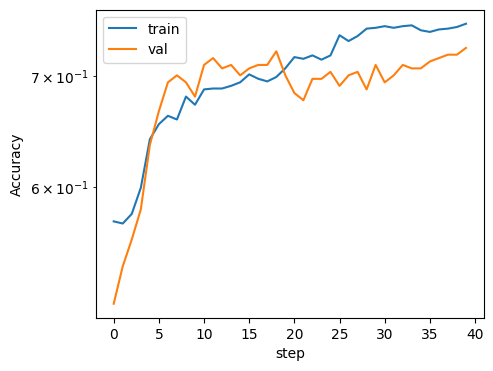

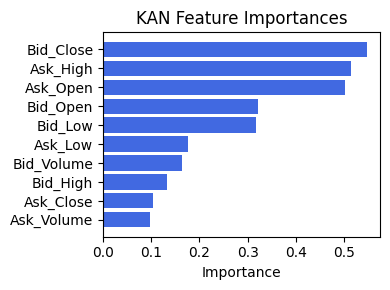

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.7081489593034219), ('Ex2', 0.6153957027261848), ('Ask_Volume', 0.5843793513470301), ('Ask_High', 0.5226388195322126), ('Ask_Open', 0.47455629385804454), ('Ask_Low', 0.4177608074371675), ('Ask_Close', 0.37230504594479336), ('Bid_Low', 0.32238634562149027), ('Bid_High', 0.32011198532090035), ('Bid_Close', 0.26926860240464445), ('Bid_Volume', 0.2678827103539827), ('Ex6', 0.26278945551906036), ('Ex4', 0.2028360547750366), ('Ex5', 0.2028360547750366), ('Bid_Open', 0.19153390605921275), ('Ex3', 0.09110975716073048)]


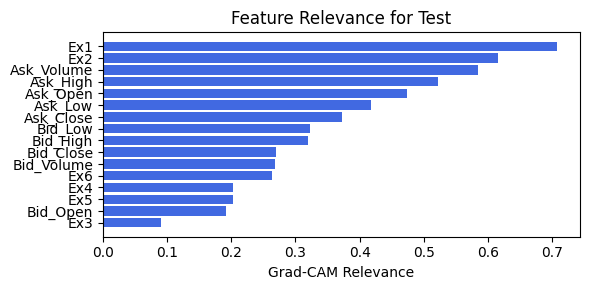

hidden_dim: 32
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 7.42e-01 | val_acc_hybrid: 6.73e-01 |: 100%|█████| 40/40 [01:03<00:00,  1.58s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 28 epoch
tensor(0.6921, device='cuda:0')
[[131  52]
 [ 61 123]]
M_KAN Relevance: 0.010524115525186062
CNN Relevance: 0.9894759058952332
[('Bid_Close', 0.5837217), ('Ask_High', 0.5664601), ('Ask_Open', 0.5364934), ('Bid_Low', 0.39484334), ('Bid_High', 0.3767867), ('Ask_Close', 0.26389527), ('Bid_Open', 0.26314247), ('Bid_Volume', 0.20273027), ('Ask_Low', 0.16705817), ('Ask_Volume', 0.09171298)]


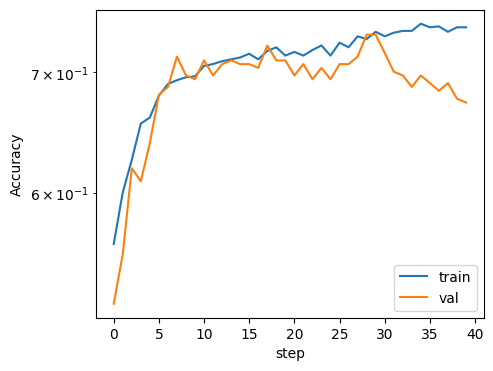

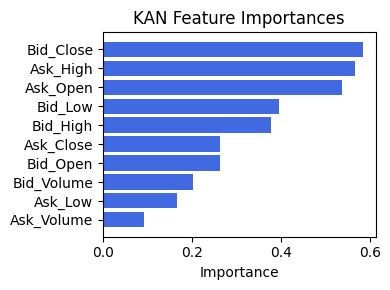

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.45962724623768986), ('Ask_Close', 0.304393854480724), ('Ask_Low', 0.25755958370699444), ('Bid_Volume', 0.2364655085021133), ('Bid_Close', 0.19987895949123546), ('Ex3', 0.1957518375416512), ('Bid_Open', 0.1855301349029695), ('Ex4', 0.1813804113195241), ('Ex5', 0.1813804113195241), ('Ask_High', 0.17613067698062526), ('Ex6', 0.17146922528365632), ('Ask_Volume', 0.1582681625254823), ('Ex1', 0.12421558178946686), ('Ask_Open', 0.11911860697291335), ('Bid_Low', 0.10791710661537801), ('Bid_High', 0.10668365807071047)]


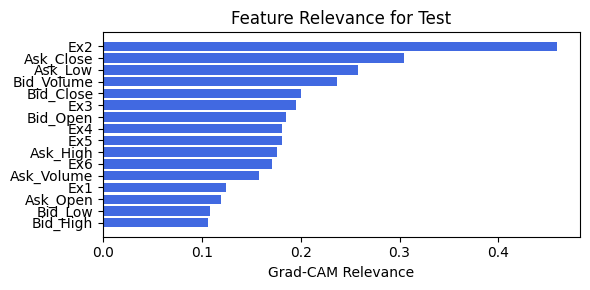

hidden_dim: 16
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 7.68e-01 | val_acc_hybrid: 6.53e-01 |: 100%|█████| 40/40 [01:01<00:00,  1.53s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.0068e-01 at 12 epoch
tensor(0.7112, device='cuda:0')
[[134  49]
 [ 57 127]]
M_KAN Relevance: 0.06758152693510056
CNN Relevance: 0.9324184656143188
[('Bid_Close', 6.2486167), ('Bid_High', 4.3003206), ('Ask_High', 4.1354885), ('Ask_Close', 3.0557504), ('Bid_Low', 2.3459792), ('Ask_Open', 0.9679234), ('Bid_Open', 0.87776345), ('Ask_Low', 0.7255028), ('Bid_Volume', 0.45867527), ('Ask_Volume', 0.21628314)]


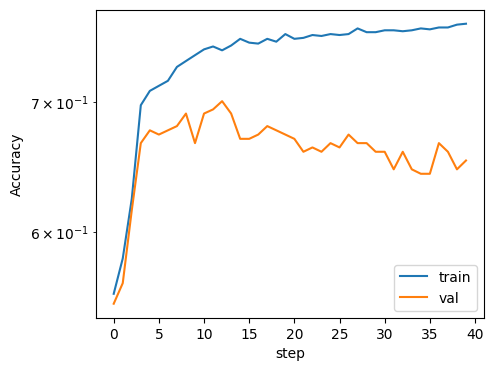

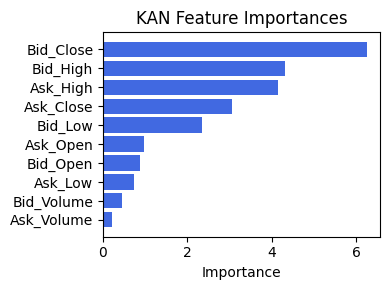

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex3', 0.36329182728805276), ('Ex4', 0.3381339176919575), ('Ex5', 0.3381339176919575), ('Ex6', 0.164306871886059), ('Ex2', 0.14616025210807368), ('Ex1', 0.062406765022987566), ('Ask_Close', 0.054158553135028105), ('Bid_Volume', 0.05179471132332492), ('Ask_Open', 0.04551314036184237), ('Ask_Volume', 0.034028133829692074), ('Ask_High', 0.03317262025266444), ('Bid_Close', 0.027538568768123727), ('Bid_Open', 0.027022534287001746), ('Ask_Low', 0.025274274673410285), ('Bid_Low', 0.021176855851279455), ('Bid_High', 0.020835711402508967)]


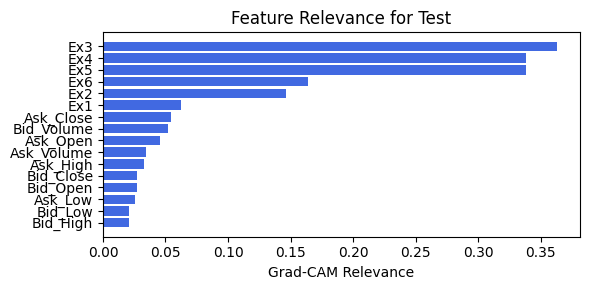

hidden_dim: 8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 7.59e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 40/40 [01:03<00:00,  1.58s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 9 epoch
tensor(0.7057, device='cuda:0')
[[130  53]
 [ 55 129]]
M_KAN Relevance: 0.034492652863264084
CNN Relevance: 0.9655073285102844
[('Bid_Close', 1.2836525), ('Ask_Open', 0.7360997), ('Ask_High', 0.64740777), ('Bid_Low', 0.5746149), ('Ask_Close', 0.5089005), ('Bid_High', 0.47942775), ('Bid_Open', 0.4172371), ('Bid_Volume', 0.3014246), ('Ask_Low', 0.1495424), ('Ask_Volume', 0.14341299)]


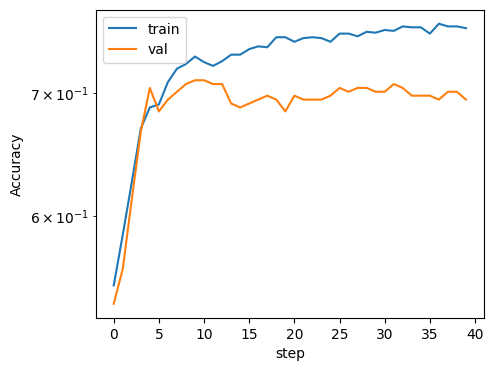

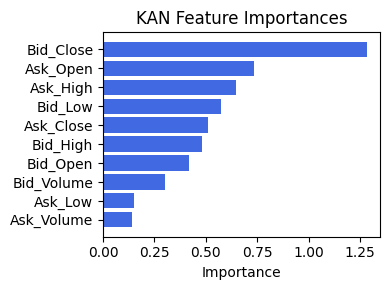

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.26452557008386124), ('Ex2', 0.24584228294959917), ('Ask_High', 0.20789192504521042), ('Ask_Open', 0.1890121689906892), ('Bid_Close', 0.1605720201940834), ('Ask_Volume', 0.14608933948452568), ('Ex1', 0.14349625674038313), ('Ask_Close', 0.14097968210787856), ('Bid_Volume', 0.13937059993353199), ('Bid_Low', 0.11119576506900325), ('Bid_High', 0.11024832603368116), ('Bid_Open', 0.10929606925589552), ('Ex3', 0.09381817066908765), ('Ex4', 0.06612229379711099), ('Ex5', 0.06612229379711099), ('Ex6', 0.0366988669508657)]


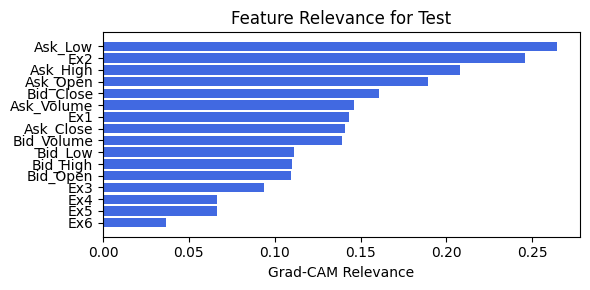

In [121]:
for hidden_dim in [128, 64, 32, 16, 8]:
    print(f"hidden_dim: {hidden_dim}")
    train_and_plot_relevance(Model4_3, kan_neurons=2, kan_grid=4, lamb=1e-07, steps=40, 
                             hidden_dim=hidden_dim, filename=filename_3, opt_col_val=hidden_dim)

## 3.2. width=[10, 4], grid=3, lamb=1e-06

hidden_dim: 128
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 0.00e+00 | val_acc_hybrid: 0.00e+00 |: 100%|█████| 40/40 [01:00<00:00,  1.52s/it]


saving model version 0.1
✅ Best validation Accuracy: 6.8027e-01 at 4 epoch
tensor(0.6757, device='cuda:0')
[[112  71]
 [ 48 136]]
M_KAN Relevance: 0.0
CNN Relevance: 1.0
[('Bid_Close', 0.86748034), ('Ask_Open', 0.7002684), ('Bid_High', 0.56948537), ('Bid_Low', 0.554755), ('Ask_Close', 0.5255409), ('Ask_Low', 0.4557017), ('Ask_High', 0.45340714), ('Bid_Open', 0.42606527), ('Bid_Volume', 0.36838537), ('Ask_Volume', 0.15563673)]


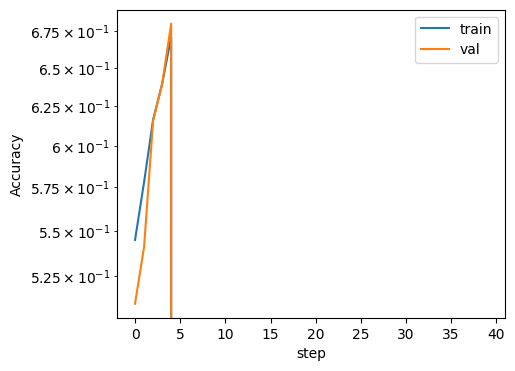

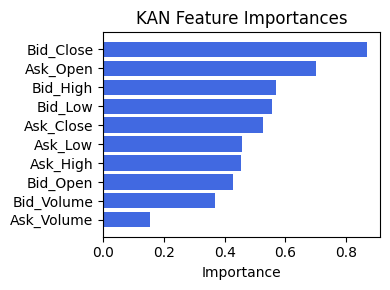

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.8871517468050975), ('Ask_Low', 0.6039300942615852), ('Bid_Close', 0.3960006667214778), ('Ex1', 0.24804903566583544), ('Ask_High', 0.21314144716883582), ('Ask_Volume', 0.1964408704982739), ('Ex6', 0.17767165523347234), ('Ask_Open', 0.16659654952881175), ('Bid_Low', 0.15407664545974123), ('Bid_High', 0.1507739832772136), ('Ask_Close', 0.10271631776100172), ('Bid_Volume', 0.08780106822455717), ('Ex4', 0.08480713037045658), ('Ex5', 0.08480713037045658), ('Bid_Open', 0.0684869344766843), ('Ex3', 0.04488030022093633)]


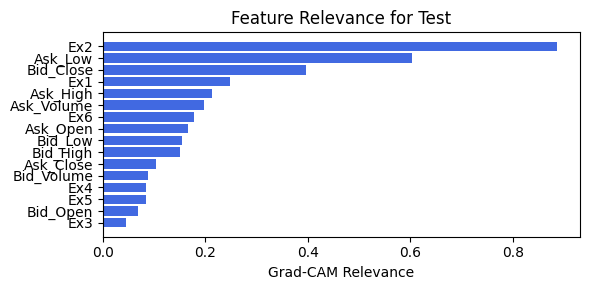

hidden_dim: 64
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 7.44e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 40/40 [00:58<00:00,  1.47s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.4830e-01 at 10 epoch
tensor(0.7139, device='cuda:0')
[[115  68]
 [ 37 147]]
M_KAN Relevance: 0.001258123549632728
CNN Relevance: 0.998741865158081
[('Bid_Close', 0.70511484), ('Ask_Open', 0.6838683), ('Bid_Low', 0.5531987), ('Ask_Close', 0.5488749), ('Bid_High', 0.5402214), ('Ask_Low', 0.48023313), ('Ask_High', 0.46505046), ('Bid_Open', 0.36542428), ('Bid_Volume', 0.35510463), ('Ask_Volume', 0.17329857)]


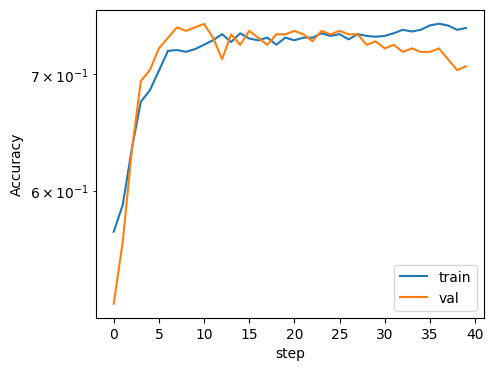

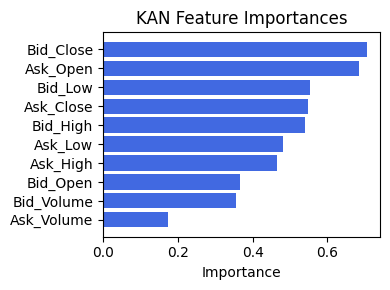

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.8331279461081736), ('Ask_Low', 0.5513227947401416), ('Ex1', 0.40764078317236724), ('Bid_Close', 0.364692464831846), ('Ask_Volume', 0.2746603574086113), ('Ex4', 0.26862105380297113), ('Ex5', 0.26862105380297113), ('Ex6', 0.2598353360173082), ('Bid_Low', 0.16308721545728416), ('Bid_High', 0.16030705638695508), ('Ask_Open', 0.1445077343774726), ('Ask_High', 0.13905898305747344), ('Ex3', 0.13375014549677008), ('Ask_Close', 0.13221315284163185), ('Bid_Volume', 0.09841760758062777), ('Bid_Open', 0.07528412429157014)]


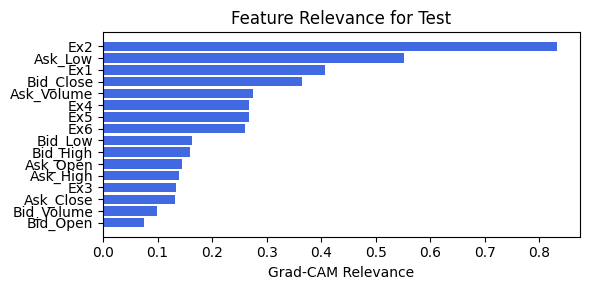

hidden_dim: 32
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 0.00e+00 | val_acc_hybrid: 0.00e+00 |: 100%|█████| 40/40 [00:59<00:00,  1.49s/it]

saving model version 0.1
✅ Best validation Accuracy: 6.9388e-01 at 4 epoch
tensor(0.6703, device='cuda:0')
[[ 95  88]
 [ 33 151]]
M_KAN Relevance: 0.0
CNN Relevance: 1.0
[('Ask_Open', 0.77706164), ('Bid_Close', 0.68965334), ('Bid_Low', 0.5450407), ('Bid_High', 0.5387225), ('Ask_Close', 0.53098786), ('Ask_Low', 0.5232024), ('Ask_High', 0.49470323), ('Bid_Volume', 0.34888417), ('Bid_Open', 0.32146597), ('Ask_Volume', 0.17739724)]


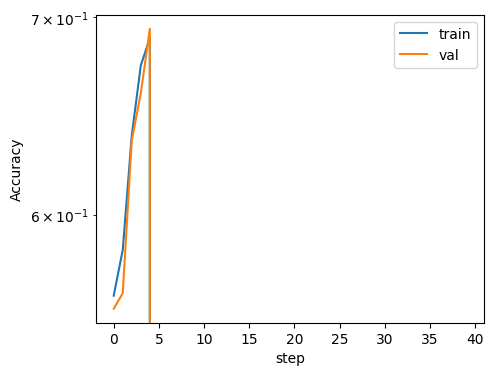

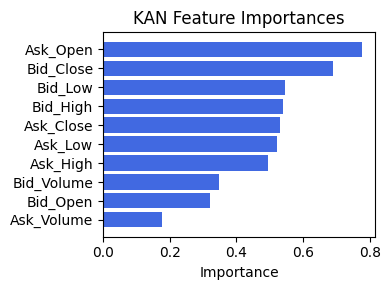

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.9462513838024247), ('Ask_Volume', 0.891744186418892), ('Ask_Close', 0.7695722387905667), ('Ask_High', 0.6429198044214248), ('Ask_Open', 0.5938693218254193), ('Bid_Volume', 0.5176481859098228), ('Bid_Low', 0.44073249194682235), ('Bid_High', 0.44032657285708154), ('Bid_Open', 0.382624336993842), ('Ex4', 0.3322345031882454), ('Ex5', 0.3322345031882454), ('Ex3', 0.31381597498219904), ('Ex2', 0.21280423125470366), ('Ask_Low', 0.16602754509152606), ('Bid_Close', 0.12327379113008022), ('Ex6', 0.05031346956501735)]


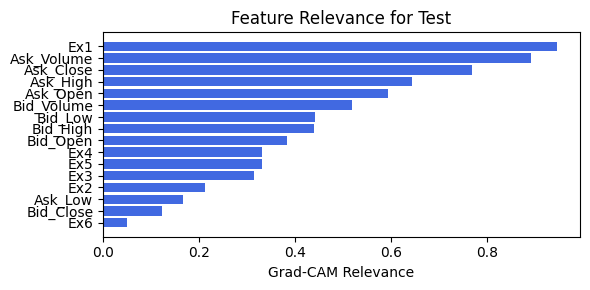

hidden_dim: 16
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 7.43e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 40/40 [00:57<00:00,  1.44s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 6 epoch
tensor(0.6894, device='cuda:0')
[[116  67]
 [ 47 137]]
M_KAN Relevance: 0.0019791298545897007
CNN Relevance: 0.9980208873748779
[('Bid_Close', 0.71694666), ('Ask_Open', 0.66802895), ('Bid_Low', 0.5481088), ('Bid_High', 0.53399026), ('Ask_Close', 0.529022), ('Ask_Low', 0.46611094), ('Ask_High', 0.45872748), ('Bid_Open', 0.3576799), ('Bid_Volume', 0.35117796), ('Ask_Volume', 0.16895667)]


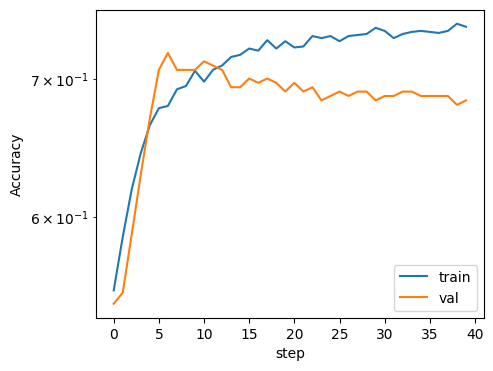

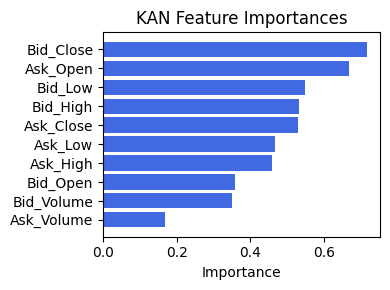

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Volume', 0.7488761289446165), ('Ask_High', 0.712335340292967), ('Ex1', 0.7062447705846635), ('Ask_Open', 0.6193847222499833), ('Ex2', 0.5651984757468439), ('Bid_High', 0.5407179918302584), ('Bid_Low', 0.5395120090020856), ('Ask_Low', 0.5258074673235275), ('Ask_Close', 0.4514256467388014), ('Bid_Close', 0.391058524724157), ('Bid_Volume', 0.3624083010631433), ('Bid_Open', 0.3609017514565335), ('Ex6', 0.05552333820108781), ('Ex4', 0.04093307861415936), ('Ex5', 0.04093307861415936), ('Ex3', 0.026813566905400515)]


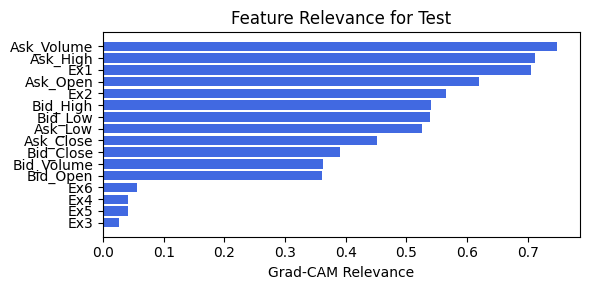

hidden_dim: 8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 7.76e-01 | val_acc_hybrid: 6.22e-01 |: 100%|█████| 40/40 [00:54<00:00,  1.36s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 8 epoch
tensor(0.7193, device='cuda:0')
[[129  54]
 [ 49 135]]
M_KAN Relevance: 4.5607927745550114e-07
CNN Relevance: 0.9999995827674866
[('Ask_Open', 0.6976861), ('Bid_Close', 0.6798992), ('Bid_Low', 0.52884674), ('Bid_High', 0.5230392), ('Ask_Close', 0.4951886), ('Ask_Low', 0.46880314), ('Ask_High', 0.44687468), ('Bid_Volume', 0.31491727), ('Bid_Open', 0.30110595), ('Ask_Volume', 0.15420969)]


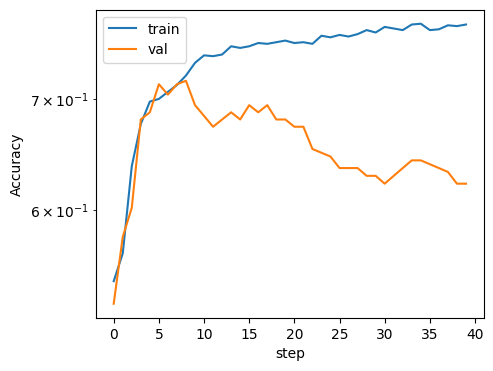

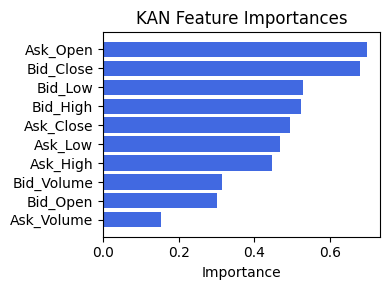

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.9203796243797531), ('Ask_Low', 0.6139828996080652), ('Bid_Close', 0.4104965680357505), ('Ex6', 0.34114462865024237), ('Ex1', 0.21691845510010951), ('Ask_High', 0.1804132902910216), ('Ask_Volume', 0.1784464689208851), ('Bid_Low', 0.1575339117507883), ('Bid_High', 0.15392724685591383), ('Ask_Open', 0.15107373247013176), ('Ask_Close', 0.09805714795448403), ('Bid_Open', 0.0774317888504707), ('Bid_Volume', 0.07465789878245428), ('Ex4', 0.05306383032044516), ('Ex5', 0.05306383032044516), ('Ex3', 0.020759301281525252)]


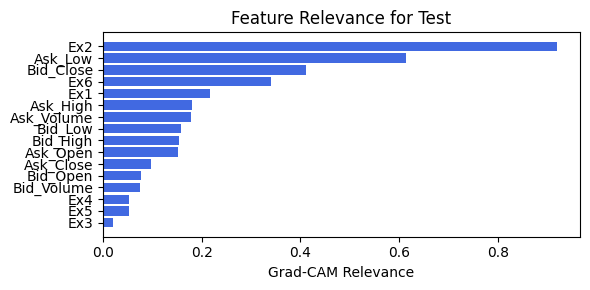

In [122]:
for hidden_dim in [128, 64, 32, 16, 8]:
    print(f"hidden_dim: {hidden_dim}")
    train_and_plot_relevance(Model4_3, kan_neurons=4, kan_grid=3, lamb=1e-06, steps=40, 
                             hidden_dim=hidden_dim, filename=filename_3, opt_col_val=hidden_dim)

## 3.3. width=[10, 3], grid=5, lamb=0.0001

hidden_dim: 128
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 7.66e-01 | val_acc_hybrid: 6.50e-01 |: 100%|█████| 40/40 [01:08<00:00,  1.72s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 8 epoch
tensor(0.6975, device='cuda:0')
[[149  34]
 [ 77 107]]
M_KAN Relevance: 0.0010986998677253723
CNN Relevance: 0.9989013671875
[('Bid_Low', 0.40968603), ('Bid_High', 0.4047099), ('Ask_Open', 0.3189521), ('Ask_High', 0.31883836), ('Ask_Low', 0.27463055), ('Bid_Open', 0.23402427), ('Bid_Close', 0.19737808), ('Ask_Volume', 0.19488269), ('Ask_Close', 0.17996874), ('Bid_Volume', 0.17044757)]


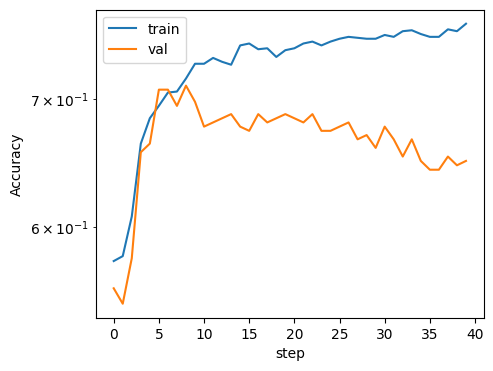

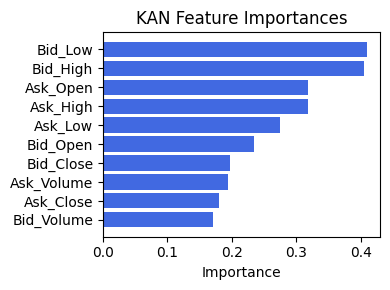

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.6576074516332178), ('Ask_Low', 0.5521693716894827), ('Bid_Close', 0.33770893701404203), ('Ex6', 0.12192899361209168), ('Ask_High', 0.11516684830209052), ('Ask_Close', 0.0841798924374136), ('Ask_Volume', 0.08405049055015697), ('Ask_Open', 0.08252335080578137), ('Bid_Low', 0.0802530257144882), ('Bid_High', 0.07925789936335265), ('Bid_Volume', 0.07559406274944869), ('Ex1', 0.07246867536848832), ('Bid_Open', 0.068004027841364), ('Ex3', 0.010329542867458687), ('Ex4', 0.0010148915360689325), ('Ex5', 0.0010148915360689325)]


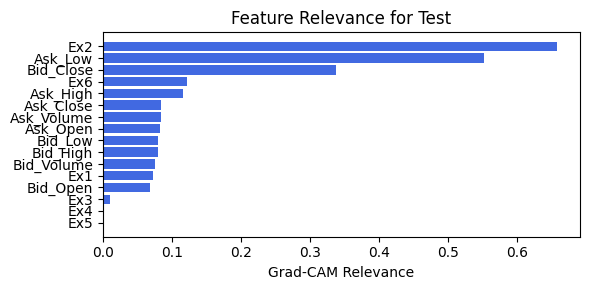

hidden_dim: 64
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 0.00e+00 | val_acc_hybrid: 0.00e+00 |: 100%|█████| 40/40 [01:12<00:00,  1.81s/it]

saving model version 0.1
✅ Best validation Accuracy: 6.9388e-01 at 4 epoch
tensor(0.6812, device='cuda:0')
[[121  62]
 [ 55 129]]
M_KAN Relevance: 0.0
CNN Relevance: 1.0
[('Bid_High', 0.34405518), ('Bid_Low', 0.34117255), ('Ask_Open', 0.3069451), ('Ask_High', 0.27019387), ('Bid_Open', 0.23678815), ('Ask_Low', 0.20330548), ('Ask_Volume', 0.17060262), ('Bid_Close', 0.15678501), ('Ask_Close', 0.1525639), ('Bid_Volume', 0.1107785)]


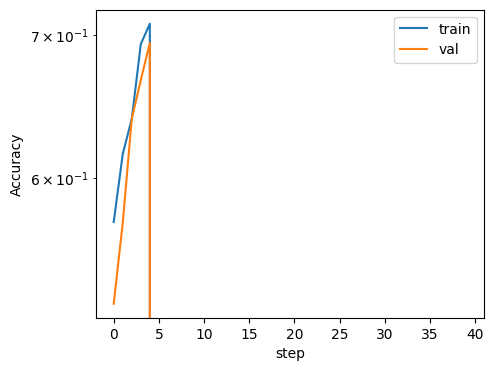

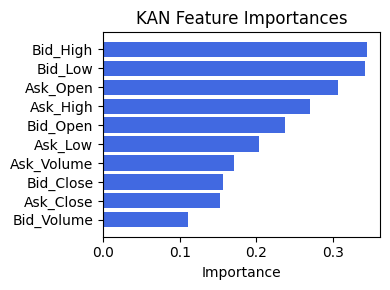

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.24990658281492806), ('Bid_Close', 0.20367424996174907), ('Ask_Low', 0.18675601353263926), ('Ex6', 0.15476899503529445), ('Ex1', 0.14735174533652207), ('Ask_Volume', 0.13319341790334546), ('Ask_Close', 0.11457204618468235), ('Ask_High', 0.11271401002815333), ('Ex4', 0.10593521492408235), ('Ex5', 0.10593521492408235), ('Ask_Open', 0.105660190853374), ('Bid_High', 0.10237403147966836), ('Bid_Low', 0.10219162489349093), ('Bid_Open', 0.08562552451716904), ('Ex3', 0.08213088580960572), ('Bid_Volume', 0.08128322960747969)]


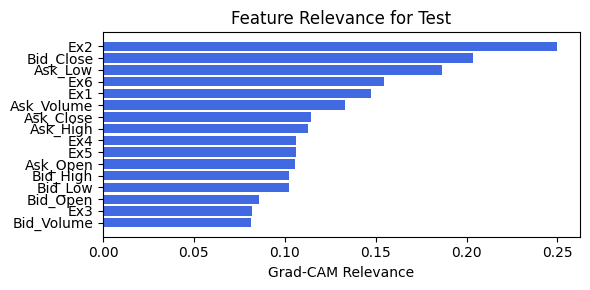

hidden_dim: 32
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 7.68e-01 | val_acc_hybrid: 6.87e-01 |: 100%|█████| 40/40 [01:08<00:00,  1.71s/it]

saving model version 0.1
✅ Best validation Accuracy: 6.9048e-01 at 5 epoch
tensor(0.6812, device='cuda:0')
[[138  45]
 [ 72 112]]
M_KAN Relevance: 0.017183924093842506
CNN Relevance: 0.9828160405158997
[('Bid_High', 0.27086815), ('Bid_Low', 0.20584238), ('Ask_Open', 0.18148652), ('Ask_High', 0.18135712), ('Bid_Close', 0.17003787), ('Ask_Close', 0.16238938), ('Ask_Low', 0.15502495), ('Bid_Open', 0.15034689), ('Ask_Volume', 0.13378376), ('Bid_Volume', 0.115862966)]


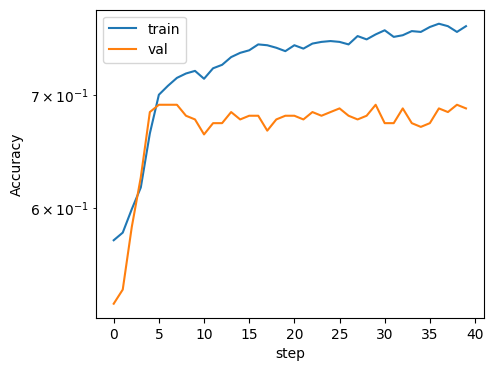

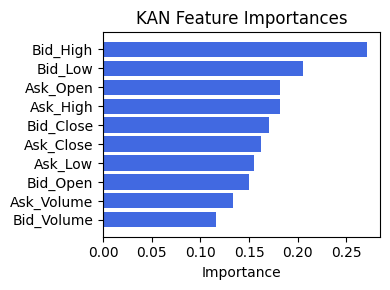

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.1889586933545395), ('Ask_Close', 0.18690596837854923), ('Bid_Volume', 0.15990882808465018), ('Bid_Open', 0.13671793797870524), ('Ex3', 0.1182172430891097), ('Ex2', 0.07433183917684394), ('Bid_Close', 0.048286017232737254), ('Ask_Volume', 0.04696437938783409), ('Ask_High', 0.03724382380505755), ('Bid_Low', 0.03472759216809417), ('Bid_High', 0.03410253881688001), ('Ex1', 0.030711546113932814), ('Ask_Open', 0.025072022853799836), ('Ex4', 0.006349739857774218), ('Ex5', 0.006349739857774218), ('Ex6', 0.00010057385552202527)]


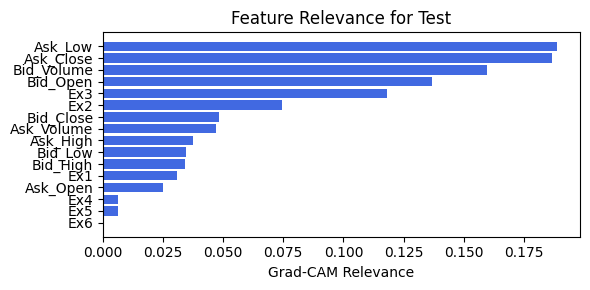

hidden_dim: 16
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 40/40 [01:08<00:00,  1.70s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 19 epoch
tensor(0.6866, device='cuda:0')
[[122  61]
 [ 54 130]]
M_KAN Relevance: 0.005065863952040672
CNN Relevance: 0.9949341416358948
[('Bid_Low', 0.5754451), ('Bid_High', 0.3535362), ('Ask_Open', 0.32555032), ('Bid_Open', 0.30862474), ('Ask_High', 0.2402463), ('Bid_Volume', 0.20899908), ('Ask_Low', 0.19962677), ('Ask_Volume', 0.18667614), ('Bid_Close', 0.1745112), ('Ask_Close', 0.16564536)]


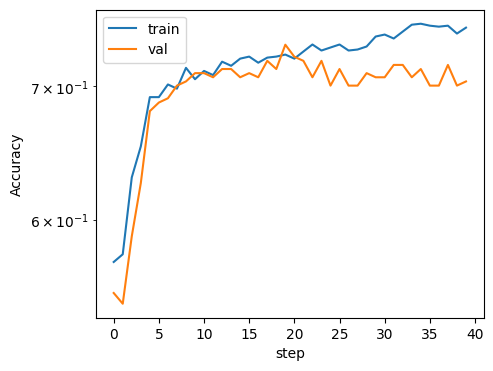

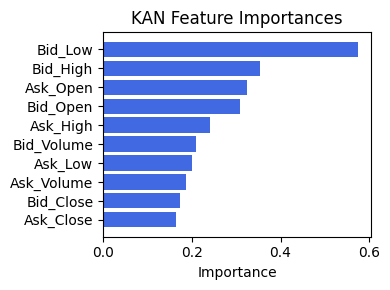

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.6508646152326101), ('Ex2', 0.6164185504253944), ('Bid_Close', 0.5106755117771573), ('Ask_High', 0.26032755928058865), ('Ask_Volume', 0.24312928049945354), ('Ex3', 0.21174641555728396), ('Bid_Low', 0.17570053855714082), ('Bid_High', 0.1719610382043785), ('Ex1', 0.1522327642253415), ('Ask_Open', 0.1499051539822399), ('Ex4', 0.10455166028903884), ('Ex5', 0.10455166028903884), ('Bid_Volume', 0.08319317371021252), ('Ask_Close', 0.07478919354608735), ('Bid_Open', 0.07297263378024844), ('Ex6', 0.019427216130003335)]


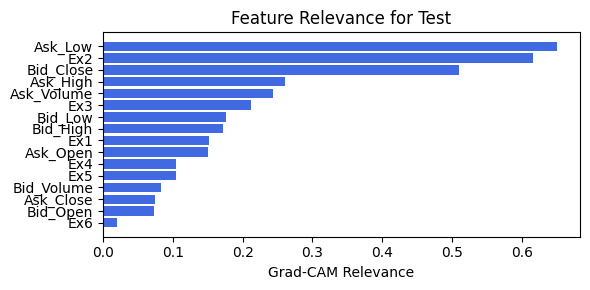

hidden_dim: 8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_3


 train_acc_hybrid: 7.90e-01 | val_acc_hybrid: 6.67e-01 |: 100%|█████| 40/40 [01:05<00:00,  1.63s/it]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 4 epoch
tensor(0.6594, device='cuda:0')
[[106  77]
 [ 48 136]]
M_KAN Relevance: 0.00020135357044637203
CNN Relevance: 0.9997986555099487
[('Bid_Low', 0.4434135), ('Bid_High', 0.36574107), ('Ask_Open', 0.3499586), ('Bid_Open', 0.29142568), ('Ask_High', 0.28111443), ('Bid_Close', 0.22243881), ('Ask_Low', 0.20559195), ('Ask_Volume', 0.18005869), ('Ask_Close', 0.15162042), ('Bid_Volume', 0.1501209)]


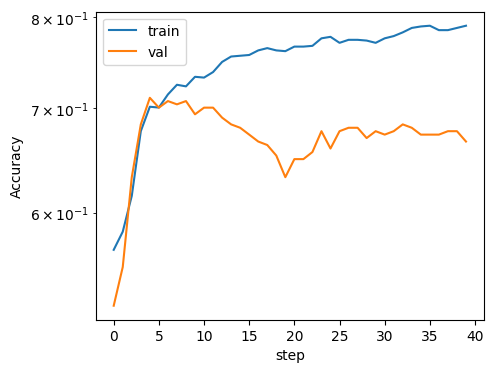

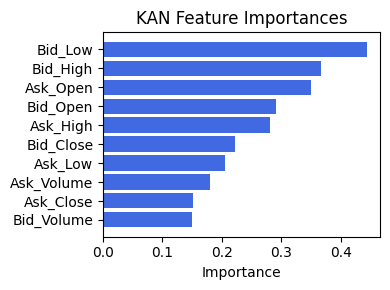

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.8645424006902677), ('Ask_Volume', 0.856178230217757), ('Ask_Close', 0.774005769449984), ('Ask_High', 0.6540500062111161), ('Ask_Open', 0.6009878414335384), ('Bid_Volume', 0.5472710842890944), ('Bid_High', 0.38450561946496487), ('Bid_Low', 0.3823037652177635), ('Bid_Open', 0.3704028410922066), ('Ex4', 0.300762241414738), ('Ex5', 0.300762241414738), ('Ex3', 0.28591297527112836), ('Ex2', 0.1456162584416615), ('Ask_Low', 0.13229031661851776), ('Ex6', 0.08145680424054845), ('Bid_Close', 0.07857974456421453)]


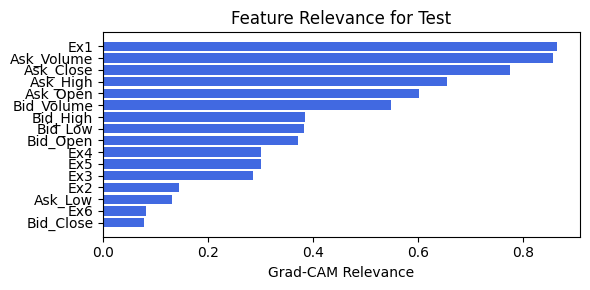

In [123]:
for hidden_dim in [128, 64, 32, 16, 8]:
    print(f"hidden_dim: {hidden_dim}")
    train_and_plot_relevance(Model4_3, kan_neurons=3, kan_grid=5, lamb=0.0001, steps=40, 
                             hidden_dim=hidden_dim, filename=filename_3, opt_col_val=hidden_dim)

# Opt4: MultiHead Attention

In [126]:
create_csv_with_header(filename_4, columns_opt4)

## 4.0. width=[10, 3], grid=3, lamb=1e-05

embed_dim: 64, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.32e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.66it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 17 epoch
tensor(0.7057, device='cuda:0')
[[131  52]
 [ 56 128]]
M_KAN Relevance: 0.010041370056569576
CNN Relevance: 0.9899585843086243
[('Bid_Open', 0.65398157), ('Bid_Low', 0.6535365), ('Ask_Low', 0.5226623), ('Ask_High', 0.452653), ('Bid_High', 0.39661288), ('Bid_Volume', 0.29614967), ('Bid_Close', 0.20110606), ('Ask_Close', 0.19000249), ('Ask_Volume', 0.1870457), ('Ask_Open', 0.11810373)]


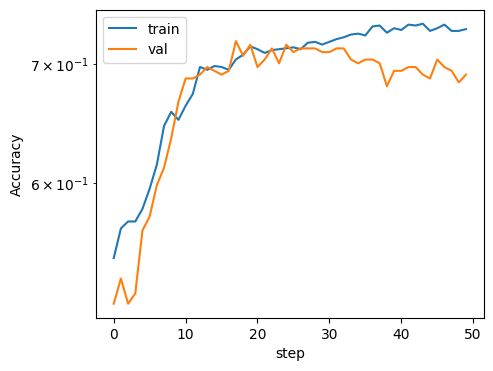

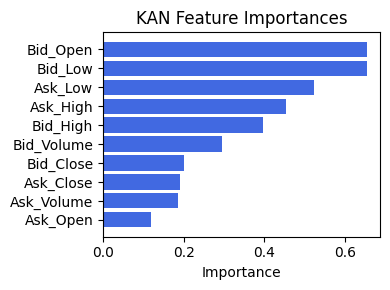

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.4678202046400852), ('Ask_High', 0.4509099955422796), ('Ex2', 0.4063918515456186), ('Ask_Open', 0.3519014870807876), ('Bid_Close', 0.24973000554661), ('Bid_Volume', 0.2012940668627843), ('Ask_Volume', 0.19448743034421206), ('Ex1', 0.18186977062100285), ('Ask_Close', 0.15707773528612481), ('Bid_High', 0.13726428412938269), ('Bid_Low', 0.13706903069079296), ('Bid_Open', 0.0789812958391849), ('Ex3', 0.052753165785517614), ('Ex4', 0.023914991545539135), ('Ex5', 0.023914991545539135), ('Ex6', 0.01615075643449092)]


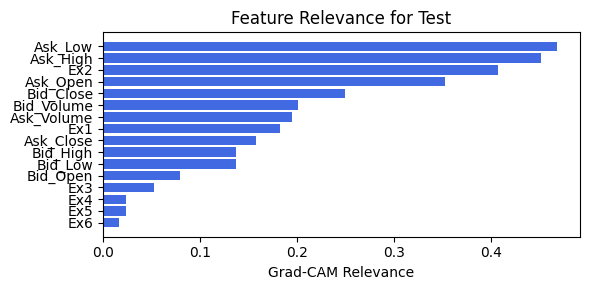

embed_dim: 64, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.35e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 50/50 [00:19<00:00,  2.59it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 26 epoch
tensor(0.7084, device='cuda:0')
[[133  50]
 [ 57 127]]
M_KAN Relevance: 0.006859289016574621
CNN Relevance: 0.993140697479248
[('Bid_Open', 0.6645173), ('Bid_Low', 0.66349834), ('Ask_Low', 0.5315787), ('Ask_High', 0.45956573), ('Bid_High', 0.405245), ('Bid_Volume', 0.30058485), ('Bid_Close', 0.2065413), ('Ask_Close', 0.1942974), ('Ask_Volume', 0.18990016), ('Ask_Open', 0.118856154)]


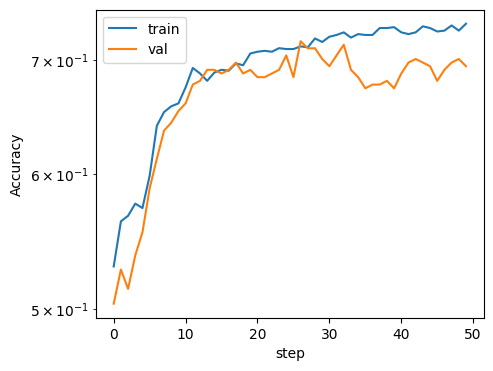

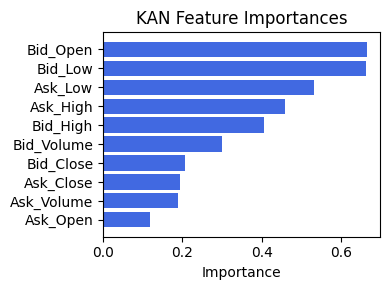

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.39441472129155286), ('Ask_Low', 0.27524884314877707), ('Ask_High', 0.06116514269209261), ('Ask_Close', 0.055401330135574904), ('Bid_Close', 0.04357611621436345), ('Ex6', 0.042835121722803106), ('Ex1', 0.03711711749058897), ('Bid_Volume', 0.03665221045997529), ('Ask_Open', 0.026717007737822464), ('Ask_Volume', 0.02441609247877232), ('Bid_Open', 0.011404881200388997), ('Ex4', 0.00723450895581567), ('Ex5', 0.00723450895581567), ('Ex3', 0.006782389026419425), ('Bid_High', 0.006137606747478896), ('Bid_Low', 0.005972572835717396)]


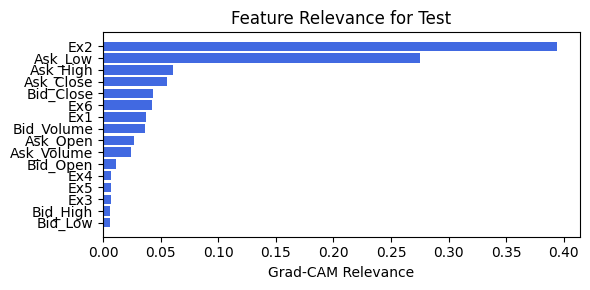

embed_dim: 64, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.34e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 50/50 [00:17<00:00,  2.81it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 27 epoch
tensor(0.7193, device='cuda:0')
[[134  49]
 [ 54 130]]
M_KAN Relevance: 0.010378719307482243
CNN Relevance: 0.9896212816238403
[('Bid_Open', 0.7010459), ('Bid_Low', 0.69814146), ('Ask_Low', 0.56247896), ('Ask_High', 0.48524484), ('Bid_High', 0.43512163), ('Bid_Volume', 0.31590554), ('Bid_Close', 0.22841911), ('Ask_Close', 0.21607535), ('Ask_Volume', 0.19984981), ('Ask_Open', 0.13008033)]


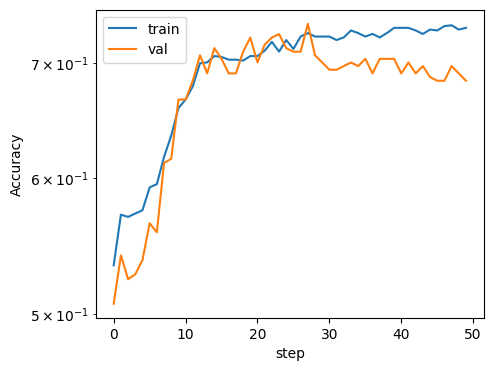

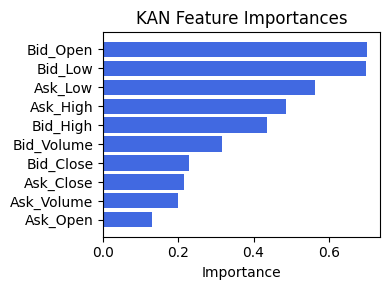

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.5807534773664026), ('Ask_Low', 0.38968015792056393), ('Bid_Close', 0.10105382778406002), ('Ex3', 0.016728160055278107), ('Ex6', 0.015284610059707392), ('Ask_Close', 0.012157288263234683), ('Bid_Low', 0.011587524933776024), ('Bid_High', 0.010458411906006219), ('Bid_Open', 0.009945836810811298), ('Bid_Volume', 0.009298175735759475), ('Ask_Volume', 0.008754384183713135), ('Ex4', 0.007526607823631744), ('Ex5', 0.007526607823631744), ('Ask_Open', 0.006990402855730187), ('Ex1', 0.006969051643678213), ('Ask_High', 0.006660466902138797)]


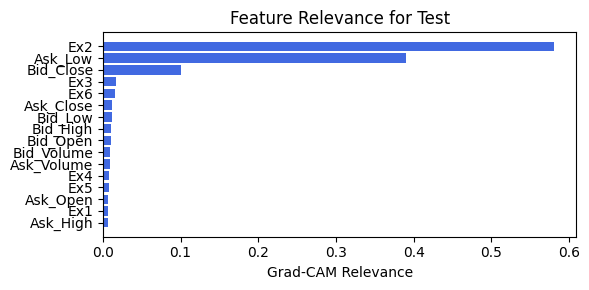

embed_dim: 32, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.10e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 50/50 [00:17<00:00,  2.86it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0068e-01 at 25 epoch
tensor(0.6812, device='cuda:0')
[[112  71]
 [ 46 138]]
M_KAN Relevance: 0.15729069709777832
CNN Relevance: 0.8427093029022217
[('Bid_Low', 0.62548137), ('Bid_Open', 0.62401664), ('Ask_Low', 0.49763066), ('Ask_High', 0.43444785), ('Bid_High', 0.37215424), ('Bid_Volume', 0.28362656), ('Ask_Close', 0.19004397), ('Bid_Close', 0.18802652), ('Ask_Volume', 0.17924821), ('Ask_Open', 0.11868507)]


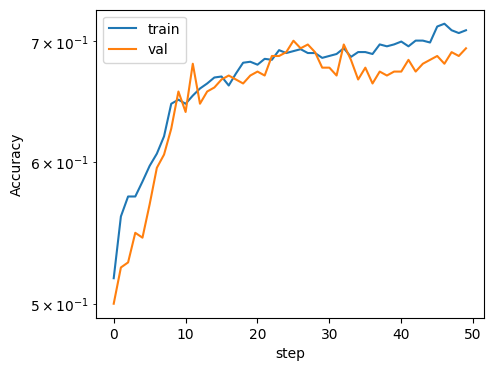

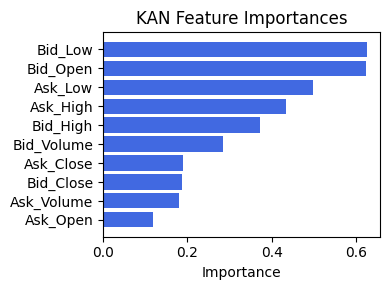

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.43257537933462364), ('Ex5', 0.43257537933462364), ('Ex3', 0.41703546499929894), ('Ex2', 0.3651182298897131), ('Ex1', 0.2993245021635489), ('Ask_Volume', 0.28309689314270836), ('Ask_Low', 0.21742211243641127), ('Ask_Close', 0.20042732680595177), ('Bid_Volume', 0.1510613197773617), ('Ex6', 0.1488634999334712), ('Ask_Open', 0.1291500089299289), ('Bid_Close', 0.12753067447357286), ('Ask_High', 0.10985870304712848), ('Bid_Open', 0.10847838497809477), ('Bid_High', 0.10838119570158418), ('Bid_Low', 0.1082080369881844)]


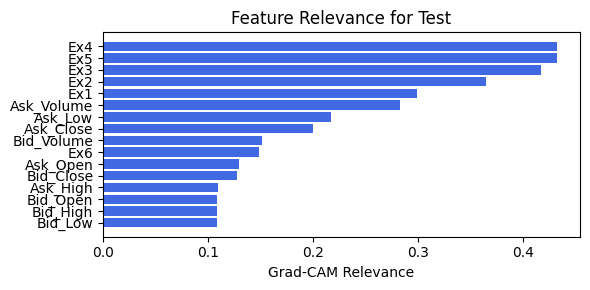

embed_dim: 32, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.29e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 50/50 [00:20<00:00,  2.49it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 46 epoch
tensor(0.7139, device='cuda:0')
[[140  43]
 [ 62 122]]
M_KAN Relevance: 0.002982066012918949
CNN Relevance: 0.9970179200172424
[('Bid_Low', 0.6311647), ('Bid_Open', 0.6306294), ('Ask_Low', 0.50245875), ('Ask_High', 0.43680972), ('Bid_High', 0.37715393), ('Bid_Volume', 0.28628048), ('Bid_Close', 0.18963572), ('Ask_Close', 0.18686323), ('Ask_Volume', 0.18044484), ('Ask_Open', 0.11610448)]


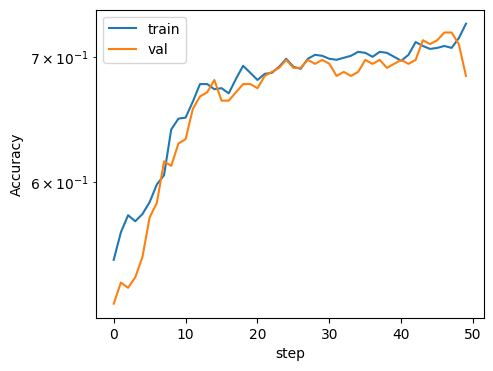

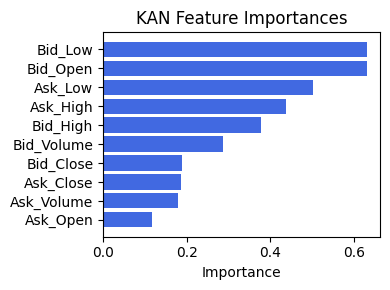

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.8268445003546974), ('Ask_Low', 0.5134015212819483), ('Ex6', 0.3474659397115854), ('Bid_Close', 0.3414821051396125), ('Ex4', 0.12206730050683828), ('Ex5', 0.12206730050683828), ('Ex3', 0.052610228355842004), ('Ex1', 0.04974518387454082), ('Ask_Volume', 0.04722309314546858), ('Ask_Close', 0.03860720926616595), ('Ask_High', 0.03608429128743774), ('Ask_Open', 0.03298962067898962), ('Bid_Volume', 0.027221721744834768), ('Bid_Low', 0.024392706668765692), ('Bid_High', 0.023575405080165784), ('Bid_Open', 0.021976035496864558)]


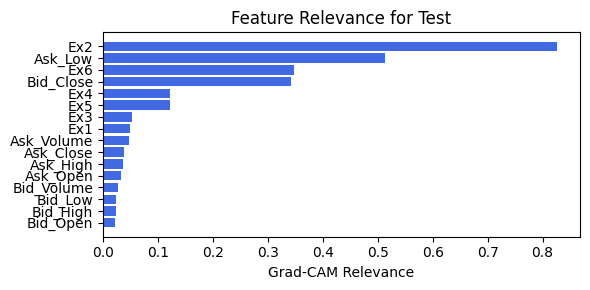

embed_dim: 32, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.43e-01 | val_acc_hybrid: 7.11e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.76it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 15 epoch
tensor(0.7030, device='cuda:0')
[[116  67]
 [ 42 142]]
M_KAN Relevance: 0.0630948394536972
CNN Relevance: 0.9369052052497864
[('Bid_Open', 0.6533794), ('Bid_Low', 0.6530708), ('Ask_Low', 0.52212834), ('Ask_High', 0.4526752), ('Bid_High', 0.39589378), ('Bid_Volume', 0.29589343), ('Bid_Close', 0.20115113), ('Ask_Close', 0.18995617), ('Ask_Volume', 0.18692493), ('Ask_Open', 0.11983068)]


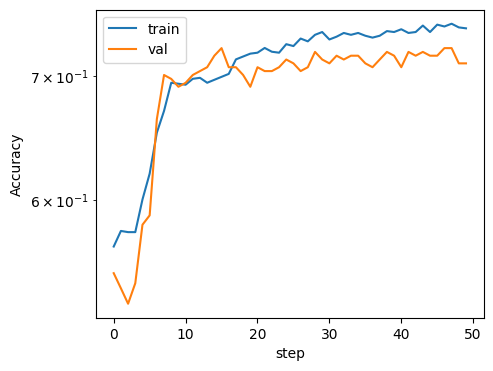

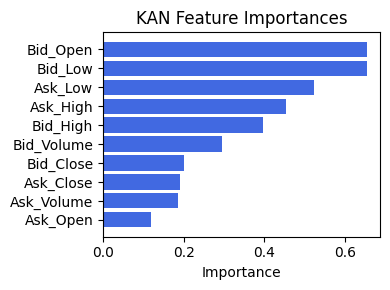

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.6317259590737826), ('Ex5', 0.6317259590737826), ('Ex2', 0.5992421682832676), ('Ex3', 0.5055609520940917), ('Ex1', 0.45648583622613786), ('Ask_Low', 0.36725557003708237), ('Ex6', 0.32585401076833626), ('Ask_Volume', 0.3055273129196193), ('Bid_Close', 0.2907810778000547), ('Ask_High', 0.2642095554645404), ('Ask_Open', 0.23889679861780286), ('Ask_Close', 0.17247585305685242), ('Bid_Volume', 0.13521172971292134), ('Bid_Low', 0.13106433141022433), ('Bid_High', 0.12636998176513803), ('Bid_Open', 0.06748492170216602)]


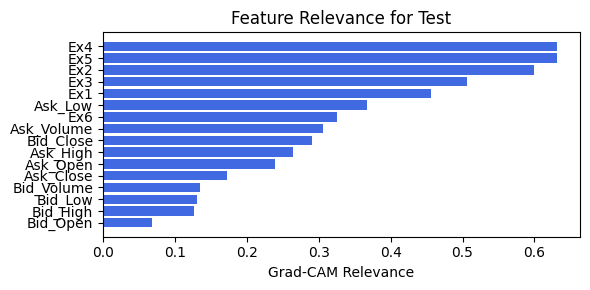

embed_dim: 16, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.20e-01 | val_acc_hybrid: 7.21e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.70it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 46 epoch
tensor(0.7084, device='cuda:0')
[[125  58]
 [ 49 135]]
M_KAN Relevance: 0.22756284475326538
CNN Relevance: 0.7724371552467346
[('Bid_Low', 0.5807968), ('Bid_Open', 0.577496), ('Ask_Low', 0.45835537), ('Ask_High', 0.4028512), ('Bid_High', 0.33561188), ('Bid_Volume', 0.26412684), ('Ask_Close', 0.19550143), ('Ask_Volume', 0.1665973), ('Bid_Close', 0.16639131), ('Ask_Open', 0.11568825)]


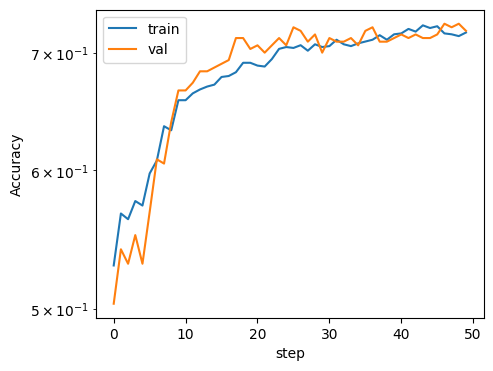

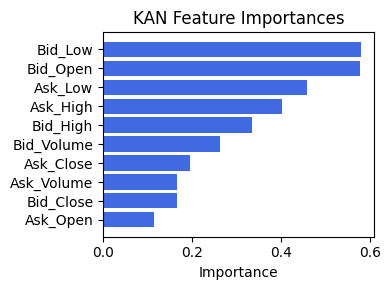

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.6899262624811787), ('Bid_Volume', 0.5042752619519492), ('Ask_Volume', 0.4032540161479664), ('Ask_High', 0.3876011964004761), ('Ask_Open', 0.3747396804378286), ('Bid_Open', 0.3495343929595677), ('Ex1', 0.3321437722764153), ('Ex3', 0.2264444498562226), ('Bid_High', 0.2057724887672025), ('Bid_Low', 0.2037233268325528), ('Ex4', 0.09124062602557001), ('Ex5', 0.09124062602557001), ('Ex2', 0.05594434098323759), ('Ask_Low', 0.03572250014280124), ('Bid_Close', 0.02985540156558022), ('Ex6', 0.023077854761829705)]


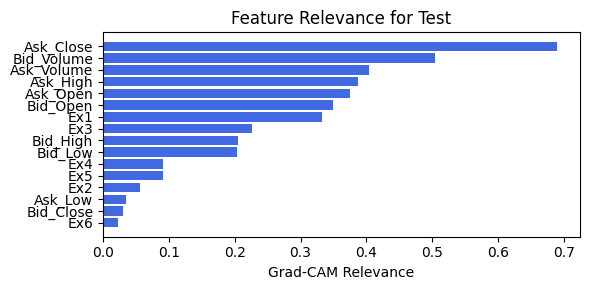

embed_dim: 16, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.30e-01 | val_acc_hybrid: 7.01e-01 |: 100%|█████| 50/50 [00:20<00:00,  2.48it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 31 epoch
tensor(0.7084, device='cuda:0')
[[118  65]
 [ 42 142]]
M_KAN Relevance: 0.07261980324983597
CNN Relevance: 0.9273801445960999
[('Bid_Low', 0.6182789), ('Bid_Open', 0.6170716), ('Ask_Low', 0.49107903), ('Ask_High', 0.4272407), ('Bid_High', 0.36621922), ('Bid_Volume', 0.28065535), ('Ask_Close', 0.18834907), ('Bid_Close', 0.18169026), ('Ask_Volume', 0.17683429), ('Ask_Open', 0.11270039)]


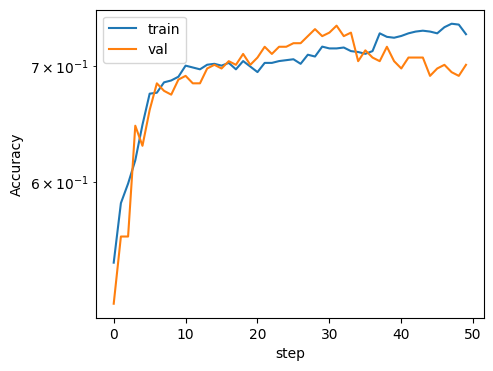

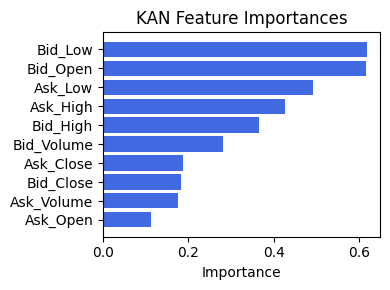

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.7349240259008548), ('Ask_Open', 0.6008500166214198), ('Ask_Low', 0.590801624088911), ('Ex2', 0.4959836360942623), ('Ask_Volume', 0.46428770404477154), ('Bid_Close', 0.37837962293870525), ('Ex1', 0.3355292163700295), ('Bid_High', 0.3097086127026499), ('Bid_Volume', 0.308705901256485), ('Bid_Low', 0.3078119129213544), ('Ask_Close', 0.20543961696661706), ('Bid_Open', 0.13996670503398956), ('Ex6', 0.05673717263240966), ('Ex3', 0.018503939339809237), ('Ex4', 0.0061315366301567574), ('Ex5', 0.0061315366301567574)]


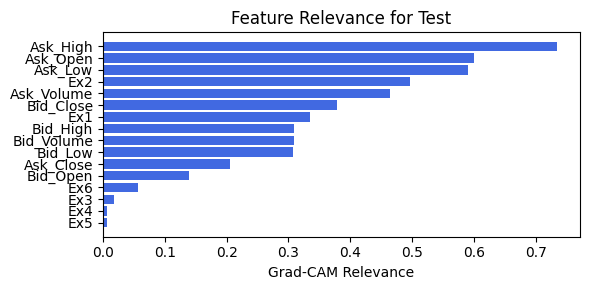

embed_dim: 16, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.50e-01 | val_acc_hybrid: 6.70e-01 |: 100%|█████| 50/50 [00:21<00:00,  2.37it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 10 epoch
tensor(0.7084, device='cuda:0')
[[130  53]
 [ 54 130]]
M_KAN Relevance: 0.4825440049171448
CNN Relevance: 0.5174560546875
[('Bid_Open', 0.68146205), ('Bid_Low', 0.67965835), ('Ask_Low', 0.5458503), ('Ask_High', 0.4714954), ('Bid_High', 0.41880783), ('Bid_Volume', 0.30768168), ('Bid_Close', 0.2162371), ('Ask_Close', 0.20402364), ('Ask_Volume', 0.19452916), ('Ask_Open', 0.12421207)]


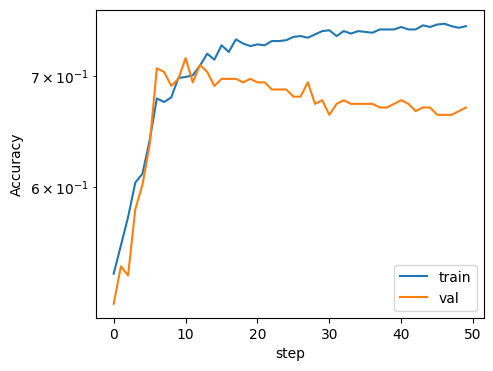

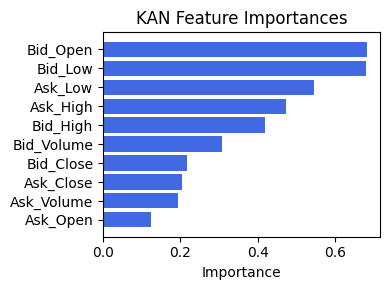

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.4489205726485811), ('Ex2', 0.44375571890731597), ('Ask_Volume', 0.4413215475821771), ('Ask_Open', 0.38252105677946996), ('Ask_High', 0.3742475893942586), ('Ex1', 0.35435194140477794), ('Bid_High', 0.34605081477874955), ('Bid_Close', 0.34460594048292176), ('Bid_Low', 0.34189956171351815), ('Bid_Open', 0.25557960318122314), ('Ask_Close', 0.2335808486235201), ('Bid_Volume', 0.21918074282175515), ('Ex6', 0.1289568287231617), ('Ex3', 0.0407689892570845), ('Ex4', 0.038175314239464825), ('Ex5', 0.038175314239464825)]


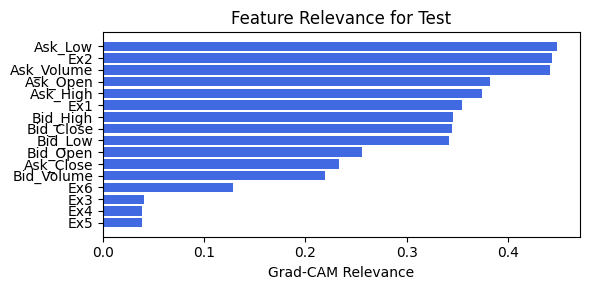

In [127]:
for embed_dim in [64, 32, 16]:
    for num_head in [2, 4 , 8]:
        print(f"embed_dim: {embed_dim}, num_head:{num_head}")
        train_and_plot_relevance(Model4_4, kan_neurons=3, kan_grid=3, lamb=1e-05, steps=50, 
                                 embed_dim=embed_dim, num_heads=num_head, filename=filename_4, opt_col_val=f'{embed_dim}, {num_head}')

## 4.1. width=[10, 2], grid=4, lamb=1e-07

embed_dim: 64, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.08e-01 | val_acc_hybrid: 7.14e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.74it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 29 epoch
tensor(0.6894, device='cuda:0')
[[110  73]
 [ 41 143]]
M_KAN Relevance: 0.0011304409708827734
CNN Relevance: 0.9988695383071899
[('Bid_Close', 2.23672), ('Bid_Low', 1.8269227), ('Ask_Open', 1.5505803), ('Ask_High', 1.3048811), ('Bid_High', 0.9973682), ('Ask_Close', 0.8900415), ('Bid_Open', 0.7311987), ('Ask_Volume', 0.35772103), ('Bid_Volume', 0.2884547), ('Ask_Low', 0.19633533)]


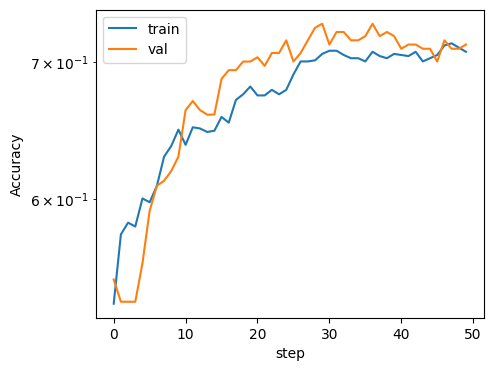

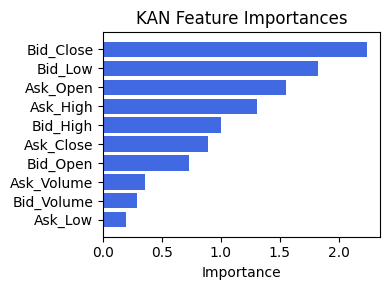

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.7300833858732306), ('Ask_High', 0.6849177547448825), ('Ask_Volume', 0.6175158642123298), ('Ask_Open', 0.5992147066707821), ('Ex2', 0.5755760458980659), ('Ex4', 0.5146786068802146), ('Ex5', 0.5146786068802146), ('Ask_Low', 0.4818739028652617), ('Ask_Close', 0.4100575922792955), ('Bid_Volume', 0.37507787878734217), ('Ex6', 0.34244205036304626), ('Ex3', 0.3365016006648906), ('Bid_Low', 0.26864509328953), ('Bid_High', 0.2654199959832048), ('Bid_Close', 0.2110819214097242), ('Bid_Open', 0.18273198359318543)]


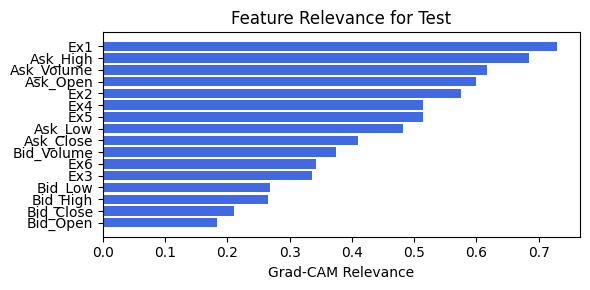

embed_dim: 64, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.27e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 50/50 [00:17<00:00,  2.81it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 27 epoch
tensor(0.6839, device='cuda:0')
[[132  51]
 [ 65 119]]
M_KAN Relevance: 0.001143682049587369
CNN Relevance: 0.9988563656806946
[('Bid_Close', 2.2401495), ('Bid_Low', 1.8294215), ('Ask_Open', 1.5524113), ('Ask_High', 1.3061332), ('Bid_High', 0.9982152), ('Ask_Close', 0.8906625), ('Bid_Open', 0.73157936), ('Ask_Volume', 0.35809958), ('Bid_Volume', 0.28827962), ('Ask_Low', 0.19585586)]


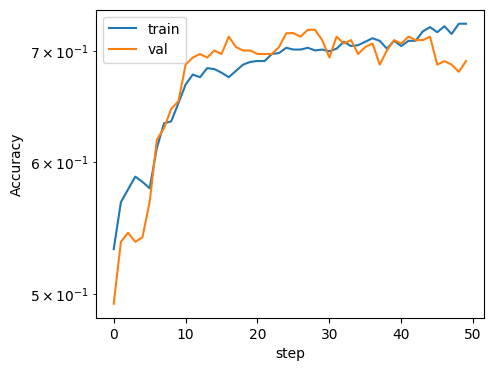

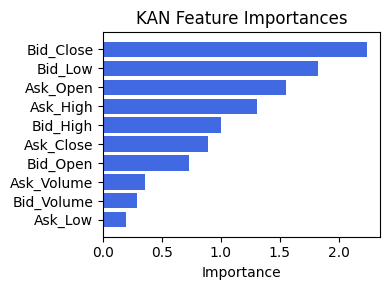

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.7327745356229045), ('Ex2', 0.6454350851585312), ('Bid_Close', 0.46436231563341035), ('Ask_High', 0.09315624287763068), ('Ask_Open', 0.05615874008803402), ('Ask_Volume', 0.04455437217344218), ('Ex1', 0.0444416316880842), ('Ask_Close', 0.04211334944055581), ('Bid_Volume', 0.04130893733545285), ('Ex6', 0.039544692942149406), ('Bid_Low', 0.026739382471480694), ('Bid_High', 0.02458063259492254), ('Bid_Open', 0.022564008082256826), ('Ex4', 0.010092713730536624), ('Ex5', 0.010092713730536624), ('Ex3', 0.009643642145541448)]


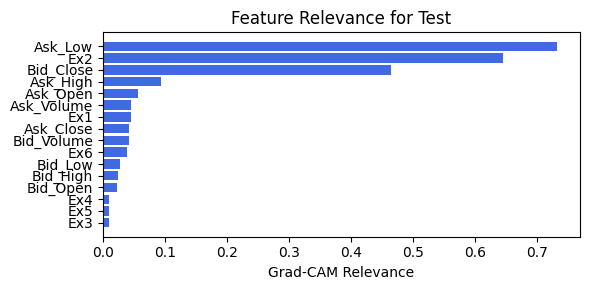

embed_dim: 64, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.38e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.75it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 35 epoch
tensor(0.6948, device='cuda:0')
[[135  48]
 [ 64 120]]
M_KAN Relevance: 0.0008813063031993806
CNN Relevance: 0.9991187453269958
[('Bid_Close', 2.2390225), ('Bid_Low', 1.8286016), ('Ask_Open', 1.5518115), ('Ask_High', 1.3057233), ('Bid_High', 0.997936), ('Ask_Close', 0.89045763), ('Bid_Open', 0.7314539), ('Ask_Volume', 0.35797518), ('Bid_Volume', 0.28833658), ('Ask_Low', 0.19601244)]


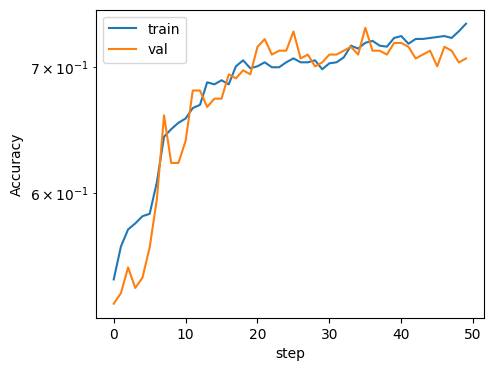

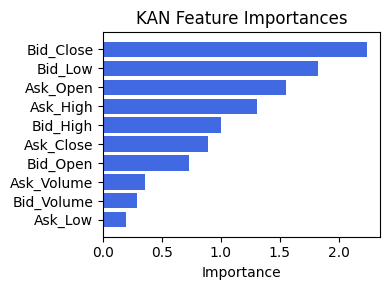

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.7821781771290509), ('Ask_Low', 0.6797021213839156), ('Ex4', 0.3738098501320421), ('Ex5', 0.3738098501320421), ('Bid_Close', 0.2814874402282262), ('Ex6', 0.2802856891032271), ('Ex3', 0.19716200222291702), ('Ask_Close', 0.06314813686098285), ('Ask_High', 0.0601382381967916), ('Bid_Open', 0.05602657322962806), ('Bid_Low', 0.05193847868266726), ('Bid_High', 0.050808199995218926), ('Bid_Volume', 0.04973406448442621), ('Ask_Volume', 0.04931669362709028), ('Ex1', 0.04342220182091566), ('Ask_Open', 0.04260603690993203)]


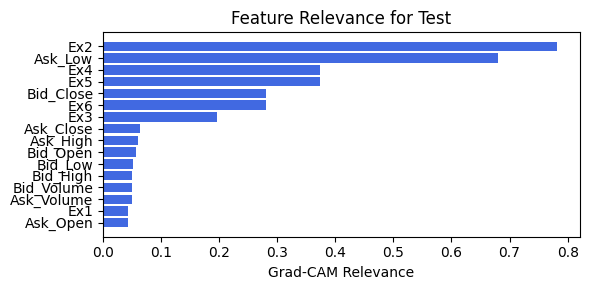

embed_dim: 32, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.36e-01 |: 100%|█████| 50/50 [00:17<00:00,  2.79it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1088e-01 at 11 epoch
tensor(0.7166, device='cuda:0')
[[131  52]
 [ 52 132]]
M_KAN Relevance: 0.011578844860196114
CNN Relevance: 0.9884211421012878
[('Bid_Close', 2.2371228), ('Bid_Low', 1.8272167), ('Ask_Open', 1.5507956), ('Ask_High', 1.305028), ('Bid_High', 0.99746686), ('Ask_Close', 0.89011335), ('Bid_Open', 0.7312429), ('Ask_Volume', 0.35776517), ('Bid_Volume', 0.28843337), ('Ask_Low', 0.19627841)]


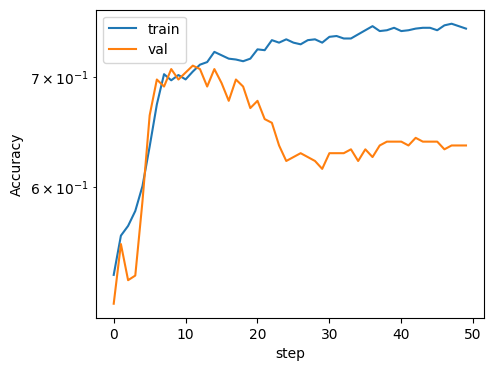

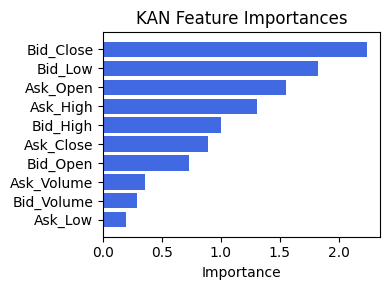

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.5147458457918356), ('Ex2', 0.34596648614990655), ('Ask_High', 0.33643086747664763), ('Ask_Open', 0.1917546525937302), ('Bid_Close', 0.1711457150617782), ('Ex6', 0.13938871700740457), ('Bid_Volume', 0.09053791995403272), ('Bid_Low', 0.0790512465665051), ('Bid_High', 0.07820201807268241), ('Ask_Volume', 0.06754679909670327), ('Bid_Open', 0.0671219101276538), ('Ask_Close', 0.04957847327112261), ('Ex1', 0.021882424277585882), ('Ex4', 0.00022500178875650307), ('Ex5', 0.00022500178875650307), ('Ex3', 8.437567332135235e-05)]


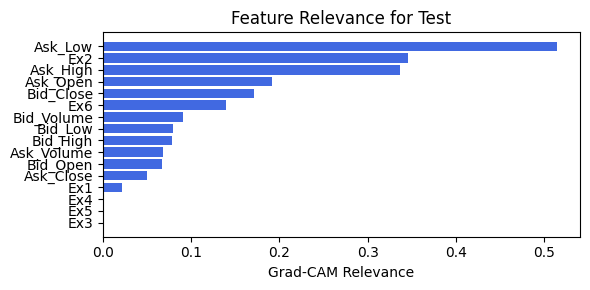

embed_dim: 32, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.50e-01 | val_acc_hybrid: 6.50e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.77it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1429e-01 at 13 epoch
tensor(0.7084, device='cuda:0')
[[132  51]
 [ 56 128]]
M_KAN Relevance: 0.01748165301978588
CNN Relevance: 0.9825183153152466
[('Bid_Close', 2.2374444), ('Bid_Low', 1.8274503), ('Ask_Open', 1.5509657), ('Ask_High', 1.305146), ('Bid_High', 0.99754536), ('Ask_Close', 0.89017177), ('Bid_Open', 0.73127913), ('Ask_Volume', 0.35780075), ('Bid_Volume', 0.28841725), ('Ask_Low', 0.19623426)]


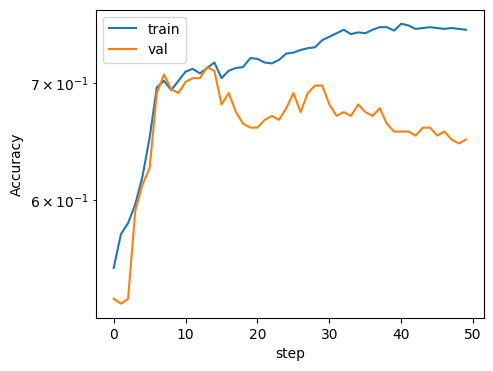

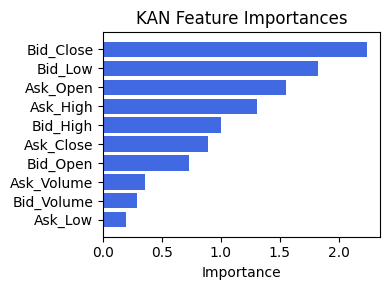

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.5071679869916021), ('Ex2', 0.327106303956654), ('Ask_High', 0.31902400238822626), ('Ask_Open', 0.19538941430828816), ('Bid_Close', 0.12608878050260855), ('Bid_Volume', 0.05814582816809188), ('Ask_Volume', 0.02953235234655072), ('Ex6', 0.02935789503446819), ('Ask_Close', 0.02067008400601173), ('Bid_Low', 0.007478347751116082), ('Bid_High', 0.007466173161402324), ('Ex1', 0.003882962443652672), ('Bid_Open', 0.002798086341291416), ('Ex3', 0.0004010697324285715), ('Ex4', 0.0002809155710823123), ('Ex5', 0.0002809155710823123)]


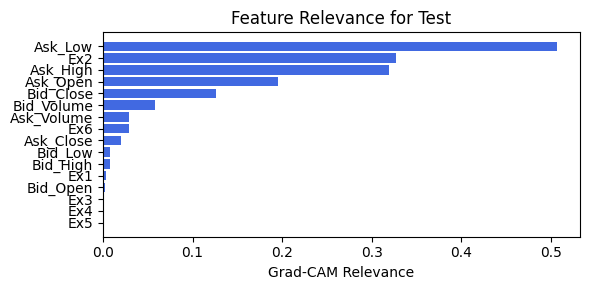

embed_dim: 32, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.43e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 50/50 [00:17<00:00,  2.87it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 15 epoch
tensor(0.7030, device='cuda:0')
[[133  50]
 [ 59 125]]
M_KAN Relevance: 0.0012717308709397912
CNN Relevance: 0.9987282156944275
[('Bid_Close', 2.2412884), ('Bid_Low', 1.8302524), ('Ask_Open', 1.5530195), ('Ask_High', 1.3065488), ('Bid_High', 0.99849594), ('Ask_Close', 0.8908675), ('Bid_Open', 0.73170435), ('Ask_Volume', 0.35822526), ('Bid_Volume', 0.28822044), ('Ask_Low', 0.19569549)]


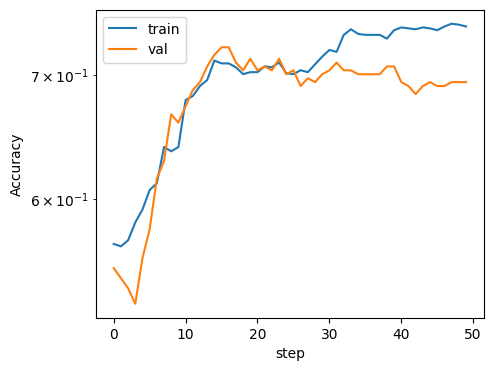

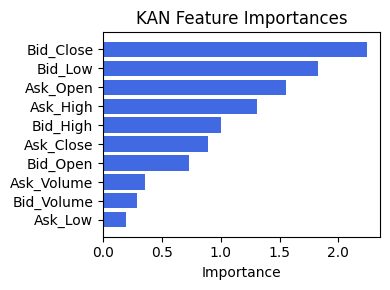

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.8212710042009561), ('Ex2', 0.7468620917533983), ('Bid_Close', 0.4280977226814067), ('Ex6', 0.3266487924245057), ('Ex4', 0.07756028508853766), ('Ex5', 0.07756028508853766), ('Ex3', 0.03202880614460002), ('Ask_High', 0.001877489558114018), ('Ask_Open', 0.0012064057780424645), ('Bid_Low', 0.0007304922152280158), ('Bid_High', 0.0005157101088601903), ('Bid_Volume', 0.000509436477016282), ('Ask_Close', 0.00042663012410460767), ('Bid_Open', 0.0002328906771638088), ('Ask_Volume', 0.00017740509449948406), ('Ex1', 0.0)]


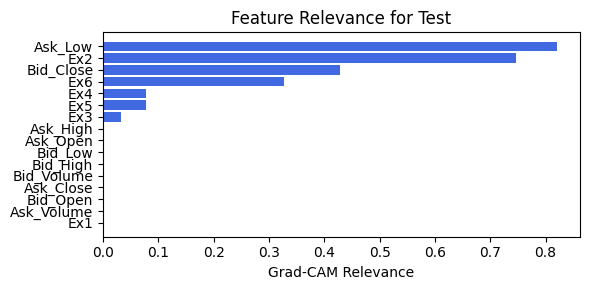

embed_dim: 16, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.66e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 50/50 [00:19<00:00,  2.52it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 12 epoch
tensor(0.7003, device='cuda:0')
[[108  75]
 [ 35 149]]
M_KAN Relevance: 0.008746671490371227
CNN Relevance: 0.9912533164024353
[('Bid_Close', 2.2417536), ('Bid_Low', 1.8305899), ('Ask_Open', 1.5532674), ('Ask_High', 1.3067185), ('Bid_High', 0.99861157), ('Ask_Close', 0.890952), ('Bid_Open', 0.73175734), ('Ask_Volume', 0.35827696), ('Bid_Volume', 0.28819713), ('Ask_Low', 0.19563192)]


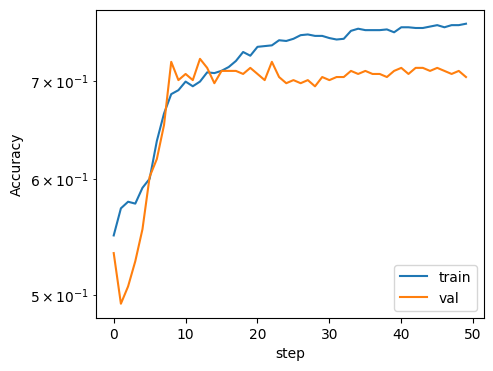

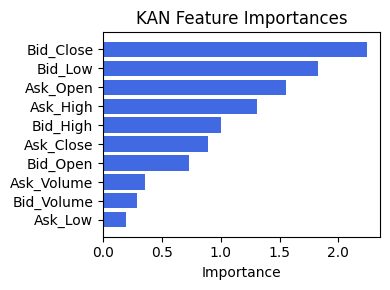

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Close', 0.6718466094103756), ('Ex1', 0.6108266276888529), ('Ask_Volume', 0.6029945551861859), ('Ask_Open', 0.5519090081521941), ('Bid_Volume', 0.5060255194757874), ('Ask_High', 0.49880912404619054), ('Bid_Open', 0.41700122326774886), ('Bid_High', 0.34137180114636956), ('Bid_Low', 0.33589302138387345), ('Ex4', 0.2519567618527188), ('Ex5', 0.2519567618527188), ('Ex6', 0.24080989631755678), ('Ex3', 0.17476473540468623), ('Ex2', 0.03446694932515131), ('Bid_Close', 0.029537763665720494), ('Ask_Low', 0.02886183559119385)]


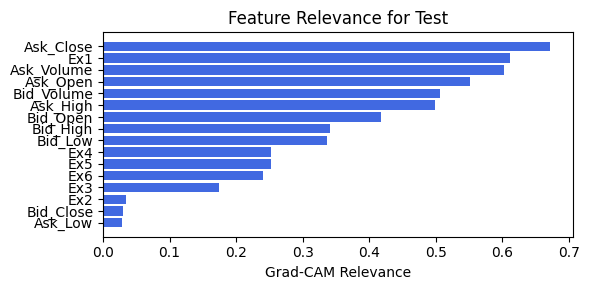

embed_dim: 16, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 6.63e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.72it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 11 epoch
tensor(0.6894, device='cuda:0')
[[136  47]
 [ 67 117]]
M_KAN Relevance: 0.004122002981603146
CNN Relevance: 0.9958779811859131
[('Bid_Close', 2.2393465), ('Bid_Low', 1.828837), ('Ask_Open', 1.5519828), ('Ask_High', 1.3058404), ('Bid_High', 0.9980154), ('Ask_Close', 0.8905159), ('Bid_Open', 0.7314894), ('Ask_Volume', 0.3580108), ('Bid_Volume', 0.28831974), ('Ask_Low', 0.19596747)]


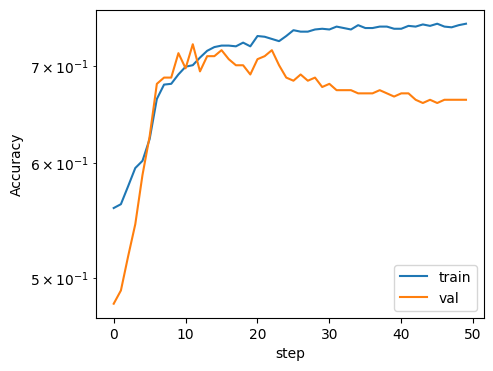

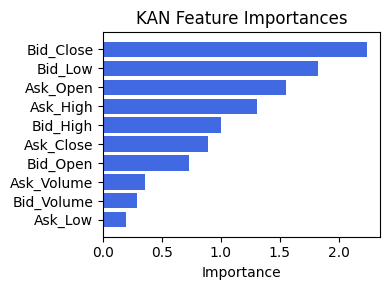

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex3', 0.23834851950569438), ('Bid_Volume', 0.23127528036467487), ('Ask_High', 0.21910351218163399), ('Ask_Open', 0.18446281530966663), ('Ask_Close', 0.1598507992517868), ('Ask_Low', 0.14218850748258838), ('Bid_Open', 0.12673814367259947), ('Bid_Close', 0.10527032660209379), ('Ask_Volume', 0.07567044252727044), ('Bid_High', 0.06161829806345309), ('Bid_Low', 0.061033766004110986), ('Ex4', 0.05504017966807051), ('Ex5', 0.05504017966807051), ('Ex1', 0.04941349232960137), ('Ex2', 0.010738240072138262), ('Ex6', 0.0063356187794743266)]


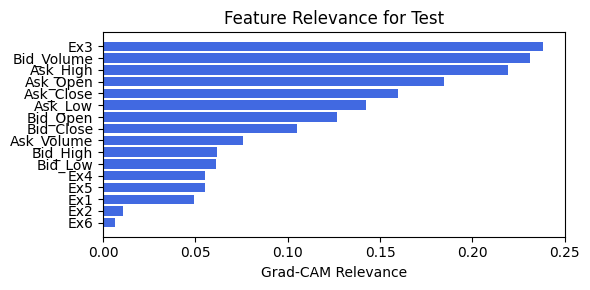

embed_dim: 16, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.60e-01 | val_acc_hybrid: 6.77e-01 |: 100%|█████| 50/50 [00:16<00:00,  2.98it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 16 epoch
tensor(0.7057, device='cuda:0')
[[119  64]
 [ 44 140]]
M_KAN Relevance: 0.031447265297174454
CNN Relevance: 0.9685527086257935
[('Bid_Close', 2.246563), ('Bid_Low', 1.8340911), ('Ask_Open', 1.5558344), ('Ask_High', 1.3084717), ('Bid_High', 0.9997984), ('Ask_Close', 0.89181995), ('Bid_Open', 0.73228765), ('Ask_Volume', 0.3588075), ('Bid_Volume', 0.28795), ('Ask_Low', 0.1949611)]


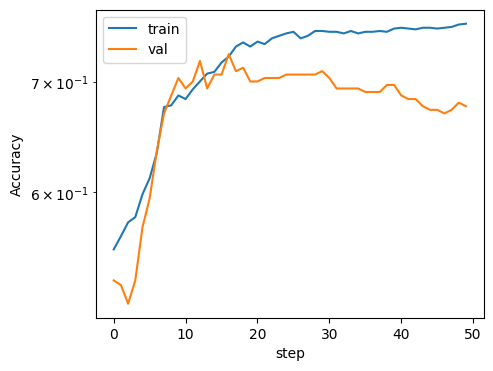

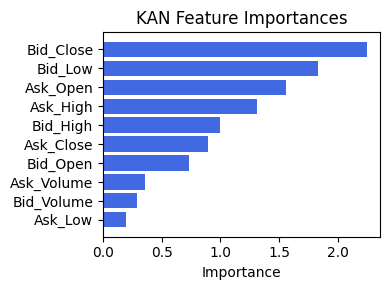

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.6409845830319444), ('Ask_Open', 0.580913322575502), ('Ask_High', 0.535074939828224), ('Ex1', 0.3874556518043074), ('Ask_Low', 0.38306672255539054), ('Ex6', 0.37019433748048075), ('Ask_Volume', 0.3072403452453668), ('Bid_High', 0.2815492841306781), ('Bid_Low', 0.28124798792706196), ('Bid_Close', 0.24112947381035568), ('Ask_Close', 0.2256058283272004), ('Bid_Volume', 0.2248593752680991), ('Bid_Open', 0.17854737227846684), ('Ex4', 0.040986207171726456), ('Ex5', 0.040986207171726456), ('Ex3', 0.024271946423401553)]


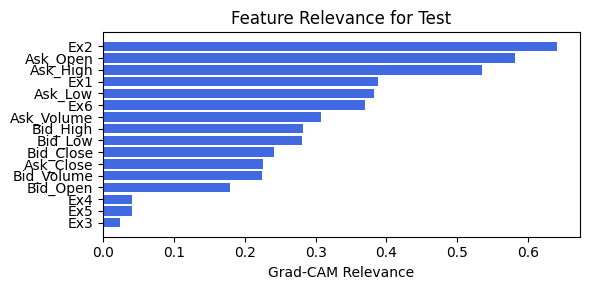

In [128]:
for embed_dim in [64, 32, 16]:
    for num_head in [2, 4 , 8]:
        print(f"embed_dim: {embed_dim}, num_head:{num_head}")
        train_and_plot_relevance(Model4_4, kan_neurons=2, kan_grid=4, lamb=1e-07, steps=50, 
                                 embed_dim=embed_dim, num_heads=num_head, filename=filename_4, opt_col_val=f'{embed_dim}, {num_head}')

## 4.2. width=[10, 4], grid=3, lamb=1e-06

embed_dim: 64, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.23e-01 | val_acc_hybrid: 7.38e-01 |: 100%|█████| 50/50 [00:19<00:00,  2.57it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.4150e-01 at 48 epoch
tensor(0.7139, device='cuda:0')
[[121  62]
 [ 43 141]]
M_KAN Relevance: 0.03233427181839943
CNN Relevance: 0.9676657319068909
[('Bid_Close', 0.60291934), ('Ask_Open', 0.57811505), ('Ask_Close', 0.53285223), ('Bid_Low', 0.52584624), ('Bid_High', 0.4808516), ('Ask_Low', 0.44554818), ('Ask_High', 0.43214023), ('Bid_Open', 0.34443736), ('Bid_Volume', 0.3233859), ('Ask_Volume', 0.16124925)]


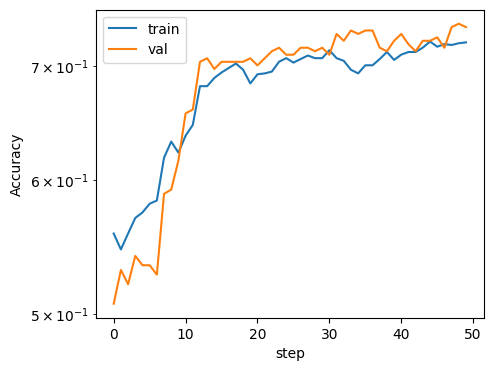

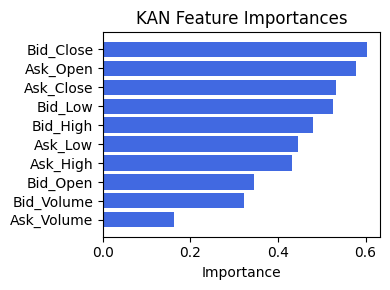

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_Low', 0.4364240534520487), ('Bid_High', 0.43440880500571927), ('Bid_Open', 0.3982200156161384), ('Ask_High', 0.31940074378595373), ('Ask_Close', 0.2882191776894337), ('Ask_Volume', 0.24612450182351617), ('Ex1', 0.22316700575761597), ('Ask_Open', 0.21078624454109957), ('Bid_Volume', 0.17029062193537345), ('Ex2', 0.10247970745474994), ('Ask_Low', 0.08371611619723468), ('Bid_Close', 0.0678988741108087), ('Ex3', 0.03652971626852328), ('Ex4', 0.03623855033467843), ('Ex5', 0.03623855033467843), ('Ex6', 0.009744095521888848)]


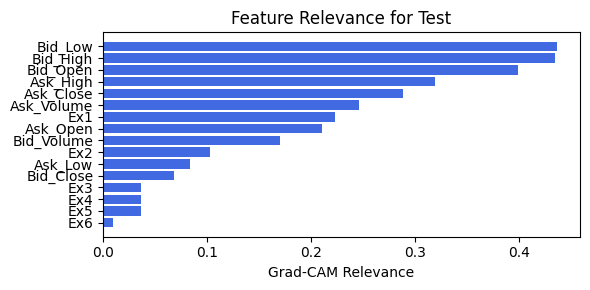

embed_dim: 64, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 50/50 [00:17<00:00,  2.79it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 18 epoch
tensor(0.7057, device='cuda:0')
[[106  77]
 [ 31 153]]
M_KAN Relevance: 0.042111799120903015
CNN Relevance: 0.9578882455825806
[('Bid_Close', 0.6026126), ('Ask_Open', 0.5780728), ('Ask_Close', 0.53284985), ('Bid_Low', 0.5258802), ('Bid_High', 0.48120183), ('Ask_Low', 0.44557577), ('Ask_High', 0.43259805), ('Bid_Open', 0.3453239), ('Bid_Volume', 0.32319605), ('Ask_Volume', 0.1615716)]


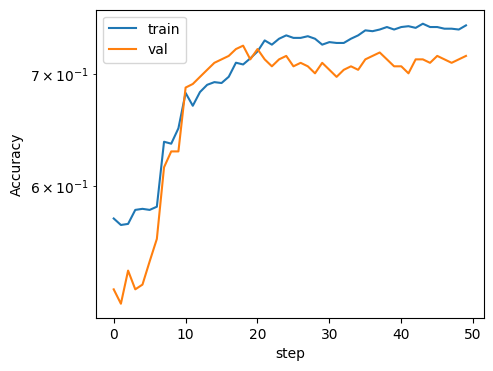

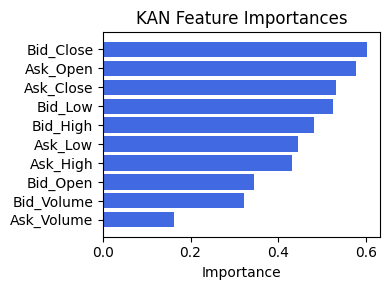

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.9265086255378879), ('Ask_Volume', 0.889844127831732), ('Ask_High', 0.8587481931704591), ('Ask_Open', 0.7609714824269838), ('Ex2', 0.6826094886648395), ('Ask_Low', 0.5661385620281871), ('Ask_Close', 0.5013736553429258), ('Bid_High', 0.4966446945935184), ('Bid_Low', 0.49575892120995624), ('Bid_Volume', 0.3986795329024421), ('Bid_Close', 0.31994404495574474), ('Bid_Open', 0.2925461132526785), ('Ex6', 0.15449617999004409), ('Ex4', 0.04939201681318627), ('Ex5', 0.04939201681318627), ('Ex3', 0.019396083812960183)]


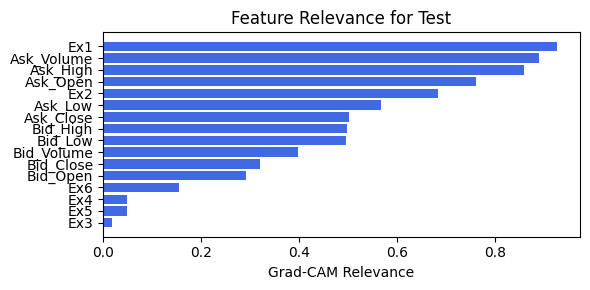

embed_dim: 64, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.07e-01 | val_acc_hybrid: 6.77e-01 |: 100%|█████| 50/50 [00:16<00:00,  3.09it/s]

saving model version 0.1
✅ Best validation Accuracy: 6.8707e-01 at 34 epoch
tensor(0.6567, device='cuda:0')
[[ 86  97]
 [ 29 155]]
M_KAN Relevance: 0.034731339663267136
CNN Relevance: 0.9652686715126038
[('Bid_Close', 0.603014), ('Ask_Open', 0.57812726), ('Ask_Close', 0.5328575), ('Bid_Low', 0.52583826), ('Bid_High', 0.48075074), ('Ask_Low', 0.44553825), ('Ask_High', 0.43200243), ('Bid_Open', 0.34418055), ('Bid_Volume', 0.32344392), ('Ask_Volume', 0.16115305)]


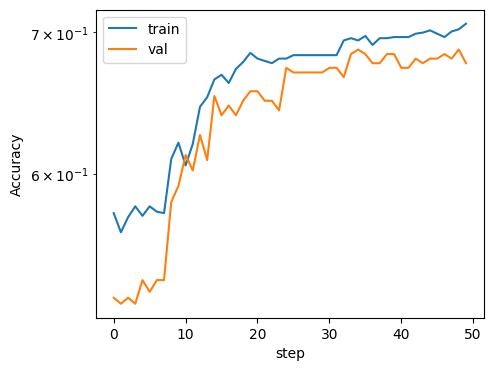

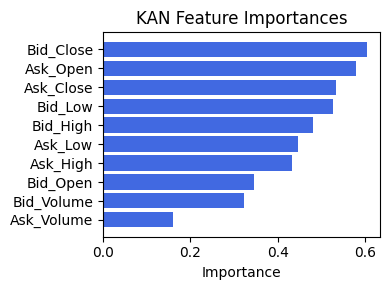

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.9223565974092613), ('Ask_Volume', 0.8663048263365144), ('Ask_High', 0.7313971022494158), ('Ask_Open', 0.6786717690212769), ('Ask_Close', 0.6115862969156832), ('Bid_Low', 0.5346534340578951), ('Bid_High', 0.5346135707719287), ('Ex2', 0.4898278100938823), ('Bid_Volume', 0.4532007522150184), ('Bid_Open', 0.3958144378378906), ('Ask_Low', 0.3757995527938049), ('Bid_Close', 0.2562974494671302), ('Ex6', 0.09154340119306657), ('Ex4', 0.08938033938692116), ('Ex5', 0.08938033938692116), ('Ex3', 0.06167271036695313)]


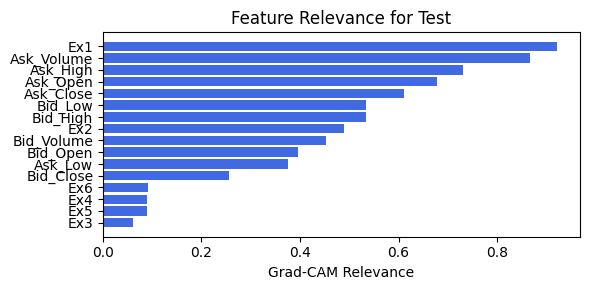

embed_dim: 32, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.31e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.75it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.0748e-01 at 19 epoch
tensor(0.6921, device='cuda:0')
[[124  59]
 [ 54 130]]
M_KAN Relevance: 0.3051798343658447
CNN Relevance: 0.6948201656341553
[('Bid_Close', 0.60274726), ('Ask_Open', 0.5780927), ('Ask_Close', 0.5328522), ('Bid_Low', 0.5258662), ('Bid_High', 0.4810515), ('Ask_Low', 0.44556373), ('Ask_High', 0.4323997), ('Bid_Open', 0.34493884), ('Bid_Volume', 0.32327986), ('Ask_Volume', 0.16143152)]


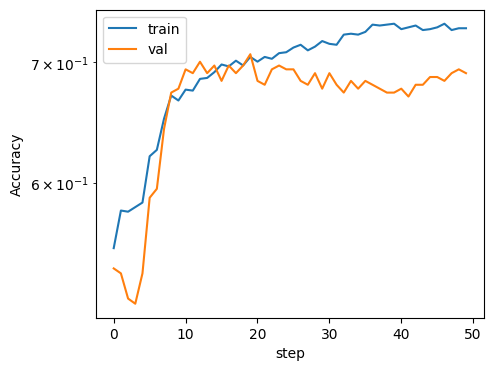

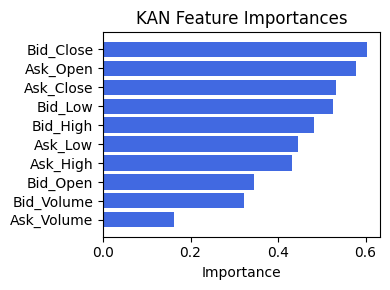

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_Low', 0.6604855608306723), ('Ex2', 0.5296141955321426), ('Bid_Close', 0.3787437119294873), ('Bid_Low', 0.12956113182198592), ('Bid_High', 0.12791509512497545), ('Ex1', 0.07005346347945832), ('Bid_Open', 0.0656901429095166), ('Ask_Volume', 0.061338205820622625), ('Ask_High', 0.057302833788543533), ('Ask_Open', 0.049582757486527844), ('Ask_Close', 0.045925617413417684), ('Bid_Volume', 0.0342999777717932), ('Ex4', 0.018443755622780614), ('Ex5', 0.018443755622780614), ('Ex3', 0.016191449450273118), ('Ex6', 0.011748313100082921)]


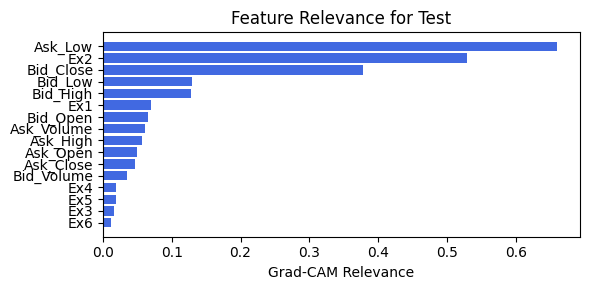

embed_dim: 32, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.43e-01 | val_acc_hybrid: 7.07e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.72it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 17 epoch
tensor(0.6948, device='cuda:0')
[[131  52]
 [ 60 124]]
M_KAN Relevance: 0.6211443543434143
CNN Relevance: 0.3788556754589081
[('Bid_Close', 0.6023972), ('Ask_Open', 0.57803625), ('Ask_Close', 0.5328429), ('Bid_Low', 0.52589947), ('Bid_High', 0.48143566), ('Ask_Low', 0.44559503), ('Ask_High', 0.4329095), ('Bid_Open', 0.34592932), ('Bid_Volume', 0.32306054), ('Ask_Volume', 0.16179124)]


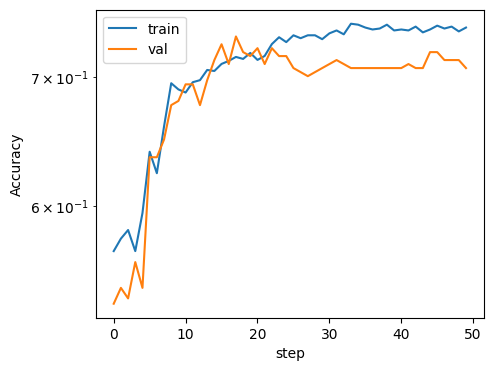

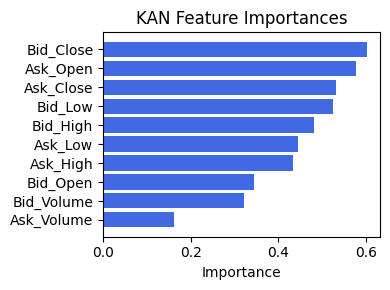

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.4559083195080935), ('Ask_Close', 0.35359536177334083), ('Ex1', 0.3226408426693009), ('Ask_Low', 0.31759744949795526), ('Ask_Volume', 0.31596221933801144), ('Bid_Close', 0.28742647909264546), ('Bid_Volume', 0.23169747717571965), ('Bid_Open', 0.21753006634030908), ('Ask_Open', 0.20113367228121662), ('Ask_High', 0.19766253759013616), ('Bid_Low', 0.1656604287978969), ('Bid_High', 0.1639940583385649), ('Ex4', 0.12707615437935174), ('Ex5', 0.12707615437935174), ('Ex3', 0.11698792106345073), ('Ex6', 0.10426869610123392)]


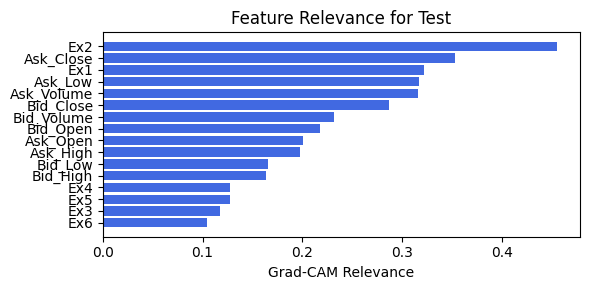

embed_dim: 32, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.43e-01 | val_acc_hybrid: 6.87e-01 |: 100%|█████| 50/50 [00:16<00:00,  2.96it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2449e-01 at 18 epoch
tensor(0.7084, device='cuda:0')
[[125  58]
 [ 49 135]]
M_KAN Relevance: 0.013088361360132694
CNN Relevance: 0.9869116544723511
[('Bid_Close', 0.6028137), ('Ask_Open', 0.57809836), ('Ask_Close', 0.5328433), ('Bid_Low', 0.52585226), ('Bid_High', 0.48095638), ('Ask_Low', 0.44555843), ('Ask_High', 0.43228596), ('Bid_Open', 0.3447083), ('Bid_Volume', 0.3233223), ('Ask_Volume', 0.16135123)]


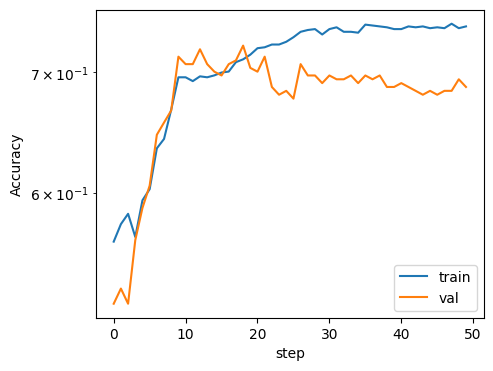

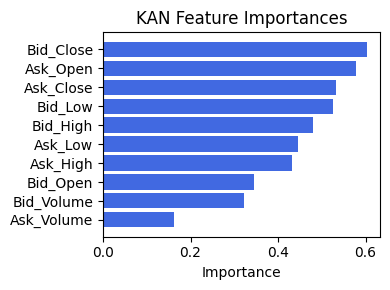

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.8122101396890687), ('Ask_Low', 0.8115253364844933), ('Bid_Close', 0.4489624553870115), ('Ask_High', 0.44390042736613744), ('Bid_Low', 0.2482769551085199), ('Bid_High', 0.2445423944202732), ('Ask_Open', 0.23989852532937886), ('Ask_Volume', 0.1600019046030821), ('Bid_Open', 0.10236065382041463), ('Bid_Volume', 0.09798617351814591), ('Ex1', 0.0921773034571708), ('Ask_Close', 0.07864708626866138), ('Ex6', 0.002275505537547524), ('Ex3', 0.0), ('Ex4', 0.0), ('Ex5', 0.0)]


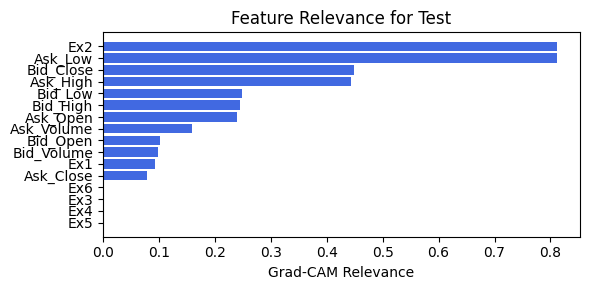

embed_dim: 16, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.49e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 50/50 [00:19<00:00,  2.58it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2789e-01 at 30 epoch
tensor(0.7030, device='cuda:0')
[[107  76]
 [ 33 151]]
M_KAN Relevance: 0.2439451366662979
CNN Relevance: 0.7560548782348633
[('Bid_Close', 0.6028818), ('Ask_Open', 0.5781045), ('Ask_Close', 0.5328356), ('Bid_Low', 0.5258388), ('Bid_High', 0.48086113), ('Ask_Low', 0.44555268), ('Ask_High', 0.43217054), ('Bid_Open', 0.34447753), ('Bid_Volume', 0.32336557), ('Ask_Volume', 0.16127014)]


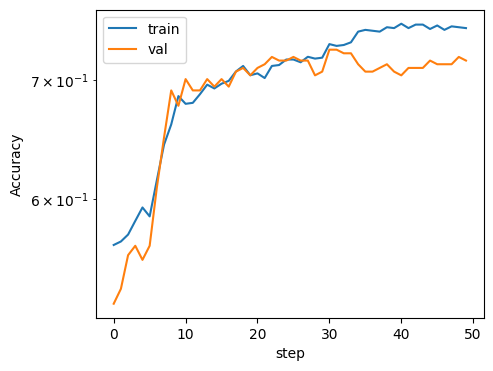

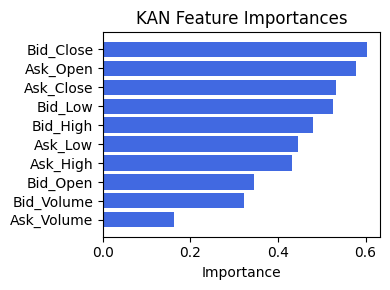

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex1', 0.8998655515243312), ('Ask_Volume', 0.7950563632175124), ('Ex2', 0.736353171436111), ('Ask_High', 0.5771455334788772), ('Ask_Low', 0.5318423560148039), ('Ask_Open', 0.5120095223269605), ('Ask_Close', 0.42605181683961313), ('Bid_Low', 0.4183553646252635), ('Bid_High', 0.4159879236169951), ('Bid_Close', 0.40770679761450873), ('Bid_Volume', 0.2582852564934814), ('Ex4', 0.22348361858991495), ('Ex5', 0.22348361858991495), ('Bid_Open', 0.19125096184234527), ('Ex3', 0.16518154131294271), ('Ex6', 0.10388881626363834)]


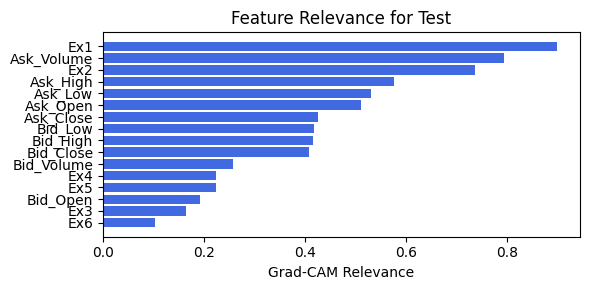

embed_dim: 16, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.40e-01 | val_acc_hybrid: 6.94e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.73it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 20 epoch
tensor(0.7139, device='cuda:0')
[[124  59]
 [ 46 138]]
M_KAN Relevance: 0.43185585737228394
CNN Relevance: 0.5681441426277161
[('Bid_Close', 0.6027253), ('Ask_Open', 0.5780895), ('Ask_Close', 0.53285086), ('Bid_Low', 0.5258682), ('Bid_High', 0.48107472), ('Ask_Low', 0.44556594), ('Ask_High', 0.43243098), ('Bid_Open', 0.3449989), ('Bid_Volume', 0.32326627), ('Ask_Volume', 0.16145375)]


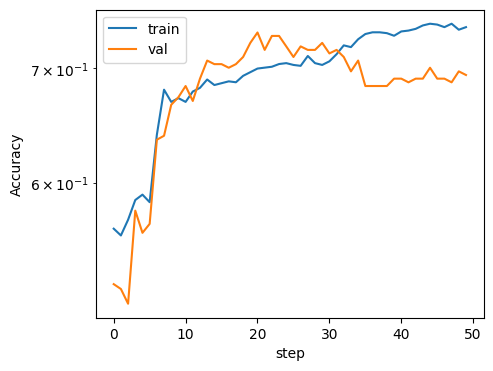

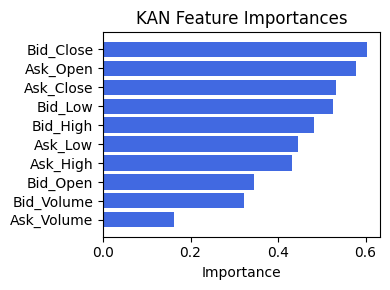

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.9084919379892117), ('Ex5', 0.9084919379892117), ('Ex3', 0.721209501680139), ('Ex6', 0.293450804047251), ('Ex2', 0.16464295020017378), ('Ask_Low', 0.11058380713230796), ('Ex1', 0.07831279008410749), ('Bid_Close', 0.041389218782856986), ('Ask_Volume', 0.038639763526857024), ('Ask_Open', 0.022985912315596713), ('Bid_Low', 0.021882652777012554), ('Bid_High', 0.021770349314673587), ('Ask_High', 0.020082949084118625), ('Ask_Close', 0.019288100788816404), ('Bid_Open', 0.017411710841398673), ('Bid_Volume', 0.01731365118293905)]


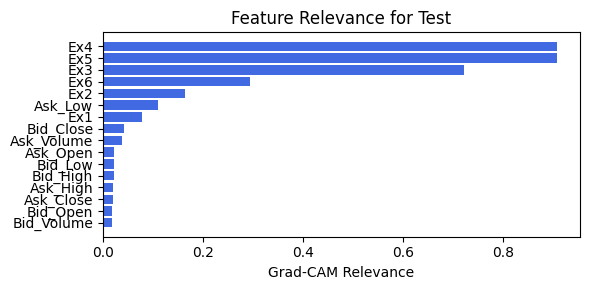

embed_dim: 16, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.47e-01 | val_acc_hybrid: 7.04e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.73it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3469e-01 at 20 epoch
tensor(0.7193, device='cuda:0')
[[124  59]
 [ 44 140]]
M_KAN Relevance: 0.15021654963493347
CNN Relevance: 0.8497834801673889
[('Bid_Close', 0.6027133), ('Ask_Open', 0.57808787), ('Ask_Close', 0.53285164), ('Bid_Low', 0.5258698), ('Bid_High', 0.481089), ('Ask_Low', 0.4455666), ('Ask_High', 0.43244898), ('Bid_Open', 0.3450354), ('Bid_Volume', 0.3232589), ('Ask_Volume', 0.16146672)]


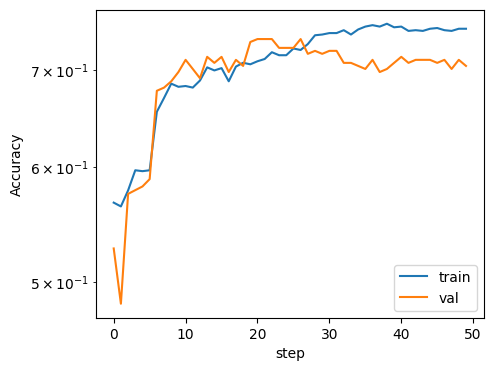

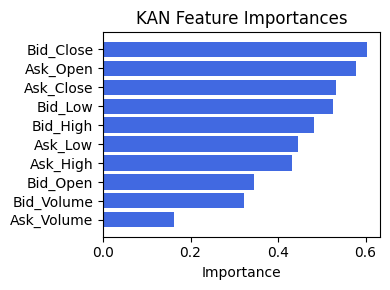

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex4', 0.9022039530712512), ('Ex5', 0.9022039530712512), ('Ex3', 0.7699741867455915), ('Ex1', 0.32713430836778995), ('Ask_Volume', 0.2032097511109896), ('Ex6', 0.16946362049448271), ('Ask_Close', 0.15869200182729717), ('Bid_Volume', 0.12445238746965319), ('Ask_Open', 0.12231581448570406), ('Ask_High', 0.11182067791188034), ('Bid_Low', 0.08997711810788596), ('Bid_High', 0.08955188924921721), ('Bid_Open', 0.07840309906874629), ('Ex2', 0.06251751430110933), ('Ask_Low', 0.02788524060804785), ('Bid_Close', 0.02462452589047309)]


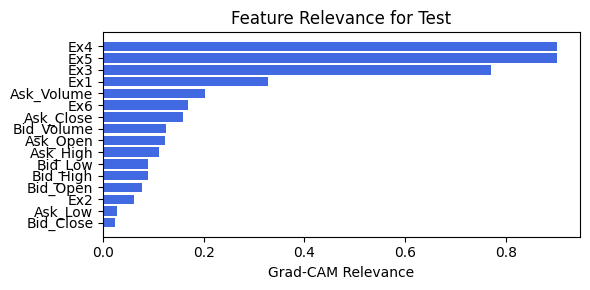

In [129]:
for embed_dim in [64, 32, 16]:
    for num_head in [2, 4 , 8]:
        print(f"embed_dim: {embed_dim}, num_head:{num_head}")
        train_and_plot_relevance(Model4_4, kan_neurons=4, kan_grid=3, lamb=1e-06, steps=50, 
                                 embed_dim=embed_dim, num_heads=num_head, filename=filename_4, opt_col_val=f'{embed_dim}, {num_head}')

## 4.3. width=[10, 3], grid=5, lamb=0.0001

embed_dim: 64, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.39e-01 | val_acc_hybrid: 6.84e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.75it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 24 epoch
tensor(0.6948, device='cuda:0')
[[132  51]
 [ 61 123]]
M_KAN Relevance: 0.0004403404309414327
CNN Relevance: 0.9995597004890442
[('Ask_Low', 0.5893903), ('Bid_High', 0.53009474), ('Bid_Open', 0.5211956), ('Ask_Open', 0.4896128), ('Ask_High', 0.29465213), ('Bid_Low', 0.2863061), ('Bid_Close', 0.26154494), ('Bid_Volume', 0.252887), ('Ask_Close', 0.23466419), ('Ask_Volume', 0.21765783)]


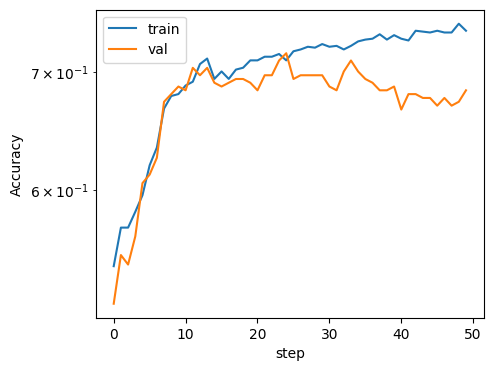

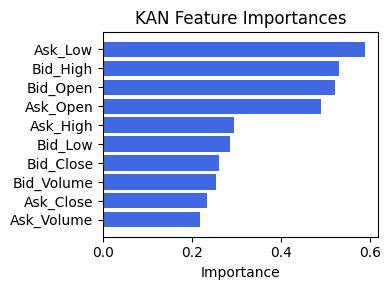

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_Open', 0.16389050320988618), ('Bid_Close', 0.13117994049092), ('Ex3', 0.12455372945273901), ('Bid_Volume', 0.09665139049227535), ('Bid_Low', 0.07754788893098595), ('Bid_High', 0.07428500286559765), ('Ask_Close', 0.07206848119188872), ('Ex6', 0.013630033175793409), ('Ex4', 0.002816017994972424), ('Ex5', 0.002816017994972424), ('Ex2', 0.0021035849584307145), ('Ask_Low', 0.001960021517341533), ('Ask_High', 0.0006643436334923174), ('Ask_Open', 0.0006084146276823744), ('Ask_Volume', 0.0), ('Ex1', 0.0)]


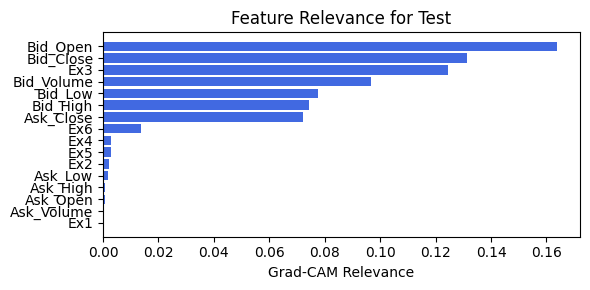

embed_dim: 64, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.46e-01 | val_acc_hybrid: 6.67e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.70it/s]

saving model version 0.1
✅ Best validation Accuracy: 6.9728e-01 at 23 epoch
tensor(0.6921, device='cuda:0')
[[137  46]
 [ 67 117]]
M_KAN Relevance: 1.84345572051825e-05
CNN Relevance: 0.9999815225601196
[('Bid_High', 0.92760026), ('Bid_Open', 0.90983075), ('Ask_Low', 0.8500872), ('Ask_Open', 0.6447283), ('Bid_Close', 0.50710034), ('Ask_High', 0.35446537), ('Ask_Volume', 0.34991), ('Bid_Low', 0.28780258), ('Ask_Close', 0.2704104), ('Bid_Volume', 0.25772527)]


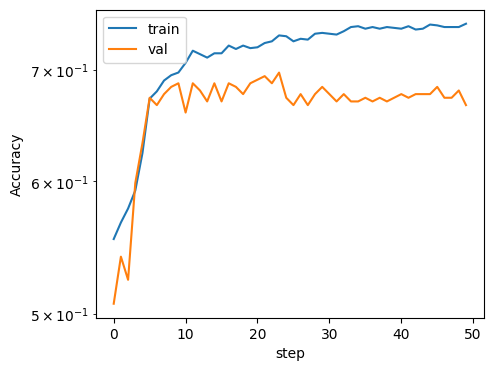

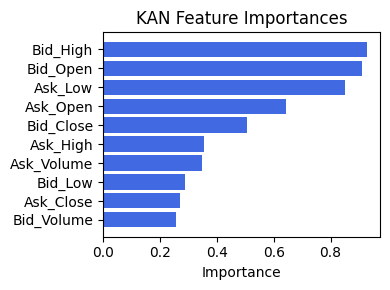

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex3', 0.4304243557622062), ('Ex4', 0.3179226401807583), ('Ex5', 0.3179226401807583), ('Ask_Low', 0.12347272153558686), ('Bid_Close', 0.0648700218322263), ('Ask_High', 0.027605468127832905), ('Bid_Volume', 0.019046094264436705), ('Bid_Open', 0.012734617423824458), ('Ask_Open', 0.011041132564709092), ('Bid_Low', 0.010553475745321741), ('Ex6', 0.009870621860433339), ('Bid_High', 0.009686615802000318), ('Ex2', 0.00632669799136409), ('Ask_Close', 0.00470432498027908), ('Ask_Volume', 7.336582653528988e-05), ('Ex1', 0.0)]


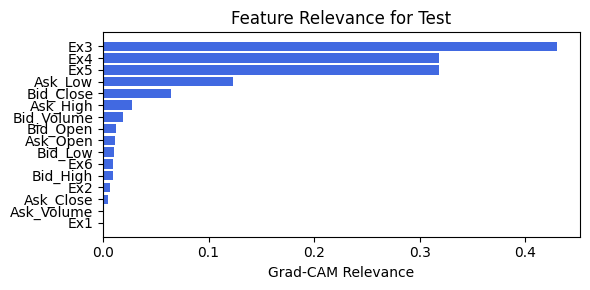

embed_dim: 64, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.37e-01 | val_acc_hybrid: 6.63e-01 |: 100%|█████| 50/50 [00:18<00:00,  2.72it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 30 epoch
tensor(0.7221, device='cuda:0')
[[137  46]
 [ 56 128]]
M_KAN Relevance: 0.0004658633260987699
CNN Relevance: 0.9995341300964355
[('Ask_Low', 0.564989), ('Bid_Open', 0.50819063), ('Ask_Open', 0.5007762), ('Bid_High', 0.4700364), ('Bid_Low', 0.32801664), ('Ask_High', 0.32124954), ('Bid_Close', 0.29914632), ('Ask_Close', 0.28002095), ('Bid_Volume', 0.25007546), ('Ask_Volume', 0.20917132)]


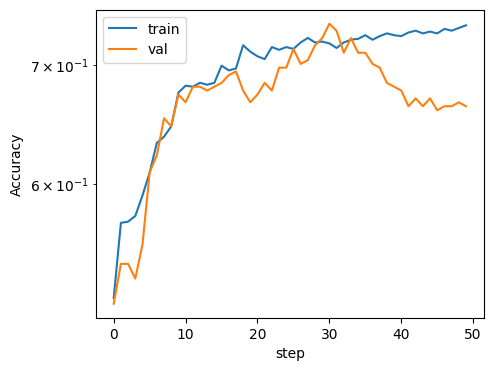

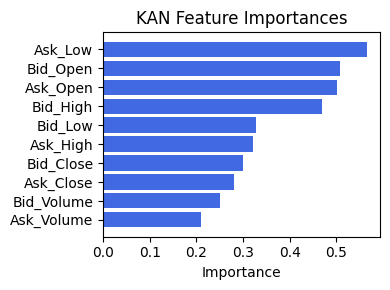

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Bid_Close', 0.3251886821938146), ('Ex2', 0.21604509250392848), ('Ask_Low', 0.20987284884246304), ('Ex3', 0.20535225757676537), ('Ex4', 0.06334174585678394), ('Ex5', 0.06334174585678394), ('Bid_Low', 0.03600286091969676), ('Bid_High', 0.033084327991980786), ('Bid_Open', 0.030873753794669414), ('Bid_Volume', 0.025416521414589742), ('Ask_Close', 0.007074015561430347), ('Ex6', 0.006368890580751651), ('Ask_High', 0.005312207735578812), ('Ask_Open', 0.0011888663250380716), ('Ask_Volume', 0.0005306958218361441), ('Ex1', 7.06141768911554e-05)]


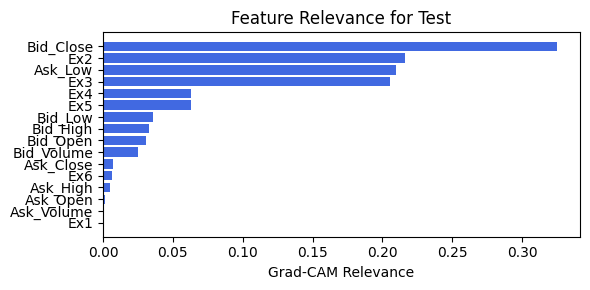

embed_dim: 32, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.56e-01 | val_acc_hybrid: 6.80e-01 |: 100%|█████| 50/50 [00:17<00:00,  2.90it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 10 epoch
tensor(0.7139, device='cuda:0')
[[124  59]
 [ 46 138]]
M_KAN Relevance: 0.187822163105011
CNN Relevance: 0.812177836894989
[('Bid_Close', 0.63362145), ('Ask_Close', 0.5837087), ('Ask_High', 0.46223718), ('Bid_Low', 0.46064728), ('Ask_Volume', 0.3001424), ('Bid_High', 0.27788898), ('Ask_Open', 0.2732198), ('Bid_Open', 0.23467515), ('Ask_Low', 0.18307707), ('Bid_Volume', 0.09136567)]


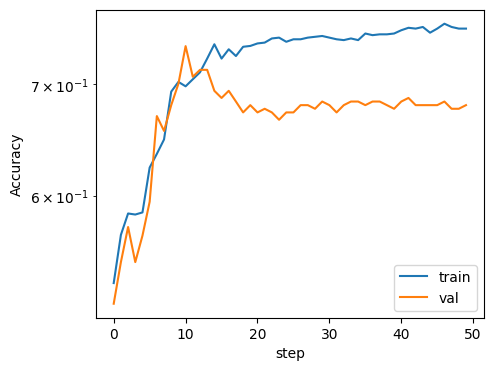

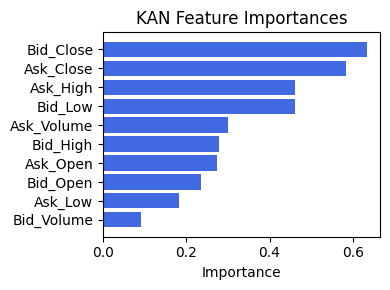

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.7538714696341055), ('Ask_Low', 0.4121203878513799), ('Ex1', 0.2639430068694664), ('Bid_Close', 0.2115282088115923), ('Ask_Volume', 0.1508208387623727), ('Ex6', 0.08804270899689652), ('Ask_High', 0.08361234624517386), ('Ask_Close', 0.08182500788627309), ('Ask_Open', 0.05167206437439087), ('Ex4', 0.05120171896460826), ('Ex5', 0.05120171896460826), ('Bid_Low', 0.042569248923232175), ('Bid_High', 0.04130873351672617), ('Bid_Volume', 0.030457154462254023), ('Ex3', 0.019227877000254155), ('Bid_Open', 0.01656665570431827)]


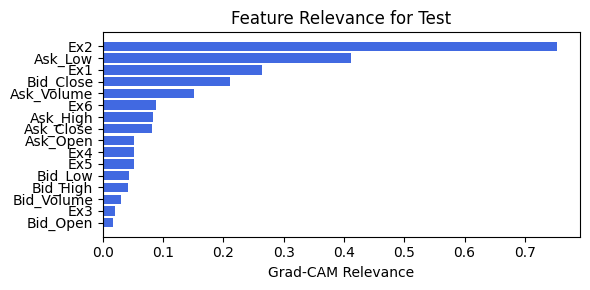

embed_dim: 32, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.52e-01 | val_acc_hybrid: 6.80e-01 |: 100%|█████| 50/50 [00:17<00:00,  2.81it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 23 epoch
tensor(0.7084, device='cuda:0')
[[117  66]
 [ 41 143]]
M_KAN Relevance: 0.08080267161130905
CNN Relevance: 0.9191973209381104
[('Bid_Open', 0.90152115), ('Bid_High', 0.8658036), ('Bid_Close', 0.7571347), ('Ask_Low', 0.7381084), ('Ask_Open', 0.6298702), ('Ask_Close', 0.5329754), ('Ask_Volume', 0.4410388), ('Ask_High', 0.3899698), ('Bid_Low', 0.32404685), ('Bid_Volume', 0.2838421)]


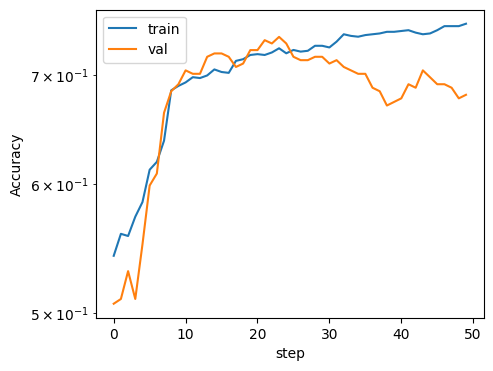

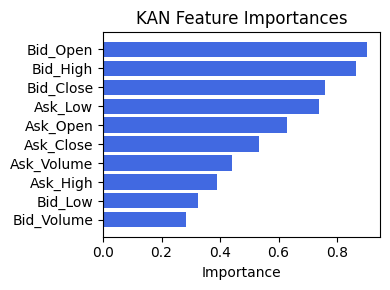

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.47628542790995093), ('Ex2', 0.46800405965554615), ('Ask_Low', 0.4416436629537341), ('Ask_Open', 0.3164336200085359), ('Bid_Close', 0.2875954915746559), ('Ex1', 0.2620904506539434), ('Ask_Volume', 0.2537147837569836), ('Bid_Low', 0.24571938477181193), ('Bid_High', 0.24059717584120957), ('Bid_Volume', 0.1940081289932549), ('Ask_Close', 0.1624731224353055), ('Bid_Open', 0.12073678859225309), ('Ex6', 0.02235929731020532), ('Ex3', 0.013662384808992649), ('Ex4', 0.012728193178636923), ('Ex5', 0.012728193178636923)]


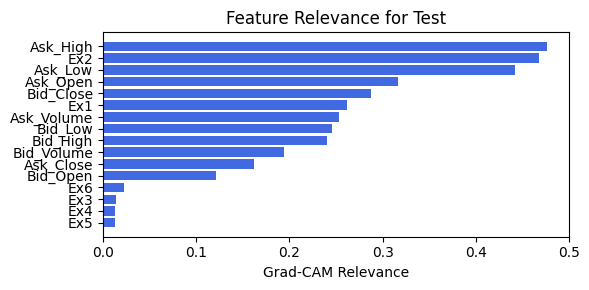

embed_dim: 32, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.48e-01 | val_acc_hybrid: 7.18e-01 |: 100%|█████| 50/50 [00:17<00:00,  2.79it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3810e-01 at 23 epoch
tensor(0.7003, device='cuda:0')
[[112  71]
 [ 39 145]]
M_KAN Relevance: 0.7156163454055786
CNN Relevance: 0.28438371419906616
[('Bid_Close', 0.685212), ('Ask_Close', 0.6131822), ('Bid_Low', 0.4243541), ('Ask_High', 0.41754133), ('Ask_Volume', 0.33101085), ('Bid_Open', 0.33015436), ('Ask_Low', 0.279672), ('Ask_Open', 0.27490982), ('Bid_High', 0.262685), ('Bid_Volume', 0.091172546)]


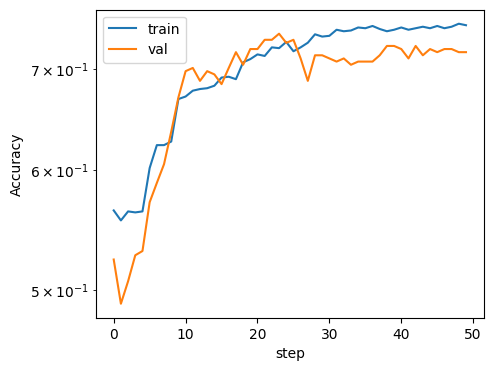

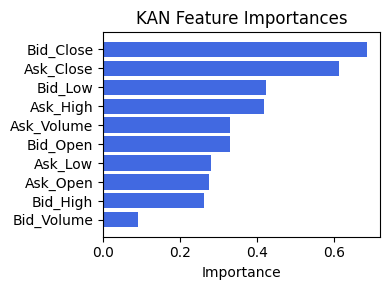

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ask_High', 0.6785585451111443), ('Ask_Volume', 0.652820880940991), ('Ex1', 0.6238427824094608), ('Bid_Low', 0.5647300243864917), ('Bid_High', 0.5623145927484744), ('Ask_Open', 0.5498620329338458), ('Ask_Close', 0.5262223517456237), ('Bid_Open', 0.45340774128117095), ('Bid_Volume', 0.4237019272282598), ('Ask_Low', 0.38746165942999583), ('Ex2', 0.3779247476432564), ('Bid_Close', 0.3063020630351367), ('Ex4', 0.045177649958504866), ('Ex5', 0.045177649958504866), ('Ex3', 0.03349407295652346), ('Ex6', 0.019970720590387087)]


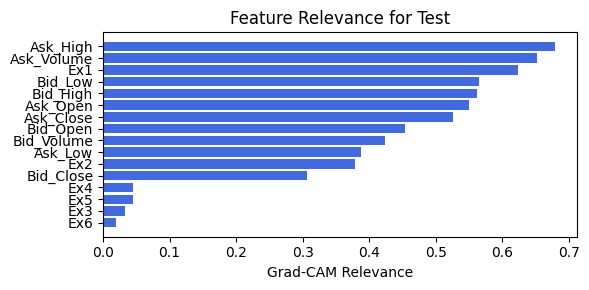

embed_dim: 16, num_head:2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.66e-01 | val_acc_hybrid: 6.97e-01 |: 100%|█████| 50/50 [00:17<00:00,  2.84it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.1769e-01 at 10 epoch
tensor(0.7248, device='cuda:0')
[[134  49]
 [ 52 132]]
M_KAN Relevance: 0.2519104480743408
CNN Relevance: 0.7480895519256592
[('Ask_Low', 0.84523565), ('Bid_High', 0.8367876), ('Bid_Open', 0.76203215), ('Ask_Open', 0.74074817), ('Bid_Close', 0.63302606), ('Ask_High', 0.45098978), ('Ask_Volume', 0.3923255), ('Ask_Close', 0.32738984), ('Bid_Volume', 0.28714335), ('Bid_Low', 0.22757497)]


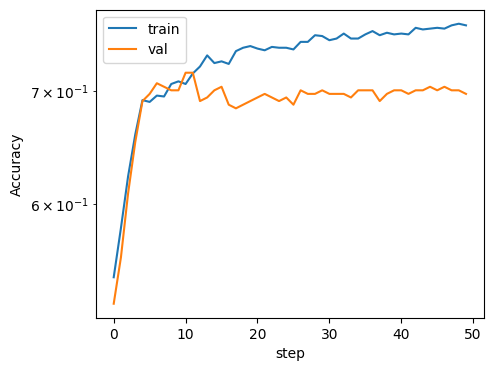

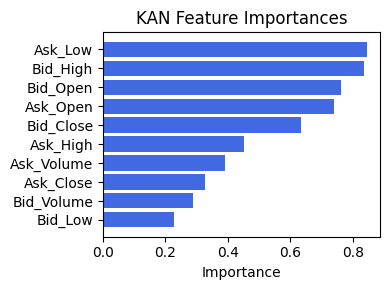

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.894529911412855), ('Ask_Low', 0.7003291902165322), ('Bid_Close', 0.4219254919610745), ('Ex6', 0.047974475804076856), ('Bid_High', 0.001297904034329157), ('Bid_Low', 0.0011659823814838394), ('Bid_Open', 0.0005306008003673666), ('Ask_Close', 0.00037282162373860136), ('Ask_Volume', 0.00015379155336369123), ('Bid_Volume', 0.0), ('Ask_Open', 0.0), ('Ask_High', 0.0), ('Ex1', 0.0), ('Ex3', 0.0), ('Ex4', 0.0), ('Ex5', 0.0)]


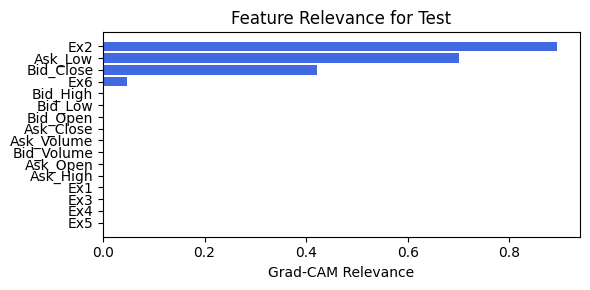

embed_dim: 16, num_head:4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.52e-01 | val_acc_hybrid: 6.70e-01 |: 100%|█████| 50/50 [00:17<00:00,  2.80it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.3129e-01 at 11 epoch
tensor(0.7166, device='cuda:0')
[[124  59]
 [ 45 139]]
M_KAN Relevance: 0.5095106363296509
CNN Relevance: 0.4904893934726715
[('Ask_Low', 0.721553), ('Bid_High', 0.701053), ('Bid_Open', 0.6785036), ('Ask_Open', 0.541252), ('Bid_Close', 0.3510535), ('Ask_High', 0.33256412), ('Bid_Low', 0.2977512), ('Ask_Volume', 0.27462178), ('Ask_Close', 0.24959113), ('Bid_Volume', 0.24025026)]


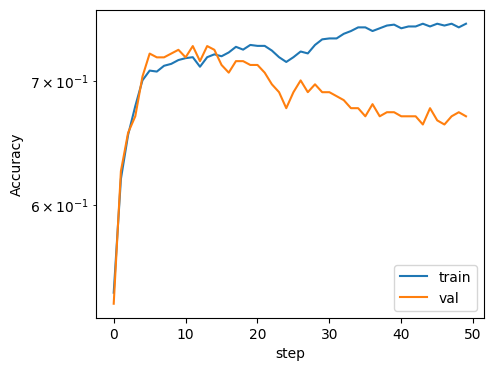

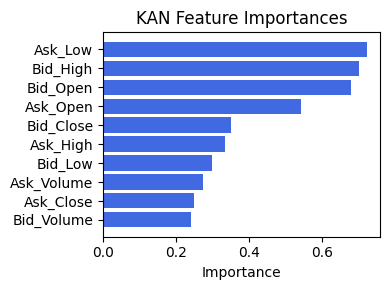

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.9006690343978945), ('Ask_Low', 0.7530907496444535), ('Bid_Close', 0.47724867654756237), ('Bid_Low', 0.14083081016212964), ('Bid_High', 0.13792022065808604), ('Ask_High', 0.05533463018763955), ('Bid_Open', 0.052983594306063274), ('Ex6', 0.04867772759085556), ('Ask_Volume', 0.02447886931822871), ('Ask_Close', 0.020027198932642418), ('Ex1', 0.017742137832260037), ('Ask_Open', 0.016490193828607322), ('Bid_Volume', 0.009619965043999172), ('Ex3', 0.0), ('Ex4', 0.0), ('Ex5', 0.0)]


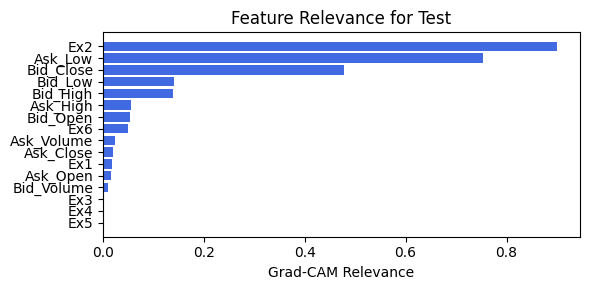

embed_dim: 16, num_head:8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4_4


 train_acc_hybrid: 7.52e-01 | val_acc_hybrid: 6.90e-01 |: 100%|█████| 50/50 [00:17<00:00,  2.82it/s]

saving model version 0.1
✅ Best validation Accuracy: 7.2109e-01 at 15 epoch
tensor(0.7193, device='cuda:0')
[[126  57]
 [ 46 138]]
M_KAN Relevance: 0.43354129791259766
CNN Relevance: 0.5664586424827576
[('Bid_High', 0.8844386), ('Ask_Low', 0.8102464), ('Bid_Open', 0.8057327), ('Ask_Open', 0.67638165), ('Bid_Close', 0.5876324), ('Ask_High', 0.40276575), ('Ask_Volume', 0.36271673), ('Ask_Close', 0.29276562), ('Bid_Volume', 0.24791665), ('Bid_Low', 0.24121182)]


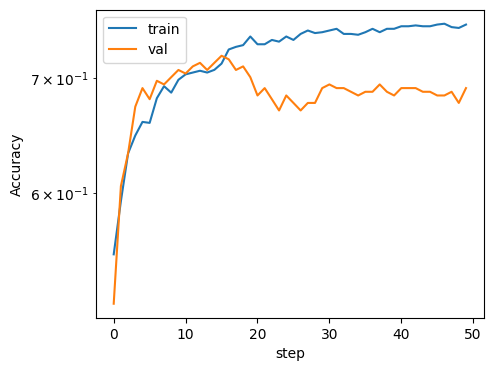

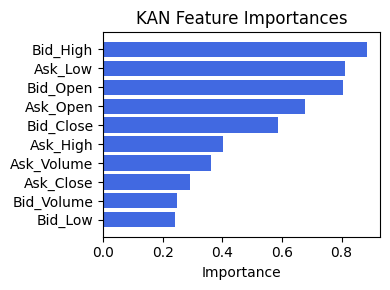

Computing Grad-CAM:   0%|          | 0/367 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('Ex2', 0.708764027225549), ('Ask_Low', 0.6625259317640387), ('Bid_Close', 0.5097198342087321), ('Bid_Low', 0.10670475388559252), ('Bid_High', 0.10476529391277714), ('Bid_Open', 0.044931321108284884), ('Ask_High', 0.03497556833980468), ('Ask_Open', 0.027523497297658208), ('Ex6', 0.02045051162467371), ('Bid_Volume', 0.009360904174118381), ('Ask_Close', 0.002452708374739343), ('Ask_Volume', 0.0013418873747917304), ('Ex1', 0.0), ('Ex3', 0.0), ('Ex4', 0.0), ('Ex5', 0.0)]


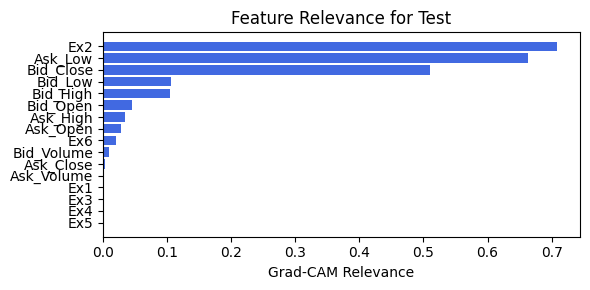

In [130]:
for embed_dim in [64, 32, 16]:
    for num_head in [2, 4 , 8]:
        print(f"embed_dim: {embed_dim}, num_head:{num_head}")
        train_and_plot_relevance(Model4_4, kan_neurons=4, kan_grid=5, lamb=0.0001, steps=50, 
                                 embed_dim=embed_dim, num_heads=num_head, filename=filename_4, opt_col_val=f'{embed_dim}, {num_head}')

# Hibrid Model3 training ✅ Top 2 Configurations

### 1. width=[10, 1, 1], grid=3, lamb=0.0001| best_epoch=6 | avg_acc=0.73025

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3


| train_loss: 3.10e+00 | eval_loss: 3.14e+00 | reg: 4.28e+01 |: 100%|█| 40/40 [00:39<00:00,  1.02it/


saving model version 0.1
Best epoch 15
3.2704854011535645


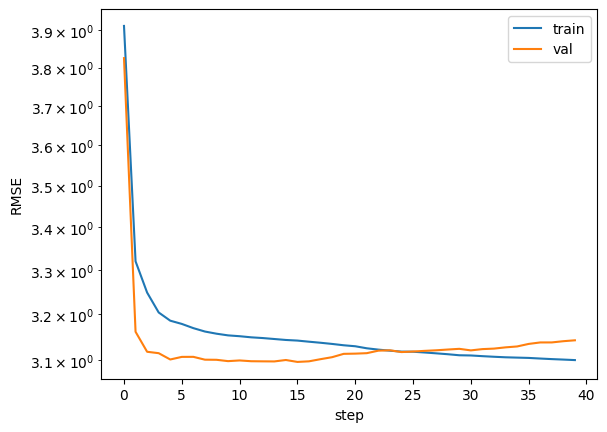

In [101]:
model = try_create_model(Model3, attributes, imgs_shape, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=1)
best_model_state, metrics3, _ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.01)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics3['train_loss'], metrics3['eval_loss'])

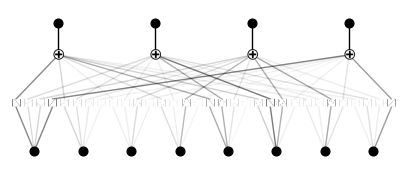

In [45]:
model.m_kan.plot()

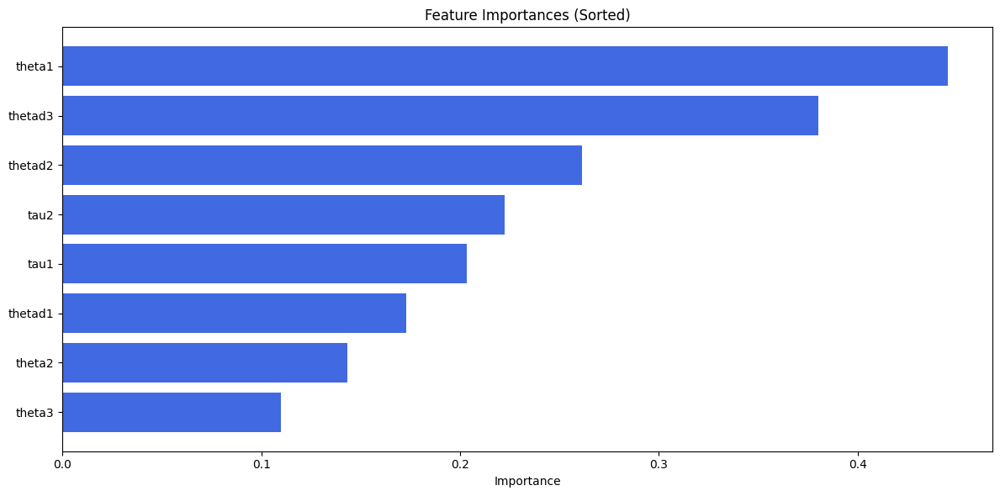

In [46]:
plot_sorted_feature_importance(x_col, model.m_kan.feature_score)

In [42]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

Computing Grad-CAM:   0%|          | 0/1639 [00:00<?, ?it/s]


AttributeError: 'Model3_0' object has no attribute 'cnn_branch'

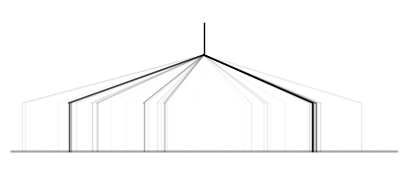

In [47]:
model.final_kan.plot()

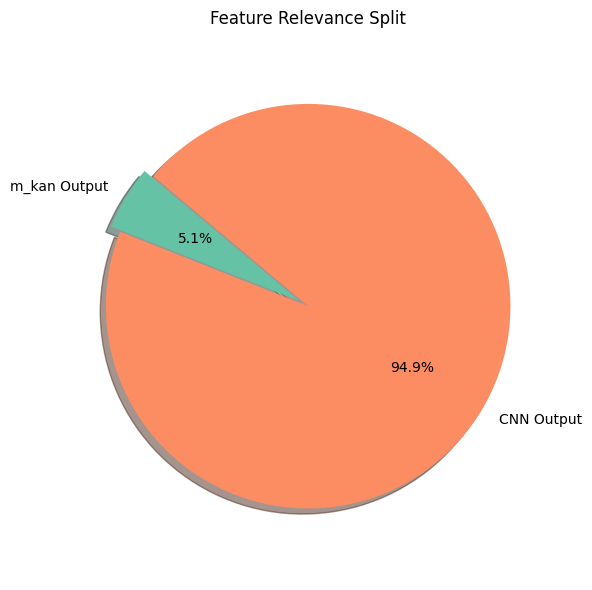

In [103]:
plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=4)

C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by o

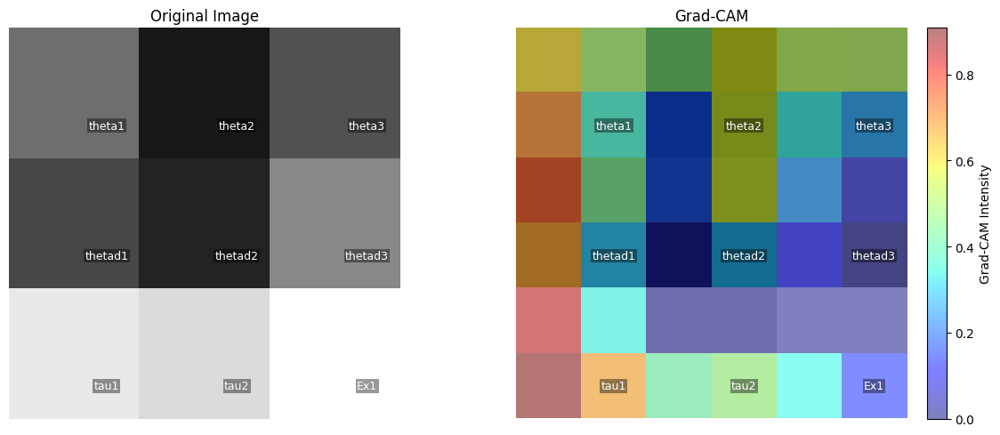

In [50]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [09:53<00:00,  2.76it/s] 


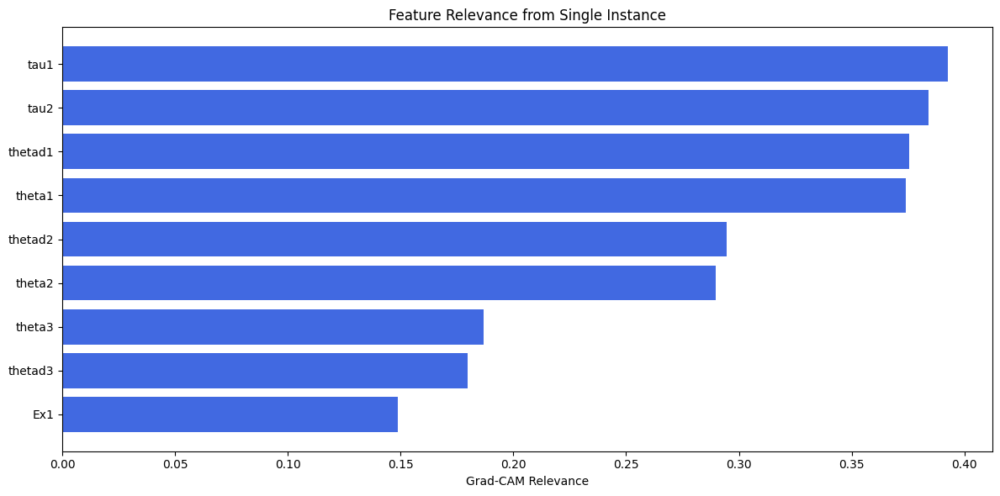

In [51]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

### 2. width=[10, 4, 1], grid=3, lamb=0.0001| best_epoch=7 | avg_acc=0.73025

In [52]:
del model
torch.cuda.empty_cache()
gc.collect()

13172740

In [42]:
model = try_create_model(Model3, attributes, imgs_shape, kan_neurons=3, kan_grid=5)
best_model_state, metrics3,_ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.01)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics3['train_loss'], metrics3['val_loss'])

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3


| train_loss: 3.40e+00 | eval_loss: 3.17e+00 | reg: 1.19e+02 |:   8%| | 3/40 [00:18<03:44,  6.06s/it


KeyboardInterrupt: 

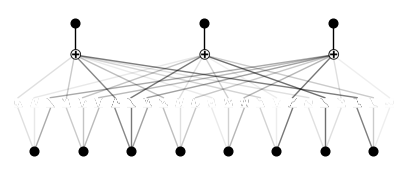

In [54]:
model.m_kan.plot()

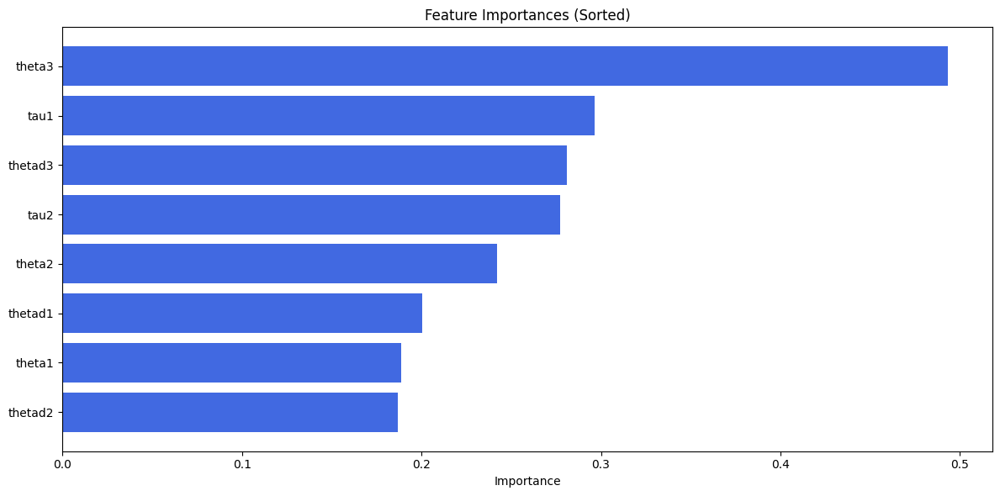

In [55]:
plot_sorted_feature_importance(x_col, model.m_kan.feature_score)

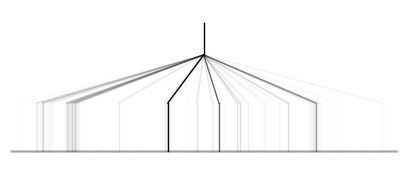

In [56]:
model.final_kan.plot()

In [57]:
feature_score = model.final_kan.feature_score

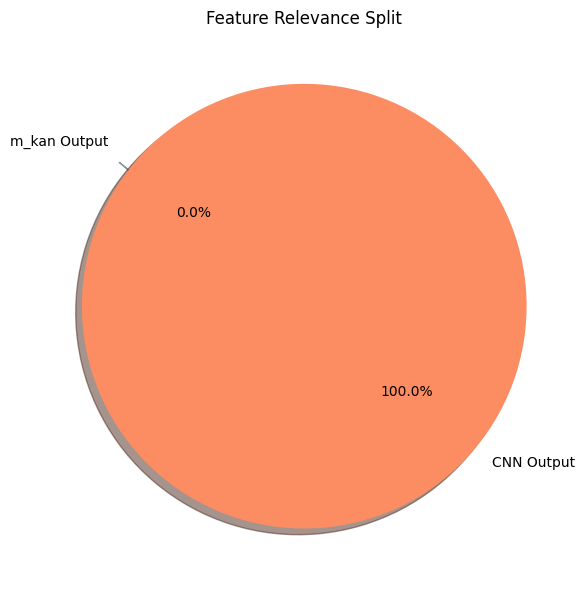

In [58]:
plot_mkan_vs_cnn_relevance(feature_score, mkan_len=3)

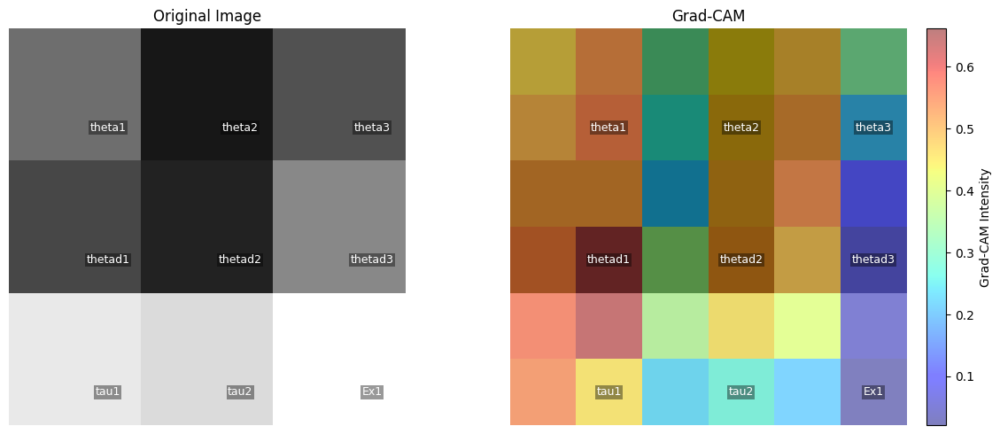

In [59]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [09:06<00:00,  3.00it/s]


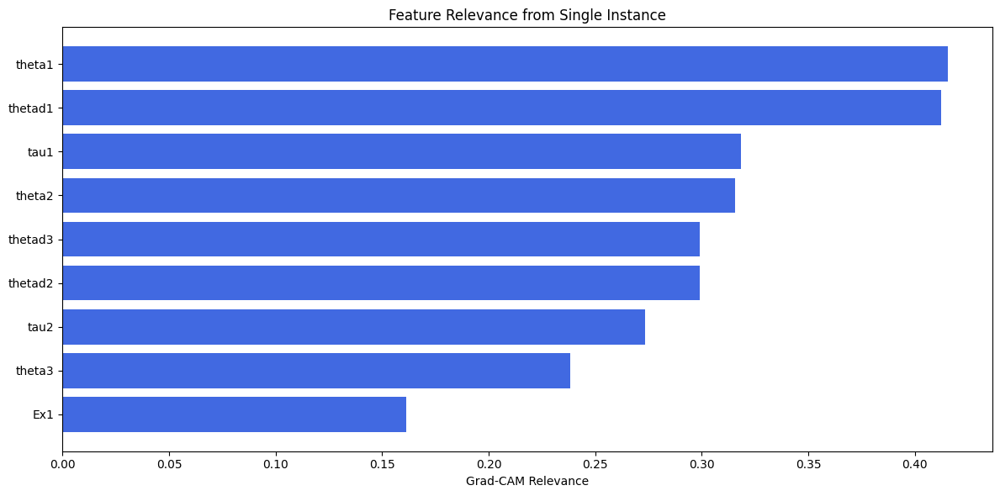

In [60]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

# Hybrid Model4 training ✅ Top 2 Configurations

### 1. width=[8, 1, 1], grid=4, lamb=0.01| best_epoch=7 | loss=3.23119

In [61]:
del model
torch.cuda.empty_cache()
gc.collect()

13370161

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4


| train_loss: 2.45e+00 | eval_loss: 3.71e+00 | reg: 9.67e+01 |: 100%|█| 40/40 [13:51<00:00, 20.80s/i


saving model version 0.1
Best epoch 8
3.7815768718719482


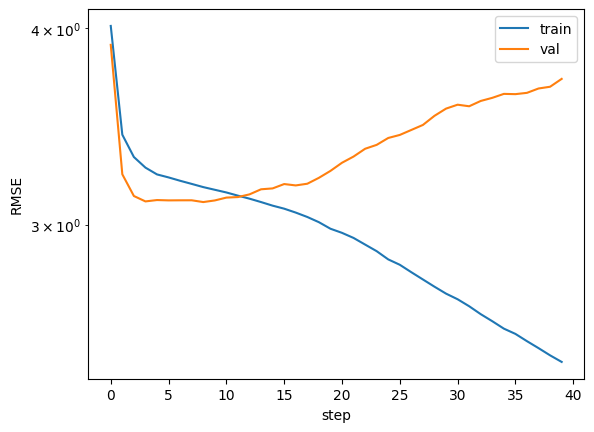

In [62]:
model = try_create_model(Model4, attributes, imgs_shape, kan_neurons=1, kan_grid=4)  # Attempt to create Model4
best_model_state, metrics4, _ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.01)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics4['train_loss'], metrics4['eval_loss'])

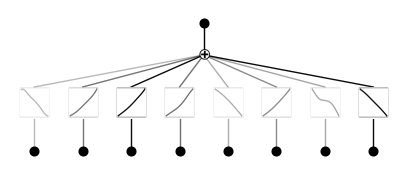

In [63]:
model.m_kan.plot()

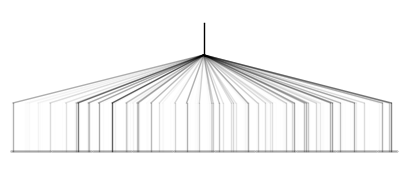

In [64]:
model.final_kan.plot()

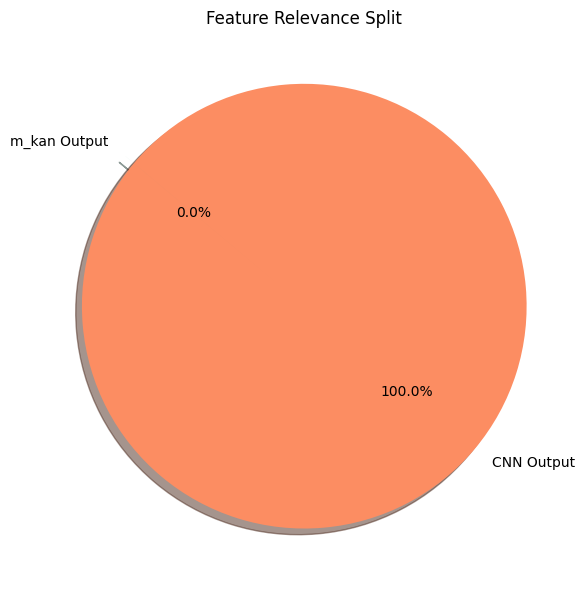

In [65]:
plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=1)

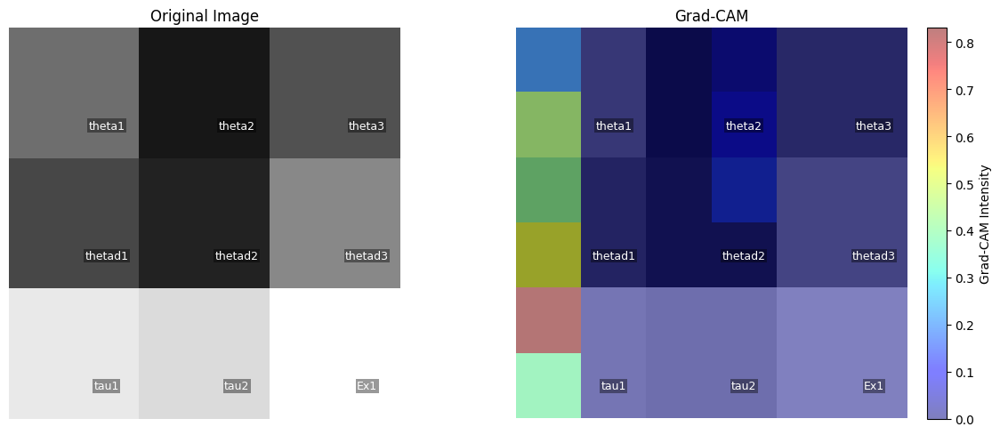

In [66]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [07:58<00:00,  3.43it/s] 


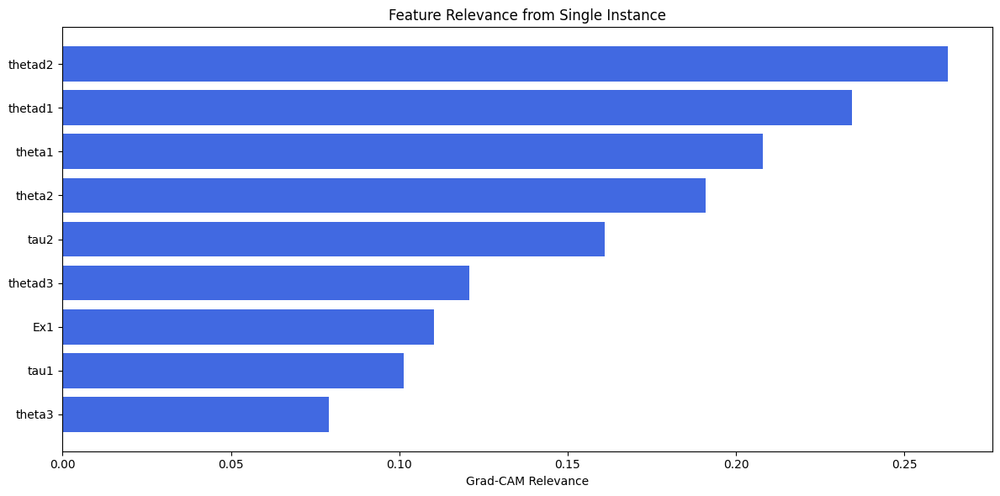

In [67]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

### 2. width=[8, 2, 1], grid=4, lamb=0.1| best_epoch=7 | loss=3.23543

In [70]:
del model
torch.cuda.empty_cache()
gc.collect()

481

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4


| train_loss: 3.23e+00 | eval_loss: 3.22e+00 | reg: 2.22e+01 |: 100%|█| 40/40 [06:48<00:00, 10.22s/i


saving model version 0.1
Best epoch 11
3.356964588165283


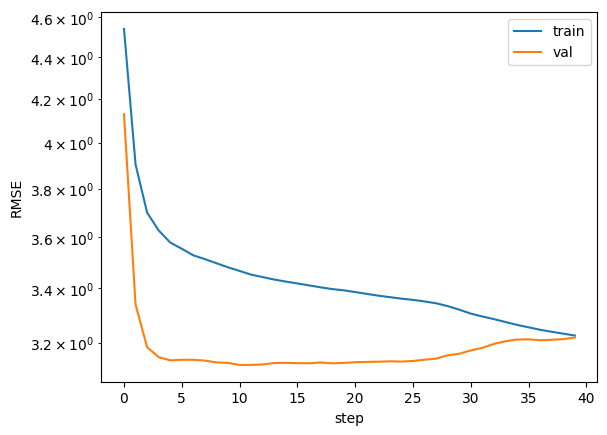

In [71]:
model = try_create_model(Model4, attributes, imgs_shape, kan_neurons=2, kan_grid=4)  # Attempt to create Model4
best_model_state, metrics4, _ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.1)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics4['train_loss'], metrics4['eval_loss'])

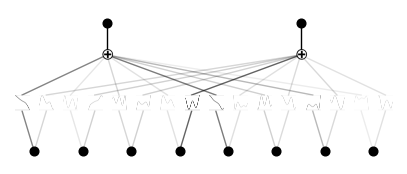

In [72]:
model.m_kan.plot()

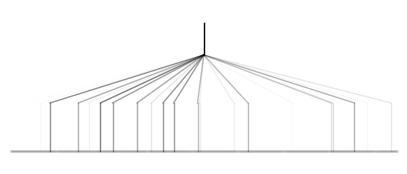

In [73]:
model.final_kan.plot()

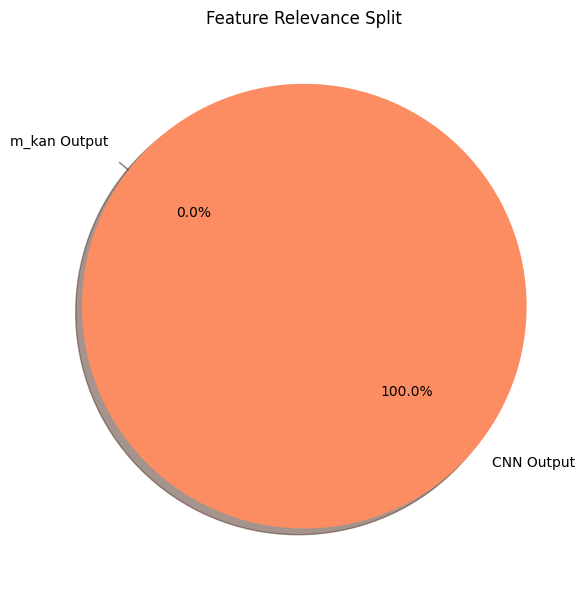

In [74]:
plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=2)

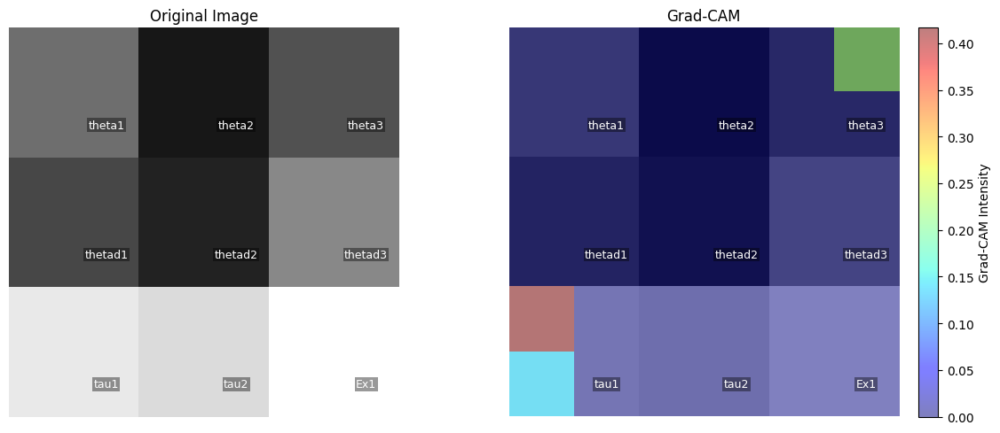

In [75]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [08:03<00:00,  3.39it/s] 


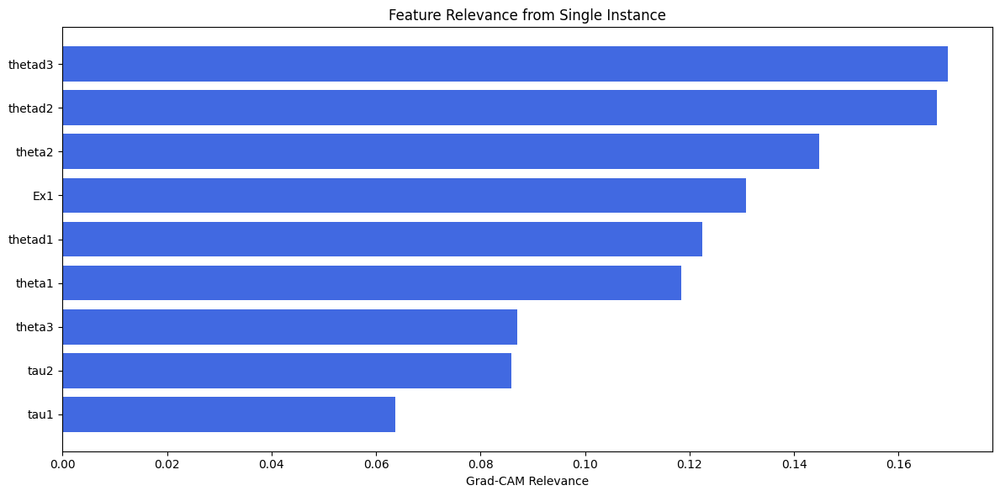

In [76]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

# Bonus Hybrid

In [49]:
class Model5(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, device=device):
        super(Model5, self).__init__()
        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 8, 8]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)

        self.final_kan = KAN(
            width=[self.flat_size, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        self.device = device


    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        cnn_input = cnn_input.to(self.device)
        
        return self.cnn_branch(cnn_input)  # Process image input

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [59]:
def fit_hybrid_dataloaders2(model, 
                           dataset,
                           opt="AdamW", 
                           steps=100, 
                           log=1, 
                           lamb=0., 
                           lamb_l1=1., 
                           lamb_entropy=2., 
                           lamb_coef=0., 
                           lamb_coefdiff=0., 
                           update_grid=True, 
                           grid_update_num=10, 
                           loss_fn=None, 
                           lr=1., 
                           start_grid_update_step=-1, 
                           stop_grid_update_step=50, 
                           batch=-1,
                           metrics=None, 
                           save_fig=False, 
                           in_vars=None, 
                           out_vars=None, 
                           beta=3, 
                           save_fig_freq=1, 
                           img_folder='./video', 
                           singularity_avoiding=False, 
                           y_th=1000., 
                           reg_metric='edge_forward_spline_n', 
                           display_metrics=None,
                           sum_f_reg=True):
    """
    Trains the hybrid model (with a KAN branch and a CNN branch) using a steps-based loop
    adapted from KAN.fit(), with grid updates and regularization.
    
    Instead of a single dataset dict, this function accepts three DataLoaders:
        - train_loader: provides (mlp, img, target) for training
        - val_loader: provides (mlp, img, target) for evaluation during training
        - test_loader: provides (mlp, img, target) for validation

    Internally, the function combines each loader into a dataset dictionary.
    
    Returns:
        results: dictionary containing training loss, evaluation loss, regularization values,
                 and any additional metrics recorded during training.
    """
    #device = next(model.parameters()).device

    # Warn if regularization is requested but model's internal flag isn't enabled.
    if lamb > 0. and not getattr(model.final_kan, "save_act", False):
        print("setting lamb=0. If you want to set lamb > 0, set model.final_kan.save_act=True")
    
    # Disable symbolic processing for training if applicable (KAN internal logic)
    if hasattr(model.final_kan, "disable_symbolic_in_fit"):
        old_save_act, old_symbolic_enabled = model.final_kan.disable_symbolic_in_fit(lamb)
    else:
        old_save_act, old_symbolic_enabled = None, None

    pbar = tqdm(range(steps), desc='Training', ncols=100)

    # Default loss function (mean squared error) if not provided
    if loss_fn is None:
        loss_fn = lambda x, y: torch.mean((x - y) ** 2)

    # Determine grid update frequency
    grid_update_freq = int(stop_grid_update_step / grid_update_num) if grid_update_num > 0 else 1

    # Determine total number of training examples
    n_train = dataset["train_input"].shape[0]
    n_eval  = dataset["val_input"].shape[0]  # using val set for evaluation during training
    batch_size = n_train if batch == -1 or batch > n_train else batch

    # Set up optimizer: choose between Adam and LBFGS (removed tolerance_ys)
    if opt == "AdamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr)
    elif opt == "LBFGS":        
        optimizer = LBFGS(model.parameters(), lr=lr, history_size=10, 
                          line_search_fn="strong_wolfe", 
                          tolerance_grad=1e-32, 
                          tolerance_change=1e-32, 
                          tolerance_ys=1e-32)
    else:
        raise ValueError("Optimizer not recognized. Use 'Adam' or 'LBFGS'.")

    # Prepare results dictionary.
    results = {'train_loss': [], 'eval_loss': [], 'reg': []}

    
    if metrics is not None:
        for metric in metrics:
            results[metric.__name__] = []

    best_model_state = None
    best_epoch = -1
    best_loss = float('inf')

    for step in pbar:
        # Randomly sample indices for a mini-batch from the training set.
        train_indices = np.random.choice(n_train, batch_size, replace=False)
        # Use full evaluation set for evaluation; you can also sample if desired.
        eval_indices = np.arange(n_eval)
        cached_loss = {}
        # Closure for LBFGS
        def closure():
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            # Compute regularization term if enabled.
            if hasattr(model.final_kan, "save_act") and model.final_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.final_kan.node_attribute()
                reg_val_inner = model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val_inner = torch.tensor(0., device=device)
            loss_val_inner = train_loss + lamb * reg_val_inner
            loss_val_inner.backward()

            cached_loss['loss'] = loss_val_inner.detach()
            cached_loss['reg'] = reg_val_inner.detach()
            return loss_val_inner

        # Perform grid update if applicable.
        if (step % grid_update_freq == 0 and step < stop_grid_update_step 
            and update_grid and step >= start_grid_update_step):
            
            mlp_batch = dataset['train_input'][train_indices]
            cnn_batch = dataset['train_img'][train_indices]
            #cnn_output = model.cnn_branch(cnn_batch)  # Process image input
            concatenated = model.get_concat_output(mlp_batch, cnn_batch)
            #concatenated = torch.cat((mlp_batch, cnn_output), dim=1)
            model.final_kan.update_grid(concatenated)

        # Perform an optimizer step.
        if opt == "LBFGS":
            optimizer.step(closure)
            loss_val = cached_loss['loss']
            reg_val = cached_loss['reg']
        else:  # AdamW branch
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            if hasattr(model.final_kan, "save_act") and model.final_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.final_kan.node_attribute()
                reg_val = model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val = torch.tensor(0., device=device)
            loss_val = train_loss + lamb * reg_val
            loss_val.backward()
            optimizer.step()

        with torch.no_grad():
            mlp_eval = dataset["val_input"][eval_indices]
            img_eval = dataset["val_img"][eval_indices]
            target_eval = dataset["val_label"][eval_indices]
            eval_loss = loss_fn(model(mlp_eval, img_eval), target_eval)

        # Record results (using square-root of loss similar to KAN.fit)
        results['train_loss'].append(torch.sqrt(loss_val.detach()).item())
        results['eval_loss'].append(torch.sqrt(eval_loss.detach()).item())
        results['reg'].append(reg_val.detach().item())

        if metrics is not None:
            for metric in metrics:
                # Here, we assume each metric returns a tensor.
                results[metric.__name__].append(metric().item())

        if eval_loss < best_loss:
            best_epoch = step
            best_loss = eval_loss
            best_model_state = copy.deepcopy(model.state_dict())

        # Update progress bar.
        if display_metrics is None:
            pbar.set_description("| train_loss: %.2e | eval_loss: %.2e | reg: %.2e |" %
                                 (torch.sqrt(loss_val.detach()).item(),
                                  torch.sqrt(eval_loss.detach()).item(),
                                  reg_val.detach().item()))
        else:
            desc = ""
            data = []
            for metric in display_metrics:
                desc += f" {metric}: %.2e |"
                data.append(results[metric.__name__][-1])
            pbar.set_description(desc % tuple(data))

        # Optionally save a figure snapshot.
        if save_fig and step % save_fig_freq == 0:
            save_act_backup = getattr(model.final_kan, "save_act", False)
            model.final_kan.save_act = True
            model.plot(folder=img_folder, in_vars=in_vars, out_vars=out_vars, title=f"Step {step}", beta=beta)
            plt.savefig(os.path.join(img_folder, f"{step}.jpg"), bbox_inches='tight', dpi=200)
            plt.close()
            model.final_kan.save_act = save_act_backup

    # Restore original settings if applicable.
    if old_symbolic_enabled is not None:
        model.final_kan.symbolic_enabled = old_symbolic_enabled
    if hasattr(model.final_kan, "log_history"):
        model.final_kan.log_history('fit')
    print(f"Best epoch {best_epoch}")
    return best_model_state, results, best_epoch

In [78]:
del model
torch.cuda.empty_cache()
gc.collect()

215554

In [65]:
model = try_create_model(Model5, attributes, imgs_shape, kan_neurons=3, kan_grid=4)  # Attempt to create Model4

checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model5


In [66]:
best_model_state, metrics5, _ = fit_hybrid_dataloaders2(model, dataset, opt="LBFGS", steps=10, lamb=0.01)

| train_loss: 3.19e+00 | eval_loss: 3.10e+00 | reg: 5.06e+01 |: 100%|█| 10/10 [00:39<00:00,  3.91s/i

saving model version 0.1
Best epoch 9


3.2302682399749756


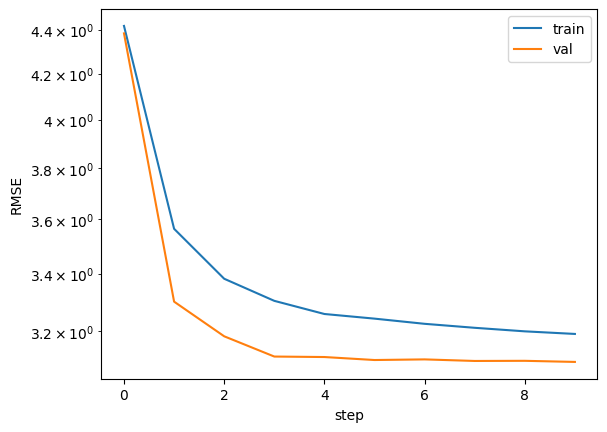

In [67]:
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics5['train_loss'], metrics5['eval_loss'])

C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by o

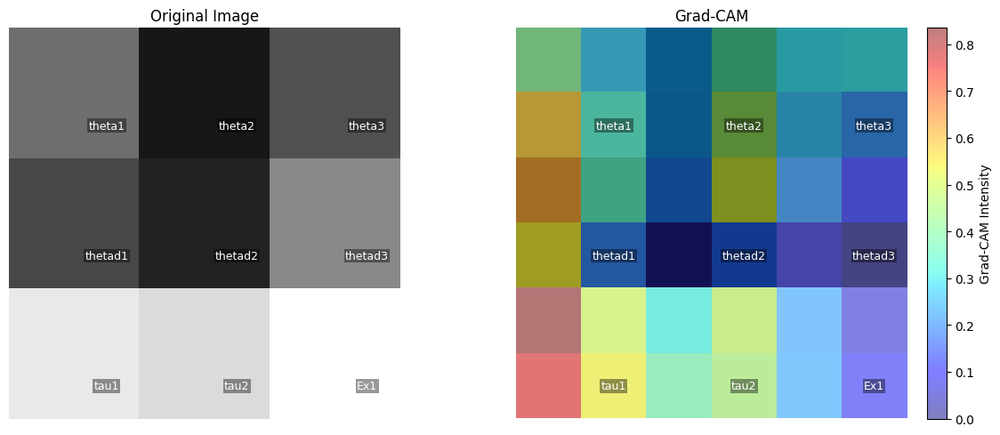

In [68]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM:   2%|▏         | 26/1639 [00:24<25:31,  1.05it/s]


KeyboardInterrupt: 

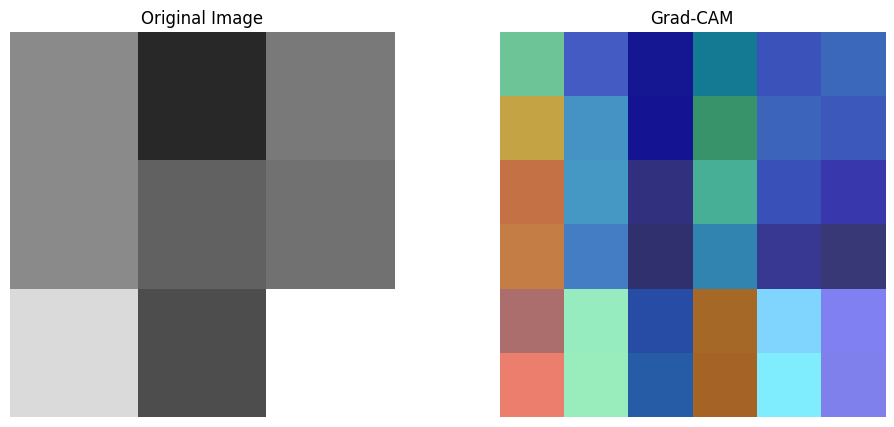

In [69]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)